<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Other%20Experiments/Data_Leakage_EURUSD_1D_Close.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from IPython.display import clear_output
import pandas as pd

try:
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator
except:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  %cd /content

/content


In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "EURUSD=X"
data_resample = '1D'
data_label = 'Close'
data_label_name = 'y'
start_date = '1 Jan 2009'
finish_date = '1 Jan 2019'
is_duka = False
is_yahoo = True
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

folds = 0 # should be 0, corss validation cause overfitting

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

best_models = {}
ensemble_model_threshold = 0.05
split_percentages = [0.2,0.1] # validation size, test size

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50
cv_rfe = 5

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe', 'Super_learner'] # True for all , ['All','Fwe','RFE','RFECV','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
algos_to_include = [None, 'GLM' ,'XGBoost' ,'DeepLearning'] # [None, 'DRF', 'GLM' ,'XGBoost' ,'GBM' ,'DeepLearning' ,'StackedEnsemble'], None for all
is_EDA = True
is_minmax = True # use minmax
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2009-01-01,1.3980,1.4054,1.3955,1.3999,1.3999,0
2009-01-02,1.4003,1.4023,1.3843,1.3923,1.3923,0
2009-01-05,1.3958,1.3958,1.3556,1.3646,1.3646,0
2009-01-06,1.3632,1.3632,1.3318,1.3510,1.3510,0
2009-01-07,1.3499,1.3742,1.3437,1.3611,1.3611,0
...,...,...,...,...,...,...
2018-12-26,1.1413,1.1419,1.1376,1.1416,1.1416,0
2018-12-27,1.1364,1.1434,1.1359,1.1361,1.1361,0
2018-12-28,1.1431,1.1473,1.1431,1.1431,1.1431,0


,Open,High,Low,Close,Adj Close,Volume
count,2605.000000,2605.000000,2605.000000,2605.000000,2605.000000,2605.0
mean,1.258565,1.263361,1.253492,1.258516,1.258516,0.0
std,0.118513,0.118918,0.118288,0.118428,0.118428,0.0
min,1.039400,1.042000,0.760600,1.039000,1.039000,0.0
25%,1.139700,1.143500,1.135900,1.139500,1.139500,0.0
50%,1.280900,1.287000,1.274700,1.281200,1.281200,0.0
75%,1.354800,1.359600,1.350000,1.354700,1.354700,0.0
max,1.512600,1.514500,1.504100,1.512800,1.512800,0.0


0

In [4]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,7
Number of observations,2605
Total Missing (%),0.0%
Total size in memory,142.6 KiB
Average record size in memory,56.0 B
Numeric,1
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,5


In [227]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import os

def fe(last_index = None):
  features_dataset = pd.read_pickle('full_dataset').sort_index()
  if last_index is not None:
    features_dataset = features_dataset[:-last_index]


  periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
  timeperiods = [8, 12, 14, 20, 24, 30]
  matypes = [0,1,2,3,4,5,6,8]
  nbdevs = [2, 3, 4, 5]

  # date features
  features_dataset['day'] = features_dataset.index.day
  features_dataset['dayofweek'] = features_dataset.index.dayofweek
  features_dataset['dayofyear'] = features_dataset.index.dayofyear
  features_dataset['days_in_month'] = features_dataset.index.days_in_month
  features_dataset['hour'] = features_dataset.index.hour
  features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
  features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
  features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
  features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
  features_dataset['minute'] = features_dataset.index.minute
  features_dataset['month'] = features_dataset.index.month
  features_dataset['quarter'] = features_dataset.index.quarter
  features_dataset['second'] = features_dataset.index.second
  features_dataset['week'] = features_dataset.index.week
  features_dataset['weekday'] = features_dataset.index.weekday
  features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
  features_dataset['weekofyear'] = features_dataset.index.weekofyear

  # Overlap Studies
  features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
  features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
  features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                      offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                      accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                      accelerationshort=-4e37, accelerationmaxshort=-4e37)

  for timeperiod in timeperiods:
      features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                            acceleration=timeperiod / 100,
                                                            maximum=timeperiod / 100)
      features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

      for matype in matypes:
          features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                            timeperiod=timeperiod, matype=matype)
          features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                                minperiod=2,
                                                                                maxperiod=timeperiod, matype=matype)
          features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                            timeperiod=timeperiod,
                                                                            vfactor=matype / 10)

          for nbdev in nbdevs:
              features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                  features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

              
  gc.collect()
  # Momentum Indicators
  features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                features_dataset['Close'])

  for timeperiod in timeperiods:
      features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
          features_dataset['High'],
          features_dataset['Low'],
          timeperiod=timeperiod)
      features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                    features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
          'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
      features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], features_dataset['Volume'],
                                                      timeperiod=timeperiod)
      features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                                features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                              features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                              timeperiod=timeperiod)
      features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                          features_dataset['Close'], timeperiod=timeperiod)

  features_dataset['ROC_shift' + str(1)] = ROC(features_dataset['Close'].shift(-1), timeperiod=timeperiod)

  gc.collect()
  features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
      features_dataset['Close'], fastperiod=12,
      slowperiod=26,
      signalperiod=9)
  features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
      features_dataset['Close'],
      fastperiod=12,
      fastmatype=0,
      slowperiod=26,
      slowmatype=0,
      signalperiod=9,
      signalmatype=0)

  features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                          features_dataset['Low'],
                                                                          features_dataset['Close'], fastk_period=5,
                                                                          slowk_period=3, slowk_matype=0,
                                                                          slowd_period=3, slowd_matype=0)
  features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                              features_dataset['Low'],
                                                                              features_dataset['Close'], fastk_period=5,
                                                                              fastd_period=3, fastd_matype=0)
  features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                    timeperiod=14,
                                                                                    fastk_period=5, fastd_period=3,
                                                                                    fastd_matype=0)
  features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                      timeperiod1=7, timeperiod2=14, timeperiod3=28)

  # Volume Indicators
  features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                              features_dataset['Volume'])
  features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    features_dataset['Volume'], fastperiod=3, slowperiod=10)
  features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

  gc.collect()
  # Volatility Indicators
  for timeperiod in timeperiods:
      features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)

  features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  # Price Transform
  features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
  features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
  features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
  features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  gc.collect()
  # Cycle Indicators
  features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
  features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
  features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
  features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
  features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

  # Pattern Recognition
  features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
  features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
  features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
  features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'], penetration=0)
  features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  gc.collect()

  # Statistic Functions
  for timeperiod in timeperiods:
      features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                        timeperiod=timeperiod)
      features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                            timeperiod=timeperiod)
      features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                      timeperiod=timeperiod)
      features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
      features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

      
  gc.collect()
  # Math Transform
  features_dataset['ACOS'] = ACOS(features_dataset['Close'])
  features_dataset['ASIN'] = ASIN(features_dataset['Close'])
  features_dataset['ATAN'] = ATAN(features_dataset['Close'])
  features_dataset['CEIL'] = CEIL(features_dataset['Close'])
  features_dataset['COS'] = COS(features_dataset['Close'])
  features_dataset['COSH'] = COSH(features_dataset['Close'])
  features_dataset['EXP'] = EXP(features_dataset['Close'])
  features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
  features_dataset['LN'] = LN(features_dataset['Close'])
  features_dataset['LOG10'] = LOG10(features_dataset['Close'])
  features_dataset['SIN'] = SIN(features_dataset['Close'])
  features_dataset['SINH'] = SINH(features_dataset['Close'])
  features_dataset['SQRT'] = SQRT(features_dataset['Close'])
  features_dataset['TAN'] = TAN(features_dataset['Close'])
  features_dataset['TANH'] = TANH(features_dataset['Close'])

  gc.collect()
  # Math Operator
  features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
  features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
  features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
  features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

  for timeperiod in timeperiods:
      features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
          features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
      
  gc.collect()


  features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
  features_dataset = pd.concat([features_dataset[50:-50].replace([np.inf, -np.inf], np.nan),
                                features_dataset[-50:].replace([np.inf, -np.inf, np.nan], 0)]).dropna(axis=1)

  features_dataset.to_pickle('features_dataset' if last_index is None else 'features_dataset_' + str(last_index))
  if last_index is None:
    display(features_dataset)
    display(features_dataset.describe())

  del periods, timeperiods, matypes, nbdevs, features_dataset
  gc.collect()

fe()

Open    High     Low   Close  Adj Close  day  dayofweek  dayofyear  days_in_month  is_month_end  is_month_start  is_quarter_end  is_quarter_start  month  quarter  week  weekday  weekday_name  weekofyear      mama      fama    SAREXT    DEMA_8     EMA_8    KAMA_8  MIDPOINT_8  MIDPRICE_8  SAR_0.08     SMA_8    TEMA_8   TRIMA_8     WMA_8    MA_8_0  MAVP_8_0    T3_8_0  BBANDS_upperband_8_0_2  BBANDS_middleband_8_0_2  BBANDS_lowerband_8_0_2  BBANDS_upperband_8_0_3  BBANDS_middleband_8_0_3  BBANDS_lowerband_8_0_3  BBANDS_upperband_8_0_4  BBANDS_middleband_8_0_4  BBANDS_lowerband_8_0_4  BBANDS_upperband_8_0_5  BBANDS_middleband_8_0_5  BBANDS_lowerband_8_0_5    MA_8_1  MAVP_8_1    T3_8_1  BBANDS_upperband_8_1_2  BBANDS_middleband_8_1_2  BBANDS_lowerband_8_1_2  BBANDS_upperband_8_1_3  BBANDS_middleband_8_1_3  BBANDS_lowerband_8_1_3  BBANDS_upperband_8_1_4  BBANDS_middleband_8_1_4  BBANDS_lowerband_8_1_4  BBANDS_upperband_8_1_5  BBANDS_middleband_8_1_5  BBANDS_lowerband_8_1_5  \
Date                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 
2009-03-12  1.2806  1.2942  1.2736  1.2899     1.2899   12          3         71             31             0               1               0                 1      3        1    11        3             0          11  1.265327  1.251267  1.247688  1.277964  1.273301  1.280127     1.27155     1.27055  1.252621  1.267512  1.284169  1.265785  1.272942  1.267512  1.280767  1.270181                1.291139                 1.267512                1.243886                1.302952                 1.267512                1.232073                1.314765                 1.267512                1.220260                1.326578                 1.267512                1.208447  1.273301  1.281785  1.268963                1.296927                 1.273301                1.249675                1.308740                 1.273301                1.237862                1.320553                 1.273301                1.226048                1.332366                 1.273301                1.214235   
2009-03-13  1.2900  1.2954  1.2871  1.2930     1.2930   13          4         72             31             0               1               0                 1      3        1    11        4             1          11  1.279164  1.258241  1.249548  1.284710  1.277678  1.282820     1.27385     1.27115  1.255947  1.272487  1.291379  1.270775  1.278606  1.272487  1.291450  1.270284                1.298594                 1.272487                1.246381                1.311648                 1.272487                1.233327                1.324701                 1.272487                1.220274                1.337755                 1.272487                1.207220  1.277678  1.290492  1.269386                1.303785                 1.277678                1.251571                1.316839                 1.277678                1.238518                1.329892                 1.277678                1.225464                1.342946                 1.277678                1.212411   
2009-03-16  1.2886  1.

Open         High          Low        Close    Adj Close          day    dayofweek    dayofyear  days_in_month  is_month_end  is_month_start  is_quarter_end  is_quarter_start        month      quarter         week      weekday  weekday_name   weekofyear         mama         fama       SAREXT       DEMA_8        EMA_8       KAMA_8   MIDPOINT_8   MIDPRICE_8     SAR_0.08        SMA_8       TEMA_8      TRIMA_8        WMA_8       MA_8_0     MAVP_8_0       T3_8_0  BBANDS_upperband_8_0_2  BBANDS_middleband_8_0_2  BBANDS_lowerband_8_0_2  BBANDS_upperband_8_0_3  BBANDS_middleband_8_0_3  BBANDS_lowerband_8_0_3  BBANDS_upperband_8_0_4  BBANDS_middleband_8_0_4  BBANDS_lowerband_8_0_4  BBANDS_upperband_8_0_5  BBANDS_middleband_8_0_5  BBANDS_lowerband_8_0_5       MA_8_1     MAVP_8_1       T3_8_1  BBANDS_upperband_8_1_2  BBANDS_middleband_8_1_2  BBANDS_lowerband_8_1_2  BBANDS_upperband_8_1_3  BBANDS_middleband_8_1_3  BBANDS_lowerband_8_1_3  BBANDS_upperband_8_1_4  \
count  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000    2555.000000   2555.000000     2555.000000     2555.000000       2555.000000  2555.000000  2555.000000  2555.000000  2555.000000   2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000  2555.000000             2555.000000              2555.000000             2555.000000             2555.000000              2555.000000             2555.000000             2555.000000              2555.000000             2555.000000             2555.000000              2555.000000             2555.000000  2555.000000  2555.000000  2555.000000             2555.000000              2555.000000             2555.000000             2555.000000              2555.000000             2555.000000             2555.000000   
mean      1.257738     1.262444     1.252787     1.257722     1.257722    15.765949     2.000783   185.797652      30.467319      0.033268        0.966732        0.010959          0.989041     6.611350     2.535812    26.990215     2.000783      1.998826    26.990215     1.257927     1.258339    -0.033930     1.257720     1.257895     1.258224     1.257894     1.257138     1.256004     1.257893     1.257726     1.257894     1.257837     1.257893     1.257745     1.258251                1.272786                 1.257893                1.242999                1.280233                 1.257893                1.235552                1.287680                 1.257893                1.228106                1.295127                 1.257893                1.220659     1.257895     1.257758     1.258195                1.272788                 1.257895                1.243001                1.280235                 1.257895                1.235554                1.287682   
std       0.119397     0.119783     0.119233     0.119342     0.119342     8.804321     1.415320   104.383262       0.781546      0.179371        0.179371        0.104130          0.104130     3.413495     1.107650    14.927084     1.415320      1.414351    14.927084     0.119297     0.118481     1.261276     0.119463     0.118822     0.119106     0.118781     0.119157     0.121340     0.118967     0.119409     0.119031     0.119039     0.118967     0.119271     0.118274                0.120986                 0.118967                0.117464                0.122182                 0.118967                0.116912                0.123497                 0.118967                0.116497                0.124928                 0.118967                0.116220     0.118822     0.119215     0.118377                0.120835                 0.118822                0.117325                0.122028                 0.118822                0.116778                0.123341   
min       1.039400     1.042000     0.760600     1.039000     1.039000     1.000000     0.0000

In [228]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [229]:
# check features data leakage
fe(100)
long_df = pd.read_pickle('features_dataset')[:-100]
short_df =  pd.read_pickle('features_dataset_100')
if False in (long_df.index.values == short_df.index.values):
  print('mismatch INDEX', long_df.index.values == short_df.index.values)

for aCol in long_df.columns.values:
  try:
    if False in (long_df[aCol].values == short_df[aCol].values):
      print('mismatch, ', aCol, long_df[aCol].values == short_df[aCol].values)
  except:
    print('mismatch exception, ', aCol)

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del talib, long_df, short_df
gc.collect()
print('Nothing should be printed above')

mismatch,  ROC_shift1 [ True  True  True ...  True  True False]
Nothing should be printed above


In [230]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]]
longs = label_df[data_label].values[1:] > label_df[data_label].values[:-1] 
shorts = label_df[data_label].values[1:] <= label_df[data_label].values[:-1] 
label_df = label_df[:-1]
label_df[data_label_name] = (longs*1 + shorts*0).astype(int)
scaled_df = features_dataset
scaled_df = pd.DataFrame((minmax_scale(scaled_df, axis=0, feature_range=(0, 1)) if is_minmax else scaled_df), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale, shorts, longs
gc.collect()

Open      High       Low     Close  Adj Close  day  dayofweek  dayofyear  days_in_month  is_month_end  is_month_start  is_quarter_end  is_quarter_start  month  quarter  week  weekday  weekday_name  weekofyear      mama      fama    SAREXT    DEMA_8     EMA_8    KAMA_8  MIDPOINT_8  MIDPRICE_8  SAR_0.08     SMA_8    TEMA_8   TRIMA_8     WMA_8    MA_8_0  MAVP_8_0    T3_8_0  BBANDS_upperband_8_0_2  BBANDS_middleband_8_0_2  BBANDS_lowerband_8_0_2  BBANDS_upperband_8_0_3  BBANDS_middleband_8_0_3  BBANDS_lowerband_8_0_3  BBANDS_upperband_8_0_4  BBANDS_middleband_8_0_4  BBANDS_lowerband_8_0_4  BBANDS_upperband_8_0_5  BBANDS_middleband_8_0_5  BBANDS_lowerband_8_0_5    MA_8_1  MAVP_8_1    T3_8_1  BBANDS_upperband_8_1_2  BBANDS_middleband_8_1_2  BBANDS_lowerband_8_1_2  BBANDS_upperband_8_1_3  BBANDS_middleband_8_1_3  BBANDS_lowerband_8_1_3  BBANDS_upperband_8_1_4  BBANDS_middleband_8_1_4  BBANDS_lowerband_8_1_4  BBANDS_upperband_8_1_5  BBANDS_middleband_8_1_5  \
Date                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 
2009-03-12  0.509721  0.533757  0.689980  0.529548   0.529548   12          3         71             31             0               1               0                 1      3        1    11        3             0          11  0.483748  0.448959  0.921018  0.508821  0.497783  0.516616    0.495675    0.503100  0.652634  0.486917  0.523864  0.484068  0.497327  0.486917  0.513593  0.493410                0.512923                 0.486917                0.462161                0.519130                 0.486917                0.458304                0.525021                 0.486917                0.461862                0.526243                 0.486917                0.465209  0.497783  0.516292  0.490569                0.528930                 0.497783                0.476602                0.534943                 0.497783                0.474082                0.540366                 0.497783                0.477144                0.543486                 0.497783   
2009-03-13  0.529586  0.536296  0.708137  0.536091   0.536091   13          4         72             31             0               1               0                 1      3        1    11        4             1          11  0.513957  0.464683  0.921639  0.523254  0.507335  0.522661    0.500649    0.504406  0.657046  0.497709  0.539195  0.494884  0.509588  0.497709  0.536461  0.493641                0.528625                 0.497709                0.467544                0.536967                 0.497709                0.460962                0.544884                 0.497709                0.461889                0.547852                 0.497709                0.462762  0.507335  0.534997  0.491509                0.543625                 0.507335                0.480690                0.551850                 0.507335                0.475467                0.559366                 0.507335                0.475949                0.564396                 0.507335   
2009-03-16  0.526627  0.560212  0.708272  0.545800   0.545800   16          0         75

0

In [231]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*(1-(split_percentages[0]+split_percentages[1]))),int(len(train_hf)*(1-split_percentages[1]))]
  gc.collect()


try:
  load_h2o()
except:
  pass

H2O session _sid_b6ef closed.
Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.5" 2019-10-15; OpenJDK Runtime Environment (build 11.0.5+10-post-Ubuntu-0ubuntu1.118.04); OpenJDK 64-Bit Server VM (build 11.0.5+10-post-Ubuntu-0ubuntu1.118.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpnpk9wa84
  JVM stdout: /tmp/tmpnpk9wa84/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpnpk9wa84/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,01 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,6 months and 1 day !!!
H2O cluster name:,H2O_from_python_unknownUser_pb0tle
H2O cluster total nodes:,1
H2O cluster free memory:,9 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline
from h2o.exceptions import H2OJobCancelled
from sklearn.metrics import accuracy_score

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num,best_models
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  nfolds = nfolds or folds
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo, keep_cross_validation_predictions=True)
      t_hf = (training_frame or train_hf)
      validation_frame =  t_hf[index_splits[0]:index_splits[1],:] if split_percentages[0] != 0 else None

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=validation_frame, leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except (KeyboardInterrupt, H2OJobCancelled):
      raise Exception('Stopped')
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    best_models[str(feature_name) + '_' + str(model_algo)] = {'id':aml.leader.model_id ,'AUC':getattr(model_performance, "auc")(),
                                                              'path': h2o.save_model(aml.leader,force=True)}
    predicted = aml.leader.predict(t_hf).as_data_frame()

    # predicted['predict'] = (predicted['p1'] >= aml.leader.find_threshold_by_max_metric('f1', train=False, valid=True, xval=False)).astype(int)
    predicted.to_csv(str(feature_name) + '_' + str(model_algo) + '.csv', )
    predicted = predicted[['predict']]
    print(predicted)
    start_idx = max(-index_splits[1],-20)
    predicted = predicted[start_idx:]
    predict_df = pd.read_pickle('predict_df')[start_idx:]

    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper left')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191220_173531_model_9,0.815263,0.550239,0.264652,0.431312,0.186030
1,DeepLearning_grid_1_AutoML_20191220_173531_model_1,0.811783,1.894923,0.264164,0.523716,0.274279
2,DeepLearning_grid_1_AutoML_20191220_173531_model_3,0.811477,0.543053,0.261172,0.425003,0.180627
3,DeepLearning_grid_1_AutoML_20191220_173531_model_4,0.809585,0.708549,0.340904,0.484506,0.234746
4,DeepLearning_grid_1_AutoML_20191220_173531_model_8,0.808913,0.544837,0.243101,0.430506,0.185336
5,DeepLearning_grid_1_AutoML_20191220_173531_model_6,0.804090,0.532533,0.263675,0.425740,0.181254
6,DeepLearning_grid_1_AutoML_20191220_173531_model_5,0.802656,0.556275,0.251282,0.434850,0.189095
7,DeepLearning_grid_1_AutoML_20191220_173531_model_2,0.787363,0.545243,0.320696,0.431980,0.186607
8,DeepLearning_grid_1_AutoML_20191220_173531_model_7,0.732601,0.599269,0.366606,0.457613,0.209410
9,DeepLearning_1_AutoML_20191220_173531,0.732357,0.620183,0.355678,0.463063,0.214427


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,1.000000,1.000000,0.008200
1,CDLGRAVESTONEDOJI,0.890232,0.890232,0.007300
2,CDLDRAGONFLYDOJI,0.746091,0.746091,0.006118
3,CDLTAKURI,0.728075,0.728075,0.005970
4,CDLINVERTEDHAMMER,0.508517,0.508517,0.004170
...,...,...,...,...
934,BBANDS_middleband_14_0_4,0.091445,0.091445,0.000750
935,BBANDS_middleband_14_0_2,0.090956,0.090956,0.000746
936,CDLCOUNTERATTACK,0.083573,0.083573,0.000685
937,CDLXSIDEGAP3METHODS,0.076956,0.076956,0.000631


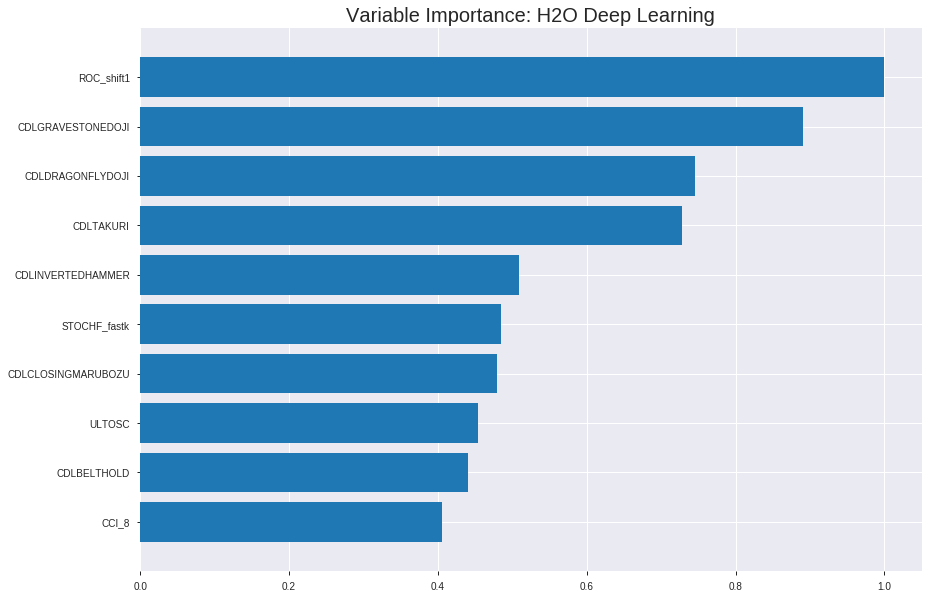

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191220_173531_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.16056015346916344
RMSE: 0.40069958007110945
LogLoss: 0.48834254943583905
Mean Per-Class Error: 0.2189998947811448
AUC: 0.867215057319224
pr_auc: 0.8646647930912713
Gini: 0.734430114638448
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49892665197798924: 


,0,1,Error,Rate
0,619.0,272.0,0.3053,(272.0/891.0)
1,120.0,776.0,0.1339,(120.0/896.0)
Total,739.0,1048.0,0.2194,(392.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4989267,0.7983539,213.0
max f2,0.3883470,0.8786653,267.0
max f0point5,0.5610697,0.7953199,168.0
max accuracy,0.5027273,0.7811975,210.0
max precision,0.9983271,1.0,0.0
max recall,0.0000005,1.0,399.0
max specificity,0.9983271,1.0,0.0
max absolute_mcc,0.4989267,0.5693709,213.0
max min_per_class_accuracy,0.5193084,0.7745536,198.0
max mean_per_class_accuracy,0.5027273,0.7810001,210.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9861642,1.9944196,1.9944196,1.0,0.9924678,1.0,0.9924678,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9796708,1.9944196,1.9944196,1.0,0.9834105,1.0,0.9879391,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9690313,1.9944196,1.9944196,1.0,0.9743243,1.0,0.9834009,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9548750,1.9944196,1.9944196,1.0,0.9619466,1.0,0.9780373,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9443553,1.9944196,1.9944196,1.0,0.9500488,1.0,0.9724396,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8915020,1.8375552,1.9164256,0.9213483,0.9189685,0.9608939,0.9458534,0.0915179,0.1919643,83.7555177,91.6425579
,7,0.1499720,0.7901760,1.8375552,1.8902335,0.9213483,0.8471229,0.9477612,0.9130660,0.0915179,0.2834821,83.7555177,89.0233542
,8,0.2003358,0.7042397,1.7949777,1.8662865,0.9,0.7468734,0.9357542,0.8712858,0.0904018,0.3738839,79.4977679,86.6286537
,9,0.2999440,0.5927639,1.6022585,1.7786056,0.8033708,0.6433261,0.8917910,0.7955827,0.1595982,0.5334821,60.2258477,77.8605577
,10,0.4001119,0.5394972,1.2479050,1.6457449,0.6256983,0.5603981,0.8251748,0.7367043,0.125,0.6584821,24.7905028,64.5744880




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.18914032945640194
RMSE: 0.43490266664669
LogLoss: 0.5592865837387943
Mean Per-Class Error: 0.2592422150636601
AUC: 0.8191823899371069
pr_auc: 0.8041213161905665
Gini: 0.6383647798742138
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46387961697126057: 


,0,1,Error,Rate
0,157.0,108.0,0.4075,(108.0/265.0)
1,28.0,218.0,0.1138,(28.0/246.0)
Total,185.0,326.0,0.2661,(136.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4638796,0.7622378,242.0
max f2,0.4033397,0.8472727,292.0
max f0point5,0.5332257,0.7515337,149.0
max accuracy,0.5232414,0.7397260,168.0
max precision,0.9137745,1.0,0.0
max recall,0.0722628,1.0,387.0
max specificity,0.9137745,1.0,0.0
max absolute_mcc,0.4638796,0.4976194,242.0
max min_per_class_accuracy,0.5107147,0.7169811,188.0
max mean_per_class_accuracy,0.4828851,0.7407578,217.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 47.45 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8507124,2.0772358,2.0772358,1.0,0.8756083,1.0,0.8756083,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8285241,2.0772358,2.0772358,1.0,0.8396641,1.0,0.8592700,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.7957245,2.0772358,2.0772358,1.0,0.8103117,1.0,0.8439706,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.7703627,1.6617886,1.9783198,0.8,0.7852449,0.9523810,0.8299883,0.0162602,0.0813008,66.1788618,97.8319783
,5,0.0508806,0.7585674,2.0772358,1.9973421,1.0,0.7643472,0.9615385,0.8173650,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.7012184,1.8375547,1.9174484,0.8846154,0.7228837,0.9230769,0.7701243,0.0934959,0.1951220,83.7554722,91.7448405
,7,0.1506849,0.6243976,1.9110569,1.9153732,0.92,0.6677749,0.9220779,0.7368940,0.0934959,0.2886179,91.1056911,91.5373245
,8,0.2015656,0.5809228,1.5179800,1.8150604,0.7307692,0.6055283,0.8737864,0.7037337,0.0772358,0.3658537,51.7979987,81.5060384
,9,0.3013699,0.5454029,1.5070142,1.7130451,0.7254902,0.5617614,0.8246753,0.6567169,0.1504065,0.5162602,50.7014188,71.3045085
,10,0.4011742,0.5266723,1.2626335,1.6009915,0.6078431,0.5352003,0.7707317,0.6264859,0.1260163,0.6422764,26.2633509,60.0991473



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 17:54:10,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-20 17:54:13,6 min 49.686 sec,514 obs/sec,0.9714605,1,1736.0,0.6328099,1.6009989,-0.6018060,0.5309876,0.4874537,1.8836186,0.4902071,0.7193831,3.7025459,-1.0729142,0.5465946,0.5438967,1.7310298,0.4970646
,2019-12-20 17:54:36,7 min 13.254 sec,636 obs/sec,8.6782317,9,15508.0,0.4821380,0.6562843,0.0701644,0.6787067,0.6691836,1.8836186,0.3917180,0.5096475,0.7125780,-0.0404007,0.7125096,0.7068389,2.0772358,0.3659491
,2019-12-20 17:55:02,7 min 38.780 sec,648 obs/sec,17.3508674,18,31006.0,0.4525318,0.5914222,0.1808535,0.7728832,0.7725693,1.8836186,0.3139340,0.4985968,0.6858135,0.0042284,0.7908268,0.7764671,2.0772358,0.3111546
,2019-12-20 17:55:25,8 min 1.882 sec,675 obs/sec,26.0167879,27,46492.0,0.4404959,0.5703239,0.2238473,0.7983606,0.7943720,1.9944196,0.2909905,0.4746872,0.6358329,0.0974406,0.8090351,0.7957794,2.0772358,0.2602740
,2019-12-20 17:55:48,8 min 24.421 sec,694 obs/sec,34.6731953,36,61961.0,0.4283667,0.5451408,0.2660023,0.8282722,0.8230062,1.9944196,0.2764410,0.4625449,0.6140465,0.1430240,0.8161835,0.7996115,2.0772358,0.2720157
,2019-12-20 17:56:10,8 min 46.804 sec,706 obs/sec,43.3256855,45,77423.0,0.4231177,0.5384430,0.2838802,0.8368225,0.8360810,1.9944196,0.2747622,0.4456066,0.5808497,0.2046394,0.8148489,0.7982928,2.0772358,0.2876712
,2019-12-20 17:56:32,9 min 8.876 sec,717 obs/sec,52.0100727,54,92942.0,0.4081625,0.5093728,0.3336081,0.8410450,0.8434991,1.9944196,0.2574147,0.4469476,0.5824872,0.1998450,0.8096641,0.7980045,2.0772358,0.2798434
,2019-12-20 17:56:54,9 min 30.939 sec,725 obs/sec,60.6681589,63,108414.0,0.4119164,0.5166590,0.3212942,0.8520379,0.8482432,1.9944196,0.2451035,0.4461223,0.5808031,0.2027976,0.8147415,0.8020291,2.0772358,0.2896282
,2019-12-20 17:57:18,9 min 54.439 sec,735 obs/sec,70.2960269,73,125619.0,0.4039250,0.4972780,0.3473732,0.8584024,0.8543494,1.9944196,0.2467823,0.4422805,0.5735833,0.2164687,0.8174567,0.8013736,2.0772358,0.2876712


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
ROC_shift1,1.0,1.0,0.0081996
CDLGRAVESTONEDOJI,0.8902321,0.8902321,0.0072995
CDLDRAGONFLYDOJI,0.7460907,0.7460907,0.0061176
CDLTAKURI,0.7280750,0.7280750,0.0059699
CDLINVERTEDHAMMER,0.5085169,0.5085169,0.0041696
---,---,---,---
BBANDS_middleband_14_0_4,0.0914451,0.0914451,0.0007498
BBANDS_middleband_14_0_2,0.0909560,0.0909560,0.0007458
CDLCOUNTERATTACK,0.0835731,0.0835731,0.0006853
CDLXSIDEGAP3METHODS,0.0769556,0.0769556,0.0006310



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.74609375)

('F1', 0.7817589576547231)

('auc', 0.8152625152625153)

('logloss', 0.5502387240843829)

('mean_per_class_error', 0.2554945054945055)

('rmse', 0.4313121714057368)

('mse', 0.18603018920273168)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


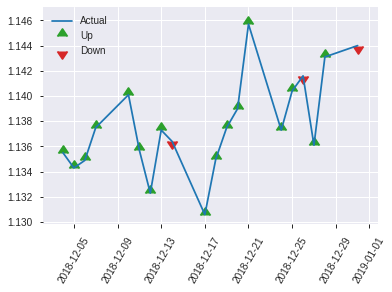


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.18603018920273168
RMSE: 0.4313121714057368
LogLoss: 0.5502387240843829
Mean Per-Class Error: 0.2554945054945055
AUC: 0.8152625152625153
pr_auc: 0.8138211053824579
Gini: 0.6305250305250305
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43139327017214224: 


,0,1,Error,Rate
0,69.0,57.0,0.4524,(57.0/126.0)
1,10.0,120.0,0.0769,(10.0/130.0)
Total,79.0,177.0,0.2617,(67.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4313933,0.7817590,176.0
max f2,0.3780252,0.8839779,203.0
max f0point5,0.5047186,0.7377049,119.0
max accuracy,0.4553053,0.7460938,154.0
max precision,0.9638240,1.0,0.0
max recall,0.0647077,1.0,253.0
max specificity,0.9638240,1.0,0.0
max absolute_mcc,0.4313933,0.5094449,176.0
max min_per_class_accuracy,0.4957216,0.7153846,126.0
max mean_per_class_accuracy,0.4553053,0.7445055,154.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9019660,1.9692308,1.9692308,1.0,0.9307004,1.0,0.9307004,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.8854576,1.9692308,1.9692308,1.0,0.8901939,1.0,0.9104471,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8554326,1.9692308,1.9692308,1.0,0.8712075,1.0,0.9006372,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8350254,1.9692308,1.9692308,1.0,0.8449209,1.0,0.8854419,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.7857711,1.9692308,1.9692308,1.0,0.8131854,1.0,0.8743255,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.6986206,1.9692308,1.9692308,1.0,0.7397261,1.0,0.8070258,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.6171601,1.6662722,1.8682446,0.8461538,0.6568451,0.9487179,0.7569655,0.0846154,0.2846154,66.6272189,86.8244576
,8,0.203125,0.5620987,1.5147929,1.7798817,0.7692308,0.5796077,0.9038462,0.7126261,0.0769231,0.3615385,51.4792899,77.9881657
,9,0.3007812,0.5342888,1.024,1.5344655,0.52,0.5445814,0.7792208,0.6580661,0.1,0.4615385,2.4000000,53.4465534
,10,0.4023438,0.5180041,1.3633136,1.4912621,0.6923077,0.5255615,0.7572816,0.6246183,0.1384615,0.6,36.3313609,49.1262136


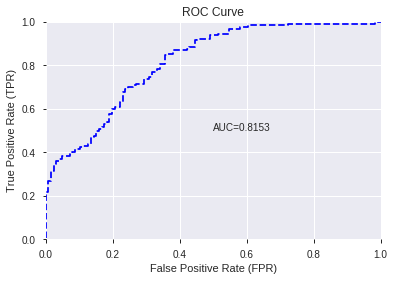

This function is available for GLM models only


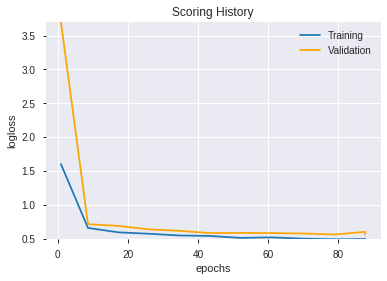

--2019-12-20 17:58:13--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.85.155
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.85.155|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


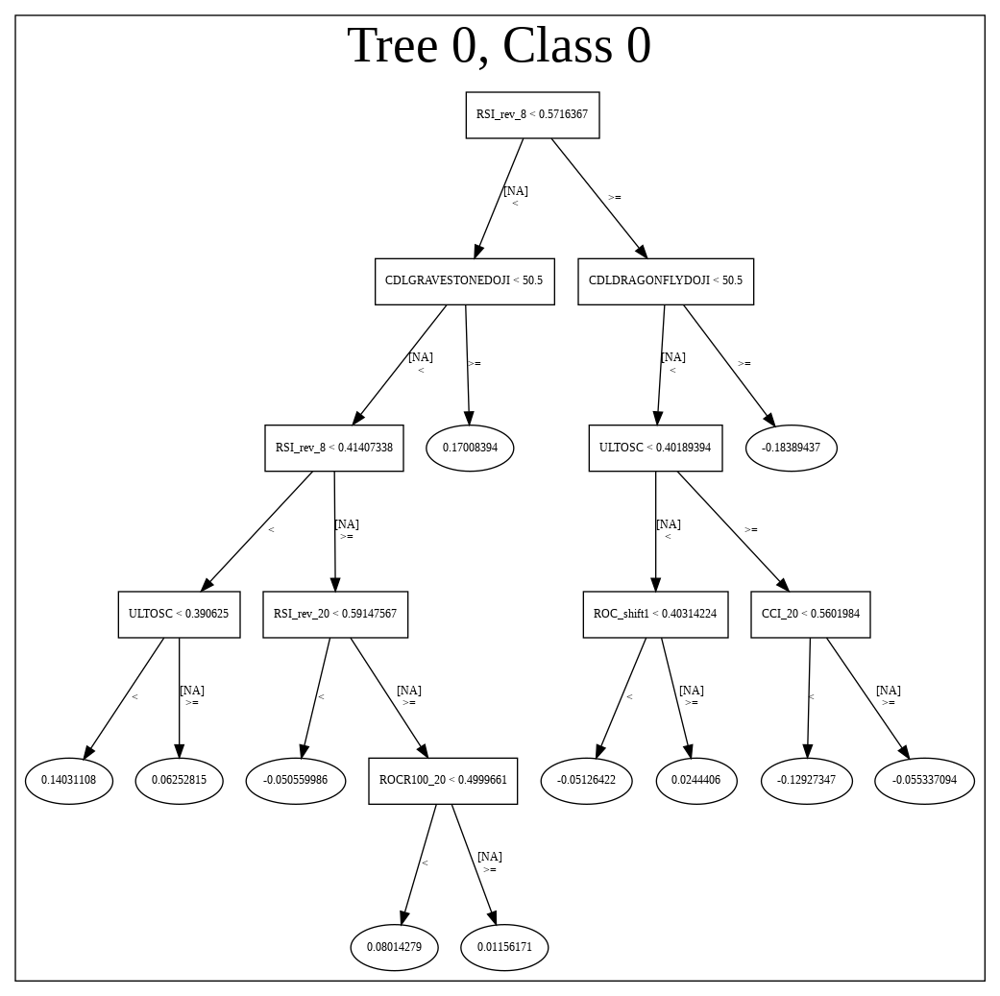

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191220_173531_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191220_173531_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_316_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'auto

939

['ROC_shift1',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CDLINVERTEDHAMMER',
 'STOCHF_fastk',
 'CDLCLOSINGMARUBOZU',
 'ULTOSC',
 'CDLBELTHOLD',
 'CCI_8',
 'CDLRICKSHAWMAN',
 'CDLHANGINGMAN',
 'CDLSHOOTINGSTAR',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'SUB',
 'days_in_month',
 'MINUS_DM_8',
 'DIV',
 'is_month_end',
 'CDLHAMMER',
 'TRANGE',
 'CDLHIKKAKE',
 'CCI_12',
 'PLUS_DM_8',
 'aroonup_8',
 'CCI_14',
 'is_month_start',
 'is_quarter_end',
 'CORREL_8',
 'weekday_name',
 'PLUS_DI_14',
 'CDLDOJI',
 'CDLLONGLEGGEDDOJI',
 'CDLMATCHINGLOW',
 'WILLR_8',
 'PLUS_DI_12',
 'MINUS_DM_12',
 'CCI_30',
 'PLUS_DM_12',
 'CCI_20',
 'MINUS_DI_12',
 'aroonup_12',
 'SAREXT',
 'CDLSPINNINGTOP',
 'HT_DCPERIOD',
 'CORREL_20',
 'aroonup_24',
 'CDLHIGHWAVE',
 'ATR_30']

In [233]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191220_175821_model_8,0.812271,0.500070,0.297009,0.413597,0.171062
1,DeepLearning_grid_1_AutoML_20191220_175821_model_7,0.810379,0.586273,0.300488,0.430429,0.185269
2,DeepLearning_grid_1_AutoML_20191220_175821_model_6,0.809463,0.508648,0.288217,0.416928,0.173829
3,DeepLearning_grid_1_AutoML_20191220_175821_model_9,0.801770,0.523099,0.300488,0.424338,0.180063
4,DeepLearning_grid_1_AutoML_20191220_175821_model_5,0.795482,0.530938,0.287241,0.427197,0.182498
5,DeepLearning_1_AutoML_20191220_175821,0.776007,0.556721,0.340659,0.437322,0.191251
6,DeepLearning_grid_1_AutoML_20191220_175821_model_1,0.774786,0.630969,0.332479,0.455453,0.207437
7,DeepLearning_grid_1_AutoML_20191220_175821_model_4,0.772955,0.668965,0.323810,0.470572,0.221438
8,DeepLearning_grid_1_AutoML_20191220_175821_model_3,0.770574,0.563719,0.282662,0.441890,0.195266
9,DeepLearning_grid_1_AutoML_20191220_175821_model_2,0.753297,0.597896,0.332601,0.451190,0.203572


,variable,relative_importance,scaled_importance,percentage
0,CDLRICKSHAWMAN,1.000000,1.000000,0.037775
1,STOCHF_fastk,0.849311,0.849311,0.032082
2,CDLLONGLEGGEDDOJI,0.800153,0.800153,0.030226
3,SUB,0.793217,0.793217,0.029964
4,CDLDOJI,0.778101,0.778101,0.029393
5,DIV,0.763487,0.763487,0.028840
6,ROC_shift1,0.745263,0.745263,0.028152
7,WILLR_8,0.723355,0.723355,0.027325
8,CCI_8,0.711023,0.711023,0.026859
9,TRANGE,0.613774,0.613774,0.023185


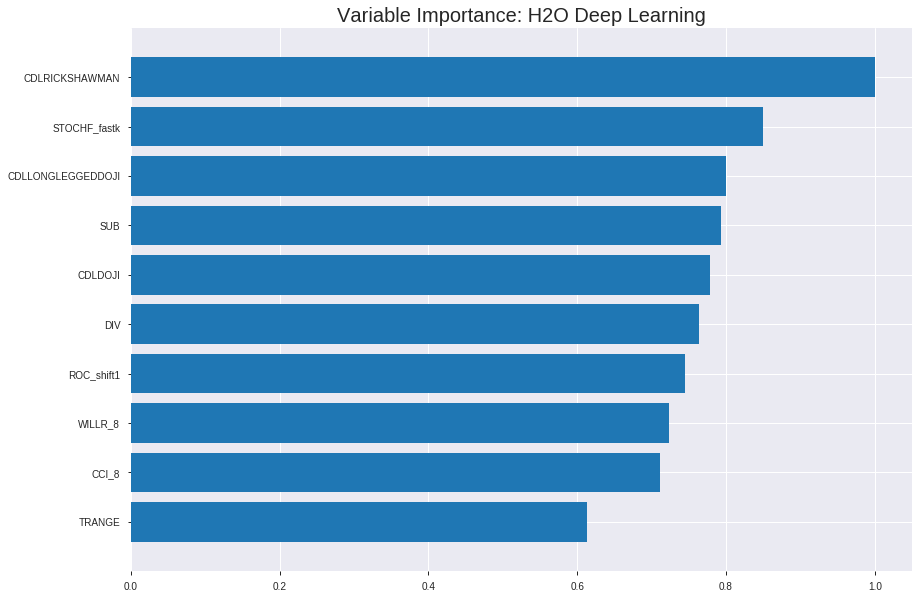

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191220_175821_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1595301762693342
RMSE: 0.3994122885807774
LogLoss: 0.47278358074570864
Mean Per-Class Error: 0.25072337962962965
AUC: 0.8476211770482603
pr_auc: 0.8528491772002252
Gini: 0.6952423540965207
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38542841050353543: 


,0,1,Error,Rate
0,425.0,466.0,0.523,(466.0/891.0)
1,32.0,864.0,0.0357,(32.0/896.0)
Total,457.0,1330.0,0.2787,(498.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3854284,0.7762803,270.0
max f2,0.3328057,0.8818787,288.0
max f0point5,0.5449434,0.7676282,161.0
max accuracy,0.4899213,0.7493005,202.0
max precision,0.9967478,1.0,0.0
max recall,0.0055203,1.0,394.0
max specificity,0.9967478,1.0,0.0
max absolute_mcc,0.3854284,0.5057327,270.0
max min_per_class_accuracy,0.4915312,0.7444196,201.0
max mean_per_class_accuracy,0.4899213,0.7492766,202.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 48.29 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9896925,1.9944196,1.9944196,1.0,0.9931137,1.0,0.9931137,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9817124,1.9944196,1.9944196,1.0,0.9856438,1.0,0.9893787,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9776628,1.9944196,1.9944196,1.0,0.9800396,1.0,0.9862657,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9736903,1.9944196,1.9944196,1.0,0.9757069,1.0,0.9836260,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9680224,1.9944196,1.9944196,1.0,0.9711511,1.0,0.9811310,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9197899,1.9720104,1.9832776,0.9887640,0.9457504,0.9944134,0.9635395,0.0982143,0.1986607,97.2010433,98.3277634
,7,0.1499720,0.8287949,1.8599644,1.9423266,0.9325843,0.8795592,0.9738806,0.9356505,0.0926339,0.2912946,85.9964386,94.2326592
,8,0.2003358,0.6960212,1.7063368,1.8829996,0.8555556,0.7636108,0.9441341,0.8924003,0.0859375,0.3772321,70.6336806,88.2999551
,9,0.2999440,0.5483356,1.4005756,1.7227916,0.7022472,0.6035530,0.8638060,0.7964771,0.1395089,0.5167411,40.0575592,72.2791594
,10,0.4001119,0.5156503,1.1587690,1.5815887,0.5810056,0.5304544,0.7930070,0.7298784,0.1160714,0.6328125,15.8768955,58.1588724




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.168303727588366
RMSE: 0.41024837304779893
LogLoss: 0.5201059253398137
Mean Per-Class Error: 0.23500536892161383
AUC: 0.8333256634453138
pr_auc: 0.8054713778084354
Gini: 0.6666513268906276
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46241612526255155: 


,0,1,Error,Rate
0,190.0,75.0,0.283,(75.0/265.0)
1,46.0,200.0,0.187,(46.0/246.0)
Total,236.0,275.0,0.2368,(121.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4624161,0.7677543,220.0
max f2,0.2404874,0.8533043,310.0
max f0point5,0.5888094,0.7653061,135.0
max accuracy,0.4624161,0.7632094,220.0
max precision,0.9939160,1.0,0.0
max recall,0.0049402,1.0,394.0
max specificity,0.9939160,1.0,0.0
max absolute_mcc,0.4624161,0.5311720,220.0
max min_per_class_accuracy,0.4782715,0.7479675,208.0
max mean_per_class_accuracy,0.4624161,0.7649946,220.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 47.82 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9874206,1.7310298,1.7310298,0.8333333,0.9906651,0.8333333,0.9906651,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9768359,2.0772358,1.8883962,1.0,0.9810587,0.9090909,0.9862986,0.0203252,0.0406504,107.7235772,88.8396157
,3,0.0313112,0.9725019,1.6617886,1.8175813,0.8,0.9743639,0.875,0.9825690,0.0162602,0.0569106,66.1788618,81.7581301
,4,0.0410959,0.9667823,1.2463415,1.6815718,0.6,0.9700214,0.8095238,0.9795815,0.0121951,0.0691057,24.6341463,68.1571816
,5,0.0508806,0.9523476,1.6617886,1.6777674,0.8,0.9598396,0.8076923,0.9757850,0.0162602,0.0853659,66.1788618,67.7767355
,6,0.1017613,0.9121247,2.0772358,1.8775016,1.0,0.9314381,0.9038462,0.9536115,0.1056911,0.1910569,107.7235772,87.7501563
,7,0.1506849,0.8597504,2.0772358,1.9423503,1.0,0.8881636,0.9350649,0.9323622,0.1016260,0.2926829,107.7235772,94.2350333
,8,0.2015656,0.7520473,1.7576610,1.8957297,0.8461538,0.8221202,0.9126214,0.9045341,0.0894309,0.3821138,75.7661038,89.5729734
,9,0.3013699,0.5962972,1.5070142,1.7669993,0.7254902,0.6768197,0.8506494,0.8291222,0.1504065,0.5325203,50.7014188,76.6999261
,10,0.4011742,0.5114706,1.2219034,1.6313900,0.5882353,0.5461390,0.7853659,0.7587215,0.1219512,0.6544715,22.1903396,63.1390046



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:03:03,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-20 18:03:05,1 min 7.088 sec,1659 obs/sec,2.3721321,1,4239.0,0.4466523,0.5787386,0.2020006,0.7513791,0.7518235,1.9944196,0.3480694,0.4431148,0.5748390,0.2135096,0.7696809,0.7562804,2.0772358,0.3522505
,2019-12-20 18:03:11,1 min 13.186 sec,2084 obs/sec,9.4258534,4,16844.0,0.4316957,0.5473198,0.2545496,0.7968105,0.8030673,1.9944196,0.3049804,0.4300943,0.5495398,0.2590512,0.8202485,0.7888827,1.3848238,0.2544031
,2019-12-20 18:03:18,1 min 20.195 sec,2316 obs/sec,18.8086178,8,33611.0,0.4198467,0.5161630,0.2949095,0.8154868,0.8225953,1.9944196,0.2988248,0.4243476,0.5412656,0.2787192,0.8107225,0.7896817,1.7310298,0.2778865
,2019-12-20 18:03:25,1 min 26.985 sec,2426 obs/sec,28.1505316,12,50305.0,0.3994123,0.4727836,0.3618743,0.8476212,0.8528492,1.9944196,0.2786794,0.4102484,0.5201059,0.3258531,0.8333257,0.8054714,1.7310298,0.2367906
,2019-12-20 18:03:32,1 min 33.510 sec,2515 obs/sec,37.5623951,16,67124.0,0.3994838,0.4691700,0.3616458,0.8612946,0.8660401,1.9944196,0.2669278,0.4202349,0.5364605,0.2926325,0.8242982,0.8037253,2.0772358,0.2837573
,2019-12-20 18:03:38,1 min 39.824 sec,2587 obs/sec,46.9334079,20,83870.0,0.3868036,0.4393449,0.4015271,0.8713844,0.8610667,1.9944196,0.2529379,0.4190308,0.5480466,0.2966804,0.8241832,0.8087620,2.0772358,0.2759295
,2019-12-20 18:03:44,1 min 46.075 sec,2640 obs/sec,56.2825965,24,100577.0,0.3807772,0.4267185,0.4200304,0.8769434,0.8686313,1.9944196,0.2372692,0.4243515,0.5669864,0.2787059,0.8177711,0.7972665,2.0772358,0.2465753
,2019-12-20 18:03:45,1 min 46.662 sec,2637 obs/sec,56.2825965,24,100577.0,0.3994123,0.4727836,0.3618743,0.8476212,0.8528492,1.9944196,0.2786794,0.4102484,0.5201059,0.3258531,0.8333257,0.8054714,1.7310298,0.2367906


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLRICKSHAWMAN,1.0,1.0,0.0377747
STOCHF_fastk,0.8493111,0.8493111,0.0320825
CDLLONGLEGGEDDOJI,0.8001531,0.8001531,0.0302255
SUB,0.7932175,0.7932175,0.0299635
CDLDOJI,0.7781011,0.7781011,0.0293925
---,---,---,---
CCI_14,0.4037541,0.4037541,0.0152517
CCI_20,0.3991950,0.3991950,0.0150795
CDLHAMMER,0.3879119,0.3879119,0.0146532
CDLMATCHINGLOW,0.3689983,0.3689983,0.0139388



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7265625)

('F1', 0.7692307692307693)

('auc', 0.8122710622710623)

('logloss', 0.5000698143635371)

('mean_per_class_error', 0.2732600732600732)

('rmse', 0.41359701737718096)

('mse', 0.17106249278330013)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


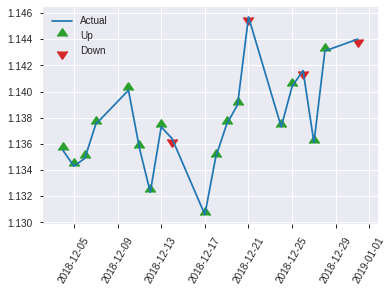


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.17106249278330013
RMSE: 0.41359701737718096
LogLoss: 0.5000698143635371
Mean Per-Class Error: 0.2732600732600732
AUC: 0.8122710622710623
pr_auc: 0.8250169916745327
Gini: 0.6245421245421245
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2801817689818765: 


,0,1,Error,Rate
0,56.0,70.0,0.5556,(70.0/126.0)
1,5.0,125.0,0.0385,(5.0/130.0)
Total,61.0,195.0,0.293,(75.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2801818,0.7692308,194.0
max f2,0.2554676,0.8774373,197.0
max f0point5,0.5539688,0.7511737,73.0
max accuracy,0.4657270,0.7265625,125.0
max precision,0.9897337,1.0,0.0
max recall,0.0168559,1.0,242.0
max specificity,0.9897337,1.0,0.0
max absolute_mcc,0.2801818,0.4764118,194.0
max min_per_class_accuracy,0.4657270,0.7153846,125.0
max mean_per_class_accuracy,0.4657270,0.7267399,125.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 46.40 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9832722,1.9692308,1.9692308,1.0,0.9860990,1.0,0.9860990,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9777682,1.9692308,1.9692308,1.0,0.9803106,1.0,0.9832048,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9690578,1.9692308,1.9692308,1.0,0.9766195,1.0,0.9815585,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9614182,1.9692308,1.9692308,1.0,0.9640378,1.0,0.9767801,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9552934,1.9692308,1.9692308,1.0,0.9579357,1.0,0.9738810,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9132052,1.9692308,1.9692308,1.0,0.9354035,1.0,0.9546423,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8027497,1.8177515,1.9187377,0.9230769,0.8703300,0.9743590,0.9265382,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.6876474,1.6662722,1.8556213,0.8461538,0.7325150,0.9423077,0.8780324,0.0846154,0.3769231,66.6272189,85.5621302
,9,0.3007812,0.5438802,1.2603077,1.6623377,0.64,0.6057128,0.8441558,0.7896170,0.1230769,0.5,26.0307692,66.2337662
,10,0.4023438,0.4937348,0.9846154,1.4912621,0.5,0.5080267,0.7572816,0.7185359,0.1,0.6,-1.5384615,49.1262136


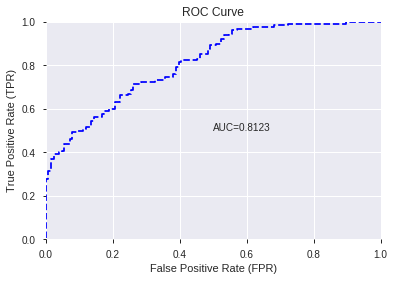

This function is available for GLM models only


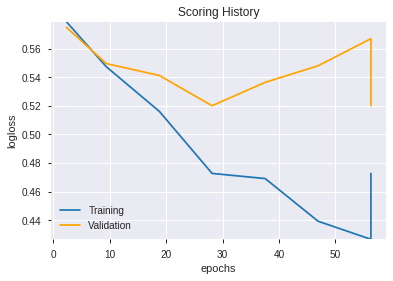

--2019-12-20 18:04:34--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.112.156
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.112.156|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


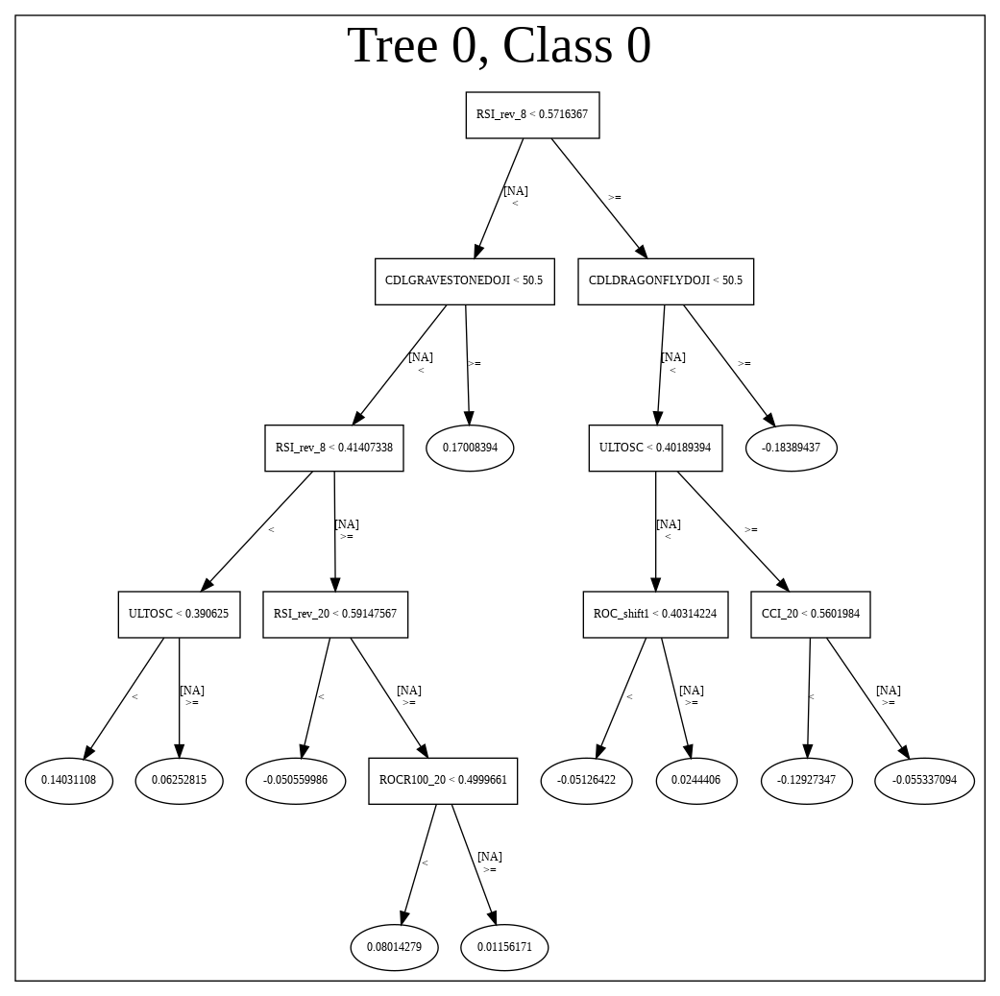

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191220_175821_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191220_175821_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_321_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'auto

['CDLRICKSHAWMAN',
 'STOCHF_fastk',
 'CDLLONGLEGGEDDOJI',
 'SUB',
 'CDLDOJI',
 'DIV',
 'ROC_shift1',
 'WILLR_8',
 'CCI_8',
 'TRANGE',
 'days_in_month',
 'CDLGRAVESTONEDOJI',
 'ULTOSC',
 'PLUS_DI_14',
 'CORREL_20',
 'SAREXT',
 'weekday_name',
 'CDLDRAGONFLYDOJI',
 'CDLHANGINGMAN',
 'CORREL_8',
 'CDLTAKURI',
 'PLUS_DI_8',
 'MINUS_DI_8',
 'HT_DCPERIOD',
 'ATR_30',
 'aroonup_24',
 'CDLCLOSINGMARUBOZU',
 'aroonup_12',
 'aroonup_8',
 'PLUS_DM_8',
 'CDLSPINNINGTOP',
 'PLUS_DI_12',
 'CDLBELTHOLD',
 'CDLHIKKAKE',
 'CCI_30',
 'CDLHIGHWAVE',
 'MINUS_DM_8',
 'PLUS_DM_12',
 'CDLINVERTEDHAMMER',
 'MINUS_DM_12',
 'is_month_start',
 'CDLSHOOTINGSTAR',
 'CCI_12',
 'MINUS_DI_12',
 'is_month_end',
 'CCI_14',
 'CCI_20',
 'CDLHAMMER',
 'CDLMATCHINGLOW',
 'is_quarter_end']

In [234]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_180441_model_1,0.83895,0.488309,0.264042,0.405406,0.164354


,variable,relative_importance,scaled_importance,percentage
0,PLUS_DM_12,2.307718,1.000000,0.111858
1,PLUS_DM_8,1.517258,0.657471,0.073543
2,PLUS_DI_8,1.452781,0.629531,0.070418
3,CCI_8,1.299734,0.563212,0.063000
4,MINUS_DI_8,1.238796,0.536806,0.060046
5,PLUS_DI_12,1.207823,0.523384,0.058545
6,ROC_shift1,1.061105,0.459807,0.051433
7,MINUS_DI_12,1.035535,0.448727,0.050194
8,WILLR_8,0.845760,0.366492,0.040995
9,CCI_12,0.845081,0.366198,0.040962


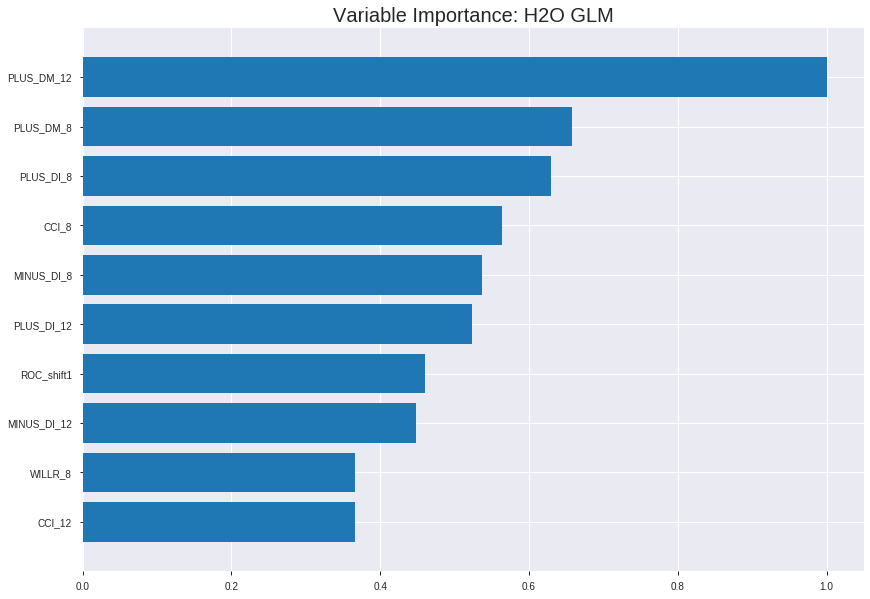

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_180441_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.17171234250960446
RMSE: 0.4143818800449707
LogLoss: 0.5135053246123008
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375748
Residual deviance: 1835.2680301643632
AIC: 1937.2680301643632
AUC: 0.8227625962000962
pr_auc: 0.812377263344976
Gini: 0.6455251924001923
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4029689144614367: 


,0,1,Error,Rate
0,516.0,375.0,0.4209,(375.0/891.0)
1,110.0,786.0,0.1228,(110.0/896.0)
Total,626.0,1161.0,0.2714,(485.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4029689,0.7642197,250.0
max f2,0.2349285,0.8635458,312.0
max f0point5,0.5416613,0.7584135,184.0
max accuracy,0.5336856,0.7487409,188.0
max precision,0.9964363,1.0,0.0
max recall,0.0089431,1.0,396.0
max specificity,0.9964363,1.0,0.0
max absolute_mcc,0.5336856,0.4989015,188.0
max min_per_class_accuracy,0.5106343,0.7384961,200.0
max mean_per_class_accuracy,0.5336856,0.7488407,188.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9823262,1.8836186,1.8836186,0.9444444,0.9916827,0.9444444,0.9916827,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.9650892,1.8836186,1.8836186,0.9444444,0.9729787,0.9444444,0.9823307,0.0189732,0.0379464,88.3618552,88.3618552
,3,0.0302182,0.9574573,1.8836186,1.8836186,0.9444444,0.9610814,0.9444444,0.9752476,0.0189732,0.0569196,88.3618552,88.3618552
,4,0.0402910,0.9496320,1.7728175,1.8559183,0.8888889,0.9527274,0.9305556,0.9696176,0.0178571,0.0747768,77.2817460,85.5918279
,5,0.0503637,0.9351823,1.9944196,1.8836186,1.0,0.9436612,0.9444444,0.9644263,0.0200893,0.0948661,99.4419643,88.3618552
,6,0.1001679,0.8895360,1.8823736,1.8829996,0.9438202,0.9128971,0.9441341,0.9388056,0.09375,0.1886161,88.2373596,88.2999551
,7,0.1499720,0.8225244,1.7479183,1.8381405,0.8764045,0.8598549,0.9216418,0.9125869,0.0870536,0.2756696,74.7918339,83.8140492
,8,0.2003358,0.7593852,1.5955357,1.7771505,0.8,0.7892022,0.8910615,0.8815684,0.0803571,0.3560268,59.5535714,77.7150464
,9,0.2999440,0.6613184,1.3333480,1.6297683,0.6685393,0.7081305,0.8171642,0.8239715,0.1328125,0.4888393,33.3347963,62.9768290
,10,0.4001119,0.5825822,1.3593251,1.5620629,0.6815642,0.6241091,0.7832168,0.7739360,0.1361607,0.625,35.9325120,56.2062937




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.16492695862628834
RMSE: 0.4061120025636873
LogLoss: 0.4986517046864291
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.506742749742
Residual deviance: 509.6220421895304
AIC: 611.6220421895305
AUC: 0.8368538119343458
pr_auc: 0.8307260260678331
Gini: 0.6737076238686917
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3740616524806292: 


,0,1,Error,Rate
0,160.0,105.0,0.3962,(105.0/265.0)
1,30.0,216.0,0.122,(30.0/246.0)
Total,190.0,321.0,0.2642,(135.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3740617,0.7619048,251.0
max f2,0.2339779,0.8586957,309.0
max f0point5,0.6986671,0.7654321,111.0
max accuracy,0.5100209,0.7573386,192.0
max precision,0.9970522,1.0,0.0
max recall,0.0147573,1.0,394.0
max specificity,0.9970522,1.0,0.0
max absolute_mcc,0.5054639,0.5145718,195.0
max min_per_class_accuracy,0.5067546,0.7560976,194.0
max mean_per_class_accuracy,0.5054639,0.7574398,195.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9823633,2.0772358,2.0772358,1.0,0.9892635,1.0,0.9892635,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9714681,2.0772358,2.0772358,1.0,0.9768928,1.0,0.9836405,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9542472,2.0772358,2.0772358,1.0,0.9593912,1.0,0.9760626,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9481474,1.6617886,1.9783198,0.8,0.9494428,0.9523810,0.9697245,0.0162602,0.0813008,66.1788618,97.8319783
,5,0.0508806,0.9419688,2.0772358,1.9973421,1.0,0.9446116,0.9615385,0.9648951,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8980249,1.9174484,1.9573952,0.9230769,0.9234381,0.9423077,0.9441666,0.0975610,0.1991870,91.7448405,95.7395247
,7,0.1506849,0.8504579,1.9941463,1.9693274,0.96,0.8757654,0.9480519,0.9219584,0.0975610,0.2967480,99.4146341,96.9327421
,8,0.2015656,0.7981699,1.7576610,1.9158971,0.8461538,0.8228447,0.9223301,0.8969394,0.0894309,0.3861789,75.7661038,91.5897072
,9,0.3013699,0.6791453,1.4662841,1.7669993,0.7058824,0.7339510,0.8506494,0.8429627,0.1463415,0.5325203,46.6284075,76.6999261
,10,0.4011742,0.5772650,1.1811733,1.6212572,0.5686275,0.6273045,0.7804878,0.7893112,0.1178862,0.6504065,18.1173282,62.1257188



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:04:42,0.000 sec,2,.16E2,51,1.3689537,1.3679081
,2019-12-20 18:04:42,0.024 sec,4,.96E1,51,1.3595699,1.3577349
,2019-12-20 18:04:42,0.041 sec,6,.6E1,51,1.3459943,1.3429125
,2019-12-20 18:04:42,0.062 sec,8,.37E1,51,1.3273225,1.3223275
,2019-12-20 18:04:42,0.079 sec,10,.23E1,51,1.3032722,1.2955378
---,---,---,---,---,---,---,---
,2019-12-20 18:04:42,0.403 sec,50,.17E-3,51,1.0257638,0.9973356
,2019-12-20 18:04:42,0.419 sec,52,.1E-3,51,1.0245887,0.9975754
,2019-12-20 18:04:42,0.437 sec,54,.65E-4,51,1.0235344,0.9979162
,2019-12-20 18:04:42,0.464 sec,57,.4E-4,51,1.0222367,0.9984477



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.75390625)

('F1', 0.7744107744107744)

('auc', 0.838949938949939)

('logloss', 0.4883094142041894)

('mean_per_class_error', 0.2437728937728938)

('rmse', 0.40540645389746344)

('mse', 0.16435439286171616)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


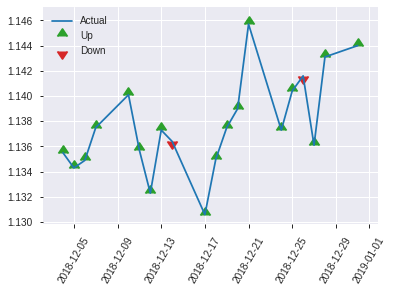


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.16435439286171616
RMSE: 0.40540645389746344
LogLoss: 0.4883094142041894
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.87097666550136
Residual deviance: 250.0144200725449
AIC: 352.0144200725449
AUC: 0.838949938949939
pr_auc: 0.8494870149394032
Gini: 0.6778998778998779
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3941527838238372: 


,0,1,Error,Rate
0,74.0,52.0,0.4127,(52.0/126.0)
1,15.0,115.0,0.1154,(15.0/130.0)
Total,89.0,167.0,0.2617,(67.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3941528,0.7744108,166.0
max f2,0.2149469,0.8719346,213.0
max f0point5,0.6127505,0.7995951,90.0
max accuracy,0.6127505,0.7539062,90.0
max precision,0.9901314,1.0,0.0
max recall,0.1142888,1.0,231.0
max specificity,0.9901314,1.0,0.0
max absolute_mcc,0.6127505,0.5352410,90.0
max min_per_class_accuracy,0.5055252,0.7307692,127.0
max mean_per_class_accuracy,0.6127505,0.7562271,90.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9704830,1.9692308,1.9692308,1.0,0.9811659,1.0,0.9811659,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9675868,1.9692308,1.9692308,1.0,0.9679044,1.0,0.9745352,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9502008,1.9692308,1.9692308,1.0,0.9630442,1.0,0.9716624,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9421960,1.9692308,1.9692308,1.0,0.9438514,1.0,0.9640776,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9367127,1.9692308,1.9692308,1.0,0.9392436,1.0,0.9602570,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8671117,1.8177515,1.8934911,0.9230769,0.9100994,0.9615385,0.9351782,0.0923077,0.1923077,81.7751479,89.3491124
,7,0.1523438,0.8239823,1.9692308,1.9187377,1.0,0.8490806,0.9743590,0.9064790,0.1,0.2923077,96.9230769,91.8737673
,8,0.203125,0.7528624,1.6662722,1.8556213,0.8461538,0.7882911,0.9423077,0.8769320,0.0846154,0.3769231,66.6272189,85.5621302
,9,0.3007812,0.6551334,1.5753846,1.7646354,0.8,0.7033358,0.8961039,0.8205696,0.1538462,0.5307692,57.5384615,76.4635365
,10,0.4023438,0.5810877,1.1360947,1.6059746,0.5769231,0.6139044,0.8155340,0.7684017,0.1153846,0.6461538,13.6094675,60.5974608


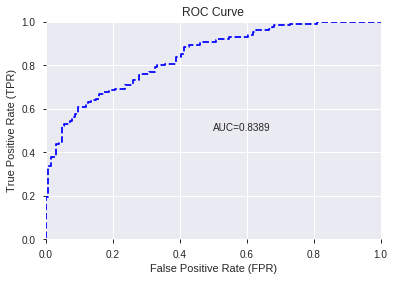

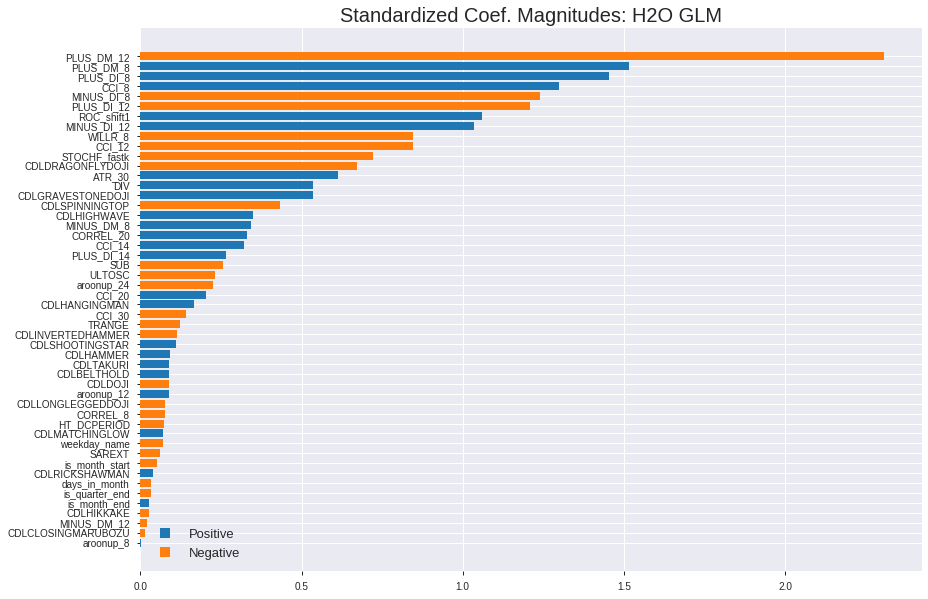

'log_likelihood'
--2019-12-20 18:04:46--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.107.52
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.107.52|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


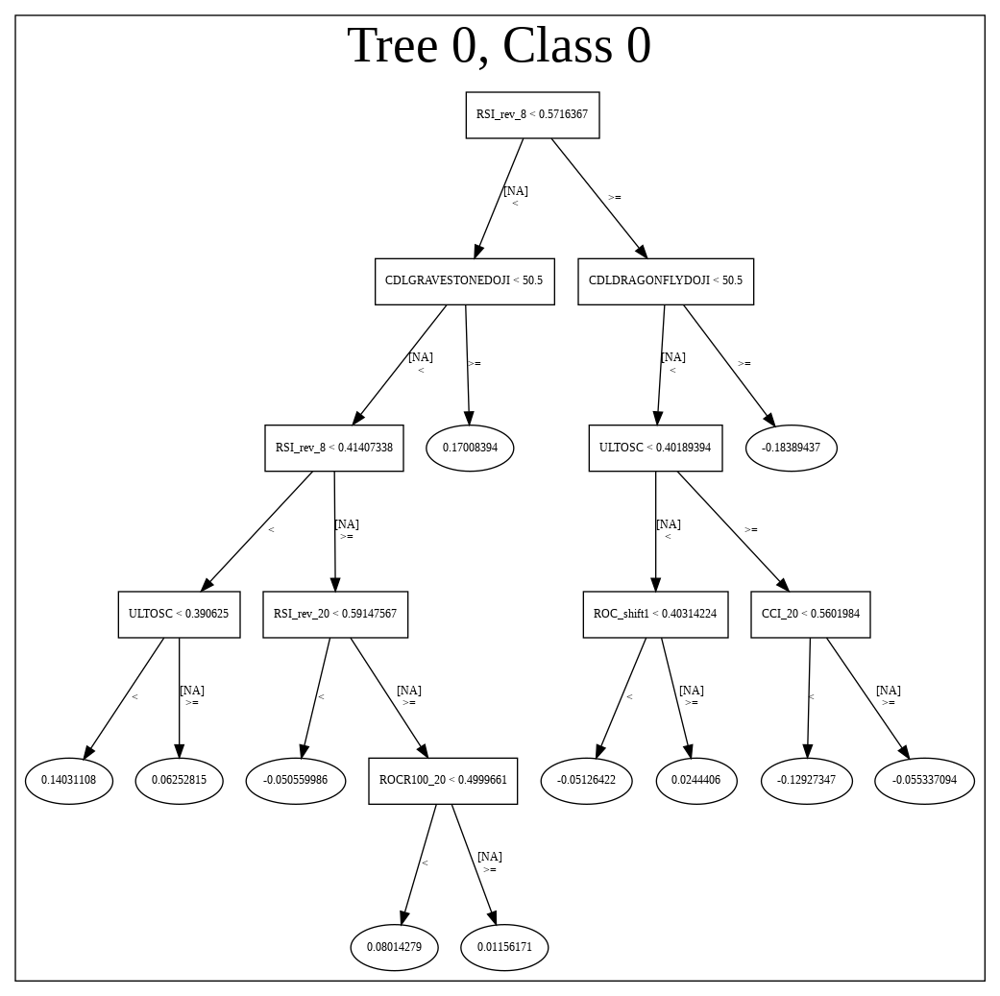

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_180441_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_180441_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_326_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_326

['PLUS_DM_12',
 'PLUS_DM_8',
 'PLUS_DI_8',
 'CCI_8',
 'MINUS_DI_8',
 'PLUS_DI_12',
 'ROC_shift1',
 'MINUS_DI_12',
 'WILLR_8',
 'CCI_12',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'ATR_30',
 'DIV',
 'CDLGRAVESTONEDOJI',
 'CDLSPINNINGTOP',
 'CDLHIGHWAVE',
 'MINUS_DM_8',
 'CORREL_20',
 'CCI_14',
 'PLUS_DI_14',
 'SUB',
 'ULTOSC',
 'aroonup_24',
 'CCI_20',
 'CDLHANGINGMAN',
 'CCI_30',
 'TRANGE',
 'CDLINVERTEDHAMMER',
 'CDLSHOOTINGSTAR',
 'CDLHAMMER',
 'CDLTAKURI',
 'CDLBELTHOLD',
 'CDLDOJI',
 'aroonup_12',
 'CDLLONGLEGGEDDOJI',
 'CORREL_8',
 'HT_DCPERIOD',
 'CDLMATCHINGLOW',
 'weekday_name',
 'SAREXT',
 'is_month_start',
 'CDLRICKSHAWMAN',
 'days_in_month',
 'is_quarter_end',
 'is_month_end',
 'CDLHIKKAKE',
 'MINUS_DM_12',
 'CDLCLOSINGMARUBOZU',
 'aroonup_8']

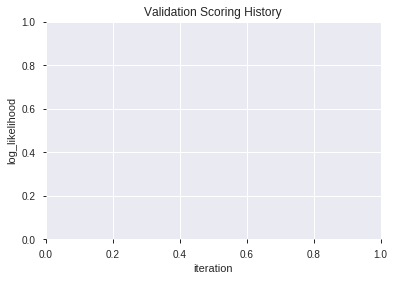

In [235]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20191220_180453,0.836691,0.500583,0.256105,0.408795,0.167113
1,XGBoost_grid_1_AutoML_20191220_180453_model_5,0.835348,0.495911,0.276923,0.409118,0.167378
2,XGBoost_grid_1_AutoML_20191220_180453_model_7,0.833516,0.499047,0.292918,0.408497,0.166870
3,XGBoost_grid_1_AutoML_20191220_180453_model_3,0.828083,0.506044,0.281013,0.411957,0.169708
4,XGBoost_grid_1_AutoML_20191220_180453_model_6,0.826923,0.505733,0.263919,0.412592,0.170232
5,XGBoost_1_AutoML_20191220_180453,0.825824,0.510906,0.263797,0.413272,0.170793
6,XGBoost_grid_1_AutoML_20191220_180453_model_4,0.825336,0.518708,0.264408,0.416328,0.173329
7,XGBoost_3_AutoML_20191220_180453,0.823504,0.504393,0.268132,0.412184,0.169895
8,XGBoost_grid_1_AutoML_20191220_180453_model_1,0.817460,0.516177,0.308669,0.417274,0.174118
9,XGBoost_grid_1_AutoML_20191220_180453_model_2,0.816300,0.518764,0.300488,0.418404,0.175062


,variable,relative_importance,scaled_importance,percentage
0,WILLR_8,832.115173,1.000000,0.090904
1,CDLGRAVESTONEDOJI,712.534485,0.856293,0.077840
2,STOCHF_fastk,711.383911,0.854910,0.077714
3,CDLTAKURI,656.543762,0.789006,0.071723
4,ROC_shift1,633.557678,0.761382,0.069212
5,CDLDRAGONFLYDOJI,605.236938,0.727348,0.066118
6,CCI_8,533.614685,0.641275,0.058294
7,ULTOSC,410.636017,0.493485,0.044860
8,CORREL_20,259.260620,0.311568,0.028323
9,CCI_30,258.759094,0.310965,0.028268


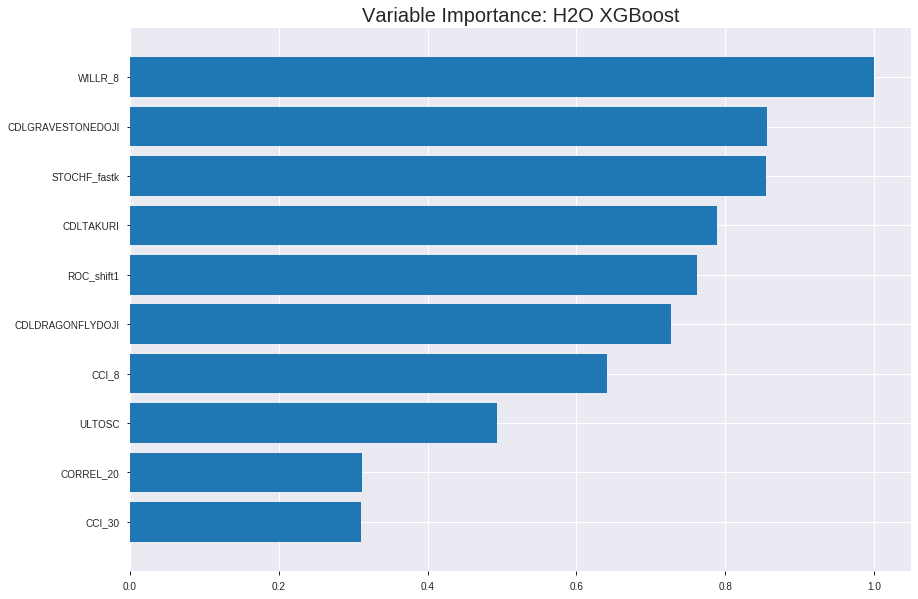

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20191220_180453


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.12093616108652933
RMSE: 0.3477587685257258
LogLoss: 0.3981142115271611
Mean Per-Class Error: 0.13762751523168193
AUC: 0.9356993797097963
pr_auc: 0.9330074386420214
Gini: 0.8713987594195927
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4921161929766337: 


,0,1,Error,Rate
0,732.0,159.0,0.1785,(159.0/891.0)
1,89.0,807.0,0.0993,(89.0/896.0)
Total,821.0,966.0,0.1388,(248.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4921162,0.8668099,210.0
max f2,0.3951514,0.9113040,251.0
max f0point5,0.5924526,0.8896982,162.0
max accuracy,0.5304063,0.8623391,191.0
max precision,0.9658053,1.0,0.0
max recall,0.0790159,1.0,380.0
max specificity,0.9658053,1.0,0.0
max absolute_mcc,0.5596459,0.7253371,177.0
max min_per_class_accuracy,0.5211356,0.8574635,196.0
max mean_per_class_accuracy,0.5304063,0.8623725,191.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9399449,1.9944196,1.9944196,1.0,0.9505413,1.0,0.9505413,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9326377,1.9944196,1.9944196,1.0,0.9363730,1.0,0.9434572,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9213849,1.9944196,1.9944196,1.0,0.9286511,1.0,0.9385218,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9111706,1.9944196,1.9944196,1.0,0.9149236,1.0,0.9326223,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9015346,1.9944196,1.9944196,1.0,0.9060572,1.0,0.9273092,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8578624,1.9496012,1.9721356,0.9775281,0.8795809,0.9888268,0.9035784,0.0970982,0.1975446,94.9601224,97.2135625
,7,0.1499720,0.8145758,1.9496012,1.9646522,0.9775281,0.8341903,0.9850746,0.8805353,0.0970982,0.2946429,94.9601224,96.4652186
,8,0.2003358,0.7754449,1.7949777,1.9219966,0.9,0.7937025,0.9636872,0.8587058,0.0904018,0.3850446,79.4977679,92.1996583
,9,0.2999440,0.6892982,1.8711690,1.9051173,0.9382022,0.7322443,0.9552239,0.8167093,0.1863839,0.5714286,87.1168991,90.5117271
,10,0.4001119,0.5995019,1.7270114,1.8605285,0.8659218,0.6442868,0.9328671,0.7735434,0.1729911,0.7444196,72.7011423,86.0528534




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.16946256994138867
RMSE: 0.4116583169831367
LogLoss: 0.5110351390921862
Mean Per-Class Error: 0.22905353581837706
AUC: 0.8339239147108453
pr_auc: 0.8148132902385373
Gini: 0.6678478294216905
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46144893765449524: 


,0,1,Error,Rate
0,176.0,89.0,0.3358,(89.0/265.0)
1,32.0,214.0,0.1301,(32.0/246.0)
Total,208.0,303.0,0.2368,(121.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4614489,0.7795993,226.0
max f2,0.2529685,0.8536585,319.0
max f0point5,0.6944066,0.7671082,121.0
max accuracy,0.5071533,0.7690802,203.0
max precision,0.9604032,1.0,0.0
max recall,0.0959478,1.0,381.0
max specificity,0.9604032,1.0,0.0
max absolute_mcc,0.5000013,0.5432697,205.0
max min_per_class_accuracy,0.5523276,0.7396226,184.0
max mean_per_class_accuracy,0.5000013,0.7709465,205.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 52.72 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9400734,2.0772358,2.0772358,1.0,0.9462776,1.0,0.9462776,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9261682,2.0772358,2.0772358,1.0,0.9353103,1.0,0.9412925,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9239249,1.6617886,1.9474085,0.8,0.9245358,0.9375,0.9360560,0.0162602,0.0609756,66.1788618,94.7408537
,4,0.0410959,0.9166118,2.0772358,1.9783198,1.0,0.9204884,0.9523810,0.9323494,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.9058212,2.0772358,1.9973421,1.0,0.9100073,0.9615385,0.9280529,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8746889,1.8375547,1.9174484,0.8846154,0.8888155,0.9230769,0.9084342,0.0934959,0.1951220,83.7554722,91.7448405
,7,0.1506849,0.8462681,1.7448780,1.8614191,0.84,0.8593183,0.8961039,0.8924875,0.0853659,0.2804878,74.4878049,86.1419069
,8,0.2015656,0.8059435,1.6777674,1.8150604,0.8076923,0.8269973,0.8737864,0.8759560,0.0853659,0.3658537,67.7767355,81.5060384
,9,0.3013699,0.7155856,1.6292045,1.7535107,0.7843137,0.7605229,0.8441558,0.8377281,0.1626016,0.5284553,62.9204527,75.3510717
,10,0.4011742,0.6119468,1.1404432,1.6009915,0.5490196,0.6643605,0.7707317,0.7945976,0.1138211,0.6422764,14.0443169,60.0991473



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:04:56,0.005 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-20 18:04:57,0.189 sec,5.0,0.4717844,0.6378828,0.8433066,0.7137825,1.9099103,0.2411863,0.4741446,0.6423545,0.8066191,0.6804524,2.0102282,0.3228963
,2019-12-20 18:04:57,0.239 sec,10.0,0.4499688,0.5959877,0.8607760,0.8432239,1.9944196,0.2271964,0.4570959,0.6091216,0.8111443,0.7776448,1.7804878,0.2954990
,2019-12-20 18:04:57,0.284 sec,15.0,0.4338907,0.5647691,0.8659599,0.8502024,1.9944196,0.2171237,0.4461717,0.5872249,0.8147952,0.7948975,2.0772358,0.2818004
,2019-12-20 18:04:57,0.331 sec,20.0,0.4214521,0.5401534,0.8709065,0.8570253,1.9944196,0.2132065,0.4380611,0.5705362,0.8144194,0.7934375,2.0772358,0.2974560
,2019-12-20 18:04:57,0.390 sec,25.0,0.4117390,0.5207006,0.8779430,0.8715944,1.9944196,0.2087297,0.4332260,0.5599065,0.8160224,0.7938010,2.0772358,0.2798434
,2019-12-20 18:04:57,0.440 sec,30.0,0.4035906,0.5045840,0.8867344,0.8820824,1.9944196,0.1964186,0.4282905,0.5493493,0.8214757,0.8022438,2.0772358,0.2857143
,2019-12-20 18:04:57,0.495 sec,35.0,0.3965667,0.4904966,0.8903951,0.8858908,1.9944196,0.1913822,0.4246250,0.5411024,0.8219435,0.8023162,2.0772358,0.2778865
,2019-12-20 18:04:57,0.552 sec,40.0,0.3909602,0.4793660,0.8959855,0.8920481,1.9944196,0.1807499,0.4218719,0.5350280,0.8241448,0.8059696,2.0772358,0.2641879
,2019-12-20 18:04:57,0.600 sec,45.0,0.3853394,0.4681297,0.8992392,0.8939956,1.9944196,0.1779519,0.4195857,0.5296883,0.8242368,0.8048911,2.0772358,0.2563601


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
WILLR_8,832.1151733,1.0,0.0909036
CDLGRAVESTONEDOJI,712.5344849,0.8562931,0.0778401
STOCHF_fastk,711.3839111,0.8549104,0.0777144
CDLTAKURI,656.5437622,0.7890059,0.0717234
ROC_shift1,633.5576782,0.7613822,0.0692123
---,---,---,---
CDLRICKSHAWMAN,21.1589928,0.0254280,0.0023115
days_in_month,19.0401306,0.0228816,0.0020800
CDLSPINNINGTOP,17.2493896,0.0207296,0.0018844
CDLLONGLEGGEDDOJI,15.9679165,0.0191896,0.0017444



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7578125)

('F1', 0.7796610169491526)

('auc', 0.8366910866910867)

('logloss', 0.5005828492992648)

('mean_per_class_error', 0.24090354090354094)

('rmse', 0.4087945220037985)

('mse', 0.1671129612203141)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


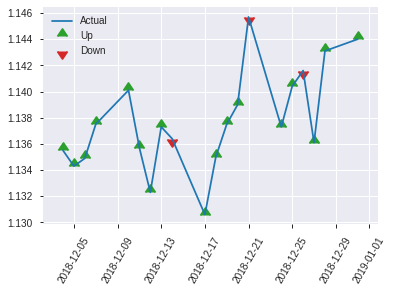


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.1671129612203141
RMSE: 0.4087945220037985
LogLoss: 0.5005828492992648
Mean Per-Class Error: 0.24090354090354094
AUC: 0.8366910866910867
pr_auc: 0.8431937740553916
Gini: 0.6733821733821734
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4210837781429291: 


,0,1,Error,Rate
0,76.0,50.0,0.3968,(50.0/126.0)
1,15.0,115.0,0.1154,(15.0/130.0)
Total,91.0,165.0,0.2539,(65.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4210838,0.7796610,164.0
max f2,0.2880451,0.8774373,197.0
max f0point5,0.6059553,0.7829181,107.0
max accuracy,0.6059553,0.7578125,107.0
max precision,0.9454321,1.0,0.0
max recall,0.0984161,1.0,241.0
max specificity,0.9454321,1.0,0.0
max absolute_mcc,0.6059553,0.5245727,107.0
max min_per_class_accuracy,0.5536568,0.7076923,126.0
max mean_per_class_accuracy,0.6059553,0.7590965,107.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 51.93 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9404529,1.9692308,1.9692308,1.0,0.9438020,1.0,0.9438020,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9323476,1.9692308,1.9692308,1.0,0.9352662,1.0,0.9395341,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9191393,1.9692308,1.9692308,1.0,0.9276814,1.0,0.9365709,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9153184,1.9692308,1.9692308,1.0,0.9157008,1.0,0.9308791,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9075121,1.9692308,1.9692308,1.0,0.9117501,1.0,0.9279362,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8572851,1.9692308,1.9692308,1.0,0.8783587,1.0,0.9031474,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8061502,1.6662722,1.8682446,0.8461538,0.8381087,0.9487179,0.8814679,0.0846154,0.2846154,66.6272189,86.8244576
,8,0.203125,0.7592912,1.8177515,1.8556213,0.9230769,0.7766484,0.9423077,0.8552630,0.0923077,0.3769231,81.7751479,85.5621302
,9,0.3007812,0.6869014,1.4178462,1.7134865,0.72,0.7156368,0.8701299,0.8099298,0.1384615,0.5153846,41.7846154,71.3486513
,10,0.4023438,0.6131755,1.2875740,1.6059746,0.6538462,0.6478069,0.8155340,0.7690056,0.1307692,0.6461538,28.7573964,60.5974608


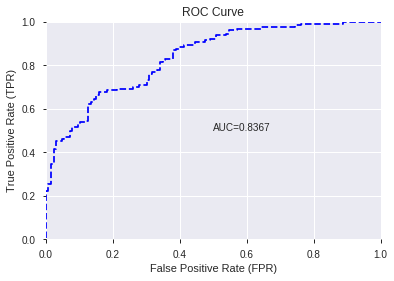

This function is available for GLM models only


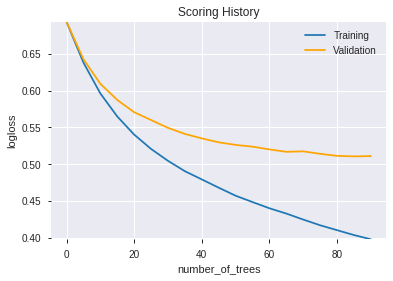

--2019-12-20 18:05:14--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.142.196
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.142.196|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


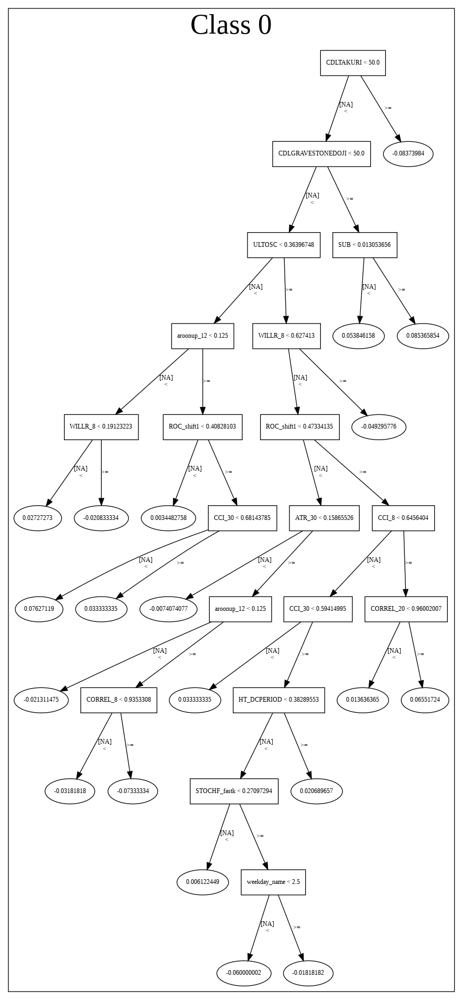

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20191220_180453',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20191220_180453',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_331_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_331_sid_be3a',
   'ty

['WILLR_8',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'CDLTAKURI',
 'ROC_shift1',
 'CDLDRAGONFLYDOJI',
 'CCI_8',
 'ULTOSC',
 'CORREL_20',
 'CCI_30',
 'MINUS_DI_8',
 'DIV',
 'HT_DCPERIOD',
 'CCI_12',
 'MINUS_DM_12',
 'TRANGE',
 'SAREXT',
 'aroonup_24',
 'aroonup_12',
 'MINUS_DM_8',
 'ATR_30',
 'CCI_20',
 'SUB',
 'CORREL_8',
 'CCI_14',
 'PLUS_DI_14',
 'PLUS_DM_12',
 'PLUS_DI_8',
 'PLUS_DM_8',
 'aroonup_8',
 'MINUS_DI_12',
 'PLUS_DI_12',
 'weekday_name',
 'CDLHIGHWAVE',
 'CDLRICKSHAWMAN',
 'days_in_month',
 'CDLSPINNINGTOP',
 'CDLLONGLEGGEDDOJI',
 'CDLDOJI']

In [236]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [237]:
# DRF with top DeepLearning features
model_train(feature_name='DLF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_1_AutoML_20191220_180540,0.835653,0.494363,0.232540,0.407223,0.165831
1,GBM_3_AutoML_20191220_180540,0.832234,0.501772,0.240110,0.409667,0.167827
2,GBM_5_AutoML_20191220_180540,0.829609,0.507927,0.292796,0.412154,0.169871
3,GBM_2_AutoML_20191220_180540,0.825946,0.499992,0.288584,0.411323,0.169187
4,GBM_grid_1_AutoML_20191220_180540_model_1,0.819353,0.581637,0.263675,0.443701,0.196871
5,GBM_4_AutoML_20191220_180540,0.817643,0.516568,0.251404,0.419573,0.176042
6,GBM_grid_1_AutoML_20191220_180540_model_4,0.815934,0.649300,0.291819,0.477704,0.228202
7,GBM_grid_1_AutoML_20191220_180540_model_5,0.815751,0.685036,0.272100,0.495928,0.245945
8,GBM_grid_1_AutoML_20191220_180540_model_2,0.798504,0.603667,0.320696,0.454802,0.206845
9,GBM_grid_1_AutoML_20191220_180540_model_3,0.785775,0.676210,0.276435,0.458995,0.210676


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,175.935730,1.000000,0.109888
1,WILLR_8,134.584320,0.764963,0.084060
2,CDLGRAVESTONEDOJI,116.935944,0.664651,0.073037
3,STOCHF_fastk,104.143570,0.591941,0.065047
4,ROC_shift1,94.365730,0.536365,0.058940
5,CCI_8,75.602036,0.429714,0.047220
6,ULTOSC,70.602699,0.401298,0.044098
7,CDLDRAGONFLYDOJI,53.657814,0.304985,0.033514
8,ATR_30,43.673553,0.248236,0.027278
9,MINUS_DI_8,42.946182,0.244102,0.026824


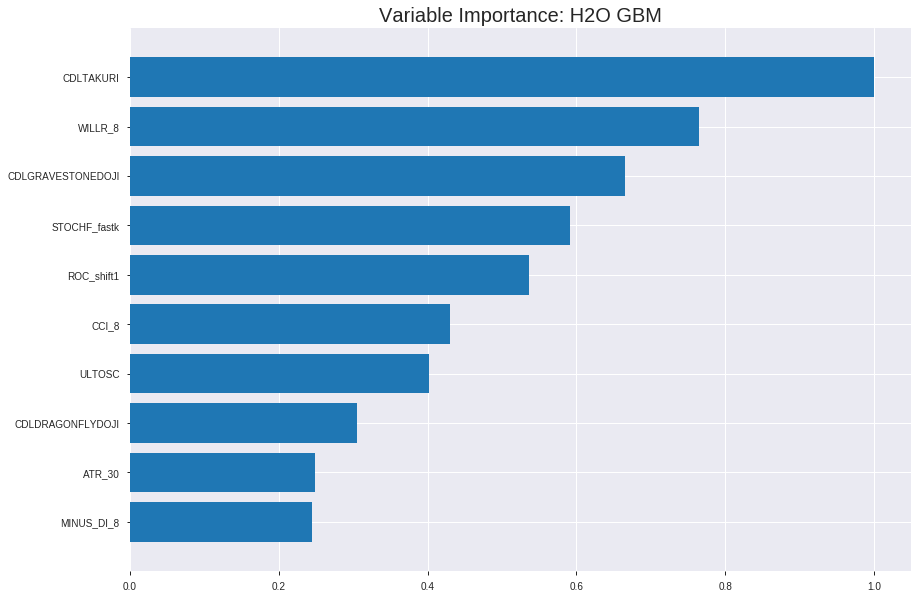

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_1_AutoML_20191220_180540


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.0757695351746936
RMSE: 0.27526266578432607
LogLoss: 0.2887428757209609
Mean Per-Class Error: 0.03638505591630592
AUC: 0.9931282066698733
pr_auc: 0.9888801666771511
Gini: 0.9862564133397467
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5085965000188916: 


,0,1,Error,Rate
0,855.0,36.0,0.0404,(36.0/891.0)
1,29.0,867.0,0.0324,(29.0/896.0)
Total,884.0,903.0,0.0364,(65.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5085965,0.9638688,202.0
max f2,0.4862372,0.9725299,210.0
max f0point5,0.5391658,0.9681485,192.0
max accuracy,0.5085965,0.9636262,202.0
max precision,0.9733590,1.0,0.0
max recall,0.2477535,1.0,301.0
max specificity,0.9733590,1.0,0.0
max absolute_mcc,0.5085965,0.9272787,202.0
max min_per_class_accuracy,0.5150251,0.9607183,200.0
max mean_per_class_accuracy,0.5085965,0.9636149,202.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9626920,1.9944196,1.9944196,1.0,0.9675446,1.0,0.9675446,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9553538,1.9944196,1.9944196,1.0,0.9591743,1.0,0.9633595,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9505244,1.9944196,1.9944196,1.0,0.9525747,1.0,0.9597645,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9444965,1.9944196,1.9944196,1.0,0.9470225,1.0,0.9565790,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9390998,1.9944196,1.9944196,1.0,0.9422965,1.0,0.9537225,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9081520,1.9944196,1.9944196,1.0,0.9238085,1.0,0.9388491,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8614935,1.9944196,1.9944196,1.0,0.8860172,1.0,0.9213042,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.8265956,1.9944196,1.9944196,1.0,0.8429054,1.0,0.9015950,0.1004464,0.3995536,99.4419643,99.4419643
,9,0.2999440,0.7309006,1.9944196,1.9944196,1.0,0.7755409,1.0,0.8597337,0.1986607,0.5982143,99.4419643,99.4419643
,10,0.4001119,0.6335555,1.9387096,1.9804727,0.9720670,0.6883162,0.9930070,0.8168194,0.1941964,0.7924107,93.8709597,98.0472652




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.17445447950971313
RMSE: 0.4176774826462556
LogLoss: 0.520676940615168
Mean Per-Class Error: 0.2509970854425525
AUC: 0.8211305414940941
pr_auc: 0.807162240202573
Gini: 0.6422610829881883
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39530066231158795: 


,0,1,Error,Rate
0,149.0,116.0,0.4377,(116.0/265.0)
1,25.0,221.0,0.1016,(25.0/246.0)
Total,174.0,337.0,0.2759,(141.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3953007,0.7581475,262.0
max f2,0.1852758,0.8479944,341.0
max f0point5,0.6272761,0.7703777,152.0
max accuracy,0.6272761,0.7534247,152.0
max precision,0.9697297,1.0,0.0
max recall,0.0892281,1.0,376.0
max specificity,0.9697297,1.0,0.0
max absolute_mcc,0.6272761,0.5148676,152.0
max min_per_class_accuracy,0.5435410,0.7235772,195.0
max mean_per_class_accuracy,0.6272761,0.7490029,152.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 52.54 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9605176,2.0772358,2.0772358,1.0,0.9635893,1.0,0.9635893,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9542512,2.0772358,2.0772358,1.0,0.9568069,1.0,0.9605064,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9504495,2.0772358,2.0772358,1.0,0.9514645,1.0,0.9576808,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9407097,1.6617886,1.9783198,0.8,0.9444043,0.9523810,0.9545197,0.0162602,0.0813008,66.1788618,97.8319783
,5,0.0508806,0.9375085,2.0772358,1.9973421,1.0,0.9388892,0.9615385,0.9515139,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.9143384,1.6777674,1.8375547,0.8076923,0.9269185,0.8846154,0.9392162,0.0853659,0.1869919,67.7767355,83.7554722
,7,0.1506849,0.8688634,1.9941463,1.8883962,0.96,0.8904621,0.9090909,0.9233869,0.0975610,0.2845528,99.4146341,88.8396157
,8,0.2015656,0.8310111,1.6777674,1.8352277,0.8076923,0.8490880,0.8834951,0.9046319,0.0853659,0.3699187,67.7767355,83.5227721
,9,0.3013699,0.7072685,1.5884744,1.7535107,0.7647059,0.7673763,0.8441558,0.8591771,0.1585366,0.5284553,58.8474414,75.3510717
,10,0.4011742,0.6067394,1.1811733,1.6111243,0.5686275,0.6490007,0.7756098,0.8068893,0.1178862,0.6463415,18.1173282,61.1124331



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:05:41,0.008 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-20 18:05:41,0.241 sec,5.0,0.4421734,0.5805718,0.8694917,0.8731799,1.9944196,0.2411863,0.4552774,0.6049703,0.7932658,0.7655173,1.8464318,0.2857143
,2019-12-20 18:05:41,0.426 sec,10.0,0.4107058,0.5185457,0.8982509,0.9006799,1.9944196,0.1841074,0.4390971,0.5705226,0.7955285,0.7798365,2.0772358,0.3131115
,2019-12-20 18:05:41,0.576 sec,15.0,0.3845596,0.4678903,0.9285320,0.9295000,1.9944196,0.1589256,0.4275020,0.5443911,0.8131845,0.7939406,2.0772358,0.2876712
,2019-12-20 18:05:41,0.707 sec,20.0,0.3617876,0.4259783,0.9470211,0.9470840,1.9944196,0.1354225,0.4239837,0.5357872,0.8129698,0.7943542,2.0772358,0.2602740
,2019-12-20 18:05:41,0.827 sec,25.0,0.3433707,0.3932879,0.9596436,0.9582165,1.9944196,0.1080022,0.4227329,0.5317140,0.8117579,0.7962988,2.0772358,0.3170254
,2019-12-20 18:05:41,0.950 sec,30.0,0.3248848,0.3628605,0.9731492,0.9730223,1.9944196,0.0861780,0.4199625,0.5260954,0.8184538,0.8012709,2.0772358,0.2974560
,2019-12-20 18:05:42,1.071 sec,35.0,0.3085266,0.3371760,0.9812948,0.9806440,1.9944196,0.0727476,0.4175029,0.5209454,0.8208391,0.8048248,2.0772358,0.2954990
,2019-12-20 18:05:42,1.196 sec,40.0,0.2915424,0.3117323,0.9881754,0.9873270,1.9944196,0.0537213,0.4185928,0.5218651,0.8174797,0.8036179,2.0772358,0.2818004
,2019-12-20 18:05:42,1.321 sec,45.0,0.2752627,0.2887429,0.9931282,0.9888802,1.9944196,0.0363738,0.4176775,0.5206769,0.8211305,0.8071622,2.0772358,0.2759295


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,175.9357300,1.0,0.1098879
WILLR_8,134.5843201,0.7649630,0.0840602
CDLGRAVESTONEDOJI,116.9359436,0.6646515,0.0730371
STOCHF_fastk,104.1435699,0.5919410,0.0650471
ROC_shift1,94.3657303,0.5363648,0.0589400
---,---,---,---
CDLMATCHINGLOW,1.3629463,0.0077468,0.0008513
is_month_end,1.1075014,0.0062949,0.0006917
CDLSHOOTINGSTAR,0.8095587,0.0046014,0.0005056
CDLHANGINGMAN,0.2906657,0.0016521,0.0001815



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.76953125)

('F1', 0.7986348122866893)

('auc', 0.8356532356532356)

('logloss', 0.4943629195791647)

('mean_per_class_error', 0.2314407814407814)

('rmse', 0.40722339911006905)

('mse', 0.16583089678275859)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


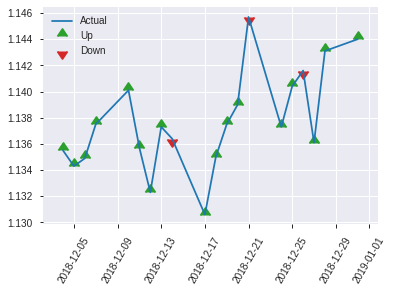


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.16583089678275859
RMSE: 0.40722339911006905
LogLoss: 0.4943629195791647
Mean Per-Class Error: 0.2314407814407814
AUC: 0.8356532356532356
pr_auc: 0.8353746290866174
Gini: 0.6713064713064711
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4432339932954116: 


,0,1,Error,Rate
0,80.0,46.0,0.3651,(46.0/126.0)
1,13.0,117.0,0.1,(13.0/130.0)
Total,93.0,163.0,0.2305,(59.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4432340,0.7986348,162.0
max f2,0.3236788,0.8753501,193.0
max f0point5,0.6460013,0.7700422,85.0
max accuracy,0.5126407,0.7695312,144.0
max precision,0.9696311,1.0,0.0
max recall,0.1339215,1.0,229.0
max specificity,0.9696311,1.0,0.0
max absolute_mcc,0.4432340,0.5560464,162.0
max min_per_class_accuracy,0.5405584,0.7384615,127.0
max mean_per_class_accuracy,0.5126407,0.7685592,144.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.31 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9576414,1.9692308,1.9692308,1.0,0.9641002,1.0,0.9641002,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9545143,1.9692308,1.9692308,1.0,0.9556192,1.0,0.9598597,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9480490,1.9692308,1.9692308,1.0,0.9515742,1.0,0.9577883,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9421647,1.9692308,1.9692308,1.0,0.9449274,1.0,0.9542808,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9351527,1.9692308,1.9692308,1.0,0.9391970,1.0,0.9519602,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8926819,1.9692308,1.9692308,1.0,0.9104016,1.0,0.9311809,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8598854,1.8177515,1.9187377,0.9230769,0.8772571,0.9743590,0.9132063,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7910536,1.3633136,1.7798817,0.6923077,0.8125864,0.9038462,0.8880513,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6625507,1.3390769,1.6367632,0.68,0.7148377,0.8311688,0.8318132,0.1307692,0.4923077,33.9076923,63.6763237
,10,0.4023438,0.6034123,1.1360947,1.5103809,0.5769231,0.6353134,0.7669903,0.7822113,0.1153846,0.6076923,13.6094675,51.0380881


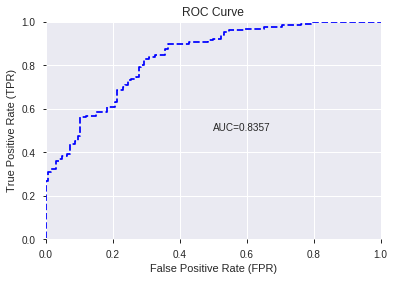

This function is available for GLM models only


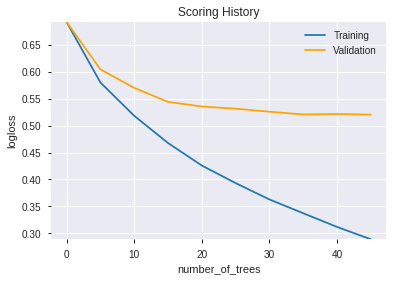

--2019-12-20 18:05:56--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.226.176
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.226.176|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      218.0
            depth:       1
            colId:       25
            colName:     STOCHF_fastk
            leftward:    false
            naVsRest:    false
            splitVal:    0.15234375
            isBitset:    false
            predValue:   -0.42800447
            squaredErr:  14.825686
            leftChild:   Node 5
           

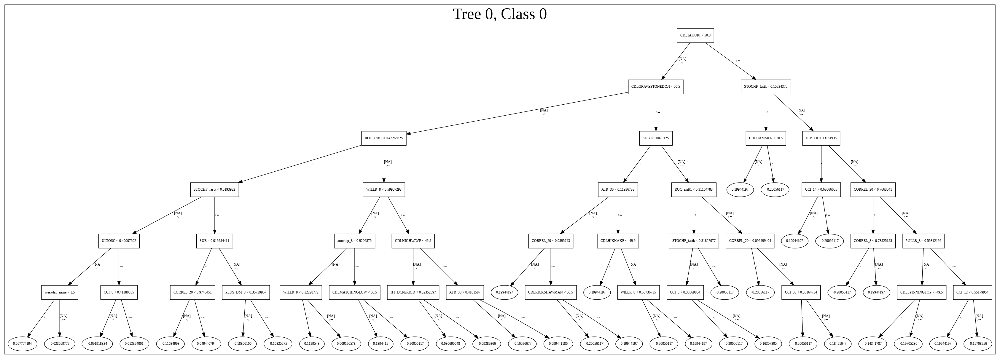

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_1_AutoML_20191220_180540',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_1_AutoML_20191220_180540',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_341_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_341_sid_be3a',
   'type': 'Ke

['CDLTAKURI',
 'WILLR_8',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'ROC_shift1',
 'CCI_8',
 'ULTOSC',
 'CDLDRAGONFLYDOJI',
 'ATR_30',
 'MINUS_DI_8',
 'HT_DCPERIOD',
 'CORREL_20',
 'CCI_30',
 'SUB',
 'aroonup_24',
 'TRANGE',
 'CCI_14',
 'MINUS_DI_12',
 'CCI_20',
 'PLUS_DM_8',
 'DIV',
 'SAREXT',
 'PLUS_DM_12',
 'aroonup_12',
 'PLUS_DI_14',
 'aroonup_8',
 'CCI_12',
 'CORREL_8',
 'MINUS_DM_12',
 'MINUS_DM_8',
 'PLUS_DI_12',
 'weekday_name',
 'CDLRICKSHAWMAN',
 'PLUS_DI_8',
 'CDLLONGLEGGEDDOJI',
 'CDLHIKKAKE',
 'CDLHIGHWAVE',
 'CDLDOJI',
 'days_in_month',
 'CDLSPINNINGTOP',
 'is_month_start',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLHAMMER',
 'CDLINVERTEDHAMMER',
 'CDLMATCHINGLOW',
 'is_month_end',
 'CDLSHOOTINGSTAR',
 'CDLHANGINGMAN',
 'is_quarter_end']

In [238]:
# GBM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [239]:
# StackedEnsemble with top DeepLearning features
model_train(feature_name='DLF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_180604_model_1,0.838950,0.488309,0.264042,0.405406,0.164354
1,XGBoost_2_AutoML_20191220_180604,0.836691,0.500583,0.256105,0.408795,0.167113
2,GBM_1_AutoML_20191220_180604,0.835653,0.494363,0.232540,0.407223,0.165831
3,GBM_3_AutoML_20191220_180604,0.832234,0.501772,0.240110,0.409667,0.167827
4,GBM_5_AutoML_20191220_180604,0.829609,0.507927,0.292796,0.412154,0.169871
5,GBM_2_AutoML_20191220_180604,0.825946,0.499992,0.288584,0.411323,0.169187
6,XGBoost_1_AutoML_20191220_180604,0.825824,0.510906,0.263797,0.413272,0.170793
7,XGBoost_3_AutoML_20191220_180604,0.823504,0.504393,0.268132,0.412184,0.169895
8,GBM_4_AutoML_20191220_180604,0.817643,0.516568,0.251404,0.419573,0.176042
9,DRF_1_AutoML_20191220_180604,0.809737,0.522972,0.304457,0.421212,0.177419


,variable,relative_importance,scaled_importance,percentage
0,PLUS_DM_12,2.307718,1.000000,0.111858
1,PLUS_DM_8,1.517258,0.657471,0.073543
2,PLUS_DI_8,1.452781,0.629531,0.070418
3,CCI_8,1.299734,0.563212,0.063000
4,MINUS_DI_8,1.238796,0.536806,0.060046
5,PLUS_DI_12,1.207823,0.523384,0.058545
6,ROC_shift1,1.061105,0.459807,0.051433
7,MINUS_DI_12,1.035535,0.448727,0.050194
8,WILLR_8,0.845760,0.366492,0.040995
9,CCI_12,0.845081,0.366198,0.040962


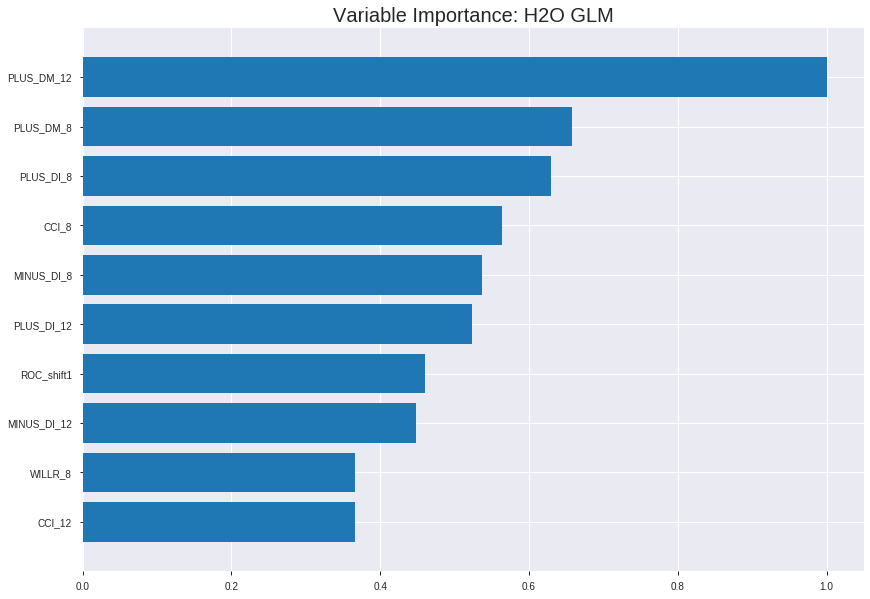

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_180604_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.17171234250960446
RMSE: 0.4143818800449707
LogLoss: 0.5135053246123008
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375748
Residual deviance: 1835.2680301643632
AIC: 1937.2680301643632
AUC: 0.8227625962000962
pr_auc: 0.812377263344976
Gini: 0.6455251924001923
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4029689144614367: 


,0,1,Error,Rate
0,516.0,375.0,0.4209,(375.0/891.0)
1,110.0,786.0,0.1228,(110.0/896.0)
Total,626.0,1161.0,0.2714,(485.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4029689,0.7642197,250.0
max f2,0.2349285,0.8635458,312.0
max f0point5,0.5416613,0.7584135,184.0
max accuracy,0.5336856,0.7487409,188.0
max precision,0.9964363,1.0,0.0
max recall,0.0089431,1.0,396.0
max specificity,0.9964363,1.0,0.0
max absolute_mcc,0.5336856,0.4989015,188.0
max min_per_class_accuracy,0.5106343,0.7384961,200.0
max mean_per_class_accuracy,0.5336856,0.7488407,188.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9823262,1.8836186,1.8836186,0.9444444,0.9916827,0.9444444,0.9916827,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.9650892,1.8836186,1.8836186,0.9444444,0.9729787,0.9444444,0.9823307,0.0189732,0.0379464,88.3618552,88.3618552
,3,0.0302182,0.9574573,1.8836186,1.8836186,0.9444444,0.9610814,0.9444444,0.9752476,0.0189732,0.0569196,88.3618552,88.3618552
,4,0.0402910,0.9496320,1.7728175,1.8559183,0.8888889,0.9527274,0.9305556,0.9696176,0.0178571,0.0747768,77.2817460,85.5918279
,5,0.0503637,0.9351823,1.9944196,1.8836186,1.0,0.9436612,0.9444444,0.9644263,0.0200893,0.0948661,99.4419643,88.3618552
,6,0.1001679,0.8895360,1.8823736,1.8829996,0.9438202,0.9128971,0.9441341,0.9388056,0.09375,0.1886161,88.2373596,88.2999551
,7,0.1499720,0.8225244,1.7479183,1.8381405,0.8764045,0.8598549,0.9216418,0.9125869,0.0870536,0.2756696,74.7918339,83.8140492
,8,0.2003358,0.7593852,1.5955357,1.7771505,0.8,0.7892022,0.8910615,0.8815684,0.0803571,0.3560268,59.5535714,77.7150464
,9,0.2999440,0.6613184,1.3333480,1.6297683,0.6685393,0.7081305,0.8171642,0.8239715,0.1328125,0.4888393,33.3347963,62.9768290
,10,0.4001119,0.5825822,1.3593251,1.5620629,0.6815642,0.6241091,0.7832168,0.7739360,0.1361607,0.625,35.9325120,56.2062937




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.16492695862628834
RMSE: 0.4061120025636873
LogLoss: 0.4986517046864291
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.506742749742
Residual deviance: 509.6220421895304
AIC: 611.6220421895305
AUC: 0.8368538119343458
pr_auc: 0.8307260260678331
Gini: 0.6737076238686917
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3740616524806292: 


,0,1,Error,Rate
0,160.0,105.0,0.3962,(105.0/265.0)
1,30.0,216.0,0.122,(30.0/246.0)
Total,190.0,321.0,0.2642,(135.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3740617,0.7619048,251.0
max f2,0.2339779,0.8586957,309.0
max f0point5,0.6986671,0.7654321,111.0
max accuracy,0.5100209,0.7573386,192.0
max precision,0.9970522,1.0,0.0
max recall,0.0147573,1.0,394.0
max specificity,0.9970522,1.0,0.0
max absolute_mcc,0.5054639,0.5145718,195.0
max min_per_class_accuracy,0.5067546,0.7560976,194.0
max mean_per_class_accuracy,0.5054639,0.7574398,195.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9823633,2.0772358,2.0772358,1.0,0.9892635,1.0,0.9892635,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9714681,2.0772358,2.0772358,1.0,0.9768928,1.0,0.9836405,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9542472,2.0772358,2.0772358,1.0,0.9593912,1.0,0.9760626,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9481474,1.6617886,1.9783198,0.8,0.9494428,0.9523810,0.9697245,0.0162602,0.0813008,66.1788618,97.8319783
,5,0.0508806,0.9419688,2.0772358,1.9973421,1.0,0.9446116,0.9615385,0.9648951,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8980249,1.9174484,1.9573952,0.9230769,0.9234381,0.9423077,0.9441666,0.0975610,0.1991870,91.7448405,95.7395247
,7,0.1506849,0.8504579,1.9941463,1.9693274,0.96,0.8757654,0.9480519,0.9219584,0.0975610,0.2967480,99.4146341,96.9327421
,8,0.2015656,0.7981699,1.7576610,1.9158971,0.8461538,0.8228447,0.9223301,0.8969394,0.0894309,0.3861789,75.7661038,91.5897072
,9,0.3013699,0.6791453,1.4662841,1.7669993,0.7058824,0.7339510,0.8506494,0.8429627,0.1463415,0.5325203,46.6284075,76.6999261
,10,0.4011742,0.5772650,1.1811733,1.6212572,0.5686275,0.6273045,0.7804878,0.7893112,0.1178862,0.6504065,18.1173282,62.1257188



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:06:09,0.000 sec,2,.16E2,51,1.3689537,1.3679081
,2019-12-20 18:06:09,0.011 sec,4,.96E1,51,1.3595699,1.3577349
,2019-12-20 18:06:09,0.022 sec,6,.6E1,51,1.3459943,1.3429125
,2019-12-20 18:06:09,0.031 sec,8,.37E1,51,1.3273225,1.3223275
,2019-12-20 18:06:09,0.040 sec,10,.23E1,51,1.3032722,1.2955378
---,---,---,---,---,---,---,---
,2019-12-20 18:06:09,0.276 sec,50,.17E-3,51,1.0257638,0.9973356
,2019-12-20 18:06:09,0.289 sec,52,.1E-3,51,1.0245887,0.9975754
,2019-12-20 18:06:09,0.302 sec,54,.65E-4,51,1.0235344,0.9979162
,2019-12-20 18:06:09,0.319 sec,57,.4E-4,51,1.0222367,0.9984477



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.75390625)

('F1', 0.7744107744107744)

('auc', 0.838949938949939)

('logloss', 0.4883094142041894)

('mean_per_class_error', 0.2437728937728938)

('rmse', 0.40540645389746344)

('mse', 0.16435439286171616)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


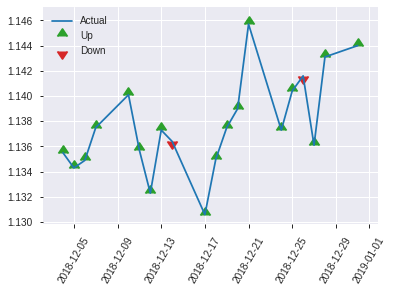


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.16435439286171616
RMSE: 0.40540645389746344
LogLoss: 0.4883094142041894
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.87097666550136
Residual deviance: 250.0144200725449
AIC: 352.0144200725449
AUC: 0.838949938949939
pr_auc: 0.8494870149394032
Gini: 0.6778998778998779
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3941527838238372: 


,0,1,Error,Rate
0,74.0,52.0,0.4127,(52.0/126.0)
1,15.0,115.0,0.1154,(15.0/130.0)
Total,89.0,167.0,0.2617,(67.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3941528,0.7744108,166.0
max f2,0.2149469,0.8719346,213.0
max f0point5,0.6127505,0.7995951,90.0
max accuracy,0.6127505,0.7539062,90.0
max precision,0.9901314,1.0,0.0
max recall,0.1142888,1.0,231.0
max specificity,0.9901314,1.0,0.0
max absolute_mcc,0.6127505,0.5352410,90.0
max min_per_class_accuracy,0.5055252,0.7307692,127.0
max mean_per_class_accuracy,0.6127505,0.7562271,90.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9704830,1.9692308,1.9692308,1.0,0.9811659,1.0,0.9811659,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9675868,1.9692308,1.9692308,1.0,0.9679044,1.0,0.9745352,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9502008,1.9692308,1.9692308,1.0,0.9630442,1.0,0.9716624,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9421960,1.9692308,1.9692308,1.0,0.9438514,1.0,0.9640776,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9367127,1.9692308,1.9692308,1.0,0.9392436,1.0,0.9602570,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8671117,1.8177515,1.8934911,0.9230769,0.9100994,0.9615385,0.9351782,0.0923077,0.1923077,81.7751479,89.3491124
,7,0.1523438,0.8239823,1.9692308,1.9187377,1.0,0.8490806,0.9743590,0.9064790,0.1,0.2923077,96.9230769,91.8737673
,8,0.203125,0.7528624,1.6662722,1.8556213,0.8461538,0.7882911,0.9423077,0.8769320,0.0846154,0.3769231,66.6272189,85.5621302
,9,0.3007812,0.6551334,1.5753846,1.7646354,0.8,0.7033358,0.8961039,0.8205696,0.1538462,0.5307692,57.5384615,76.4635365
,10,0.4023438,0.5810877,1.1360947,1.6059746,0.5769231,0.6139044,0.8155340,0.7684017,0.1153846,0.6461538,13.6094675,60.5974608


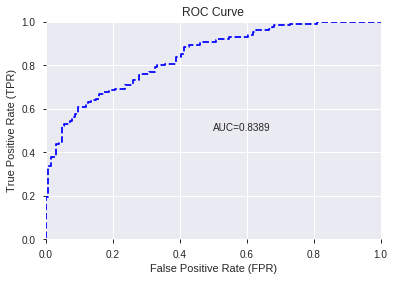

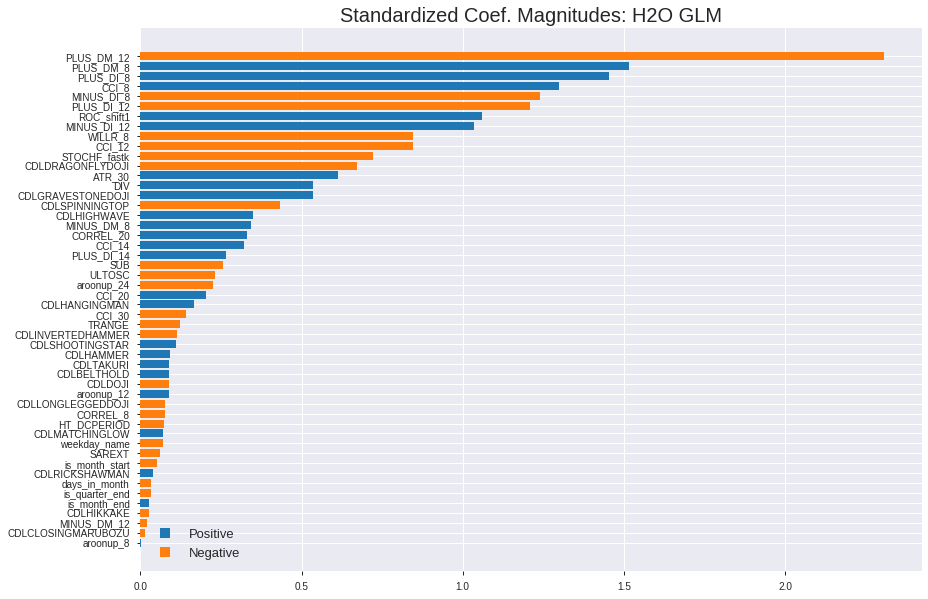

'log_likelihood'
--2019-12-20 18:06:21--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.84.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.84.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


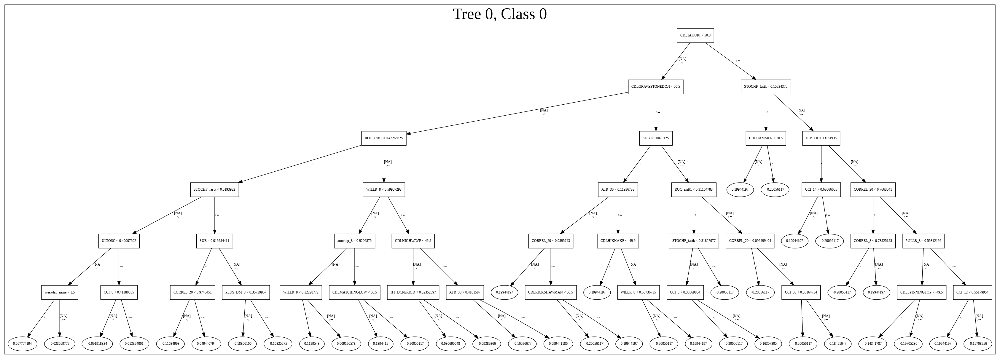

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_180604_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_180604_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_349_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_349

['PLUS_DM_12',
 'PLUS_DM_8',
 'PLUS_DI_8',
 'CCI_8',
 'MINUS_DI_8',
 'PLUS_DI_12',
 'ROC_shift1',
 'MINUS_DI_12',
 'WILLR_8',
 'CCI_12',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'ATR_30',
 'DIV',
 'CDLGRAVESTONEDOJI',
 'CDLSPINNINGTOP',
 'CDLHIGHWAVE',
 'MINUS_DM_8',
 'CORREL_20',
 'CCI_14',
 'PLUS_DI_14',
 'SUB',
 'ULTOSC',
 'aroonup_24',
 'CCI_20',
 'CDLHANGINGMAN',
 'CCI_30',
 'TRANGE',
 'CDLINVERTEDHAMMER',
 'CDLSHOOTINGSTAR',
 'CDLHAMMER',
 'CDLTAKURI',
 'CDLBELTHOLD',
 'CDLDOJI',
 'aroonup_12',
 'CDLLONGLEGGEDDOJI',
 'CORREL_8',
 'HT_DCPERIOD',
 'CDLMATCHINGLOW',
 'weekday_name',
 'SAREXT',
 'is_month_start',
 'CDLRICKSHAWMAN',
 'days_in_month',
 'is_quarter_end',
 'is_month_end',
 'CDLHIKKAKE',
 'MINUS_DM_12',
 'CDLCLOSINGMARUBOZU',
 'aroonup_8']

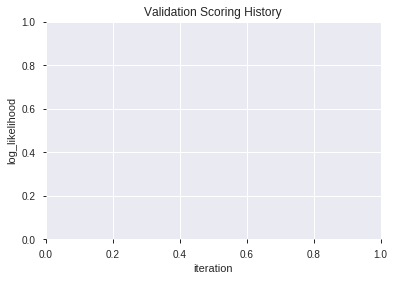

In [240]:
# All algos with top DeepLearning features
model_train(feature_name='DLF',model_algo=None,features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_180628_model_1,0.915751,0.394027,0.160012,0.355742,0.126553


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,5.482479,1.000000,0.074876
1,LINEARREG_ANGLE_30,1.222296,0.222946,0.016693
2,LINEARREG_SLOPE_30,1.220358,0.222592,0.016667
3,DIV,0.886525,0.161702,0.012108
4,MACDEXT_hist,0.796274,0.145240,0.010875
...,...,...,...,...
934,BBANDS_upperband_24_2_2,0.000476,0.000087,0.000007
935,BBANDS_lowerband_8_3_4,0.000275,0.000050,0.000004
936,BBANDS_middleband_24_3_2,0.000166,0.000030,0.000002
937,BBANDS_lowerband_14_1_4,0.000131,0.000024,0.000002


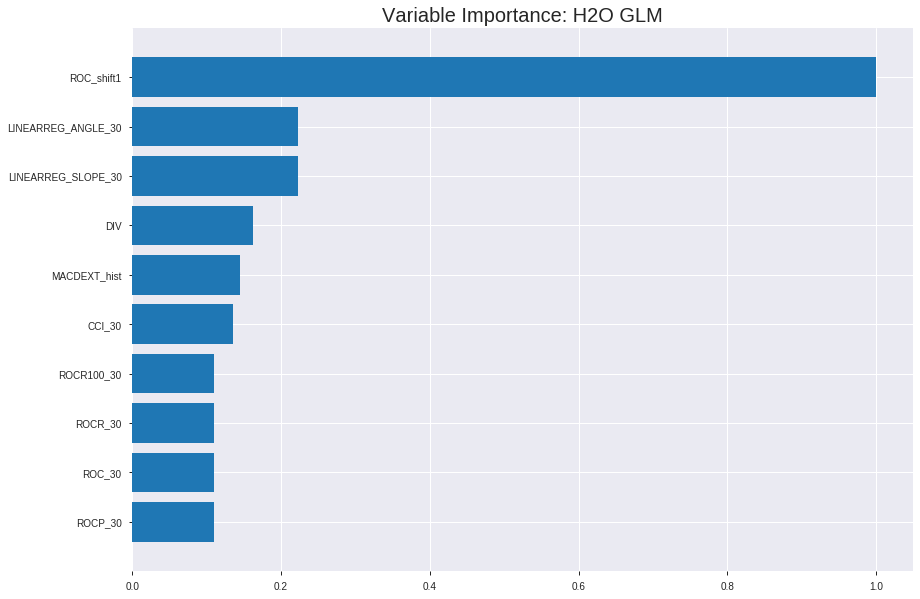

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_180628_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.11410950439844592
RMSE: 0.33780098341841147
LogLoss: 0.36171233841754047
Null degrees of freedom: 1786
Residual degrees of freedom: 847
Null deviance: 2477.294033375748
Residual deviance: 1292.7598975042897
AIC: 3172.7598975042897
AUC: 0.9247234247234247
pr_auc: 0.9168850736209974
Gini: 0.8494468494468495
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4632275712521331: 


,0,1,Error,Rate
0,731.0,160.0,0.1796,(160.0/891.0)
1,120.0,776.0,0.1339,(120.0/896.0)
Total,851.0,936.0,0.1567,(280.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4632276,0.8471616,213.0
max f2,0.2950363,0.9110879,276.0
max f0point5,0.5980675,0.8635448,166.0
max accuracy,0.5166507,0.8455512,194.0
max precision,0.9998217,1.0,0.0
max recall,0.0842219,1.0,358.0
max specificity,0.9998217,1.0,0.0
max absolute_mcc,0.5166507,0.6912925,194.0
max min_per_class_accuracy,0.5025435,0.8451178,200.0
max mean_per_class_accuracy,0.5166507,0.8455813,194.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9971089,1.9944196,1.9944196,1.0,0.9985375,1.0,0.9985375,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9950540,1.9944196,1.9944196,1.0,0.9962412,1.0,0.9973893,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9919908,1.9944196,1.9944196,1.0,0.9938056,1.0,0.9961948,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9876261,1.9944196,1.9944196,1.0,0.9895498,1.0,0.9945335,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9821810,1.9944196,1.9944196,1.0,0.9850318,1.0,0.9926332,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9455412,1.9720104,1.9832776,0.9887640,0.9656222,0.9944134,0.9792031,0.0982143,0.1986607,97.2010433,98.3277634
,7,0.1499720,0.9081873,1.9271920,1.9646522,0.9662921,0.9282631,0.9850746,0.9622865,0.0959821,0.2946429,92.7192014,96.4652186
,8,0.2003358,0.8608272,1.8614583,1.9387096,0.9333333,0.8848918,0.9720670,0.9428297,0.09375,0.3883929,86.1458333,93.8709597
,9,0.2999440,0.7555694,1.7591229,1.8790707,0.8820225,0.8066909,0.9421642,0.8976194,0.1752232,0.5636161,75.9122943,87.9070746
,10,0.4001119,0.6313107,1.5375973,1.7935830,0.7709497,0.6968513,0.8993007,0.8473572,0.1540179,0.7176339,53.7597267,79.3582980




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.13209667408355152
RMSE: 0.3634510614698374
LogLoss: 0.4152303634890157
Null degrees of freedom: 510
Residual degrees of freedom: -429
Null deviance: 708.506742749742
Residual deviance: 424.3654314857741
AIC: 2304.365431485774
AUC: 0.8932811780947998
pr_auc: 0.8909402057518485
Gini: 0.7865623561895996
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4792350684479676: 


,0,1,Error,Rate
0,222.0,43.0,0.1623,(43.0/265.0)
1,50.0,196.0,0.2033,(50.0/246.0)
Total,272.0,239.0,0.182,(93.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4792351,0.8082474,194.0
max f2,0.1646988,0.8795270,302.0
max f0point5,0.5935482,0.8401222,149.0
max accuracy,0.5029639,0.8219178,183.0
max precision,0.9997124,1.0,0.0
max recall,0.0115523,1.0,389.0
max specificity,0.9997124,1.0,0.0
max absolute_mcc,0.5029639,0.6441507,183.0
max min_per_class_accuracy,0.4687509,0.8008130,197.0
max mean_per_class_accuracy,0.5029639,0.8202869,183.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 45.97 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9955332,2.0772358,2.0772358,1.0,0.9977469,1.0,0.9977469,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9904075,2.0772358,2.0772358,1.0,0.9939436,1.0,0.9960181,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9851700,2.0772358,2.0772358,1.0,0.9878893,1.0,0.9934779,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9778934,2.0772358,2.0772358,1.0,0.9831257,1.0,0.9910131,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9678642,2.0772358,2.0772358,1.0,0.9722393,1.0,0.9874027,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.9342935,1.9174484,1.9973421,0.9230769,0.9516342,0.9615385,0.9695184,0.0975610,0.2032520,91.7448405,99.7342089
,7,0.1506849,0.9024135,1.9941463,1.9963045,0.96,0.9139124,0.9610390,0.9514645,0.0975610,0.3008130,99.4146341,99.6304508
,8,0.2015656,0.8408913,2.0772358,2.0167338,1.0,0.8713226,0.9708738,0.9312345,0.1056911,0.4065041,107.7235772,101.6733760
,9,0.3013699,0.6924977,1.7513949,1.9288618,0.8431373,0.7614225,0.9285714,0.8749981,0.1747967,0.5813008,75.1394867,92.8861789
,10,0.4011742,0.5595880,1.4662841,1.8137815,0.7058824,0.6161511,0.8731707,0.8106020,0.1463415,0.7276423,46.6284075,81.3781479



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:06:30,0.000 sec,2,.16E2,887,1.3634553,1.3634067
,2019-12-20 18:06:31,1.047 sec,4,.11E2,920,1.3560493,1.3558885
,2019-12-20 18:06:32,2.094 sec,6,.82E1,930,1.3466356,1.3462025
,2019-12-20 18:06:33,3.100 sec,8,.6E1,936,1.3348715,1.3339268
,2019-12-20 18:06:34,4.117 sec,10,.44E1,939,1.3205305,1.3187986
---,---,---,---,---,---,---,---
,2019-12-20 18:06:56,26.040 sec,52,.55E-2,940,0.8140706,0.8996423
,2019-12-20 18:06:57,27.087 sec,54,.4E-2,940,0.7886884,0.8798912
,2019-12-20 18:06:58,28.191 sec,56,.29E-2,940,0.7653050,0.8617394
,2019-12-20 18:06:59,29.257 sec,58,.21E-2,940,0.7434857,0.8449730



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.83984375)

('F1', 0.8404669260700389)

('auc', 0.9157509157509157)

('logloss', 0.3940268143800439)

('mean_per_class_error', 0.16001221001221)

('rmse', 0.35574248032551237)

('mse', 0.12655271230814755)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           0
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


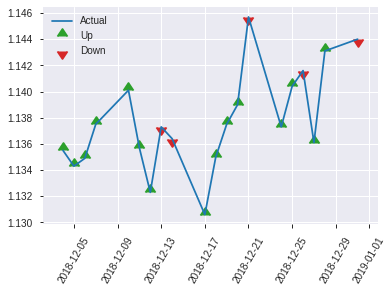


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.12655271230814755
RMSE: 0.35574248032551237
LogLoss: 0.3940268143800439
Null degrees of freedom: 255
Residual degrees of freedom: -684
Null deviance: 354.87097666550136
Residual deviance: 201.7417289625825
AIC: 2081.7417289625823
AUC: 0.9157509157509157
pr_auc: 0.9125271072586728
Gini: 0.8315018315018314
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4480923594616719: 


,0,1,Error,Rate
0,107.0,19.0,0.1508,(19.0/126.0)
1,22.0,108.0,0.1692,(22.0/130.0)
Total,129.0,127.0,0.1602,(41.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4480924,0.8404669,126.0
max f2,0.2411681,0.9155937,178.0
max f0point5,0.5674152,0.8643123,101.0
max accuracy,0.4480924,0.8398438,126.0
max precision,0.9895494,1.0,0.0
max recall,0.0745577,1.0,220.0
max specificity,0.9895494,1.0,0.0
max absolute_mcc,0.4480924,0.6799133,126.0
max min_per_class_accuracy,0.4480924,0.8307692,126.0
max mean_per_class_accuracy,0.4480924,0.8399878,126.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 45.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9879893,1.9692308,1.9692308,1.0,0.9889335,1.0,0.9889335,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9843155,1.9692308,1.9692308,1.0,0.9860252,1.0,0.9874794,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9774111,1.9692308,1.9692308,1.0,0.9803020,1.0,0.9856850,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9716146,1.9692308,1.9692308,1.0,0.9749965,1.0,0.9827700,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9614269,1.9692308,1.9692308,1.0,0.9665890,1.0,0.9802806,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9023677,1.9692308,1.9692308,1.0,0.9297002,1.0,0.9549904,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8136821,1.8177515,1.9187377,0.9230769,0.8615640,0.9743590,0.9238483,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7899085,1.9692308,1.9313609,1.0,0.8015211,0.9807692,0.8932665,0.1,0.3923077,96.9230769,93.1360947
,9,0.3007812,0.6447490,1.6541538,1.8413586,0.84,0.7004808,0.9350649,0.8306737,0.1615385,0.5538462,65.4153846,84.1358641
,10,0.4023438,0.5628159,1.5905325,1.7780433,0.8076923,0.6036347,0.9029126,0.7733629,0.1615385,0.7153846,59.0532544,77.8043316


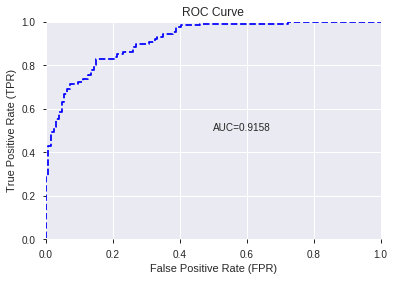

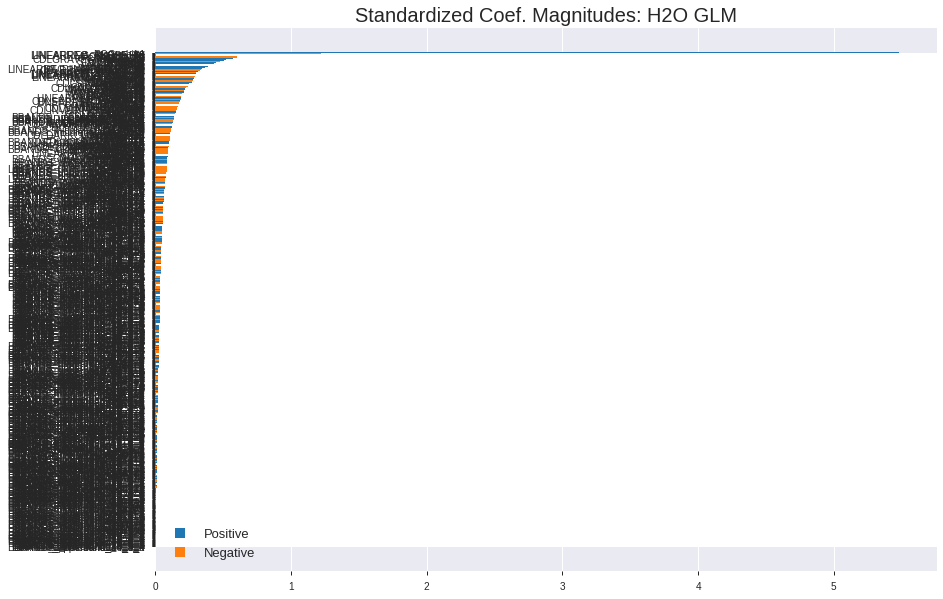

'log_likelihood'
--2019-12-20 18:07:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.141.116
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.141.116|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


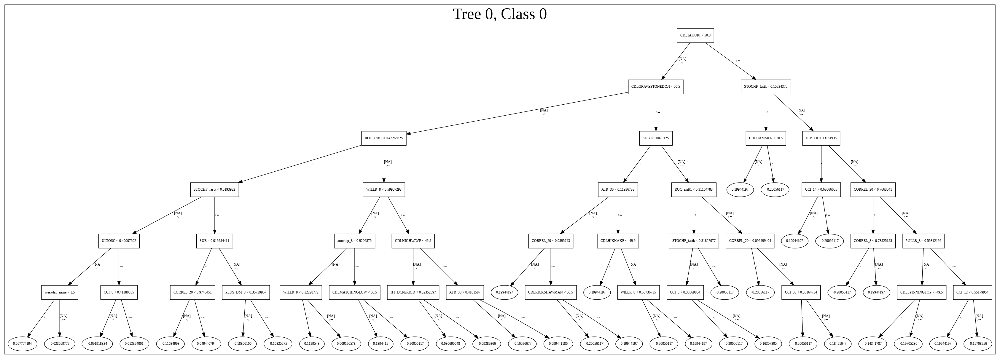

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_180628_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_180628_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_354_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_354

['ROC_shift1',
 'LINEARREG_ANGLE_30',
 'LINEARREG_SLOPE_30',
 'DIV',
 'MACDEXT_hist',
 'CCI_30',
 'ROCR100_30',
 'ROCR_30',
 'ROC_30',
 'ROCP_30',
 'MACDEXT',
 'APO',
 'CDLGRAVESTONEDOJI',
 'CCI_8',
 'STOCHF_fastk',
 'MOM_24',
 'TRIX_14',
 'MINUS_DI_8',
 'MULT',
 'Low',
 'ADD',
 'High',
 'TRIX_12',
 'MEDPRICE',
 'DX_30',
 'MINUS_DM_8',
 'VAR_12',
 'WILLR_30',
 'MIDPRICE_30',
 'LINEARREG_INTERCEPT_30',
 'HT_PHASOR_inphase',
 'BOP',
 'WILLR_12',
 'CDLDRAGONFLYDOJI',
 'ADX_8',
 'MIDPRICE_14',
 'STOCH_slowd',
 'LINEARREG_SLOPE_20',
 'LINEARREG_ANGLE_20',
 'MAX_30',
 'LINEARREG_ANGLE_24',
 'TRIX_8',
 'MINMAX_max_30',
 'LINEARREG_SLOPE_24',
 'VAR_20',
 'MINMAX_max_8',
 'TAN',
 'SAR_0.2',
 'MINUS_DI_30',
 'PLUS_DM_8']

939

['ROC_shift1',
 'LINEARREG_ANGLE_30',
 'LINEARREG_SLOPE_30',
 'DIV',
 'MACDEXT_hist',
 'CCI_30',
 'ROCR100_30',
 'ROCR_30',
 'ROC_30',
 'ROCP_30',
 'MACDEXT',
 'APO',
 'CDLGRAVESTONEDOJI',
 'CCI_8',
 'STOCHF_fastk',
 'MOM_24',
 'TRIX_14',
 'MINUS_DI_8',
 'MULT',
 'Low',
 'ADD',
 'High',
 'TRIX_12',
 'MEDPRICE',
 'DX_30',
 'MINUS_DM_8',
 'VAR_12',
 'WILLR_30',
 'MIDPRICE_30',
 'LINEARREG_INTERCEPT_30',
 'HT_PHASOR_inphase',
 'BOP',
 'WILLR_12',
 'CDLDRAGONFLYDOJI',
 'ADX_8',
 'MIDPRICE_14',
 'STOCH_slowd',
 'LINEARREG_SLOPE_20',
 'LINEARREG_ANGLE_20',
 'MAX_30',
 'LINEARREG_ANGLE_24',
 'TRIX_8',
 'MINMAX_max_30',
 'LINEARREG_SLOPE_24',
 'VAR_20',
 'MINMAX_max_8',
 'TAN',
 'SAR_0.2',
 'MINUS_DI_30',
 'PLUS_DM_8']

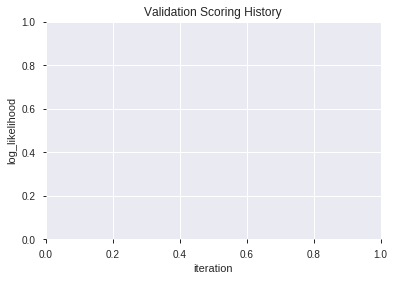

In [241]:
# GLM
features_list = model_train(feature_name='All',model_algo="GLM")
display(features_list[:model_selected_features])
display(len(features_list),features_list[:model_selected_features])

In [242]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [243]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [244]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

In [245]:
# DRF with top GLM features
model_train(feature_name='GLMF',model_algo="DRF",features_list = features_list[:model_selected_features])

[]

In [246]:
# GBM with top GLM features
model_train(feature_name='GLMF',model_algo="GBM",features_list = features_list[:model_selected_features])

[]

In [247]:
# StackedEnsemble with top GLM features
model_train(feature_name='GLMF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

[]

In [248]:
# All algos with top GLM features
model_train(feature_name='GLMF',model_algo=None,features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20191220_180727,0.865507,0.472673,0.257082,0.392374,0.153957
1,XGBoost_1_AutoML_20191220_180727,0.857265,0.482200,0.256838,0.397580,0.158070
2,XGBoost_grid_1_AutoML_20191220_180727_model_4,0.856471,0.488144,0.236874,0.399964,0.159972
3,XGBoost_3_AutoML_20191220_180727,0.852930,0.480711,0.269231,0.397749,0.158204
4,XGBoost_grid_1_AutoML_20191220_180727_model_2,0.852625,0.481716,0.264286,0.398026,0.158425
5,XGBoost_grid_1_AutoML_20191220_180727_model_7,0.852564,0.479846,0.256105,0.398164,0.158535
6,XGBoost_grid_1_AutoML_20191220_180727_model_3,0.850549,0.485345,0.265140,0.401516,0.161215
7,XGBoost_grid_1_AutoML_20191220_180727_model_1,0.849817,0.479971,0.261050,0.398002,0.158405
8,XGBoost_grid_1_AutoML_20191220_180727_model_6,0.847192,0.493120,0.226740,0.403518,0.162827
9,XGBoost_grid_1_AutoML_20191220_180727_model_5,0.836630,0.496228,0.276313,0.410096,0.168179


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,1305.612183,1.000000,0.105542
1,CDLGRAVESTONEDOJI,631.274841,0.483509,0.051030
2,CDLDRAGONFLYDOJI,629.427551,0.482094,0.050881
3,CDLTAKURI,608.046204,0.465717,0.049153
4,STOCHF_fastk,541.081116,0.414427,0.043739
5,ROC_30,374.643341,0.286948,0.030285
6,CCI_8,319.293030,0.244554,0.025811
7,MOM_30,318.565948,0.243997,0.025752
8,WILLR_8,286.898041,0.219742,0.023192
9,WILLR_12,280.461060,0.214812,0.022672


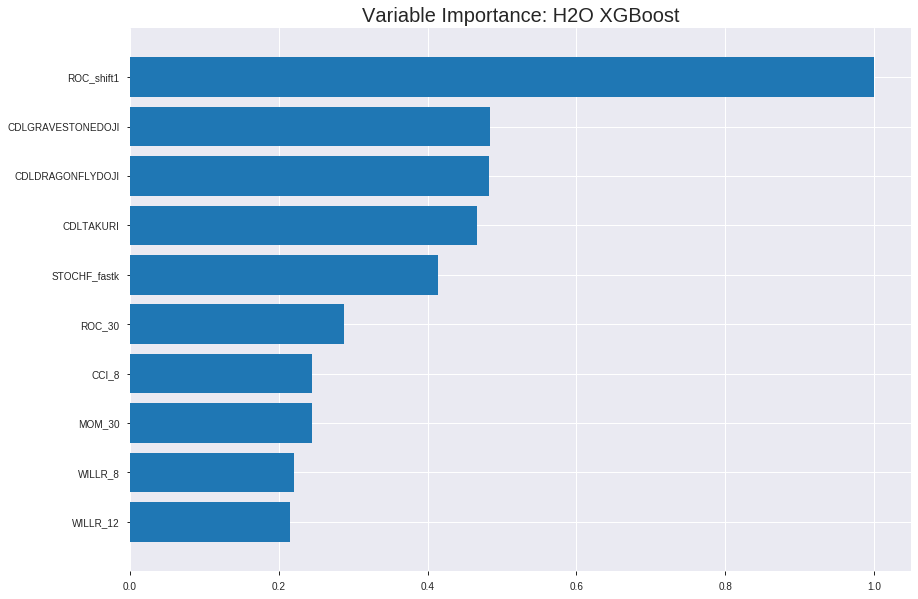

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20191220_180727


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.08119469317232521
RMSE: 0.2849468251662496
LogLoss: 0.30286584929235055
Mean Per-Class Error: 0.05763738576238575
AUC: 0.981354968334135
pr_auc: 0.9799841391991928
Gini: 0.9627099366682701
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5059967041015625: 


,0,1,Error,Rate
0,836.0,55.0,0.0617,(55.0/891.0)
1,48.0,848.0,0.0536,(48.0/896.0)
Total,884.0,903.0,0.0576,(103.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5059967,0.9427460,197.0
max f2,0.4483412,0.9545855,214.0
max f0point5,0.6047292,0.9493210,162.0
max accuracy,0.5209832,0.9423615,193.0
max precision,0.9715245,1.0,0.0
max recall,0.1513382,1.0,338.0
max specificity,0.9715245,1.0,0.0
max absolute_mcc,0.5059967,0.8847467,197.0
max min_per_class_accuracy,0.5209832,0.9419643,193.0
max mean_per_class_accuracy,0.5209832,0.9423626,193.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9565596,1.9944196,1.9944196,1.0,0.9621417,1.0,0.9621417,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9453164,1.9944196,1.9944196,1.0,0.9503875,1.0,0.9562646,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9367060,1.9944196,1.9944196,1.0,0.9418169,1.0,0.9514487,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9293761,1.9944196,1.9944196,1.0,0.9339043,1.0,0.9470626,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9215538,1.9944196,1.9944196,1.0,0.9254883,1.0,0.9427477,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8841492,1.9944196,1.9944196,1.0,0.9003523,1.0,0.9216684,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8506728,1.9944196,1.9944196,1.0,0.8688012,1.0,0.9041118,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.8140884,1.9722594,1.9888486,0.9888889,0.8314461,0.9972067,0.8858439,0.0993304,0.3984375,97.2259425,98.8848638
,9,0.2999440,0.7470758,1.9496012,1.9758150,0.9775281,0.7801746,0.9906716,0.8507522,0.1941964,0.5926339,94.9601224,97.5814982
,10,0.4001119,0.6579897,1.8941416,1.9553681,0.9497207,0.7084529,0.9804196,0.8151276,0.1897321,0.7823661,89.4141560,95.5368069




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1508157967488526
RMSE: 0.38835009559526645
LogLoss: 0.46673036962649267
Mean Per-Class Error: 0.20003067955207854
AUC: 0.8643350207086977
pr_auc: 0.8464018517986025
Gini: 0.7286700414173954
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5081872344017029: 


,0,1,Error,Rate
0,215.0,50.0,0.1887,(50.0/265.0)
1,52.0,194.0,0.2114,(52.0/246.0)
Total,267.0,244.0,0.1996,(102.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5081872,0.7918367,194.0
max f2,0.2408486,0.8623242,295.0
max f0point5,0.6699988,0.8131868,128.0
max accuracy,0.5154535,0.8003914,190.0
max precision,0.9608565,1.0,0.0
max recall,0.0827796,1.0,375.0
max specificity,0.9608565,1.0,0.0
max absolute_mcc,0.5081872,0.6001320,194.0
max min_per_class_accuracy,0.4959339,0.7886792,198.0
max mean_per_class_accuracy,0.5081872,0.7999693,194.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 48.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9390912,2.0772358,2.0772358,1.0,0.9507096,1.0,0.9507096,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9275830,2.0772358,2.0772358,1.0,0.9318455,1.0,0.9421350,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9143228,1.6617886,1.9474085,0.8,0.9192391,0.9375,0.9349801,0.0162602,0.0609756,66.1788618,94.7408537
,4,0.0410959,0.9099375,2.0772358,1.9783198,1.0,0.9118726,0.9523810,0.9294783,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.9028012,2.0772358,1.9973421,1.0,0.9068540,0.9615385,0.9251275,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8673349,1.9174484,1.9573952,0.9230769,0.8846612,0.9423077,0.9048943,0.0975610,0.1991870,91.7448405,95.7395247
,7,0.1506849,0.8260919,1.9110569,1.9423503,0.92,0.8453455,0.9350649,0.8855603,0.0934959,0.2926829,91.1056911,94.2350333
,8,0.2015656,0.7885674,1.7576610,1.8957297,0.8461538,0.8096523,0.9126214,0.8663990,0.0894309,0.3821138,75.7661038,89.5729734
,9,0.3013699,0.6898469,1.8328551,1.8749076,0.8823529,0.7412559,0.9025974,0.8249555,0.1829268,0.5650407,83.2855093,87.4907613
,10,0.4011742,0.5742027,1.1404432,1.6921872,0.5490196,0.6317755,0.8146341,0.7768961,0.1138211,0.6788618,14.0443169,69.2187190



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:07:32,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-20 18:07:33,0.454 sec,5.0,0.4681374,0.6310100,0.8742879,0.8656595,1.9944196,0.2137661,0.4710506,0.6365379,0.8431124,0.8261570,2.0772358,0.2348337
,2019-12-20 18:07:33,0.786 sec,10.0,0.4466523,0.5900712,0.8937997,0.8832368,1.9944196,0.1785115,0.4548045,0.6050833,0.8394616,0.8182905,2.0772358,0.2250489
,2019-12-20 18:07:33,1.138 sec,15.0,0.4281850,0.5551826,0.9061867,0.9003814,1.9944196,0.1583660,0.4429743,0.5819359,0.8421154,0.8219125,2.0772358,0.2524462
,2019-12-20 18:07:34,1.500 sec,20.0,0.4129216,0.5262146,0.9131844,0.9051103,1.9944196,0.1533296,0.4343131,0.5640836,0.8364703,0.8153766,1.7310298,0.2289628
---,---,---,---,---,---,---,---,---,---,---,---,---,---,---,---
,2019-12-20 18:07:39,6.998 sec,100.0,0.3002251,0.3266253,0.9754283,0.9730838,1.9944196,0.0671517,0.3917807,0.4731575,0.8613131,0.8482521,2.0772358,0.1956947
,2019-12-20 18:07:40,7.315 sec,105.0,0.2959511,0.3200430,0.9771719,0.9759319,1.9944196,0.0632345,0.3902206,0.4704464,0.8630081,0.8490154,2.0772358,0.1956947
,2019-12-20 18:07:40,7.659 sec,110.0,0.2921513,0.3139722,0.9786418,0.9786268,1.9944196,0.0621153,0.3896575,0.4690724,0.8628547,0.8491198,2.0772358,0.1996086
,2019-12-20 18:07:40,7.983 sec,115.0,0.2887474,0.3088696,0.9801550,0.9788915,1.9944196,0.0598769,0.3894234,0.4689478,0.8627780,0.8441958,2.0772358,0.1996086



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
ROC_shift1,1305.6121826,1.0,0.1055417
CDLGRAVESTONEDOJI,631.2748413,0.4835087,0.0510303
CDLDRAGONFLYDOJI,629.4275513,0.4820938,0.0508810
CDLTAKURI,608.0462036,0.4657173,0.0491526
STOCHF_fastk,541.0811157,0.4144271,0.0437393
---,---,---,---
BBANDS_upperband_12_1_5,1.1982822,0.0009178,0.0000969
BBANDS_lowerband_24_5_3,1.0855064,0.0008314,0.0000877
KAMA_24,1.0538101,0.0008071,0.0000852
BBANDS_lowerband_14_0_3,0.9552231,0.0007316,0.0000772



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7734375)

('F1', 0.7909967845659165)

('auc', 0.8655067155067155)

('logloss', 0.472673286968806)

('mean_per_class_error', 0.2238095238095239)

('rmse', 0.3923735803649945)

('mse', 0.1539570265684448)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        0
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


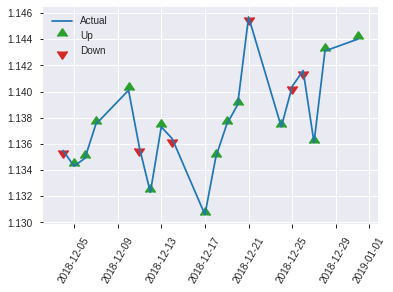


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.1539570265684448
RMSE: 0.3923735803649945
LogLoss: 0.472673286968806
Mean Per-Class Error: 0.2238095238095239
AUC: 0.8655067155067155
pr_auc: 0.8784942112324028
Gini: 0.7310134310134311
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.28655776381492615: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,7.0,123.0,0.0538,(7.0/130.0)
Total,75.0,181.0,0.2539,(65.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2865578,0.7909968,180.0
max f2,0.2709396,0.8806818,183.0
max f0point5,0.6727307,0.8372093,74.0
max accuracy,0.6249188,0.7734375,83.0
max precision,0.9662867,1.0,0.0
max recall,0.0556863,1.0,245.0
max specificity,0.9662867,1.0,0.0
max absolute_mcc,0.6249188,0.5881550,83.0
max min_per_class_accuracy,0.4736927,0.7615385,126.0
max mean_per_class_accuracy,0.6249188,0.7761905,83.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9495953,1.9692308,1.9692308,1.0,0.9564073,1.0,0.9564073,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9202884,1.9692308,1.9692308,1.0,0.9383736,1.0,0.9473904,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9083730,1.9692308,1.9692308,1.0,0.9161391,1.0,0.9395776,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8853987,1.9692308,1.9692308,1.0,0.8965278,1.0,0.9278367,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8774424,1.9692308,1.9692308,1.0,0.8819817,1.0,0.9207821,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8448465,1.9692308,1.9692308,1.0,0.8659173,1.0,0.8933497,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7862900,1.9692308,1.9692308,1.0,0.8088592,1.0,0.8651862,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7407876,1.9692308,1.9692308,1.0,0.7563453,1.0,0.8379760,0.1,0.4,96.9230769,96.9230769
,9,0.3007812,0.6514344,1.5753846,1.8413586,0.8,0.7028449,0.9350649,0.7941023,0.1538462,0.5538462,57.5384615,84.1358641
,10,0.4023438,0.5673671,0.9846154,1.6250934,0.5,0.6112443,0.8252427,0.7479439,0.1,0.6538462,-1.5384615,62.5093353


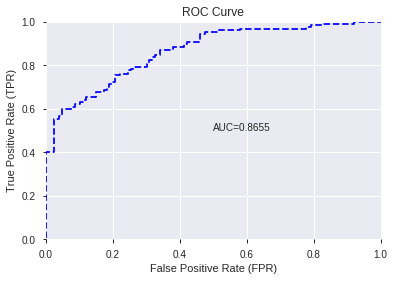

This function is available for GLM models only


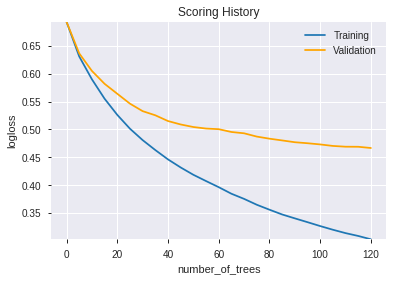

--2019-12-20 18:08:40--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.200.11
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.200.11|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


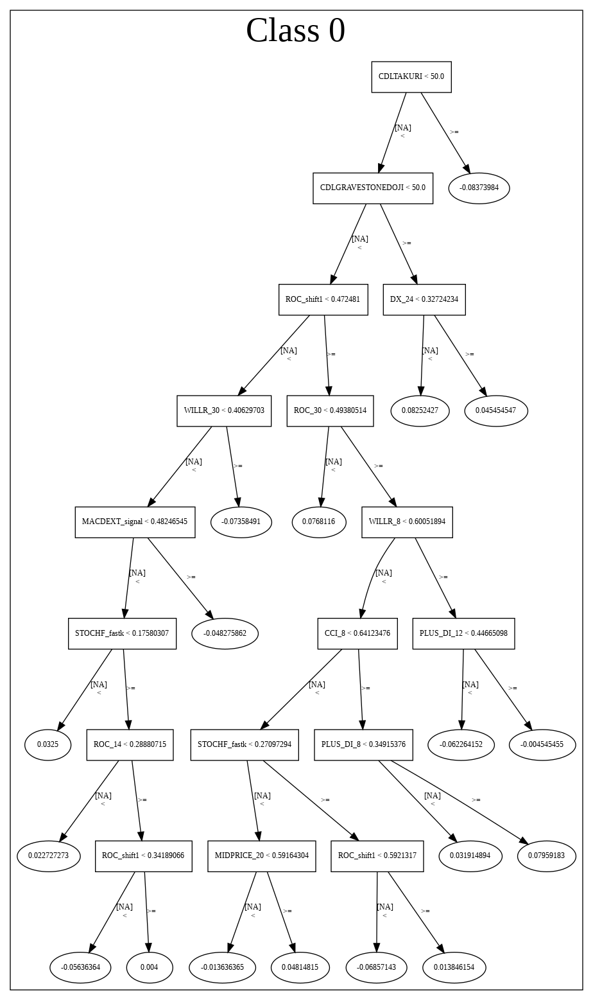

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20191220_180727',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20191220_180727',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_359_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_359_sid_be3a',
   'ty

327

['ROC_shift1',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'ROC_30',
 'CCI_8',
 'MOM_30',
 'WILLR_8',
 'WILLR_12',
 'ULTOSC',
 'ROCP_30',
 'CORREL_20',
 'WILLR_14',
 'STOCH_slowd',
 'WILLR_30',
 'PLUS_DI_8',
 'aroondown_8',
 'STOCHRSI_fastd',
 'STOCH_slowk',
 'CCI_24',
 'LINEARREG_ANGLE_8',
 'DIV',
 'ADX_8',
 'CCI_12',
 'BOP',
 'CORREL_8',
 'MINUS_DI_8',
 'AROONOSC_30',
 'CCI_14',
 'SUB',
 'DX_12',
 'HT_PHASOR_inphase',
 'DX_8',
 'aroonup_30',
 'HT_DCPERIOD',
 'CORREL_30',
 'BETA_24',
 'dayofyear',
 'STDDEV_20',
 'ROCR_30',
 'aroondown_14',
 'HT_PHASOR_quadrature',
 'ADX_12',
 'PLUS_DI_14',
 'ROC_24',
 'CMO_30',
 'STDDEV_12',
 'ADX_24',
 'CCI_30']

In [249]:
# XGBoost
features_list = model_train(feature_name='All',model_algo="XGBoost")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_1_AutoML_20191220_180847,0.862515,0.455689,0.216667,0.389330,0.151578
1,DeepLearning_grid_1_AutoML_20191220_180847_model_9,0.857143,0.478030,0.215446,0.398055,0.158448
2,DeepLearning_grid_1_AutoML_20191220_180847_model_8,0.852808,0.479078,0.237118,0.400518,0.160415
3,DeepLearning_grid_1_AutoML_20191220_180847_model_6,0.833211,0.505239,0.250916,0.412864,0.170456
4,DeepLearning_grid_1_AutoML_20191220_180847_model_5,0.824969,0.506854,0.309035,0.414176,0.171542
5,DeepLearning_grid_1_AutoML_20191220_180847_model_3,0.821368,0.509001,0.308303,0.417388,0.174213
6,DeepLearning_grid_1_AutoML_20191220_180847_model_4,0.819902,0.555753,0.284493,0.424941,0.180575
7,DeepLearning_grid_1_AutoML_20191220_180847_model_7,0.818926,0.623387,0.301099,0.452893,0.205112
8,DeepLearning_grid_1_AutoML_20191220_180847_model_1,0.812088,0.558286,0.316606,0.431587,0.186267
9,DeepLearning_grid_1_AutoML_20191220_180847_model_2,0.811661,0.551165,0.259463,0.434142,0.188479


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,1.000000,1.000000,0.047366
1,ADX_24,0.603348,0.603348,0.028578
2,DIV,0.544213,0.544213,0.025777
3,STOCHF_fastk,0.521232,0.521232,0.024689
4,HT_PHASOR_quadrature,0.514470,0.514470,0.024368
5,WILLR_14,0.512882,0.512882,0.024293
6,WILLR_12,0.507264,0.507264,0.024027
7,BOP,0.504777,0.504777,0.023909
8,PLUS_DI_8,0.501750,0.501750,0.023766
9,ROCP_30,0.498707,0.498707,0.023622


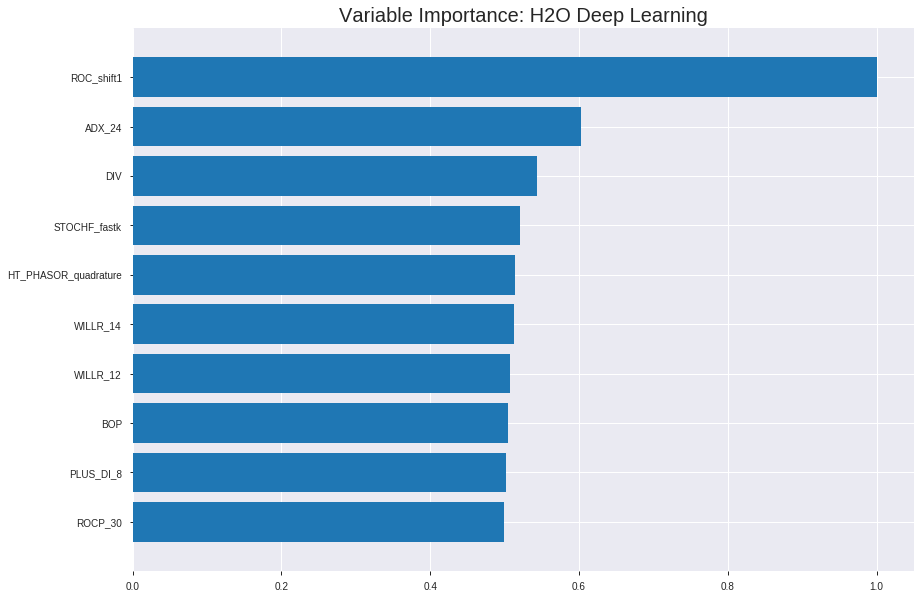

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_1_AutoML_20191220_180847


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1465201166753371
RMSE: 0.38277946219113834
LogLoss: 0.4504689260796692
Mean Per-Class Error: 0.20770452541285878
AUC: 0.8720219306156807
pr_auc: 0.8682455804280356
Gini: 0.7440438612313613
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47731914396037084: 


,0,1,Error,Rate
0,658.0,233.0,0.2615,(233.0/891.0)
1,141.0,755.0,0.1574,(141.0/896.0)
Total,799.0,988.0,0.2093,(374.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4773191,0.8014862,209.0
max f2,0.1901910,0.8716974,320.0
max f0point5,0.6392704,0.8062055,149.0
max accuracy,0.5008367,0.7923895,201.0
max precision,0.9990064,1.0,0.0
max recall,0.0200279,1.0,389.0
max specificity,0.9990064,1.0,0.0
max absolute_mcc,0.5008367,0.5859784,201.0
max min_per_class_accuracy,0.5409516,0.7823661,186.0
max mean_per_class_accuracy,0.5008367,0.7922955,201.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 52.82 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9944804,1.9944196,1.9944196,1.0,0.9966243,1.0,0.9966243,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9901691,1.9944196,1.9944196,1.0,0.9927212,1.0,0.9946727,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9868620,1.9944196,1.9944196,1.0,0.9885066,1.0,0.9926173,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9841641,1.9944196,1.9944196,1.0,0.9855336,1.0,0.9908464,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9808813,1.9944196,1.9944196,1.0,0.9825945,1.0,0.9891960,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9585731,1.8375552,1.9164256,0.9213483,0.9698763,0.9608939,0.9795901,0.0915179,0.1919643,83.7555177,91.6425579
,7,0.1499720,0.9238363,1.8599644,1.8976754,0.9325843,0.9435690,0.9514925,0.9676279,0.0926339,0.2845982,85.9964386,89.7675406
,8,0.2003358,0.8802139,1.7506572,1.8607155,0.8777778,0.9053059,0.9329609,0.9519604,0.0881696,0.3727679,75.0657242,86.0715533
,9,0.2999440,0.7786457,1.5910539,1.7711637,0.7977528,0.8289859,0.8880597,0.9111218,0.1584821,0.53125,59.1053872,77.1163713
,10,0.4001119,0.6745365,1.3927511,1.6764283,0.6983240,0.7267312,0.8405594,0.8649597,0.1395089,0.6707589,39.2751147,67.6428259




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.16258833041018897
RMSE: 0.40322243292032867
LogLoss: 0.494992238691709
Mean Per-Class Error: 0.2399447768062586
AUC: 0.84579690136524
pr_auc: 0.8385489645532133
Gini: 0.69159380273048
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37524974845011116: 


,0,1,Error,Rate
0,162.0,103.0,0.3887,(103.0/265.0)
1,29.0,217.0,0.1179,(29.0/246.0)
Total,191.0,320.0,0.2583,(132.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3752497,0.7667845,249.0
max f2,0.1701240,0.8609510,318.0
max f0point5,0.7447348,0.7903226,122.0
max accuracy,0.6695175,0.7632094,145.0
max precision,0.9980277,1.0,0.0
max recall,0.0149457,1.0,393.0
max specificity,0.9980277,1.0,0.0
max absolute_mcc,0.7447348,0.5368545,122.0
max min_per_class_accuracy,0.5448072,0.7479675,188.0
max mean_per_class_accuracy,0.5113917,0.7600552,198.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.72 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9928894,2.0772358,2.0772358,1.0,0.9949506,1.0,0.9949506,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9885405,2.0772358,2.0772358,1.0,0.9906431,1.0,0.9929927,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9855674,2.0772358,2.0772358,1.0,0.9860327,1.0,0.9908177,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9835165,2.0772358,2.0772358,1.0,0.9846082,1.0,0.9893392,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9815085,2.0772358,2.0772358,1.0,0.9827390,1.0,0.9880700,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.9595120,1.8375547,1.9573952,0.8846154,0.9717642,0.9423077,0.9799171,0.0934959,0.1991870,83.7554722,95.7395247
,7,0.1506849,0.9304625,1.9110569,1.9423503,0.92,0.9458486,0.9350649,0.9688559,0.0934959,0.2926829,91.1056911,94.2350333
,8,0.2015656,0.8856258,1.8375547,1.9158971,0.8846154,0.9075636,0.9223301,0.9533841,0.0934959,0.3861789,83.7554722,91.5897072
,9,0.3013699,0.7767630,1.5884744,1.8074649,0.7647059,0.8211407,0.8701299,0.9095892,0.1585366,0.5447154,58.8474414,80.7464893
,10,0.4011742,0.6523522,1.2219034,1.6617886,0.5882353,0.7148788,0.8,0.8611490,0.1219512,0.6666667,22.1903396,66.1788618



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:08:47,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-20 18:08:47,0.067 sec,127642 obs/sec,1.0,1,1787.0,0.4972645,0.7358446,0.0109044,0.7027599,0.7051265,1.7728175,0.4012311,0.5159738,0.8225641,-0.0663903,0.7058214,0.7191876,2.0772358,0.4520548
,2019-12-20 18:08:47,0.218 sec,124097 obs/sec,10.0,10,17870.0,0.3827795,0.4504689,0.4139149,0.8720219,0.8682456,1.9944196,0.2092893,0.4032224,0.4949922,0.3487463,0.8457969,0.8385490,2.0772358,0.2583170


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
ROC_shift1,1.0,1.0,0.0473659
ADX_24,0.6033481,0.6033481,0.0285781
DIV,0.5442132,0.5442132,0.0257771
STOCHF_fastk,0.5212316,0.5212316,0.0246886
HT_PHASOR_quadrature,0.5144697,0.5144697,0.0243683
---,---,---,---
aroondown_14,0.3081101,0.3081101,0.0145939
STOCH_slowd,0.2986006,0.2986006,0.0141435
HT_PHASOR_inphase,0.2847310,0.2847310,0.0134865
WILLR_8,0.2733018,0.2733018,0.0129452



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.78515625)

('F1', 0.8096885813148789)

('auc', 0.8625152625152624)

('logloss', 0.45568883121017423)

('mean_per_class_error', 0.21544566544566546)

('rmse', 0.38933039936846825)

('mse', 0.15157815987241097)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


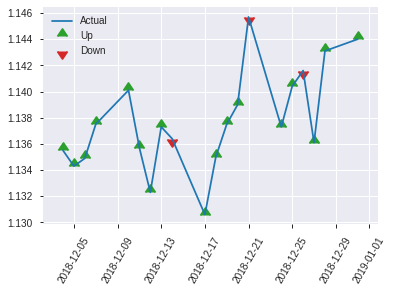


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.15157815987241097
RMSE: 0.38933039936846825
LogLoss: 0.45568883121017423
Mean Per-Class Error: 0.21544566544566546
AUC: 0.8625152625152624
pr_auc: 0.8609539812140012
Gini: 0.7250305250305249
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3786034269309618: 


,0,1,Error,Rate
0,84.0,42.0,0.3333,(42.0/126.0)
1,13.0,117.0,0.1,(13.0/130.0)
Total,97.0,159.0,0.2148,(55.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3786034,0.8096886,158.0
max f2,0.2110536,0.8835616,209.0
max f0point5,0.7433294,0.7819905,72.0
max accuracy,0.4655092,0.7851562,138.0
max precision,0.9944965,1.0,0.0
max recall,0.0518071,1.0,234.0
max specificity,0.9944965,1.0,0.0
max absolute_mcc,0.3786034,0.5839830,158.0
max min_per_class_accuracy,0.5146624,0.7619048,129.0
max mean_per_class_accuracy,0.4655092,0.7845543,138.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 51.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9904082,1.9692308,1.9692308,1.0,0.9924354,1.0,0.9924354,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9855815,1.9692308,1.9692308,1.0,0.9880115,1.0,0.9902235,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9806360,1.9692308,1.9692308,1.0,0.9843761,1.0,0.9887616,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9757103,1.9692308,1.9692308,1.0,0.9775620,1.0,0.9857072,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9685506,1.9692308,1.9692308,1.0,0.9720730,1.0,0.9836096,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9401028,1.9692308,1.9692308,1.0,0.9575440,1.0,0.9705768,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8888620,1.9692308,1.9692308,1.0,0.9118798,1.0,0.9510112,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.8308869,1.2118343,1.7798817,0.6153846,0.8557059,0.9038462,0.9271849,0.0615385,0.3615385,21.1834320,77.9881657
,9,0.3007812,0.7249813,1.5753846,1.7134865,0.8,0.7742473,0.8701299,0.8775298,0.1538462,0.5153846,57.5384615,71.3486513
,10,0.4023438,0.6403096,1.2118343,1.5868559,0.6153846,0.6765695,0.8058252,0.8268020,0.1230769,0.6384615,21.1834320,58.6855863


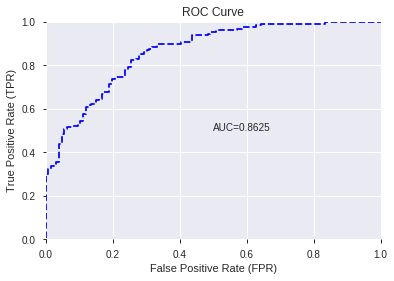

This function is available for GLM models only


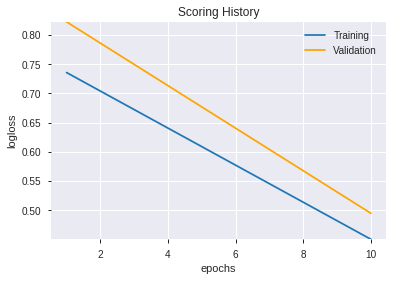

--2019-12-20 18:14:50--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.12.36
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.12.36|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


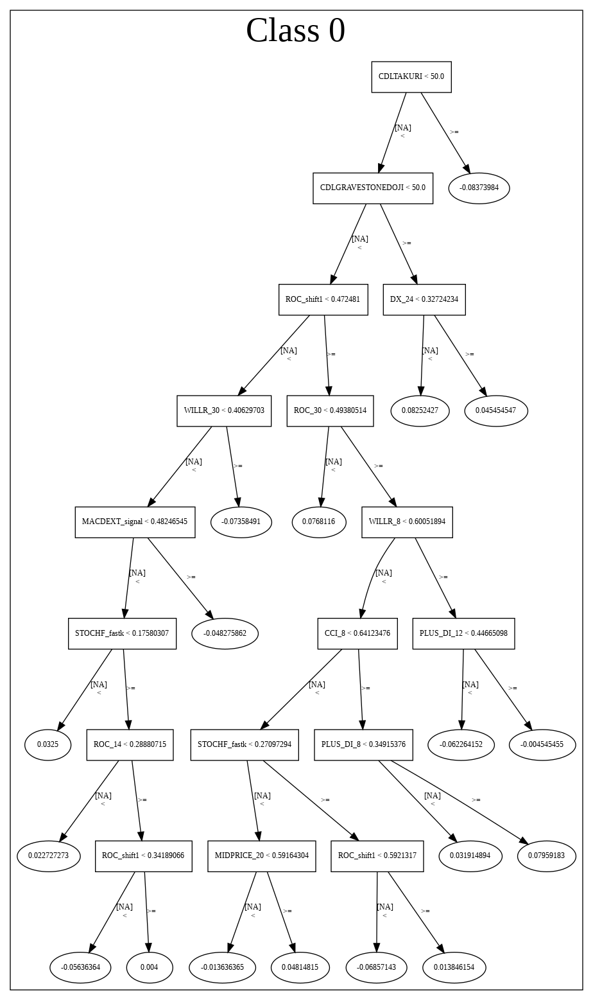

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_1_AutoML_20191220_180847',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_1_AutoML_20191220_180847',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_364_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_364_sid_be3

['ROC_shift1',
 'ADX_24',
 'DIV',
 'STOCHF_fastk',
 'HT_PHASOR_quadrature',
 'WILLR_14',
 'WILLR_12',
 'BOP',
 'PLUS_DI_8',
 'ROCP_30',
 'CDLDRAGONFLYDOJI',
 'DX_12',
 'WILLR_30',
 'MOM_30',
 'CCI_14',
 'STDDEV_12',
 'CCI_30',
 'CORREL_8',
 'SUB',
 'DX_8',
 'CORREL_30',
 'STDDEV_20',
 'CMO_30',
 'MINUS_DI_8',
 'CCI_24',
 'ULTOSC',
 'CDLGRAVESTONEDOJI',
 'ADX_12',
 'aroondown_8',
 'aroonup_30',
 'CCI_12',
 'LINEARREG_ANGLE_8',
 'ROCR_30',
 'STOCH_slowk',
 'ADX_8',
 'AROONOSC_30',
 'CCI_8',
 'CORREL_20',
 'STOCHRSI_fastd',
 'dayofyear',
 'CDLTAKURI',
 'BETA_24',
 'HT_DCPERIOD',
 'PLUS_DI_14',
 'ROC_24',
 'aroondown_14',
 'STOCH_slowd',
 'HT_PHASOR_inphase',
 'WILLR_8',
 'ROC_30']

In [250]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_181502_model_1,0.910073,0.387322,0.193712,0.353993,0.125311


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,6.089453,1.000000,0.228365
1,ROC_30,1.763284,0.289564,0.066126
2,ROCP_30,1.722535,0.282872,0.064598
3,ROCR_30,1.606827,0.263871,0.060259
4,WILLR_30,1.288168,0.211541,0.048309
5,CCI_30,1.269210,0.208428,0.047598
6,LINEARREG_ANGLE_8,0.878951,0.144340,0.032962
7,STOCHF_fastk,0.796797,0.130849,0.029881
8,ROC_24,0.768548,0.126210,0.028822
9,DIV,0.764950,0.125619,0.028687


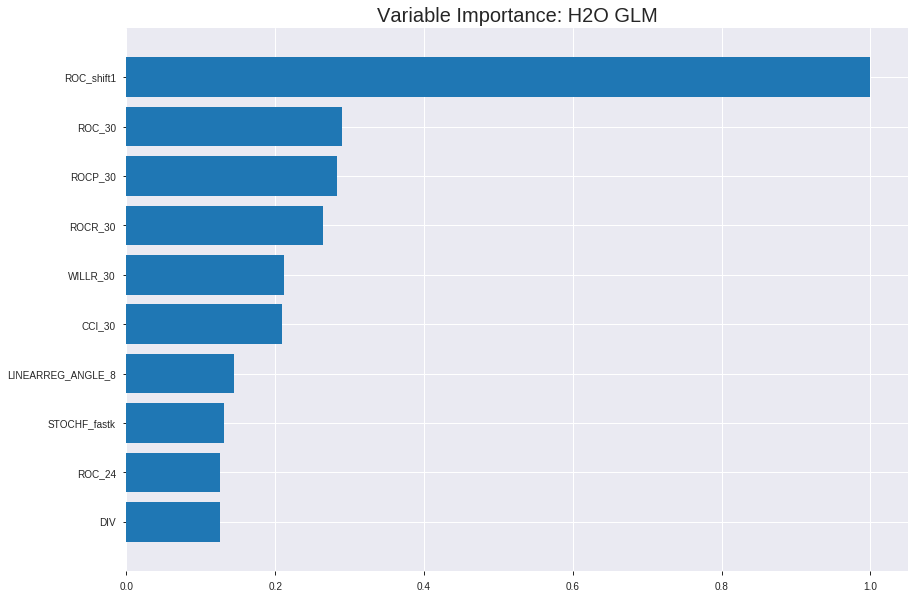

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_181502_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1311899844124133
RMSE: 0.36220157980386186
LogLoss: 0.40766127132895813
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375748
Residual deviance: 1456.9813837296965
AIC: 1558.9813837296965
AUC: 0.8953222703222704
pr_auc: 0.8754925587559754
Gini: 0.7906445406445408
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3871370441650928: 


,0,1,Error,Rate
0,636.0,255.0,0.2862,(255.0/891.0)
1,92.0,804.0,0.1027,(92.0/896.0)
Total,728.0,1059.0,0.1942,(347.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3871370,0.8225064,236.0
max f2,0.2562549,0.8844315,283.0
max f0point5,0.6428354,0.8337794,141.0
max accuracy,0.5179804,0.8091774,185.0
max precision,0.9993848,1.0,0.0
max recall,0.0331849,1.0,376.0
max specificity,0.9993848,1.0,0.0
max absolute_mcc,0.4075085,0.6231107,228.0
max min_per_class_accuracy,0.4981189,0.8058036,192.0
max mean_per_class_accuracy,0.5179804,0.8092213,185.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9979865,1.9944196,1.9944196,1.0,0.9991962,1.0,0.9991962,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9948857,1.9944196,1.9944196,1.0,0.9967432,1.0,0.9979697,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9916973,1.8836186,1.9574859,0.9444444,0.9933192,0.9814815,0.9964196,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.9886687,1.9944196,1.9667194,1.0,0.9902237,0.9861111,0.9948706,0.0200893,0.0792411,99.4419643,96.6719370
,5,0.0503637,0.9845709,1.9944196,1.9722594,1.0,0.9864602,0.9888889,0.9931885,0.0200893,0.0993304,99.4419643,97.2259425
,6,0.1001679,0.9548802,1.9496012,1.9609936,0.9775281,0.9715667,0.9832402,0.9824380,0.0970982,0.1964286,94.9601224,96.0993615
,7,0.1499720,0.9203428,1.7479183,1.8902335,0.8764045,0.9375921,0.9477612,0.9675452,0.0870536,0.2834821,74.7918339,89.0233542
,8,0.2003358,0.8740999,1.8392981,1.8774285,0.9222222,0.8965271,0.9413408,0.9496915,0.0926339,0.3761161,83.9298115,87.7428546
,9,0.2999440,0.7698579,1.7255091,1.8269777,0.8651685,0.8216118,0.9160448,0.9071575,0.171875,0.5479911,72.5509129,82.6977695
,10,0.4001119,0.6402851,1.4930292,1.7433738,0.7486034,0.7018527,0.8741259,0.8557596,0.1495536,0.6975446,49.3029230,74.3373814




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.13404252868397437
RMSE: 0.3661181895016613
LogLoss: 0.42047931402552857
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.506742749742
Residual deviance: 429.7298589340902
AIC: 531.7298589340902
AUC: 0.8922457432121491
pr_auc: 0.8861164805413753
Gini: 0.7844914864242982
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5229517858590589: 


,0,1,Error,Rate
0,214.0,51.0,0.1925,(51.0/265.0)
1,39.0,207.0,0.1585,(39.0/246.0)
Total,253.0,258.0,0.1761,(90.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5229518,0.8214286,200.0
max f2,0.2042840,0.8663730,299.0
max f0point5,0.7149682,0.8453608,134.0
max accuracy,0.5229518,0.8238748,200.0
max precision,0.9997173,1.0,0.0
max recall,0.0041051,1.0,398.0
max specificity,0.9997173,1.0,0.0
max absolute_mcc,0.5229518,0.6485928,200.0
max min_per_class_accuracy,0.5418253,0.8170732,193.0
max mean_per_class_accuracy,0.5229518,0.8245053,200.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.92 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9979619,2.0772358,2.0772358,1.0,0.9988965,1.0,0.9988965,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9957532,2.0772358,2.0772358,1.0,0.9967835,1.0,0.9979361,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9902534,2.0772358,2.0772358,1.0,0.9928708,1.0,0.9963532,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9882444,2.0772358,2.0772358,1.0,0.9893476,1.0,0.9946852,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9853249,2.0772358,2.0772358,1.0,0.9865425,1.0,0.9931193,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.9596270,2.0772358,2.0772358,1.0,0.9712461,1.0,0.9821827,0.1056911,0.2113821,107.7235772,107.7235772
,7,0.1506849,0.9271252,1.9941463,2.0502587,0.96,0.9433435,0.9870130,0.9695726,0.0975610,0.3089431,99.4146341,105.0258684
,8,0.2015656,0.8845228,1.8375547,1.9965664,0.8846154,0.9075234,0.9611650,0.9539097,0.0934959,0.4024390,83.7554722,99.6566422
,9,0.3013699,0.7696585,1.7106648,1.9018847,0.8235294,0.8271669,0.9155844,0.9119364,0.1707317,0.5731707,71.0664754,90.1884701
,10,0.4011742,0.6437849,1.4255540,1.7833829,0.6862745,0.7127784,0.8585366,0.8623898,0.1422764,0.7154472,42.5553961,78.3382907



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:15:02,0.000 sec,2,.16E2,50,1.3719269,1.3711806
,2019-12-20 18:15:02,0.009 sec,4,.96E1,51,1.3639205,1.3625948
,2019-12-20 18:15:02,0.019 sec,6,.6E1,51,1.3520593,1.3498277
,2019-12-20 18:15:02,0.027 sec,8,.37E1,51,1.3351973,1.3315930
,2019-12-20 18:15:02,0.035 sec,10,.23E1,51,1.3125030,1.3068942
---,---,---,---,---,---,---,---
,2019-12-20 18:15:03,0.204 sec,50,.17E-3,51,0.8142231,0.8411414
,2019-12-20 18:15:03,0.212 sec,52,.1E-3,51,0.8136503,0.8418742
,2019-12-20 18:15:03,0.217 sec,53,.65E-4,51,0.8133853,0.8426766
,2019-12-20 18:15:03,0.222 sec,54,.4E-4,51,0.8132668,0.8433459



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.81640625)

('F1', 0.835016835016835)

('auc', 0.9100732600732601)

('logloss', 0.38732159831990837)

('mean_per_class_error', 0.1818681318681319)

('rmse', 0.35399280213953876)

('mse', 0.12531090396660263)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           0
3           1
4           1
...       ...
2549        0
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


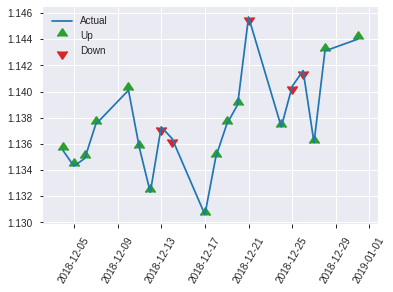


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.12531090396660263
RMSE: 0.35399280213953876
LogLoss: 0.38732159831990837
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.87097666550136
Residual deviance: 198.30865833979308
AIC: 300.30865833979306
AUC: 0.9100732600732601
pr_auc: 0.9110305910305169
Gini: 0.8201465201465201
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3402886257855157: 


,0,1,Error,Rate
0,83.0,43.0,0.3413,(43.0/126.0)
1,6.0,124.0,0.0462,(6.0/130.0)
Total,89.0,167.0,0.1914,(49.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3402886,0.8350168,166.0
max f2,0.2906531,0.9084406,178.0
max f0point5,0.6469150,0.8614232,100.0
max accuracy,0.6469150,0.8164062,100.0
max precision,0.9951504,1.0,0.0
max recall,0.0887642,1.0,219.0
max specificity,0.9951504,1.0,0.0
max absolute_mcc,0.6469150,0.6508300,100.0
max min_per_class_accuracy,0.5085144,0.7936508,129.0
max mean_per_class_accuracy,0.6469150,0.8181319,100.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9924487,1.9692308,1.9692308,1.0,0.9937666,1.0,0.9937666,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9901746,1.9692308,1.9692308,1.0,0.9911322,1.0,0.9924494,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9853129,1.9692308,1.9692308,1.0,0.9879536,1.0,0.9913255,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9721173,1.9692308,1.9692308,1.0,0.9775431,1.0,0.9875666,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9597258,1.9692308,1.9692308,1.0,0.9714614,1.0,0.9850889,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9290962,1.9692308,1.9692308,1.0,0.9465734,1.0,0.9658312,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8659387,1.9692308,1.9692308,1.0,0.8977294,1.0,0.9431306,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.8246361,1.9692308,1.9692308,1.0,0.8459938,1.0,0.9188464,0.1,0.4,96.9230769,96.9230769
,9,0.3007812,0.7226093,1.6541538,1.8669331,0.84,0.7850697,0.9480519,0.8754124,0.1615385,0.5615385,65.4153846,86.6933067
,10,0.4023438,0.6450908,1.4390533,1.7589246,0.7307692,0.6779969,0.8932039,0.8255794,0.1461538,0.7076923,43.9053254,75.8924571


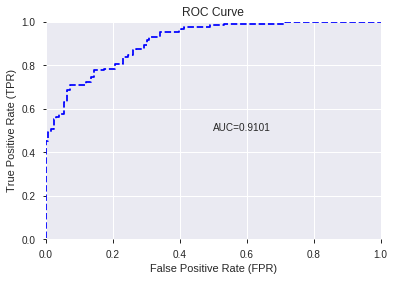

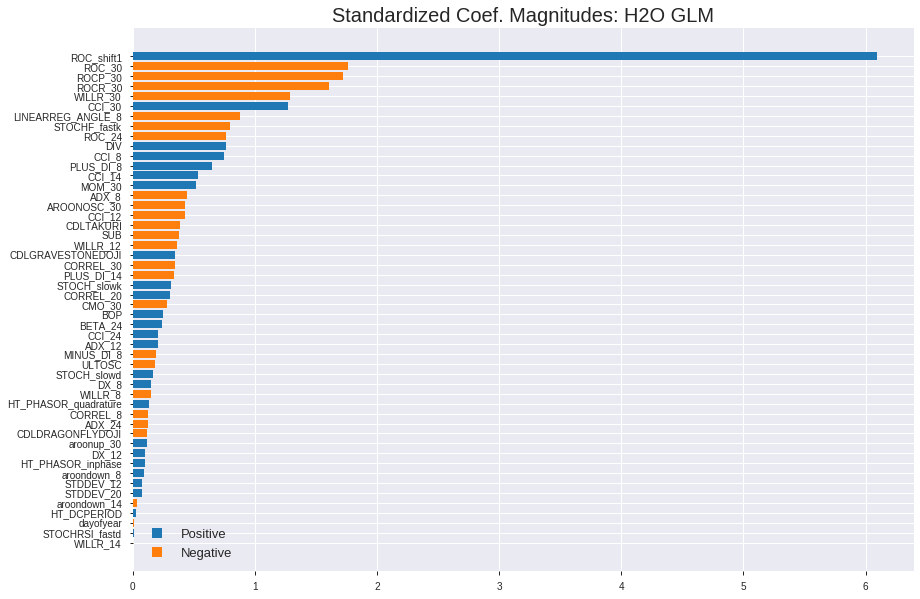

'log_likelihood'
--2019-12-20 18:15:07--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.25.164
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.25.164|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


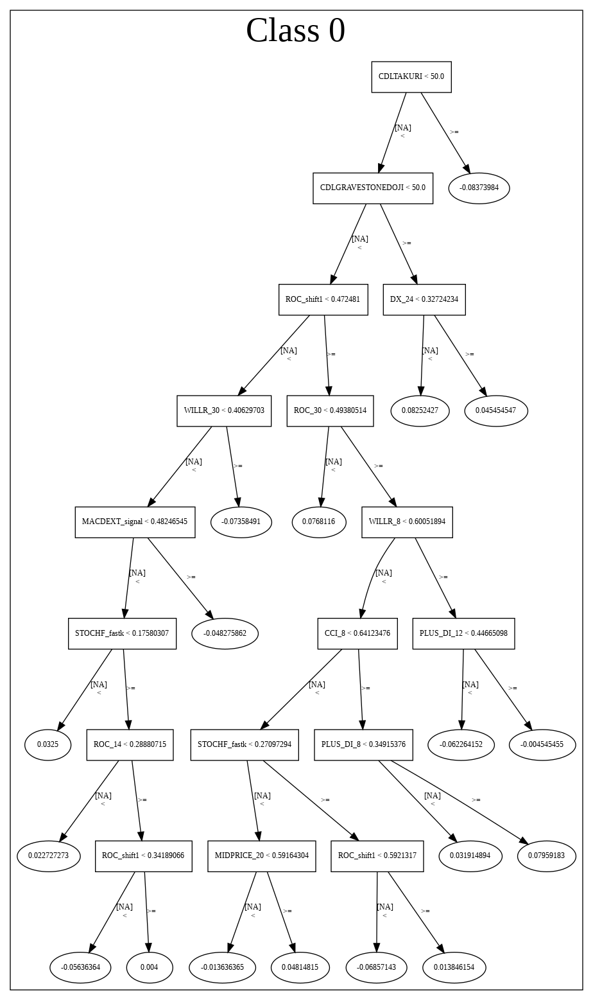

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_181502_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_181502_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_369_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_369

['ROC_shift1',
 'ROC_30',
 'ROCP_30',
 'ROCR_30',
 'WILLR_30',
 'CCI_30',
 'LINEARREG_ANGLE_8',
 'STOCHF_fastk',
 'ROC_24',
 'DIV',
 'CCI_8',
 'PLUS_DI_8',
 'CCI_14',
 'MOM_30',
 'ADX_8',
 'AROONOSC_30',
 'CCI_12',
 'CDLTAKURI',
 'SUB',
 'WILLR_12',
 'CDLGRAVESTONEDOJI',
 'CORREL_30',
 'PLUS_DI_14',
 'STOCH_slowk',
 'CORREL_20',
 'CMO_30',
 'BOP',
 'BETA_24',
 'CCI_24',
 'ADX_12',
 'MINUS_DI_8',
 'ULTOSC',
 'STOCH_slowd',
 'DX_8',
 'WILLR_8',
 'HT_PHASOR_quadrature',
 'CORREL_8',
 'ADX_24',
 'CDLDRAGONFLYDOJI',
 'aroonup_30',
 'DX_12',
 'HT_PHASOR_inphase',
 'aroondown_8',
 'STDDEV_12',
 'STDDEV_20',
 'aroondown_14',
 'HT_DCPERIOD',
 'dayofyear',
 'STOCHRSI_fastd',
 'WILLR_14']

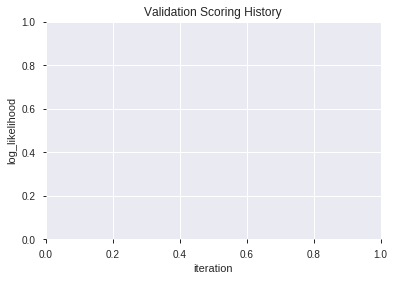

In [251]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191220_181515_model_7,0.874054,0.445280,0.228816,0.381599,0.145618
1,XGBoost_2_AutoML_20191220_181515,0.873626,0.455130,0.245177,0.384981,0.148211
2,XGBoost_1_AutoML_20191220_181515,0.873138,0.454524,0.225092,0.384685,0.147982
3,XGBoost_3_AutoML_20191220_181515,0.867827,0.460791,0.223748,0.389041,0.151353
4,XGBoost_grid_1_AutoML_20191220_181515_model_6,0.867033,0.460538,0.241087,0.388706,0.151092
5,XGBoost_grid_1_AutoML_20191220_181515_model_2,0.864530,0.463184,0.240476,0.389894,0.152018
6,XGBoost_grid_1_AutoML_20191220_181515_model_3,0.859096,0.469206,0.228327,0.393119,0.154543
7,XGBoost_grid_1_AutoML_20191220_181515_model_4,0.858608,0.481252,0.240720,0.396924,0.157549
8,XGBoost_grid_1_AutoML_20191220_181515_model_1,0.855922,0.472381,0.228083,0.395570,0.156476
9,XGBoost_grid_1_AutoML_20191220_181515_model_5,0.854029,0.473883,0.240598,0.399671,0.159737


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,1483.446777,1.000000,0.102613
1,STOCHF_fastk,781.469421,0.526793,0.054056
2,CDLGRAVESTONEDOJI,668.926453,0.450927,0.046271
3,CDLTAKURI,633.620483,0.427127,0.043829
4,ROC_30,585.325562,0.394571,0.040488
5,CDLDRAGONFLYDOJI,528.761536,0.356441,0.036575
6,CCI_8,511.645386,0.344903,0.035391
7,WILLR_8,428.741333,0.289017,0.029657
8,MOM_30,422.869690,0.285059,0.029251
9,ULTOSC,420.779266,0.283650,0.029106


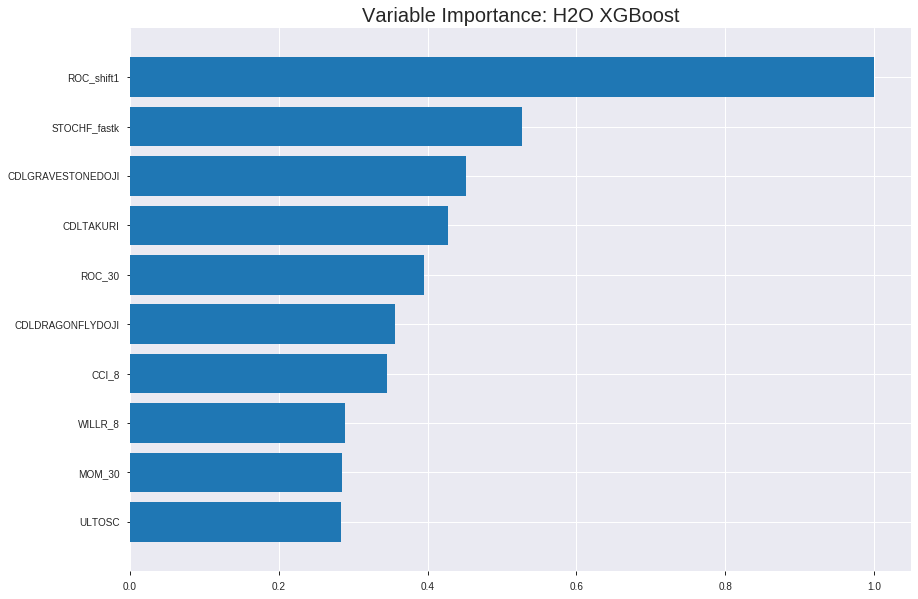

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191220_181515_model_7


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.0621313784876583
RMSE: 0.24926166670320227
LogLoss: 0.2509569523255405
Mean Per-Class Error: 0.03357295675004002
AUC: 0.9932196468654803
pr_auc: 0.9914311725114023
Gini: 0.9864392937309605
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.512690395116806: 


,0,1,Error,Rate
0,860.0,31.0,0.0348,(31.0/891.0)
1,29.0,867.0,0.0324,(29.0/896.0)
Total,889.0,898.0,0.0336,(60.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5126904,0.9665552,198.0
max f2,0.4786559,0.9718216,208.0
max f0point5,0.5300864,0.9688347,193.0
max accuracy,0.5153227,0.9664242,197.0
max precision,0.9827003,1.0,0.0
max recall,0.1818561,1.0,316.0
max specificity,0.9827003,1.0,0.0
max absolute_mcc,0.5153227,0.9328506,197.0
max min_per_class_accuracy,0.5153227,0.9654018,197.0
max mean_per_class_accuracy,0.5153227,0.9664270,197.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9674414,1.9944196,1.9944196,1.0,0.9731239,1.0,0.9731239,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9599684,1.9944196,1.9944196,1.0,0.9636651,1.0,0.9683945,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9532183,1.9944196,1.9944196,1.0,0.9561979,1.0,0.9643290,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9473894,1.9944196,1.9944196,1.0,0.9508739,1.0,0.9609652,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9414821,1.9944196,1.9944196,1.0,0.9448829,1.0,0.9577488,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9111764,1.9944196,1.9944196,1.0,0.9269514,1.0,0.9424361,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8820543,1.9944196,1.9944196,1.0,0.8969675,1.0,0.9273365,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.8490558,1.9944196,1.9944196,1.0,0.8652174,1.0,0.9117199,0.1004464,0.3995536,99.4419643,99.4419643
,9,0.2999440,0.7820806,1.9944196,1.9944196,1.0,0.8177474,1.0,0.8805126,0.1986607,0.5982143,99.4419643,99.4419643
,10,0.4001119,0.6929757,1.9721356,1.9888408,0.9888268,0.7416117,0.9972028,0.8457388,0.1975446,0.7957589,97.2135625,98.8840847




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1479560567536131
RMSE: 0.38465056447847973
LogLoss: 0.46117419645673796
Mean Per-Class Error: 0.19769903359410956
AUC: 0.8696272434422457
pr_auc: 0.850465389073899
Gini: 0.7392544868844915
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.503288209438324: 


,0,1,Error,Rate
0,199.0,66.0,0.2491,(66.0/265.0)
1,36.0,210.0,0.1463,(36.0/246.0)
Total,235.0,276.0,0.1996,(102.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5032882,0.8045977,211.0
max f2,0.2661520,0.8682855,293.0
max f0point5,0.6787881,0.8217822,143.0
max accuracy,0.6024423,0.8023483,171.0
max precision,0.9815544,1.0,0.0
max recall,0.0545938,1.0,385.0
max specificity,0.9815544,1.0,0.0
max absolute_mcc,0.5032882,0.6061381,211.0
max min_per_class_accuracy,0.5545178,0.7886792,193.0
max mean_per_class_accuracy,0.5032882,0.8023010,211.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 52.22 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9625211,2.0772358,2.0772358,1.0,0.9727554,1.0,0.9727554,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9560494,2.0772358,2.0772358,1.0,0.9586011,1.0,0.9663216,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9503486,2.0772358,2.0772358,1.0,0.9536124,1.0,0.9623500,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9473116,2.0772358,2.0772358,1.0,0.9491695,1.0,0.9592118,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9447353,1.6617886,1.9973421,0.8,0.9459282,0.9615385,0.9566572,0.0162602,0.1016260,66.1788618,99.7342089
,6,0.1017613,0.9153249,1.6777674,1.8375547,0.8076923,0.9309230,0.8846154,0.9437901,0.0853659,0.1869919,67.7767355,83.7554722
,7,0.1506849,0.8865746,1.9941463,1.8883962,0.96,0.9001734,0.9090909,0.9296289,0.0975610,0.2845528,99.4146341,88.8396157
,8,0.2015656,0.8640275,1.8375547,1.8755624,0.8846154,0.8748467,0.9029126,0.9158003,0.0934959,0.3780488,83.7554722,87.5562396
,9,0.3013699,0.7690797,1.7106648,1.8209534,0.8235294,0.8186749,0.8766234,0.8836354,0.1707317,0.5487805,71.0664754,82.0953437
,10,0.4011742,0.6469095,1.5070142,1.7428515,0.7254902,0.7037566,0.8390244,0.8388851,0.1504065,0.6991870,50.7014188,74.2851477



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:15:35,13.266 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-20 18:15:35,13.345 sec,5.0,0.4646406,0.6243743,0.8839405,0.8816944,1.9944196,0.1980974,0.4707111,0.6357944,0.8102010,0.7720507,2.0772358,0.2563601
,2019-12-20 18:15:35,13.402 sec,10.0,0.4370675,0.5724448,0.9111940,0.9080256,1.9944196,0.1678791,0.4534074,0.6020851,0.8161068,0.7929806,2.0772358,0.2328767
,2019-12-20 18:15:35,13.500 sec,15.0,0.4108471,0.5242183,0.9332361,0.9304105,1.9944196,0.1393397,0.4340206,0.5647392,0.8466866,0.8285355,2.0772358,0.2583170
,2019-12-20 18:15:35,13.571 sec,20.0,0.3914270,0.4884475,0.9409541,0.9410726,1.9944196,0.1281477,0.4227889,0.5423449,0.8522780,0.8323654,2.0772358,0.2191781
---,---,---,---,---,---,---,---,---,---,---,---,---,---,---,---
,2019-12-20 18:15:36,14.323 sec,80.0,0.2714450,0.2834603,0.9883915,0.9858755,1.9944196,0.0458870,0.3872060,0.4669672,0.8666743,0.8485590,2.0772358,0.2133072
,2019-12-20 18:15:36,14.388 sec,85.0,0.2658133,0.2747882,0.9895357,0.9892040,1.9944196,0.0419698,0.3872459,0.4670156,0.8664749,0.8464893,2.0772358,0.2133072
,2019-12-20 18:15:36,14.452 sec,90.0,0.2594961,0.2659486,0.9913401,0.9908234,1.9944196,0.0414102,0.3866256,0.4656615,0.8664749,0.8473047,2.0772358,0.2074364
,2019-12-20 18:15:36,14.515 sec,95.0,0.2542376,0.2580725,0.9923810,0.9895248,1.9944196,0.0369334,0.3844720,0.4615222,0.8686378,0.8486561,2.0772358,0.2093933



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
ROC_shift1,1483.4467773,1.0,0.1026126
STOCHF_fastk,781.4694214,0.5267930,0.0540556
CDLGRAVESTONEDOJI,668.9264526,0.4509272,0.0462708
CDLTAKURI,633.6204834,0.4271272,0.0438286
ROC_30,585.3255615,0.3945713,0.0404880
---,---,---,---
HT_PHASOR_inphase,142.7519989,0.0962299,0.0098744
aroonup_30,119.3572769,0.0804594,0.0082562
PLUS_DI_14,113.7157974,0.0766565,0.0078659
AROONOSC_30,112.0635681,0.0755427,0.0077516



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.78125)

('F1', 0.8040540540540541)

('auc', 0.8740537240537241)

('logloss', 0.44527985423753014)

('mean_per_class_error', 0.2199023199023199)

('rmse', 0.38159869696578474)

('mse', 0.14561756552598482)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


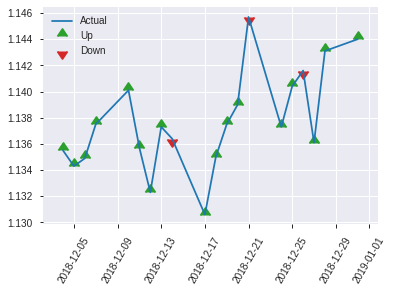


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.14561756552598482
RMSE: 0.38159869696578474
LogLoss: 0.44527985423753014
Mean Per-Class Error: 0.2199023199023199
AUC: 0.8740537240537241
pr_auc: 0.8814657136214852
Gini: 0.7481074481074481
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36344289779663086: 


,0,1,Error,Rate
0,79.0,47.0,0.373,(47.0/126.0)
1,11.0,119.0,0.0846,(11.0/130.0)
Total,90.0,166.0,0.2266,(58.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3634429,0.8040541,165.0
max f2,0.2897211,0.8877841,183.0
max f0point5,0.7238776,0.8295964,78.0
max accuracy,0.4367748,0.78125,147.0
max precision,0.9648913,1.0,0.0
max recall,0.0732772,1.0,239.0
max specificity,0.9648913,1.0,0.0
max absolute_mcc,0.7238776,0.5731421,78.0
max min_per_class_accuracy,0.5371048,0.7692308,126.0
max mean_per_class_accuracy,0.4367748,0.7800977,147.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.66 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9587786,1.9692308,1.9692308,1.0,0.9617704,1.0,0.9617704,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9488411,1.9692308,1.9692308,1.0,0.9539807,1.0,0.9578755,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9396085,1.9692308,1.9692308,1.0,0.9415331,1.0,0.9537899,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9322498,1.9692308,1.9692308,1.0,0.9351547,1.0,0.9487076,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9288096,1.9692308,1.9692308,1.0,0.9309710,1.0,0.9459789,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8883805,1.9692308,1.9692308,1.0,0.9121996,1.0,0.9290892,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8516464,1.9692308,1.9692308,1.0,0.8682503,1.0,0.9088096,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.8192034,1.8177515,1.9313609,0.9230769,0.8365212,0.9807692,0.8907375,0.0923077,0.3923077,81.7751479,93.1360947
,9,0.3007812,0.7273573,1.6541538,1.8413586,0.84,0.7674193,0.9350649,0.8506991,0.1615385,0.5538462,65.4153846,84.1358641
,10,0.4023438,0.6207522,0.9088757,1.6059746,0.4615385,0.6735836,0.8155340,0.8059903,0.0923077,0.6461538,-9.1124260,60.5974608


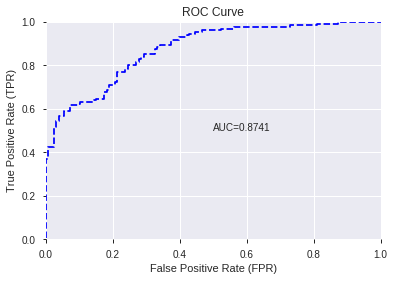

This function is available for GLM models only


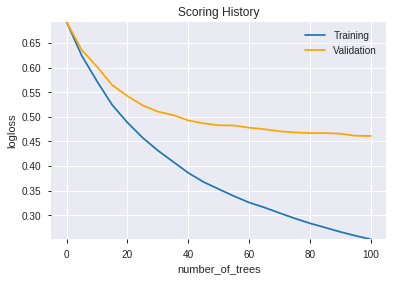

--2019-12-20 18:15:40--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.186.43
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.186.43|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

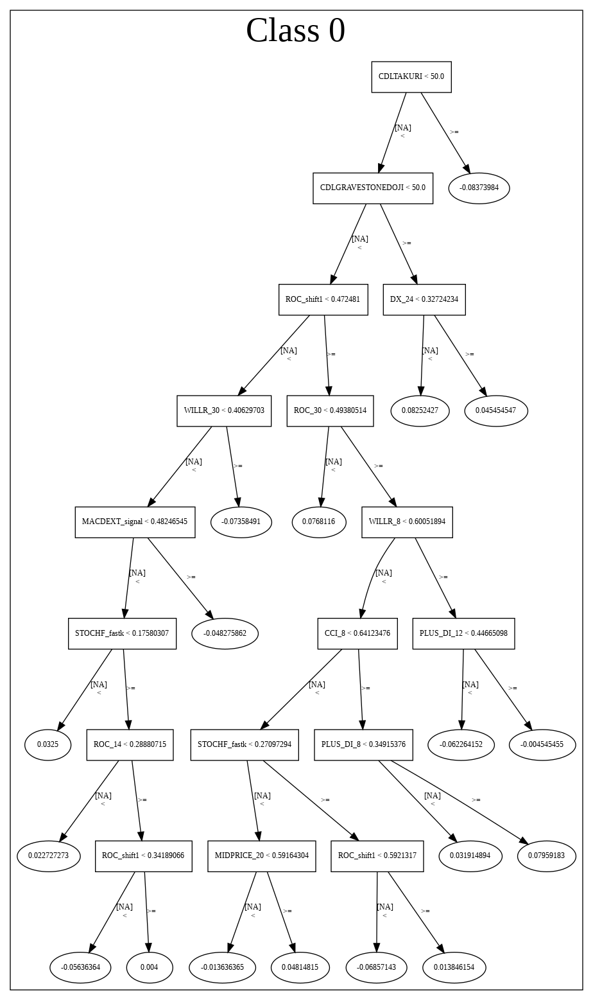

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191220_181515_model_7',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191220_181515_model_7',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_374_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['ROC_shift1',
 'STOCHF_fastk',
 'CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'ROC_30',
 'CDLDRAGONFLYDOJI',
 'CCI_8',
 'WILLR_8',
 'MOM_30',
 'ULTOSC',
 'WILLR_12',
 'LINEARREG_ANGLE_8',
 'BOP',
 'DIV',
 'BETA_24',
 'CORREL_20',
 'MINUS_DI_8',
 'ROCP_30',
 'WILLR_14',
 'CCI_14',
 'WILLR_30',
 'STOCH_slowk',
 'ROC_24',
 'CCI_24',
 'STOCH_slowd',
 'ADX_8',
 'STDDEV_12',
 'CORREL_8',
 'HT_DCPERIOD',
 'PLUS_DI_8',
 'HT_PHASOR_quadrature',
 'CORREL_30',
 'SUB',
 'ADX_24',
 'STOCHRSI_fastd',
 'CMO_30',
 'CCI_12',
 'aroondown_8',
 'aroondown_14',
 'DX_12',
 'DX_8',
 'dayofyear',
 'ADX_12',
 'CCI_30',
 'STDDEV_20',
 'HT_PHASOR_inphase',
 'aroonup_30',
 'PLUS_DI_14',
 'AROONOSC_30',
 'ROCR_30']

In [252]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [253]:
# DRF with top XGBoost features
model_train(feature_name='XGBF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191220_181604,0.872100,0.459045,0.245299,0.386908,0.149698
1,GBM_1_AutoML_20191220_181604,0.858181,0.466999,0.231929,0.393863,0.155128
2,GBM_3_AutoML_20191220_181604,0.857387,0.467837,0.233028,0.393887,0.155147
3,GBM_2_AutoML_20191220_181604,0.856166,0.471029,0.240232,0.394534,0.155657
4,GBM_grid_1_AutoML_20191220_181604_model_5,0.851954,0.684159,0.247802,0.495487,0.245507
5,GBM_4_AutoML_20191220_181604,0.849023,0.479958,0.239988,0.400486,0.160389
6,GBM_grid_1_AutoML_20191220_181604_model_3,0.845299,0.554542,0.239988,0.415219,0.172406
7,GBM_grid_1_AutoML_20191220_181604_model_1,0.835409,0.559693,0.259463,0.432673,0.187206
8,GBM_grid_1_AutoML_20191220_181604_model_4,0.832479,0.632542,0.292796,0.469044,0.220002
9,GBM_grid_1_AutoML_20191220_181604_model_2,0.828571,0.583855,0.292308,0.444790,0.197838


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,184.534119,1.000000,0.154662
1,CDLTAKURI,140.425308,0.760972,0.117693
2,CDLGRAVESTONEDOJI,107.673782,0.583490,0.090244
3,STOCHF_fastk,75.880699,0.411201,0.063597
4,CDLDRAGONFLYDOJI,73.159950,0.396458,0.061317
5,CCI_8,50.451580,0.273400,0.042284
6,MOM_30,40.860626,0.221426,0.034246
7,WILLR_8,39.543293,0.214287,0.033142
8,ROC_30,38.730434,0.209882,0.032461
9,ROCR_30,36.613911,0.198413,0.030687


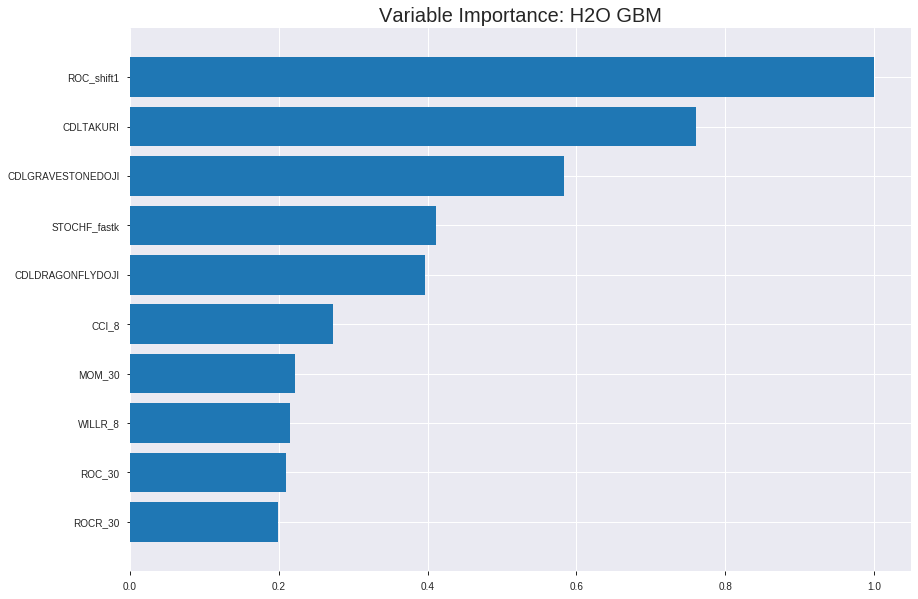

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191220_181604


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.11486051631391572
RMSE: 0.33891077928256536
LogLoss: 0.3801551542829324
Mean Per-Class Error: 0.13370873917748916
AUC: 0.9399162758537759
pr_auc: 0.9365632235519415
Gini: 0.8798325517075518
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4630466289002025: 


,0,1,Error,Rate
0,725.0,166.0,0.1863,(166.0/891.0)
1,75.0,821.0,0.0837,(75.0/896.0)
Total,800.0,987.0,0.1349,(241.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4630466,0.8720127,214.0
max f2,0.3716893,0.9160144,249.0
max f0point5,0.5845075,0.8785141,164.0
max accuracy,0.5251172,0.8662563,189.0
max precision,0.9713123,1.0,0.0
max recall,0.1159723,1.0,352.0
max specificity,0.9713123,1.0,0.0
max absolute_mcc,0.4630466,0.7340142,214.0
max min_per_class_accuracy,0.5161709,0.8627232,192.0
max mean_per_class_accuracy,0.5251172,0.8662913,189.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9539031,1.9944196,1.9944196,1.0,0.9619642,1.0,0.9619642,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9468771,1.9944196,1.9944196,1.0,0.9501857,1.0,0.9560750,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9351378,1.9944196,1.9944196,1.0,0.9400477,1.0,0.9507325,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9243955,1.9944196,1.9944196,1.0,0.9298506,1.0,0.9455120,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9172895,1.9944196,1.9944196,1.0,0.9197880,1.0,0.9403672,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8776321,1.9720104,1.9832776,0.9887640,0.8957405,0.9944134,0.9181785,0.0982143,0.1986607,97.2010433,98.3277634
,7,0.1499720,0.8323976,1.9720104,1.9795359,0.9887640,0.8556022,0.9925373,0.8973976,0.0982143,0.296875,97.2010433,97.9535914
,8,0.2003358,0.7888133,1.8171379,1.9387096,0.9111111,0.8109676,0.9720670,0.8756694,0.0915179,0.3883929,81.7137897,93.8709597
,9,0.2999440,0.7048123,1.8487598,1.9088382,0.9269663,0.7467890,0.9570896,0.8328695,0.1841518,0.5725446,84.8759781,90.8838203
,10,0.4001119,0.6155761,1.6155913,1.8354240,0.8100559,0.6570839,0.9202797,0.7888617,0.1618304,0.734375,61.5591331,83.5423951




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.14937304555963968
RMSE: 0.38648809239048965
LogLoss: 0.46560959980294786
Mean Per-Class Error: 0.19394078846448837
AUC: 0.8684307409111827
pr_auc: 0.843415998081785
Gini: 0.7368614818223653
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.524626264390379: 


,0,1,Error,Rate
0,205.0,60.0,0.2264,(60.0/265.0)
1,42.0,204.0,0.1707,(42.0/246.0)
Total,247.0,264.0,0.1996,(102.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5246263,0.8000000,203.0
max f2,0.3221332,0.8682635,278.0
max f0point5,0.6077400,0.8184258,167.0
max accuracy,0.6077400,0.8082192,167.0
max precision,0.9744661,1.0,0.0
max recall,0.0655227,1.0,386.0
max specificity,0.9744661,1.0,0.0
max absolute_mcc,0.6077400,0.6180976,167.0
max min_per_class_accuracy,0.5477231,0.7924528,193.0
max mean_per_class_accuracy,0.6022784,0.8060592,169.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.87 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9538792,2.0772358,2.0772358,1.0,0.9604318,1.0,0.9604318,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9489254,1.6617886,1.8883962,0.8,0.9514162,0.9090909,0.9563338,0.0162602,0.0406504,66.1788618,88.8396157
,3,0.0313112,0.9390631,1.6617886,1.8175813,0.8,0.9437518,0.875,0.9524019,0.0162602,0.0569106,66.1788618,81.7581301
,4,0.0410959,0.9318592,2.0772358,1.8794038,1.0,0.9349005,0.9047619,0.9482349,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.9261733,2.0772358,1.9174484,1.0,0.9285199,0.9230769,0.9444436,0.0203252,0.0975610,107.7235772,91.7448405
,6,0.1017613,0.8981747,1.9973421,1.9573952,0.9615385,0.9117889,0.9423077,0.9281162,0.1016260,0.1991870,99.7342089,95.7395247
,7,0.1506849,0.8649247,1.8279675,1.9153732,0.88,0.8795118,0.9220779,0.9123356,0.0894309,0.2886179,82.7967480,91.5373245
,8,0.2015656,0.8267681,1.5179800,1.8150604,0.7307692,0.8475709,0.8737864,0.8959872,0.0772358,0.3658537,51.7979987,81.5060384
,9,0.3013699,0.7394074,1.7921250,1.8074649,0.8627451,0.7846842,0.8701299,0.8591271,0.1788618,0.5447154,79.2124980,80.7464893
,10,0.4011742,0.6364109,1.6292045,1.7631172,0.7843137,0.6848138,0.8487805,0.8157614,0.1626016,0.7073171,62.9204527,76.3117192



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:16:08,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-20 18:16:08,0.055 sec,5.0,0.4577528,0.6103764,0.8298768,0.7555571,1.8994473,0.2775602,0.4560259,0.6069314,0.8199570,0.6889185,1.8883962,0.2720157
,2019-12-20 18:16:08,0.110 sec,10.0,0.4322587,0.5600923,0.8547178,0.8242255,0.0,0.2299944,0.4335179,0.5616380,0.8375288,0.7825028,1.6617886,0.2524462
,2019-12-20 18:16:08,0.160 sec,15.0,0.4175077,0.5303838,0.8664384,0.8372626,1.9944196,0.2249580,0.4234444,0.5401168,0.8374597,0.7864873,1.6617886,0.2446184
,2019-12-20 18:16:08,0.213 sec,20.0,0.4039150,0.5033957,0.8791762,0.8722148,1.9944196,0.2165641,0.4146084,0.5216980,0.8457586,0.8190783,1.3848238,0.2289628
,2019-12-20 18:16:08,0.273 sec,25.0,0.3923380,0.4805655,0.8901985,0.8854396,1.9944196,0.1941802,0.4071039,0.5063065,0.8526845,0.8258313,1.3848238,0.2426614
,2019-12-20 18:16:08,0.325 sec,30.0,0.3819218,0.4603662,0.9013486,0.8971891,1.9944196,0.1773923,0.4005733,0.4940388,0.8599248,0.8342796,1.7310298,0.2230920
,2019-12-20 18:16:08,0.382 sec,35.0,0.3726461,0.4427872,0.9107606,0.9081568,1.9944196,0.1645215,0.3954798,0.4840931,0.8652017,0.8379057,1.7310298,0.2309198
,2019-12-20 18:16:09,0.445 sec,40.0,0.3662337,0.4306080,0.9167800,0.9139915,1.9944196,0.1589256,0.3947281,0.4825950,0.8634453,0.8318638,1.3848238,0.2230920
,2019-12-20 18:16:09,0.506 sec,45.0,0.3584450,0.4162308,0.9247090,0.9210267,1.9944196,0.1622832,0.3902240,0.4738911,0.8683157,0.8352312,1.3848238,0.2093933


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
ROC_shift1,184.5341187,1.0,0.1546618
CDLTAKURI,140.4253082,0.7609721,0.1176933
CDLGRAVESTONEDOJI,107.6737823,0.5834898,0.0902436
STOCHF_fastk,75.8806992,0.4112015,0.0635972
CDLDRAGONFLYDOJI,73.1599503,0.3964576,0.0613168
---,---,---,---
HT_PHASOR_quadrature,2.1057401,0.0114111,0.0017649
SUB,1.9535630,0.0105865,0.0016373
PLUS_DI_14,0.9441950,0.0051166,0.0007913
CORREL_8,0.7453112,0.0040389,0.0006247



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.78125)

('F1', 0.8000000000000002)

('auc', 0.8721001221001221)

('logloss', 0.45904468705548496)

('mean_per_class_error', 0.21697191697191698)

('rmse', 0.3869083057686887)

('mse', 0.1496980370727971)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           0
3           1
4           0
...       ...
2549        0
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


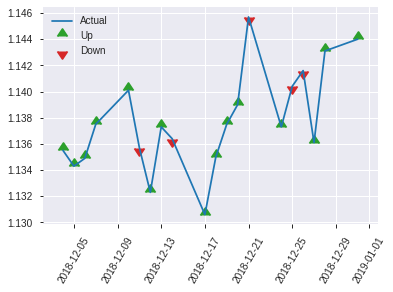


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.1496980370727971
RMSE: 0.3869083057686887
LogLoss: 0.45904468705548496
Mean Per-Class Error: 0.21697191697191698
AUC: 0.8721001221001221
pr_auc: 0.8791268618607613
Gini: 0.7442002442002442
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3271697958499883: 


,0,1,Error,Rate
0,70.0,56.0,0.4444,(56.0/126.0)
1,6.0,124.0,0.0462,(6.0/130.0)
Total,76.0,180.0,0.2422,(62.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3271698,0.8000000,179.0
max f2,0.3271698,0.8857143,179.0
max f0point5,0.6603408,0.8406114,81.0
max accuracy,0.6118005,0.78125,99.0
max precision,0.9741659,1.0,0.0
max recall,0.1026114,1.0,235.0
max specificity,0.9741659,1.0,0.0
max absolute_mcc,0.6603408,0.5921150,81.0
max min_per_class_accuracy,0.5351354,0.7769231,128.0
max mean_per_class_accuracy,0.6118005,0.7830281,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.43 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9462294,1.9692308,1.9692308,1.0,0.9613483,1.0,0.9613483,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9366571,1.9692308,1.9692308,1.0,0.9399531,1.0,0.9506507,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9280724,1.9692308,1.9692308,1.0,0.9318996,1.0,0.9459629,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9133504,1.9692308,1.9692308,1.0,0.9208761,1.0,0.9391211,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9070141,1.9692308,1.9692308,1.0,0.9101070,1.0,0.9346574,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8703937,1.9692308,1.9692308,1.0,0.8919645,1.0,0.9133109,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8219681,1.8177515,1.9187377,0.9230769,0.8439704,0.9743590,0.8901974,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7712634,1.8177515,1.8934911,0.9230769,0.7919703,0.9615385,0.8656407,0.0923077,0.3846154,81.7751479,89.3491124
,9,0.3007812,0.6879894,1.7329231,1.8413586,0.88,0.7281098,0.9350649,0.8209878,0.1692308,0.5538462,73.2923077,84.1358641
,10,0.4023438,0.6100933,1.2118343,1.6824496,0.6153846,0.6382379,0.8543689,0.7748567,0.1230769,0.6769231,21.1834320,68.2449589


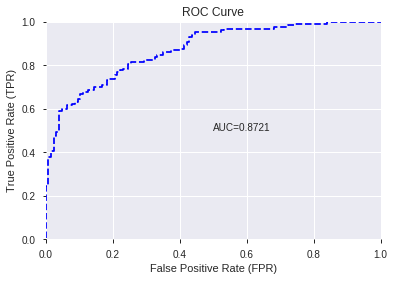

This function is available for GLM models only


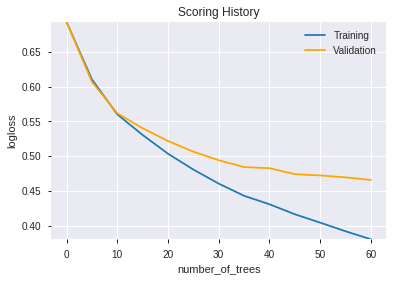

--2019-12-20 18:16:18--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.11.44
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.11.44|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1573.0
            depth:       1
            colId:       39
            colName:     CDLGRAVESTONEDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.058677305
            squaredErr:  387.57278
            leftChild:   Node 3
            righ

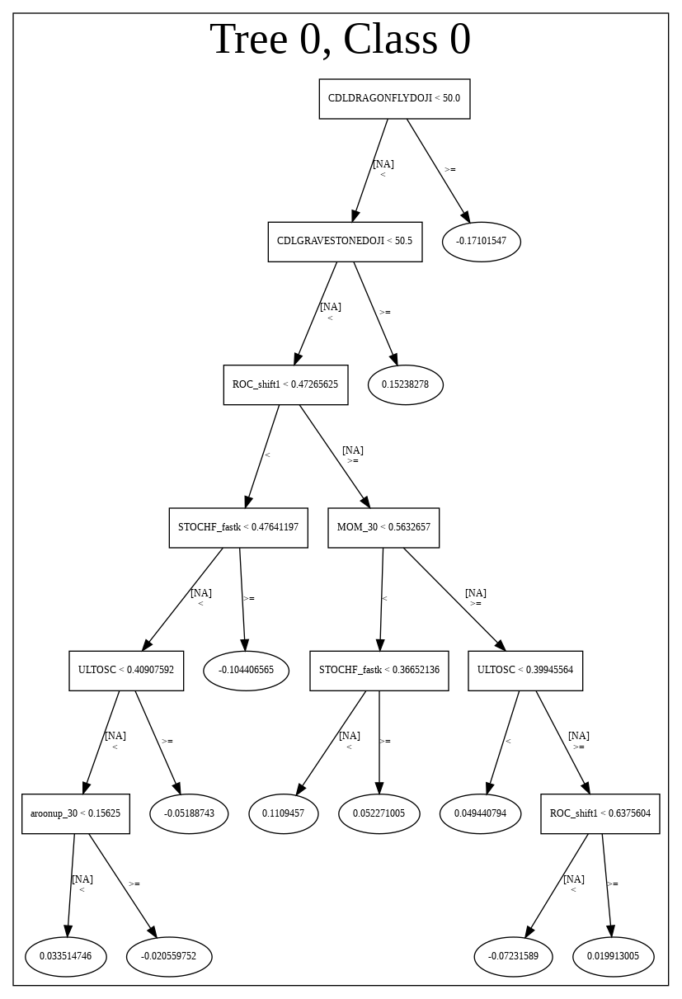

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191220_181604',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191220_181604',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_384_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_384_sid_be3a',
   'type': 'Ke

['ROC_shift1',
 'CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'CCI_8',
 'MOM_30',
 'WILLR_8',
 'ROC_30',
 'ROCR_30',
 'ULTOSC',
 'ROCP_30',
 'aroondown_8',
 'WILLR_12',
 'STDDEV_12',
 'MINUS_DI_8',
 'aroonup_30',
 'AROONOSC_30',
 'LINEARREG_ANGLE_8',
 'CCI_14',
 'PLUS_DI_8',
 'ADX_12',
 'DX_12',
 'CMO_30',
 'WILLR_30',
 'CCI_24',
 'CCI_12',
 'ROC_24',
 'WILLR_14',
 'STOCH_slowd',
 'CORREL_20',
 'HT_DCPERIOD',
 'aroondown_14',
 'STOCH_slowk',
 'BOP',
 'dayofyear',
 'CCI_30',
 'ADX_8',
 'STOCHRSI_fastd',
 'STDDEV_20',
 'ADX_24',
 'CORREL_30',
 'DX_8',
 'DIV',
 'BETA_24',
 'HT_PHASOR_quadrature',
 'SUB',
 'PLUS_DI_14',
 'CORREL_8',
 'HT_PHASOR_inphase']

In [254]:
# GBM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [255]:
# StackedEnsemble with top XGBoost features
model_train(feature_name='XGBF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_181626_model_1,0.910073,0.387322,0.193712,0.353993,0.125311
1,XGBoost_2_AutoML_20191220_181626,0.873626,0.455130,0.245177,0.384981,0.148211
2,XGBoost_1_AutoML_20191220_181626,0.873138,0.454524,0.225092,0.384685,0.147982
3,GBM_5_AutoML_20191220_181626,0.872100,0.459045,0.245299,0.386908,0.149698
4,XGBoost_3_AutoML_20191220_181626,0.867827,0.460791,0.223748,0.389041,0.151353
5,GBM_1_AutoML_20191220_181626,0.858181,0.466999,0.231929,0.393863,0.155128
6,GBM_3_AutoML_20191220_181626,0.857387,0.467837,0.233028,0.393887,0.155147
7,GBM_2_AutoML_20191220_181626,0.856166,0.471029,0.240232,0.394534,0.155657
8,GBM_4_AutoML_20191220_181626,0.849023,0.479958,0.239988,0.400486,0.160389
9,DRF_1_AutoML_20191220_181626,0.811600,0.531455,0.250549,0.424680,0.180353


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,6.089453,1.000000,0.228365
1,ROC_30,1.763284,0.289564,0.066126
2,ROCP_30,1.722535,0.282872,0.064598
3,ROCR_30,1.606827,0.263871,0.060259
4,WILLR_30,1.288168,0.211541,0.048309
5,CCI_30,1.269210,0.208428,0.047598
6,LINEARREG_ANGLE_8,0.878951,0.144340,0.032962
7,STOCHF_fastk,0.796797,0.130849,0.029881
8,ROC_24,0.768548,0.126210,0.028822
9,DIV,0.764950,0.125619,0.028687


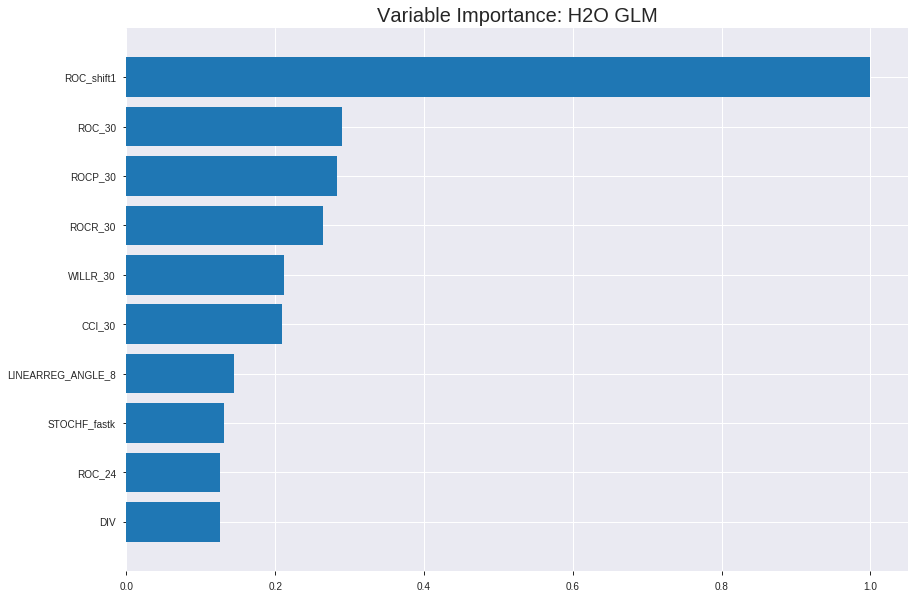

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_181626_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1311899844124133
RMSE: 0.36220157980386186
LogLoss: 0.40766127132895813
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375748
Residual deviance: 1456.9813837296965
AIC: 1558.9813837296965
AUC: 0.8953222703222704
pr_auc: 0.8754925587559754
Gini: 0.7906445406445408
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3871370441650928: 


,0,1,Error,Rate
0,636.0,255.0,0.2862,(255.0/891.0)
1,92.0,804.0,0.1027,(92.0/896.0)
Total,728.0,1059.0,0.1942,(347.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3871370,0.8225064,236.0
max f2,0.2562549,0.8844315,283.0
max f0point5,0.6428354,0.8337794,141.0
max accuracy,0.5179804,0.8091774,185.0
max precision,0.9993848,1.0,0.0
max recall,0.0331849,1.0,376.0
max specificity,0.9993848,1.0,0.0
max absolute_mcc,0.4075085,0.6231107,228.0
max min_per_class_accuracy,0.4981189,0.8058036,192.0
max mean_per_class_accuracy,0.5179804,0.8092213,185.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9979865,1.9944196,1.9944196,1.0,0.9991962,1.0,0.9991962,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9948857,1.9944196,1.9944196,1.0,0.9967432,1.0,0.9979697,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9916973,1.8836186,1.9574859,0.9444444,0.9933192,0.9814815,0.9964196,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.9886687,1.9944196,1.9667194,1.0,0.9902237,0.9861111,0.9948706,0.0200893,0.0792411,99.4419643,96.6719370
,5,0.0503637,0.9845709,1.9944196,1.9722594,1.0,0.9864602,0.9888889,0.9931885,0.0200893,0.0993304,99.4419643,97.2259425
,6,0.1001679,0.9548802,1.9496012,1.9609936,0.9775281,0.9715667,0.9832402,0.9824380,0.0970982,0.1964286,94.9601224,96.0993615
,7,0.1499720,0.9203428,1.7479183,1.8902335,0.8764045,0.9375921,0.9477612,0.9675452,0.0870536,0.2834821,74.7918339,89.0233542
,8,0.2003358,0.8740999,1.8392981,1.8774285,0.9222222,0.8965271,0.9413408,0.9496915,0.0926339,0.3761161,83.9298115,87.7428546
,9,0.2999440,0.7698579,1.7255091,1.8269777,0.8651685,0.8216118,0.9160448,0.9071575,0.171875,0.5479911,72.5509129,82.6977695
,10,0.4001119,0.6402851,1.4930292,1.7433738,0.7486034,0.7018527,0.8741259,0.8557596,0.1495536,0.6975446,49.3029230,74.3373814




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.13404252868397437
RMSE: 0.3661181895016613
LogLoss: 0.42047931402552857
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.506742749742
Residual deviance: 429.7298589340902
AIC: 531.7298589340902
AUC: 0.8922457432121491
pr_auc: 0.8861164805413753
Gini: 0.7844914864242982
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5229517858590589: 


,0,1,Error,Rate
0,214.0,51.0,0.1925,(51.0/265.0)
1,39.0,207.0,0.1585,(39.0/246.0)
Total,253.0,258.0,0.1761,(90.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5229518,0.8214286,200.0
max f2,0.2042840,0.8663730,299.0
max f0point5,0.7149682,0.8453608,134.0
max accuracy,0.5229518,0.8238748,200.0
max precision,0.9997173,1.0,0.0
max recall,0.0041051,1.0,398.0
max specificity,0.9997173,1.0,0.0
max absolute_mcc,0.5229518,0.6485928,200.0
max min_per_class_accuracy,0.5418253,0.8170732,193.0
max mean_per_class_accuracy,0.5229518,0.8245053,200.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.92 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9979619,2.0772358,2.0772358,1.0,0.9988965,1.0,0.9988965,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9957532,2.0772358,2.0772358,1.0,0.9967835,1.0,0.9979361,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9902534,2.0772358,2.0772358,1.0,0.9928708,1.0,0.9963532,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9882444,2.0772358,2.0772358,1.0,0.9893476,1.0,0.9946852,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9853249,2.0772358,2.0772358,1.0,0.9865425,1.0,0.9931193,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.9596270,2.0772358,2.0772358,1.0,0.9712461,1.0,0.9821827,0.1056911,0.2113821,107.7235772,107.7235772
,7,0.1506849,0.9271252,1.9941463,2.0502587,0.96,0.9433435,0.9870130,0.9695726,0.0975610,0.3089431,99.4146341,105.0258684
,8,0.2015656,0.8845228,1.8375547,1.9965664,0.8846154,0.9075234,0.9611650,0.9539097,0.0934959,0.4024390,83.7554722,99.6566422
,9,0.3013699,0.7696585,1.7106648,1.9018847,0.8235294,0.8271669,0.9155844,0.9119364,0.1707317,0.5731707,71.0664754,90.1884701
,10,0.4011742,0.6437849,1.4255540,1.7833829,0.6862745,0.7127784,0.8585366,0.8623898,0.1422764,0.7154472,42.5553961,78.3382907



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:16:32,0.000 sec,2,.16E2,50,1.3719269,1.3711806
,2019-12-20 18:16:32,0.009 sec,4,.96E1,51,1.3639205,1.3625948
,2019-12-20 18:16:32,0.019 sec,6,.6E1,51,1.3520593,1.3498277
,2019-12-20 18:16:32,0.030 sec,8,.37E1,51,1.3351973,1.3315930
,2019-12-20 18:16:32,0.038 sec,10,.23E1,51,1.3125030,1.3068942
---,---,---,---,---,---,---,---
,2019-12-20 18:16:33,0.222 sec,50,.17E-3,51,0.8142231,0.8411414
,2019-12-20 18:16:33,0.231 sec,52,.1E-3,51,0.8136503,0.8418742
,2019-12-20 18:16:33,0.238 sec,53,.65E-4,51,0.8133853,0.8426766
,2019-12-20 18:16:33,0.244 sec,54,.4E-4,51,0.8132668,0.8433459



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.81640625)

('F1', 0.835016835016835)

('auc', 0.9100732600732601)

('logloss', 0.38732159831990837)

('mean_per_class_error', 0.1818681318681319)

('rmse', 0.35399280213953876)

('mse', 0.12531090396660263)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           0
3           1
4           1
...       ...
2549        0
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


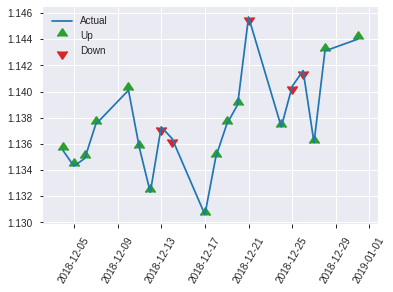


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.12531090396660263
RMSE: 0.35399280213953876
LogLoss: 0.38732159831990837
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.87097666550136
Residual deviance: 198.30865833979308
AIC: 300.30865833979306
AUC: 0.9100732600732601
pr_auc: 0.9110305910305169
Gini: 0.8201465201465201
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3402886257855157: 


,0,1,Error,Rate
0,83.0,43.0,0.3413,(43.0/126.0)
1,6.0,124.0,0.0462,(6.0/130.0)
Total,89.0,167.0,0.1914,(49.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3402886,0.8350168,166.0
max f2,0.2906531,0.9084406,178.0
max f0point5,0.6469150,0.8614232,100.0
max accuracy,0.6469150,0.8164062,100.0
max precision,0.9951504,1.0,0.0
max recall,0.0887642,1.0,219.0
max specificity,0.9951504,1.0,0.0
max absolute_mcc,0.6469150,0.6508300,100.0
max min_per_class_accuracy,0.5085144,0.7936508,129.0
max mean_per_class_accuracy,0.6469150,0.8181319,100.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9924487,1.9692308,1.9692308,1.0,0.9937666,1.0,0.9937666,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9901746,1.9692308,1.9692308,1.0,0.9911322,1.0,0.9924494,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9853129,1.9692308,1.9692308,1.0,0.9879536,1.0,0.9913255,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9721173,1.9692308,1.9692308,1.0,0.9775431,1.0,0.9875666,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9597258,1.9692308,1.9692308,1.0,0.9714614,1.0,0.9850889,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9290962,1.9692308,1.9692308,1.0,0.9465734,1.0,0.9658312,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8659387,1.9692308,1.9692308,1.0,0.8977294,1.0,0.9431306,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.8246361,1.9692308,1.9692308,1.0,0.8459938,1.0,0.9188464,0.1,0.4,96.9230769,96.9230769
,9,0.3007812,0.7226093,1.6541538,1.8669331,0.84,0.7850697,0.9480519,0.8754124,0.1615385,0.5615385,65.4153846,86.6933067
,10,0.4023438,0.6450908,1.4390533,1.7589246,0.7307692,0.6779969,0.8932039,0.8255794,0.1461538,0.7076923,43.9053254,75.8924571


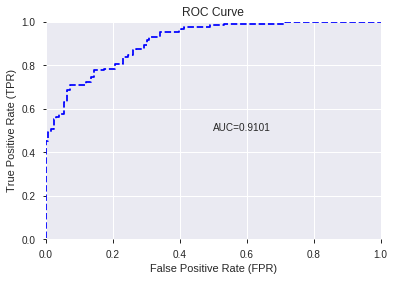

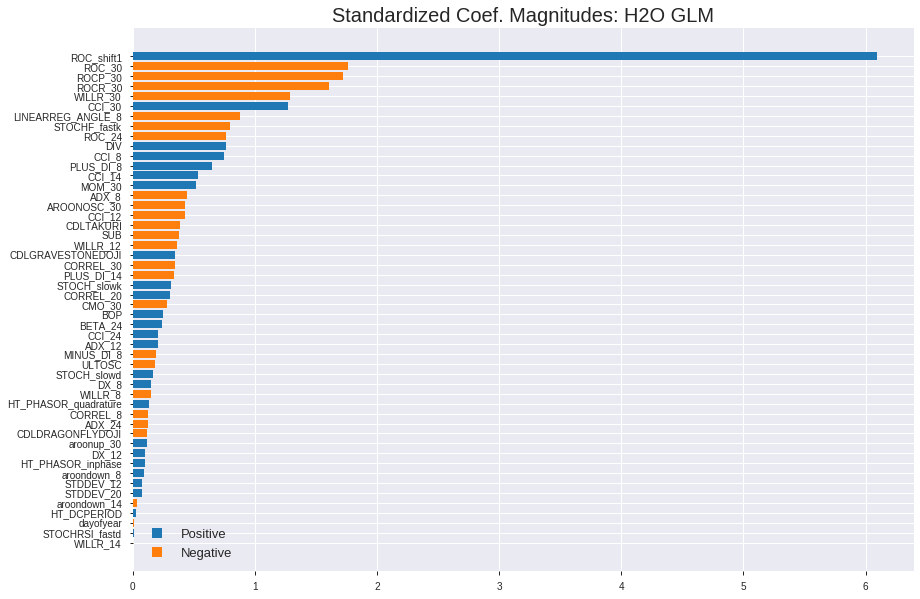

'log_likelihood'
--2019-12-20 18:16:43--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.171.131
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.171.131|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


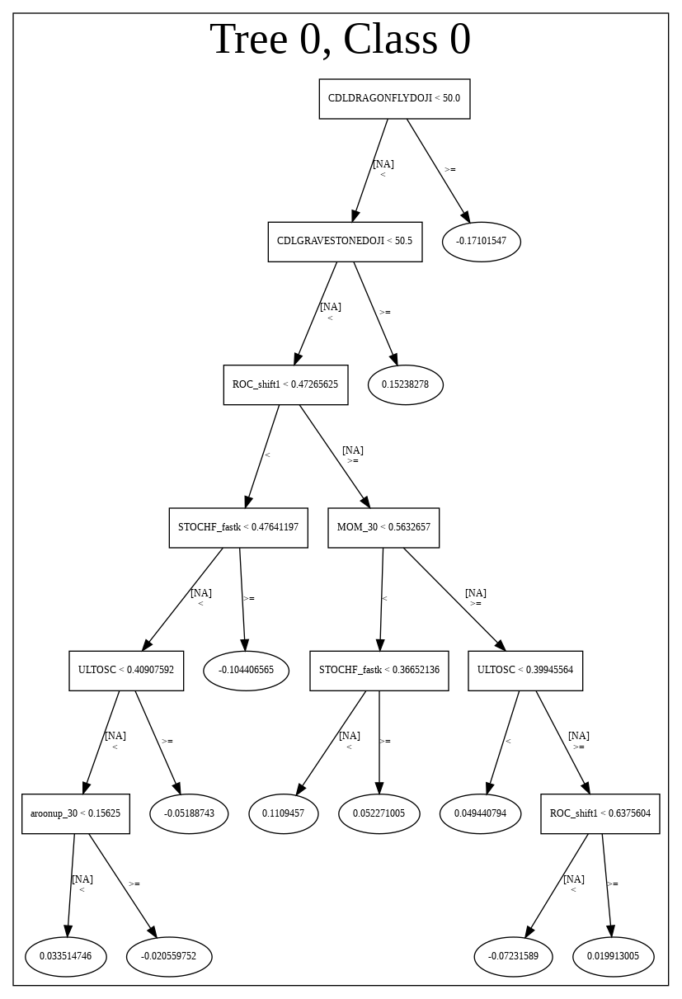

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_181626_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_181626_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_392_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_392

['ROC_shift1',
 'ROC_30',
 'ROCP_30',
 'ROCR_30',
 'WILLR_30',
 'CCI_30',
 'LINEARREG_ANGLE_8',
 'STOCHF_fastk',
 'ROC_24',
 'DIV',
 'CCI_8',
 'PLUS_DI_8',
 'CCI_14',
 'MOM_30',
 'ADX_8',
 'AROONOSC_30',
 'CCI_12',
 'CDLTAKURI',
 'SUB',
 'WILLR_12',
 'CDLGRAVESTONEDOJI',
 'CORREL_30',
 'PLUS_DI_14',
 'STOCH_slowk',
 'CORREL_20',
 'CMO_30',
 'BOP',
 'BETA_24',
 'CCI_24',
 'ADX_12',
 'MINUS_DI_8',
 'ULTOSC',
 'STOCH_slowd',
 'DX_8',
 'WILLR_8',
 'HT_PHASOR_quadrature',
 'CORREL_8',
 'ADX_24',
 'CDLDRAGONFLYDOJI',
 'aroonup_30',
 'DX_12',
 'HT_PHASOR_inphase',
 'aroondown_8',
 'STDDEV_12',
 'STDDEV_20',
 'aroondown_14',
 'HT_DCPERIOD',
 'dayofyear',
 'STOCHRSI_fastd',
 'WILLR_14']

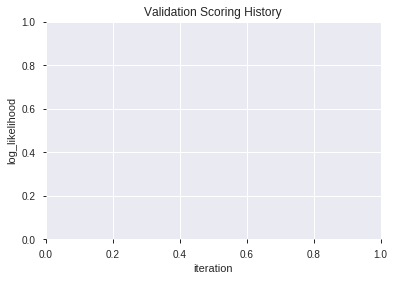

In [256]:
# All algos with top XGBoost features
model_train(feature_name='XGBF',model_algo=None,features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [258]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [259]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [260]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [261]:
# DRF with top PCA features
model_train(feature_name='PCA',model_algo="DRF",training_frame=training_frame)

[]

In [262]:
# GBM with top PCA features
model_train(feature_name='PCA',model_algo="GBM",training_frame=training_frame)

[]

In [263]:
# StackedEnsemble with top PCA features
model_train(feature_name='PCA',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [264]:
# All algos with top PCA features
model_train(feature_name='PCA',model_algo=None,training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [266]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [267]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [268]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [269]:
# DRF with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DRF",training_frame=training_frame)

[]

In [270]:
# GBM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GBM",training_frame=training_frame)

[]

In [271]:
# StackedEnsemble with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [272]:
# All algos with Generalized Low Rank
model_train(feature_name='GLRM',model_algo=None,training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [274]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [275]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [276]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [277]:
# DRF with low correlation features
model_train(feature_name='HCF',model_algo="DRF",features_list=features_list)

[]

In [278]:
# GBM with low correlation features
model_train(feature_name='HCF',model_algo="GBM",features_list=features_list)

[]

In [279]:
# StackedEnsemble with low correlation features
model_train(feature_name='HCF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [280]:
# All algos with low correlation features
model_train(feature_name='HCF',model_algo=None,features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [282]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [283]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [284]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [285]:
# DRF with Low Variance features
model_train(feature_name='LVF',model_algo="DRF",features_list=features_list)

[]

In [286]:
# GBM with Low Variance features
model_train(feature_name='LVF',model_algo="GBM",features_list=features_list)

[]

In [287]:
# StackedEnsemble with Low Variance features
model_train(feature_name='LVF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [288]:
# All algos with Low Variance features
model_train(feature_name='LVF',model_algo=None,features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [290]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [291]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [292]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [293]:
# DRF with Select k best features
model_train(feature_name='KBest',model_algo="DRF",features_list=features_list)

[]

In [294]:
# GBM with Select k best features
model_train(feature_name='KBest',model_algo="GBM",features_list=features_list)

[]

In [295]:
# StackedEnsemble with Select k best features
model_train(feature_name='KBest',model_algo="StackedEnsemble",features_list=features_list)

[]

In [296]:
# All algos with Select k best features
model_train(feature_name='KBest',model_algo=None,features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [298]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [299]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [300]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [301]:
# DRF with Select Percentile features
model_train(feature_name='Percentile',model_algo="DRF",features_list=features_list)

[]

In [302]:
# GBM with Select Percentile features
model_train(feature_name='Percentile',model_algo="GBM",features_list=features_list)

[]

In [303]:
# StackedEnsemble with Select Percentile features
model_train(feature_name='Percentile',model_algo="StackedEnsemble",features_list=features_list)

[]

In [304]:
# All algos with Select Percentile features
model_train(feature_name='Percentile',model_algo=None,features_list=features_list)

[]

In [305]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [830] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


18

['MINUS_DI_8',
 'PLUS_DI_8',
 'WILLR_8',
 'WILLR_12',
 'ROC_shift1',
 'STOCH_slowk',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'ULTOSC',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER',
 'CDLSHOOTINGSTAR',
 'CDLTAKURI']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191220_181652_model_5,0.795299,0.524033,0.348840,0.423696,0.179518
1,DeepLearning_grid_1_AutoML_20191220_181652_model_3,0.792796,0.533164,0.316361,0.425729,0.181245
2,DeepLearning_grid_1_AutoML_20191220_181652_model_1,0.790842,0.541504,0.298779,0.429685,0.184629
3,DeepLearning_grid_1_AutoML_20191220_181652_model_9,0.789621,0.545499,0.286752,0.430614,0.185428
4,DeepLearning_grid_1_AutoML_20191220_181652_model_6,0.789499,0.535923,0.286752,0.427869,0.183072
5,DeepLearning_grid_1_AutoML_20191220_181652_model_2,0.787546,0.551251,0.323687,0.433977,0.188336
6,DeepLearning_grid_1_AutoML_20191220_181652_model_8,0.786142,0.561475,0.336569,0.437644,0.191532
7,DeepLearning_1_AutoML_20191220_181652,0.785775,0.554301,0.332234,0.436614,0.190632
8,DeepLearning_grid_1_AutoML_20191220_181652_model_4,0.782357,0.540361,0.336569,0.431505,0.186197
9,DeepLearning_grid_1_AutoML_20191220_181652_model_7,0.775366,0.540896,0.368559,0.431620,0.186296


,variable,relative_importance,scaled_importance,percentage
0,ULTOSC,1.000000,1.000000,0.085470
1,CDLGRAVESTONEDOJI,0.923803,0.923803,0.078958
2,ROC_shift1,0.859416,0.859416,0.073455
3,CDLDRAGONFLYDOJI,0.824452,0.824452,0.070466
4,CDLTAKURI,0.818161,0.818161,0.069929
5,STOCHF_fastk,0.778999,0.778999,0.066581
6,MINUS_DI_8,0.768715,0.768715,0.065702
7,PLUS_DI_8,0.766095,0.766095,0.065478
8,WILLR_12,0.722045,0.722045,0.061713
9,CDLINVERTEDHAMMER,0.588280,0.588280,0.050281


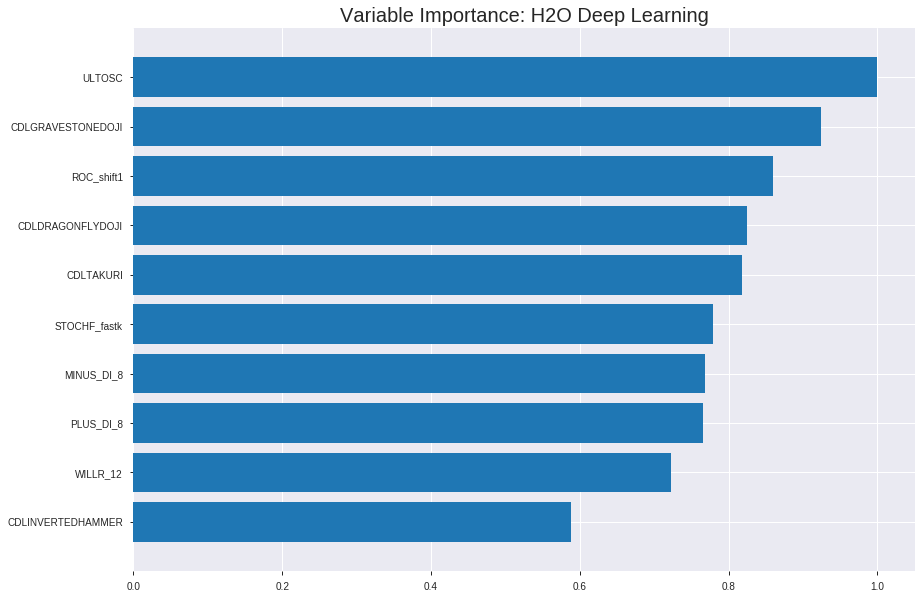

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191220_181652_model_5


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1903858729423235
RMSE: 0.43633229646947236
LogLoss: 0.5541186177596347
Mean Per-Class Error: 0.32049287518037517
AUC: 0.771064439033189
pr_auc: 0.7743720466429719
Gini: 0.542128878066378
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3403223668891979: 


,0,1,Error,Rate
0,373.0,518.0,0.5814,(518.0/891.0)
1,73.0,823.0,0.0815,(73.0/896.0)
Total,446.0,1341.0,0.3307,(591.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3403224,0.7358069,274.0
max f2,0.1846883,0.8577569,331.0
max f0point5,0.6687559,0.6906847,111.0
max accuracy,0.4213427,0.6799105,237.0
max precision,0.9944640,1.0,0.0
max recall,0.0262694,1.0,393.0
max specificity,0.9944640,1.0,0.0
max absolute_mcc,0.3403224,0.3895327,274.0
max min_per_class_accuracy,0.4703690,0.6752232,204.0
max mean_per_class_accuracy,0.4213427,0.6795071,237.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 48.75 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9793887,1.8836186,1.8836186,0.9444444,0.9862329,0.9444444,0.9862329,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.9735660,1.9944196,1.9390191,1.0,0.9768356,0.9722222,0.9815343,0.0200893,0.0390625,99.4419643,93.9019097
,3,0.0302182,0.9609315,1.7728175,1.8836186,0.8888889,0.9679087,0.9444444,0.9769924,0.0178571,0.0569196,77.2817460,88.3618552
,4,0.0402910,0.9498404,1.9944196,1.9113188,1.0,0.9560755,0.9583333,0.9717632,0.0200893,0.0770089,99.4419643,91.1318824
,5,0.0503637,0.9400309,1.9944196,1.9279390,1.0,0.9448638,0.9666667,0.9663833,0.0200893,0.0970982,99.4419643,92.7938988
,6,0.1001679,0.8675418,1.8151460,1.8718575,0.9101124,0.9040756,0.9385475,0.9354035,0.0904018,0.1875,81.5145967,87.1857542
,7,0.1499720,0.7685428,1.7030999,1.8158149,0.8539326,0.8121369,0.9104478,0.8944679,0.0848214,0.2723214,70.3099920,81.5814899
,8,0.2003358,0.7004632,1.5733755,1.7548664,0.7888889,0.7349493,0.8798883,0.8543655,0.0792411,0.3515625,57.3375496,75.4866446
,9,0.2999440,0.5963113,1.0980513,1.5367450,0.5505618,0.6447642,0.7705224,0.7847591,0.109375,0.4609375,9.8051264,53.6744986
,10,0.4001119,0.5180377,1.0919169,1.4253824,0.5474860,0.5564570,0.7146853,0.7276037,0.109375,0.5703125,9.1916899,42.5382430




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19153629899885524
RMSE: 0.4376486021899936
LogLoss: 0.5771496735691583
Mean Per-Class Error: 0.27958275809173183
AUC: 0.7854809019788311
pr_auc: 0.741710443222996
Gini: 0.5709618039576623
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4151423932808993: 


,0,1,Error,Rate
0,119.0,146.0,0.5509,(146.0/265.0)
1,21.0,225.0,0.0854,(21.0/246.0)
Total,140.0,371.0,0.3268,(167.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4151424,0.7293355,278.0
max f2,0.1256913,0.84375,353.0
max f0point5,0.5709616,0.7214156,177.0
max accuracy,0.5709616,0.7221135,177.0
max precision,0.9956739,1.0,0.0
max recall,0.0262689,1.0,399.0
max specificity,0.9956739,1.0,0.0
max absolute_mcc,0.5709616,0.4443921,177.0
max min_per_class_accuracy,0.5167976,0.7132075,205.0
max mean_per_class_accuracy,0.5434309,0.7204172,186.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 53.37 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9841184,1.3848238,1.3848238,0.6666667,0.9897603,0.6666667,0.9897603,0.0162602,0.0162602,38.4823848,38.4823848
,2,0.0215264,0.9814201,1.6617886,1.5107169,0.8,0.9823463,0.7272727,0.9863903,0.0162602,0.0325203,66.1788618,51.0716925
,3,0.0313112,0.9780729,2.0772358,1.6877541,1.0,0.9797349,0.8125,0.9843105,0.0203252,0.0528455,107.7235772,68.7754065
,4,0.0410959,0.9736658,1.6617886,1.6815718,0.8,0.9763406,0.8095238,0.9824129,0.0162602,0.0691057,66.1788618,68.1571816
,5,0.0508806,0.9675451,2.0772358,1.7576610,1.0,0.9711156,0.8461538,0.9802403,0.0203252,0.0894309,107.7235772,75.7661038
,6,0.1017613,0.9118956,1.7576610,1.7576610,0.8461538,0.9429972,0.8461538,0.9616188,0.0894309,0.1788618,75.7661038,75.7661038
,7,0.1506849,0.8633055,1.9110569,1.8074649,0.92,0.8857758,0.8701299,0.9369944,0.0934959,0.2723577,91.1056911,80.7464893
,8,0.2015656,0.7710202,1.5179800,1.7343910,0.7307692,0.8189464,0.8349515,0.9071959,0.0772358,0.3495935,51.7979987,73.4391033
,9,0.3013699,0.6645107,1.3848238,1.6186253,0.6666667,0.7191745,0.7792208,0.8449291,0.1382114,0.4878049,38.4823848,61.8625277
,10,0.4011742,0.5852806,1.3033636,1.5401943,0.6274510,0.6211437,0.7414634,0.7892556,0.1300813,0.6178862,30.3363622,54.0194329



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:19:34,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-20 18:19:37,1 min 2.018 sec,5068 obs/sec,8.4264130,1,15058.0,0.4569085,0.5998530,0.1649318,0.7228717,0.7343108,1.8836186,0.3961947,0.4514858,0.5915935,0.1835136,0.7486424,0.7495268,2.0772358,0.3659491
,2019-12-20 18:19:43,1 min 8.541 sec,6533 obs/sec,33.6569670,4,60145.0,0.4363323,0.5541186,0.2384505,0.7710644,0.7743720,1.8836186,0.3307219,0.4376486,0.5771497,0.2327941,0.7854809,0.7417104,1.3848238,0.3268102
,2019-12-20 18:19:49,1 min 14.570 sec,7043 obs/sec,58.8903190,7,105237.0,0.4319157,0.5468976,0.2537896,0.7833832,0.7811321,1.9944196,0.3251259,0.4394577,0.6113211,0.2264382,0.7815539,0.7412361,1.0386179,0.3287671
,2019-12-20 18:19:55,1 min 20.403 sec,7332 obs/sec,84.1029659,10,150292.0,0.4337513,0.5473938,0.2474334,0.7797218,0.7918917,1.9944196,0.3419138,0.4450111,0.5978080,0.2067637,0.7620341,0.7363858,2.0772358,0.3424658
,2019-12-20 18:20:01,1 min 26.117 sec,7534 obs/sec,109.2977057,13,195315.0,0.4162244,0.5100540,0.3070236,0.8159371,0.8178716,1.9944196,0.2921097,0.4417624,0.6004234,0.2183031,0.7803497,0.7388280,1.7310298,0.3091977
,2019-12-20 18:20:06,1 min 31.352 sec,7302 obs/sec,126.1343033,15,225402.0,0.4159169,0.5075054,0.3080471,0.8237847,0.8240445,1.9944196,0.2937885,0.4510158,0.6340194,0.1852124,0.7605077,0.7237927,1.0386179,0.3659491
,2019-12-20 18:20:06,1 min 31.670 sec,7297 obs/sec,126.1343033,15,225402.0,0.4363323,0.5541186,0.2384505,0.7710644,0.7743720,1.8836186,0.3307219,0.4376486,0.5771497,0.2327941,0.7854809,0.7417104,1.3848238,0.3268102


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
ULTOSC,1.0,1.0,0.0854705
CDLGRAVESTONEDOJI,0.9238027,0.9238027,0.0789579
ROC_shift1,0.8594159,0.8594159,0.0734547
CDLDRAGONFLYDOJI,0.8244523,0.8244523,0.0704663
CDLTAKURI,0.8181606,0.8181606,0.0699286
STOCHF_fastk,0.7789994,0.7789994,0.0665815
MINUS_DI_8,0.7687147,0.7687147,0.0657024
PLUS_DI_8,0.7660946,0.7660946,0.0654785
WILLR_12,0.7220446,0.7220446,0.0617135
CDLINVERTEDHAMMER,0.5882800,0.5882800,0.0502806


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.71484375)

('F1', 0.7426900584795322)

('auc', 0.7952991452991454)

('logloss', 0.5240329627945548)

('mean_per_class_error', 0.2833333333333333)

('rmse', 0.423695906492968)

('mse', 0.1795182211788979)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


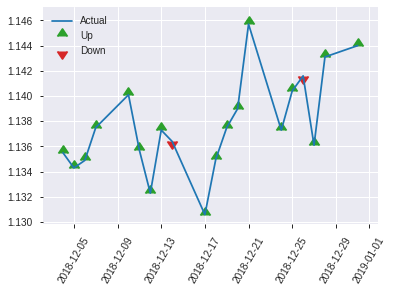


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.1795182211788979
RMSE: 0.423695906492968
LogLoss: 0.5240329627945548
Mean Per-Class Error: 0.2833333333333333
AUC: 0.7952991452991454
pr_auc: 0.816654910431328
Gini: 0.5905982905982907
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.29723480767429916: 


,0,1,Error,Rate
0,41.0,85.0,0.6746,(85.0/126.0)
1,3.0,127.0,0.0231,(3.0/130.0)
Total,44.0,212.0,0.3438,(88.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2972348,0.7426901,211.0
max f2,0.2972348,0.8674863,211.0
max f0point5,0.5241570,0.7414449,98.0
max accuracy,0.5241570,0.7148438,98.0
max precision,0.9907841,1.0,0.0
max recall,0.0358939,1.0,251.0
max specificity,0.9907841,1.0,0.0
max absolute_mcc,0.7402881,0.4519208,50.0
max min_per_class_accuracy,0.4770886,0.7,126.0
max mean_per_class_accuracy,0.5241570,0.7166667,98.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.53 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9826294,1.9692308,1.9692308,1.0,0.9870971,1.0,0.9870971,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9783508,1.9692308,1.9692308,1.0,0.9794029,1.0,0.9832500,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9757815,1.9692308,1.9692308,1.0,0.9770147,1.0,0.9816912,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9712954,1.9692308,1.9692308,1.0,0.9738315,1.0,0.9795476,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9668309,1.9692308,1.9692308,1.0,0.9694686,1.0,0.9779970,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9026147,1.9692308,1.9692308,1.0,0.9336366,1.0,0.9558168,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8290028,1.9692308,1.9692308,1.0,0.8710028,1.0,0.9275455,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7361830,1.5147929,1.8556213,0.7692308,0.7775636,0.9423077,0.8900500,0.0769231,0.3769231,51.4792899,85.5621302
,9,0.3007812,0.6153277,1.024,1.5856144,0.52,0.6676405,0.8051948,0.8178391,0.1,0.4769231,2.4000000,58.5614386
,10,0.4023438,0.5164998,1.3633136,1.5294996,0.6923077,0.5532857,0.7766990,0.7510587,0.1384615,0.6153846,36.3313609,52.9499627


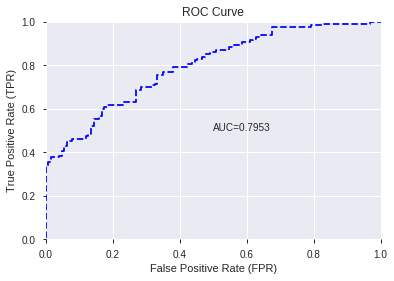

This function is available for GLM models only


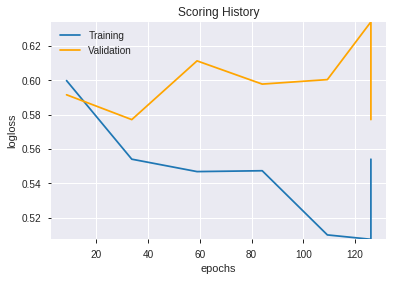

--2019-12-20 18:22:40--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.26.244
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.26.244|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


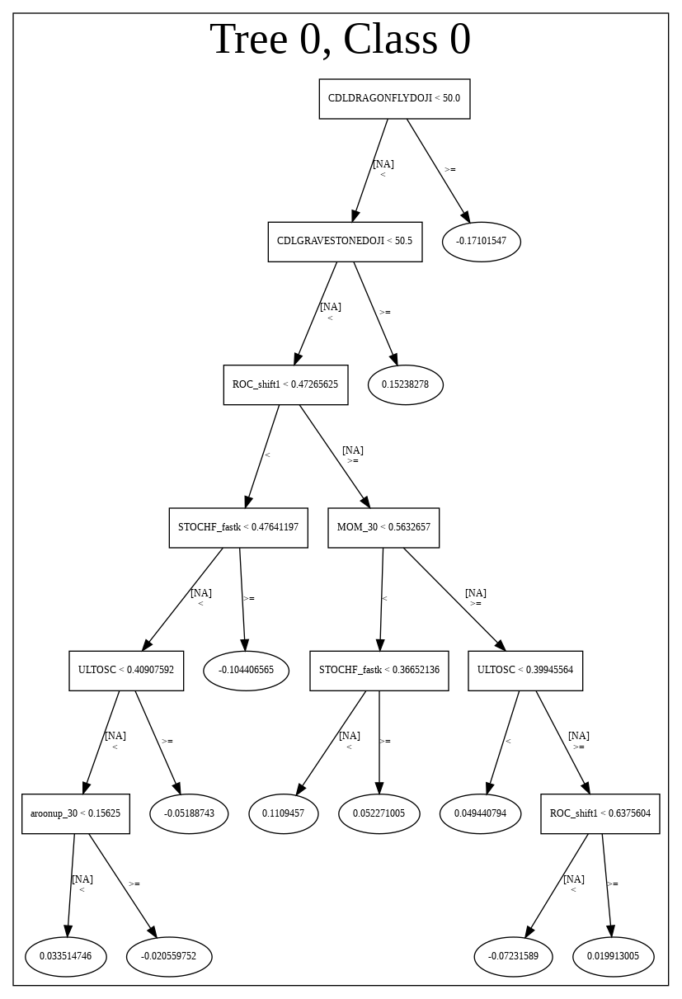

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191220_181652_model_5',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191220_181652_model_5',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_397_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'auto

['ULTOSC',
 'CDLGRAVESTONEDOJI',
 'ROC_shift1',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'WILLR_12',
 'CDLINVERTEDHAMMER',
 'STOCH_slowk',
 'WILLR_8',
 'STOCHF_fastd',
 'CDLHANGINGMAN',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLSHOOTINGSTAR',
 'CDLHAMMER']

In [306]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_182247_model_1,0.799939,0.533102,0.307326,0.426617,0.182002


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,0.643116,1.000000,0.156129
1,CDLDRAGONFLYDOJI,0.552720,0.859441,0.134184
2,STOCHF_fastk,0.463640,0.720927,0.112558
3,WILLR_12,0.395441,0.614883,0.096001
4,WILLR_8,0.392950,0.611008,0.095396
5,ROC_shift1,0.362194,0.563185,0.087930
6,PLUS_DI_8,0.275275,0.428032,0.066828
7,ULTOSC,0.248822,0.386901,0.060407
8,CDLTAKURI,0.155271,0.241435,0.037695
9,MINUS_DI_8,0.145310,0.225946,0.035277


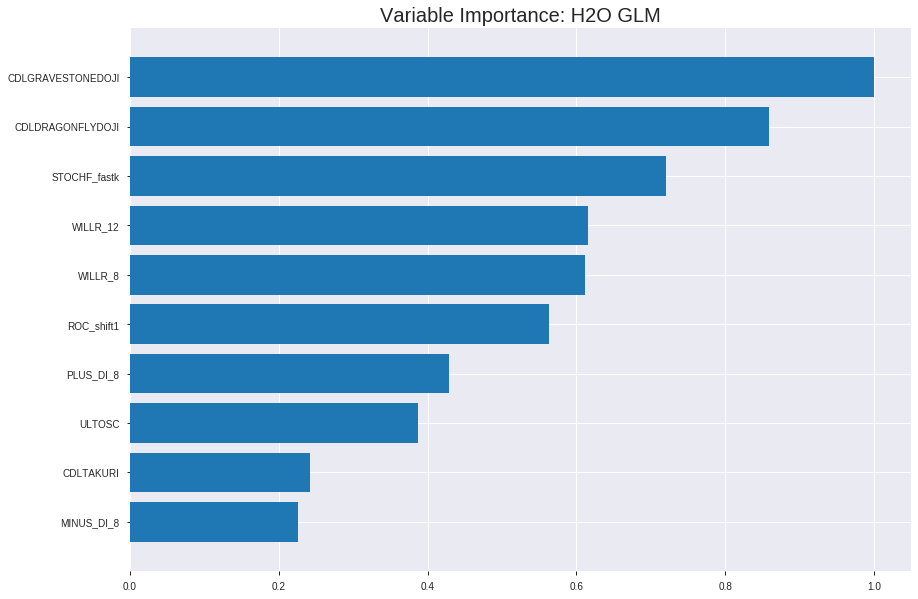

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_182247_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19342957144120726
RMSE: 0.4398062885421345
LogLoss: 0.5654885999759797
Null degrees of freedom: 1786
Residual degrees of freedom: 1768
Null deviance: 2477.294033375748
Residual deviance: 2021.0562563141511
AIC: 2059.056256314151
AUC: 0.7682385612073113
pr_auc: 0.7584032485111318
Gini: 0.5364771224146225
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39047088347221165: 


,0,1,Error,Rate
0,380.0,511.0,0.5735,(511.0/891.0)
1,84.0,812.0,0.0938,(84.0/896.0)
Total,464.0,1323.0,0.333,(595.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3904709,0.7318612,264.0
max f2,0.2598014,0.8583691,320.0
max f0point5,0.5484345,0.6980352,172.0
max accuracy,0.5484345,0.6871852,172.0
max precision,0.9805044,1.0,0.0
max recall,0.0245150,1.0,391.0
max specificity,0.9805044,1.0,0.0
max absolute_mcc,0.4098899,0.3808074,252.0
max min_per_class_accuracy,0.5073564,0.6790123,195.0
max mean_per_class_accuracy,0.5484345,0.6874223,172.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9560621,1.6620164,1.6620164,0.8333333,0.9662983,0.8333333,0.9662983,0.0167411,0.0167411,66.2016369,66.2016369
,2,0.0201455,0.9424498,1.8836186,1.7728175,0.9444444,0.9494409,0.8888889,0.9578696,0.0189732,0.0357143,88.3618552,77.2817460
,3,0.0302182,0.9303685,1.7728175,1.7728175,0.8888889,0.9359154,0.8888889,0.9505515,0.0178571,0.0535714,77.2817460,77.2817460
,4,0.0402910,0.9200687,1.6620164,1.7451172,0.8333333,0.9253872,0.875,0.9442604,0.0167411,0.0703125,66.2016369,74.5117188
,5,0.0503637,0.9119526,1.9944196,1.7949777,1.0,0.9165978,0.9,0.9387279,0.0200893,0.0904018,99.4419643,79.4977679
,6,0.1001679,0.8469146,1.8823736,1.8384315,0.9438202,0.8843858,0.9217877,0.9117087,0.09375,0.1841518,88.2373596,83.8431514
,7,0.1499720,0.7314420,1.5014170,1.7265125,0.7528090,0.7797574,0.8656716,0.8678890,0.0747768,0.2589286,50.1417035,72.6512527
,8,0.2003358,0.6751298,1.4182540,1.6490174,0.7111111,0.7026011,0.8268156,0.8263362,0.0714286,0.3303571,41.8253968,64.9017358
,9,0.2999440,0.6044345,1.4005756,1.5665124,0.7022472,0.6384187,0.7854478,0.7639308,0.1395089,0.4698661,40.0575592,56.6512443
,10,0.4001119,0.5586940,1.1030589,1.4504870,0.5530726,0.5795007,0.7272727,0.7177588,0.1104911,0.5803571,10.3058909,45.0487013




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.18720581728911675
RMSE: 0.4326728756105665
LogLoss: 0.5462089919454387
Null degrees of freedom: 510
Residual degrees of freedom: 492
Null deviance: 708.506742749742
Residual deviance: 558.2255897682384
AIC: 596.2255897682384
AUC: 0.8018944623408498
pr_auc: 0.7988211223227346
Gini: 0.6037889246816996
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43216570520883785: 


,0,1,Error,Rate
0,116.0,149.0,0.5623,(149.0/265.0)
1,16.0,230.0,0.065,(16.0/246.0)
Total,132.0,379.0,0.3229,(165.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4321657,0.736,291.0
max f2,0.4078499,0.8459870,305.0
max f0point5,0.6364295,0.7212581,141.0
max accuracy,0.5522606,0.7240705,210.0
max precision,0.9769287,1.0,0.0
max recall,0.0371056,1.0,396.0
max specificity,0.9769287,1.0,0.0
max absolute_mcc,0.5522606,0.4505824,210.0
max min_per_class_accuracy,0.5636567,0.7154472,200.0
max mean_per_class_accuracy,0.5522606,0.7252186,210.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 54.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9561604,2.0772358,2.0772358,1.0,0.9643581,1.0,0.9643581,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9491126,2.0772358,2.0772358,1.0,0.9523673,1.0,0.9589078,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9434555,2.0772358,2.0772358,1.0,0.9453163,1.0,0.9546604,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9370974,2.0772358,2.0772358,1.0,0.9406559,1.0,0.9513260,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9287917,2.0772358,2.0772358,1.0,0.9324303,1.0,0.9476922,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.8997114,1.9973421,2.0372889,0.9615385,0.9134529,0.9807692,0.9305725,0.1016260,0.2073171,99.7342089,103.7288931
,7,0.1506849,0.8283074,1.6617886,1.9153732,0.8,0.8733038,0.9220779,0.9119788,0.0813008,0.2886179,66.1788618,91.5373245
,8,0.2015656,0.7368333,1.4380863,1.7948930,0.6923077,0.7719470,0.8640777,0.8766310,0.0731707,0.3617886,43.8086304,79.4893046
,9,0.3013699,0.6492914,1.3033636,1.6321138,0.6274510,0.6868162,0.7857143,0.8137702,0.1300813,0.4918699,30.3363622,63.2113821
,10,0.4011742,0.6072830,1.3033636,1.5503272,0.6274510,0.6269843,0.7463415,0.7673015,0.1300813,0.6219512,30.3363622,55.0327186



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:22:47,0.000 sec,2,.16E2,19,1.3699804,1.3681731
,2019-12-20 18:22:47,0.005 sec,4,.96E1,19,1.3610853,1.3581472
,2019-12-20 18:22:47,0.010 sec,6,.6E1,19,1.3481608,1.3435518
,2019-12-20 18:22:47,0.015 sec,8,.37E1,19,1.3303349,1.3233675
,2019-12-20 18:22:47,0.020 sec,10,.23E1,19,1.3073630,1.2972740
---,---,---,---,---,---,---,---
,2019-12-20 18:22:47,0.085 sec,40,.11E-2,19,1.1307154,1.0924336
,2019-12-20 18:22:47,0.089 sec,41,.7E-3,19,1.1305598,1.0925052
,2019-12-20 18:22:47,0.091 sec,42,.44E-3,19,1.1304721,1.0925894
,2019-12-20 18:22:47,0.094 sec,43,.27E-3,19,1.1304262,1.0926627



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7265625)

('F1', 0.7417218543046358)

('auc', 0.7999389499389499)

('logloss', 0.5331019516487296)

('mean_per_class_error', 0.27350427350427353)

('rmse', 0.42661693613342483)

('mse', 0.18200201019587067)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


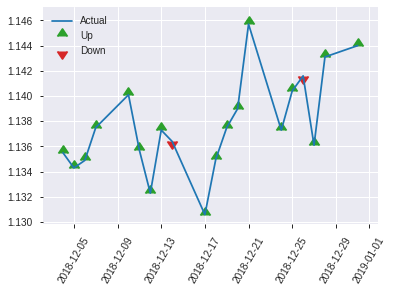


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.18200201019587067
RMSE: 0.42661693613342483
LogLoss: 0.5331019516487296
Null degrees of freedom: 255
Residual degrees of freedom: 237
Null deviance: 354.87097666550136
Residual deviance: 272.9481992441496
AIC: 310.9481992441496
AUC: 0.7999389499389499
pr_auc: 0.8165038985478235
Gini: 0.5998778998778997
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4293430537246623: 


,0,1,Error,Rate
0,66.0,60.0,0.4762,(60.0/126.0)
1,18.0,112.0,0.1385,(18.0/130.0)
Total,84.0,172.0,0.3047,(78.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4293431,0.7417219,171.0
max f2,0.2160930,0.8611482,228.0
max f0point5,0.5487853,0.7417582,103.0
max accuracy,0.5056435,0.7265625,129.0
max precision,0.9736622,1.0,0.0
max recall,0.0646862,1.0,244.0
max specificity,0.9736622,1.0,0.0
max absolute_mcc,0.5056435,0.4529915,129.0
max min_per_class_accuracy,0.5062900,0.7222222,128.0
max mean_per_class_accuracy,0.5056435,0.7264957,129.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 51.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9647987,1.9692308,1.9692308,1.0,0.9711661,1.0,0.9711661,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9563631,1.9692308,1.9692308,1.0,0.9594706,1.0,0.9653183,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9402610,1.9692308,1.9692308,1.0,0.9479899,1.0,0.9609862,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9348342,1.9692308,1.9692308,1.0,0.9378452,1.0,0.9546750,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9286543,1.9692308,1.9692308,1.0,0.9318377,1.0,0.9511616,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8478172,1.9692308,1.9692308,1.0,0.8918117,1.0,0.9214867,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7628570,1.8177515,1.9187377,0.9230769,0.8163157,0.9743590,0.8864297,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.6911938,1.3633136,1.7798817,0.6923077,0.7071932,0.9038462,0.8416205,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6174966,1.3390769,1.6367632,0.68,0.6463489,0.8311688,0.7782207,0.1307692,0.4923077,33.9076923,63.6763237
,10,0.4023438,0.5608665,1.2118343,1.5294996,0.6153846,0.5947545,0.7766990,0.7319088,0.1230769,0.6153846,21.1834320,52.9499627


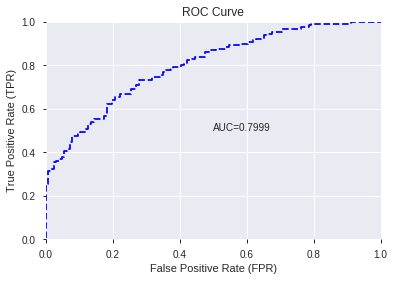

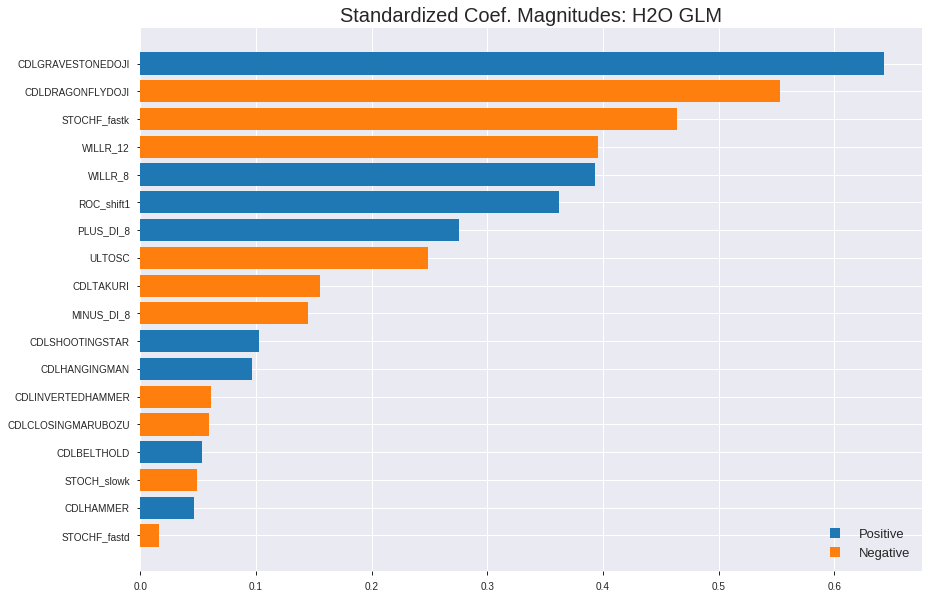

'log_likelihood'
--2019-12-20 18:22:51--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.41.124
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.41.124|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


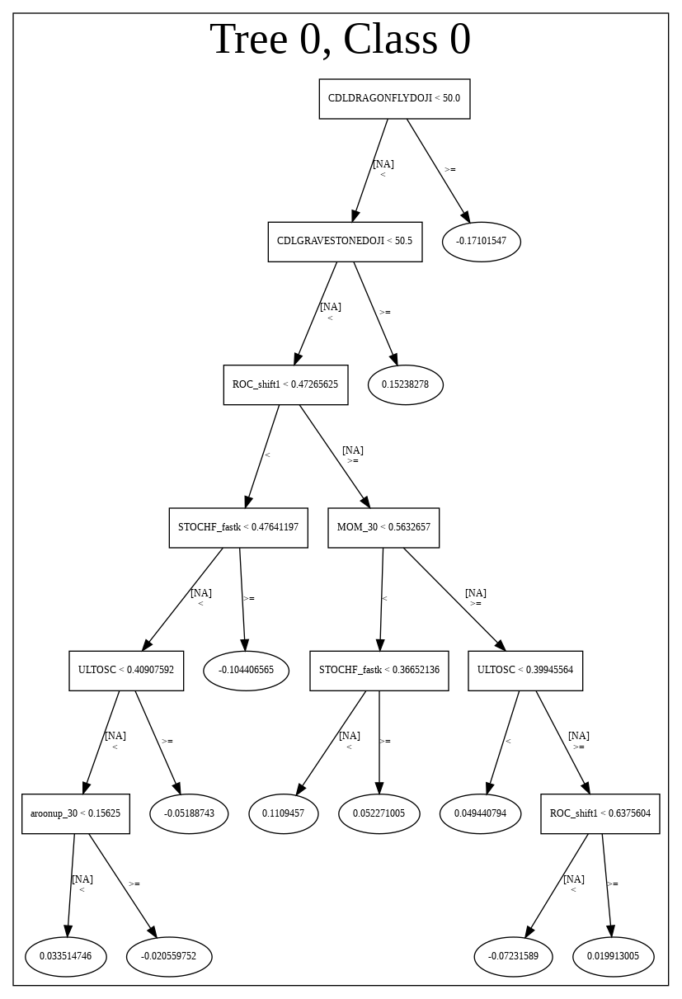

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_182247_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_182247_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_402_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_402

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'WILLR_12',
 'WILLR_8',
 'ROC_shift1',
 'PLUS_DI_8',
 'ULTOSC',
 'CDLTAKURI',
 'MINUS_DI_8',
 'CDLSHOOTINGSTAR',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER',
 'CDLCLOSINGMARUBOZU',
 'CDLBELTHOLD',
 'STOCH_slowk',
 'CDLHAMMER',
 'STOCHF_fastd']

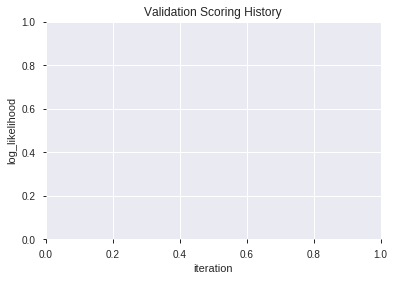

In [307]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20191220_182258,0.799389,0.537521,0.311538,0.427853,0.183058
1,XGBoost_grid_1_AutoML_20191220_182258_model_6,0.799328,0.527576,0.320452,0.424530,0.180226
2,XGBoost_grid_1_AutoML_20191220_182258_model_3,0.799084,0.533333,0.324054,0.426140,0.181596
3,XGBoost_grid_1_AutoML_20191220_182258_model_7,0.795604,0.539935,0.303724,0.429385,0.184371
4,XGBoost_grid_1_AutoML_20191220_182258_model_2,0.794444,0.537939,0.328388,0.428531,0.183639
5,XGBoost_grid_1_AutoML_20191220_182258_model_4,0.793040,0.546806,0.316361,0.431055,0.185809
6,XGBoost_3_AutoML_20191220_182258,0.791697,0.540329,0.335836,0.429711,0.184652
7,XGBoost_grid_1_AutoML_20191220_182258_model_1,0.790781,0.535058,0.340293,0.427883,0.183084
8,XGBoost_grid_1_AutoML_20191220_182258_model_5,0.789927,0.550687,0.347985,0.436680,0.190689
9,XGBoost_2_AutoML_20191220_182258,0.787668,0.547555,0.336325,0.433244,0.187700


,variable,relative_importance,scaled_importance,percentage
0,MINUS_DI_8,846.564575,1.000000,0.110874
1,WILLR_8,798.935913,0.943739,0.104636
2,CDLGRAVESTONEDOJI,736.808838,0.870352,0.096499
3,CDLTAKURI,729.811707,0.862086,0.095583
4,ROC_shift1,711.455566,0.840403,0.093179
5,PLUS_DI_8,683.827026,0.807767,0.089560
6,WILLR_12,655.992065,0.774887,0.085915
7,STOCHF_fastk,645.902832,0.762969,0.084593
8,ULTOSC,625.647827,0.739043,0.081941
9,STOCH_slowk,525.531799,0.620782,0.068829


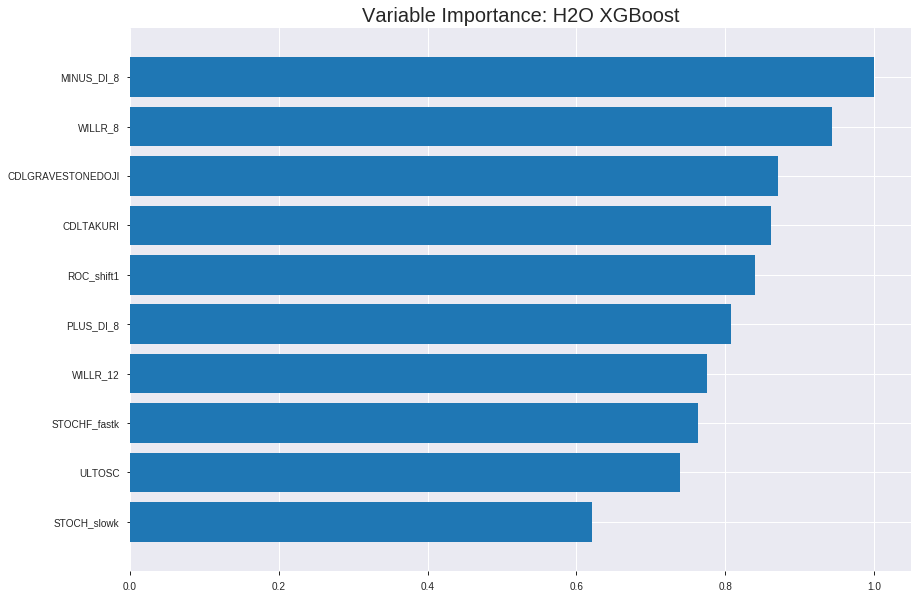

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20191220_182258


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1408846660457972
RMSE: 0.37534606171611445
LogLoss: 0.4478150291324904
Mean Per-Class Error: 0.16900277577360912
AUC: 0.9037610730319063
pr_auc: 0.9004142928179784
Gini: 0.8075221460638127
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47384753823280334: 


,0,1,Error,Rate
0,692.0,199.0,0.2233,(199.0/891.0)
1,110.0,786.0,0.1228,(110.0/896.0)
Total,802.0,985.0,0.1729,(309.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4738475,0.8357257,212.0
max f2,0.3726434,0.8891431,264.0
max f0point5,0.5462487,0.8441092,178.0
max accuracy,0.5135303,0.8310017,195.0
max precision,0.9224280,1.0,0.0
max recall,0.1035517,1.0,378.0
max specificity,0.9224280,1.0,0.0
max absolute_mcc,0.5105256,0.6620188,196.0
max min_per_class_accuracy,0.5135303,0.8294052,195.0
max mean_per_class_accuracy,0.5135303,0.8309972,195.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.12 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8990712,1.9944196,1.9944196,1.0,0.9099267,1.0,0.9099267,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.8892643,1.9944196,1.9944196,1.0,0.8939820,1.0,0.9019544,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8828773,1.8836186,1.9574859,0.9444444,0.8859694,0.9814815,0.8966261,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.8734486,1.9944196,1.9667194,1.0,0.8791517,0.9861111,0.8922575,0.0200893,0.0792411,99.4419643,96.6719370
,5,0.0503637,0.8675835,1.9944196,1.9722594,1.0,0.8698758,0.9888889,0.8877811,0.0200893,0.0993304,99.4419643,97.2259425
,6,0.1001679,0.8297293,1.9271920,1.9498516,0.9662921,0.8474616,0.9776536,0.8677340,0.0959821,0.1953125,92.7192014,94.9851606
,7,0.1499720,0.7934654,1.8823736,1.9274429,0.9438202,0.8114235,0.9664179,0.8490339,0.09375,0.2890625,88.2373596,92.7442864
,8,0.2003358,0.7451119,1.7506572,1.8829996,0.8777778,0.7706592,0.9441341,0.8293307,0.0881696,0.3772321,75.0657242,88.2999551
,9,0.2999440,0.6635059,1.7143045,1.8269777,0.8595506,0.7029754,0.9160448,0.7873694,0.1707589,0.5479911,71.4304524,82.6977695
,10,0.4001119,0.5830727,1.5598813,1.7601102,0.7821229,0.6222387,0.8825175,0.7460290,0.15625,0.7042411,55.9881285,76.0110202




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19082462210926837
RMSE: 0.43683477667107545
LogLoss: 0.560991870297526
Mean Per-Class Error: 0.2675333640128854
AUC: 0.7942015646571561
pr_auc: 0.7721442562518916
Gini: 0.5884031293143122
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41688284277915955: 


,0,1,Error,Rate
0,136.0,129.0,0.4868,(129.0/265.0)
1,32.0,214.0,0.1301,(32.0/246.0)
Total,168.0,343.0,0.3151,(161.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4168828,0.7266553,260.0
max f2,0.2195853,0.8438819,343.0
max f0point5,0.7364407,0.7352941,111.0
max accuracy,0.6435952,0.7338552,165.0
max precision,0.9190937,1.0,0.0
max recall,0.0988108,1.0,383.0
max specificity,0.9190937,1.0,0.0
max absolute_mcc,0.6435952,0.4670096,165.0
max min_per_class_accuracy,0.5944904,0.7245283,185.0
max mean_per_class_accuracy,0.6274042,0.7324666,171.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 54.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9108349,2.0772358,2.0772358,1.0,0.9154352,1.0,0.9154352,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9023407,1.2463415,1.6995565,0.6,0.9058375,0.8181818,0.9110726,0.0121951,0.0365854,24.6341463,69.9556541
,3,0.0313112,0.8916264,2.0772358,1.8175813,1.0,0.8944332,0.875,0.9058728,0.0203252,0.0569106,107.7235772,81.7581301
,4,0.0410959,0.8892167,2.0772358,1.8794038,1.0,0.8901738,0.9047619,0.9021349,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8855302,1.6617886,1.8375547,0.8,0.8874872,0.8846154,0.8993181,0.0162602,0.0934959,66.1788618,83.7554722
,6,0.1017613,0.8605901,1.9973421,1.9174484,0.9615385,0.8732420,0.9230769,0.8862800,0.1016260,0.1951220,99.7342089,91.7448405
,7,0.1506849,0.8299279,1.6617886,1.8344420,0.8,0.8452827,0.8831169,0.8729692,0.0813008,0.2764228,66.1788618,83.4441981
,8,0.2015656,0.8030545,1.5179800,1.7545584,0.7307692,0.8161463,0.8446602,0.8586256,0.0772358,0.3536585,51.7979987,75.4558371
,9,0.3013699,0.7337837,1.5884744,1.6995565,0.7647059,0.7687243,0.8181818,0.8288531,0.1585366,0.5121951,58.8474414,69.9556541
,10,0.4011742,0.6626436,1.0997131,1.5503272,0.5294118,0.6926680,0.7463415,0.7949729,0.1097561,0.6219512,9.9713056,55.0327186



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:22:58,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-20 18:22:58,0.056 sec,5.0,0.4711966,0.6367810,0.8377137,0.8310392,1.9574859,0.2462227,0.4729967,0.6401602,0.8097331,0.7034718,1.9174484,0.2876712
,2019-12-20 18:22:58,0.098 sec,10.0,0.4507478,0.5974233,0.8493279,0.8410200,1.8946987,0.2344712,0.4574287,0.6095763,0.8046786,0.7759391,1.6156278,0.2818004
,2019-12-20 18:22:58,0.142 sec,15.0,0.4358219,0.5682732,0.8560713,0.8471480,1.8836186,0.2188025,0.4472773,0.5887000,0.8057831,0.7775918,1.4837398,0.2876712
,2019-12-20 18:22:58,0.190 sec,20.0,0.4242038,0.5454250,0.8630639,0.8505636,1.9944196,0.2204813,0.4420087,0.5771237,0.8025924,0.7735008,1.3848238,0.2739726
,2019-12-20 18:22:58,0.239 sec,25.0,0.4146361,0.5261419,0.8689850,0.8565089,1.8836186,0.2148853,0.4381654,0.5678956,0.8005829,0.7720058,1.3848238,0.2622309
,2019-12-20 18:22:58,0.288 sec,30.0,0.4066653,0.5101392,0.8757440,0.8688584,1.9944196,0.2154449,0.4374855,0.5655494,0.7957049,0.7669606,1.3848238,0.2954990
,2019-12-20 18:22:58,0.340 sec,35.0,0.3997437,0.4961353,0.8814703,0.8734597,1.9944196,0.2143257,0.4357528,0.5606938,0.7981669,0.7709425,1.3848238,0.3052838
,2019-12-20 18:22:58,0.392 sec,40.0,0.3939534,0.4843114,0.8855795,0.8803850,1.9944196,0.1992166,0.4357954,0.5598052,0.7973922,0.7734546,1.3848238,0.3033268
,2019-12-20 18:22:59,0.450 sec,45.0,0.3890629,0.4746008,0.8901321,0.8841973,1.9944196,0.1869054,0.4366268,0.5611060,0.7945851,0.7699247,1.3848238,0.3013699


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
MINUS_DI_8,846.5645752,1.0,0.1108740
WILLR_8,798.9359131,0.9437389,0.1046361
CDLGRAVESTONEDOJI,736.8088379,0.8703516,0.0964994
CDLTAKURI,729.8117065,0.8620863,0.0955829
ROC_shift1,711.4555664,0.8404032,0.0931789
PLUS_DI_8,683.8270264,0.8077671,0.0895604
WILLR_12,655.9920654,0.7748872,0.0859148
STOCHF_fastk,645.9028320,0.7629694,0.0845935
ULTOSC,625.6478271,0.7390432,0.0819407
STOCH_slowk,525.5317993,0.6207817,0.0688285


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.71484375)

('F1', 0.742671009771987)

('auc', 0.7993894993894993)

('logloss', 0.5375212057765132)

('mean_per_class_error', 0.28504273504273503)

('rmse', 0.4278525154186388)

('mse', 0.18305777495005654)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


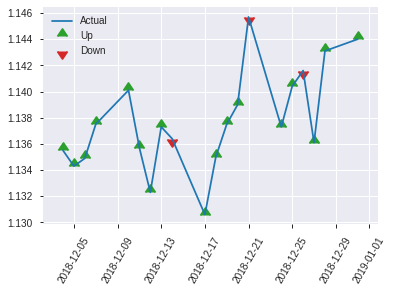


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.18305777495005654
RMSE: 0.4278525154186388
LogLoss: 0.5375212057765132
Mean Per-Class Error: 0.28504273504273503
AUC: 0.7993894993894993
pr_auc: 0.8191787386216003
Gini: 0.5987789987789987
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40021640062332153: 


,0,1,Error,Rate
0,63.0,63.0,0.5,(63.0/126.0)
1,16.0,114.0,0.1231,(16.0/130.0)
Total,79.0,177.0,0.3086,(79.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4002164,0.7426710,176.0
max f2,0.2065198,0.8636977,220.0
max f0point5,0.7693352,0.7485030,50.0
max accuracy,0.5496519,0.7148438,126.0
max precision,0.9225743,1.0,0.0
max recall,0.1039133,1.0,241.0
max specificity,0.9225743,1.0,0.0
max absolute_mcc,0.7693352,0.4714832,50.0
max min_per_class_accuracy,0.5412456,0.7142857,128.0
max mean_per_class_accuracy,0.5496519,0.7149573,126.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.43 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9110858,1.9692308,1.9692308,1.0,0.9171569,1.0,0.9171569,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.8972471,1.9692308,1.9692308,1.0,0.9040907,1.0,0.9106238,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8915004,1.9692308,1.9692308,1.0,0.8940859,1.0,0.9064893,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8840813,1.9692308,1.9692308,1.0,0.8867498,1.0,0.9011058,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8808697,1.9692308,1.9692308,1.0,0.8816427,1.0,0.8981115,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8531519,1.9692308,1.9692308,1.0,0.8697467,1.0,0.8839291,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7921180,1.8177515,1.9187377,0.9230769,0.8261219,0.9743590,0.8646600,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7685367,1.8177515,1.8934911,0.9230769,0.7826125,0.9615385,0.8441481,0.0923077,0.3846154,81.7751479,89.3491124
,9,0.3007812,0.6854090,1.1027692,1.6367632,0.56,0.7212750,0.8311688,0.8042543,0.1076923,0.4923077,10.2769231,63.6763237
,10,0.4023438,0.6117365,1.0603550,1.4912621,0.5384615,0.6517044,0.7572816,0.7657465,0.1076923,0.6,6.0355030,49.1262136


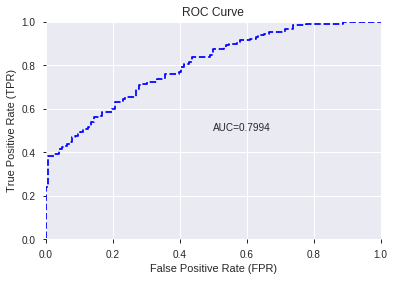

This function is available for GLM models only


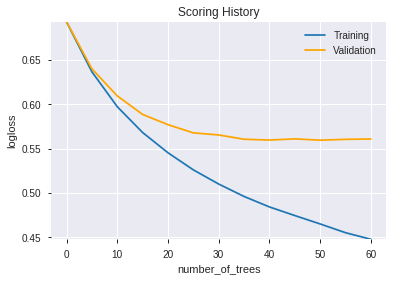

--2019-12-20 18:23:12--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.45.76
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.45.76|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.

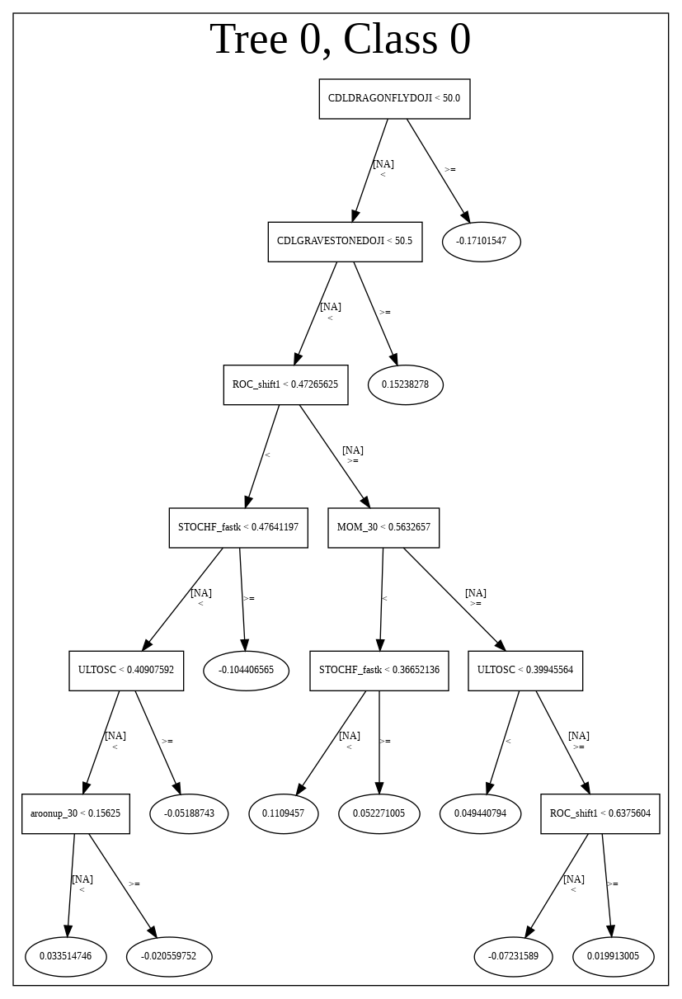

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20191220_182258',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20191220_182258',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_407_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_407_sid_be3a',
   'ty

['MINUS_DI_8',
 'WILLR_8',
 'CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'ROC_shift1',
 'PLUS_DI_8',
 'WILLR_12',
 'STOCHF_fastk',
 'ULTOSC',
 'STOCH_slowk',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastd',
 'CDLINVERTEDHAMMER',
 'CDLSHOOTINGSTAR']

In [308]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [309]:
# DRF with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191220_182336,0.798596,0.535490,0.290965,0.426896,0.182240
1,GBM_grid_1_AutoML_20191220_182336_model_2,0.796032,0.602774,0.315751,0.454373,0.206455
2,GBM_3_AutoML_20191220_182336,0.794994,0.538137,0.303602,0.430246,0.185112
3,GBM_2_AutoML_20191220_182336,0.793773,0.539536,0.299756,0.430302,0.185160
4,GBM_1_AutoML_20191220_182336,0.791758,0.542763,0.324298,0.431027,0.185784
5,GBM_grid_1_AutoML_20191220_182336_model_4,0.789133,0.656529,0.323565,0.481436,0.231780
6,GBM_grid_1_AutoML_20191220_182336_model_1,0.789133,0.594418,0.352686,0.450358,0.202822
7,GBM_grid_1_AutoML_20191220_182336_model_5,0.784799,0.685760,0.324298,0.496293,0.246307
8,GBM_4_AutoML_20191220_182336,0.781502,0.550826,0.335714,0.438368,0.192167
9,GBM_grid_1_AutoML_20191220_182336_model_3,0.756410,0.708661,0.356288,0.477264,0.227781


,variable,relative_importance,scaled_importance,percentage
0,CDLDRAGONFLYDOJI,128.114441,1.000000,0.177340
1,CDLGRAVESTONEDOJI,102.658272,0.801301,0.142103
2,CDLTAKURI,102.395401,0.799249,0.141739
3,STOCHF_fastk,70.253426,0.548365,0.097247
4,ULTOSC,62.091255,0.484655,0.085949
5,ROC_shift1,58.783806,0.458838,0.081371
6,WILLR_8,53.740910,0.419476,0.074390
7,MINUS_DI_8,47.552658,0.371173,0.065824
8,PLUS_DI_8,35.569214,0.277636,0.049236
9,WILLR_12,29.321978,0.228873,0.040589


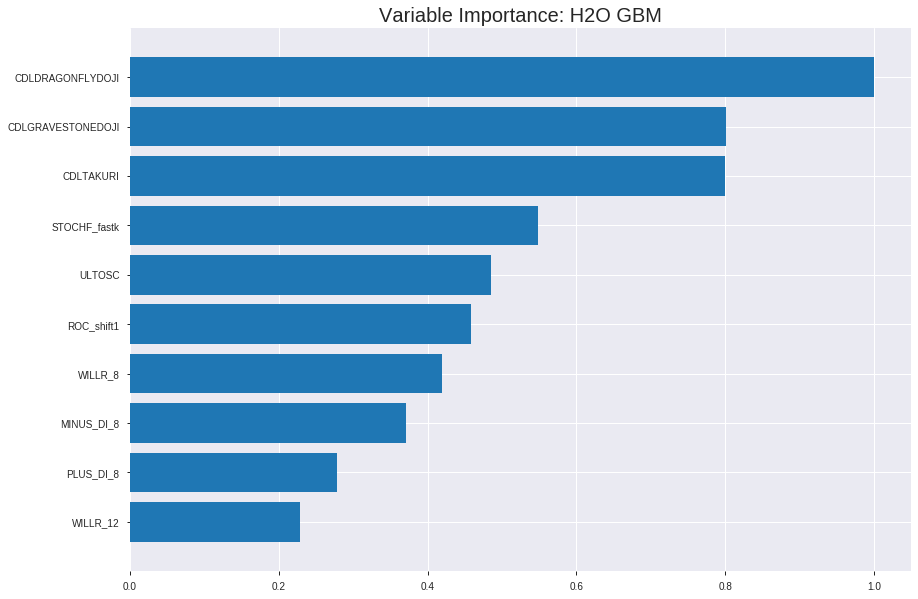

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191220_182336


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.170720202541283
RMSE: 0.4131830133745614
LogLoss: 0.5138903344714335
Mean Per-Class Error: 0.25010584515792855
AUC: 0.8311350108225107
pr_auc: 0.8246484320891728
Gini: 0.6622700216450215
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39891527814615885: 


,0,1,Error,Rate
0,507.0,384.0,0.431,(384.0/891.0)
1,98.0,798.0,0.1094,(98.0/896.0)
Total,605.0,1182.0,0.2697,(482.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3989153,0.7680462,255.0
max f2,0.3004980,0.8652113,302.0
max f0point5,0.5964876,0.7581736,153.0
max accuracy,0.5170702,0.7498601,192.0
max precision,0.9313975,1.0,0.0
max recall,0.0855983,1.0,388.0
max specificity,0.9313975,1.0,0.0
max absolute_mcc,0.5170702,0.4999179,192.0
max min_per_class_accuracy,0.5074753,0.7444196,197.0
max mean_per_class_accuracy,0.5170702,0.7498942,192.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.15 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9123733,1.8836186,1.8836186,0.9444444,0.9191338,0.9444444,0.9191338,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.9040312,1.8836186,1.8836186,0.9444444,0.9083926,0.9444444,0.9137632,0.0189732,0.0379464,88.3618552,88.3618552
,3,0.0302182,0.8940338,1.9944196,1.9205522,1.0,0.8991868,0.9629630,0.9089044,0.0200893,0.0580357,99.4419643,92.0552249
,4,0.0402910,0.8851323,1.7728175,1.8836186,0.8888889,0.8888747,0.9444444,0.9038970,0.0178571,0.0758929,77.2817460,88.3618552
,5,0.0503637,0.8749479,1.8836186,1.8836186,0.9444444,0.8803869,0.9444444,0.8991950,0.0189732,0.0948661,88.3618552,88.3618552
,6,0.1001679,0.8267820,1.8823736,1.8829996,0.9438202,0.8515042,0.9441341,0.8754828,0.09375,0.1886161,88.2373596,88.2999551
,7,0.1499720,0.7783998,1.7703275,1.8455824,0.8876404,0.8030663,0.9253731,0.8514340,0.0881696,0.2767857,77.0327548,84.5582356
,8,0.2003358,0.7239074,1.7063368,1.8105765,0.8555556,0.7513747,0.9078212,0.8262795,0.0859375,0.3627232,70.6336806,81.0576491
,9,0.2999440,0.6397997,1.4565986,1.6930241,0.7303371,0.6806278,0.8488806,0.7779101,0.1450893,0.5078125,45.6598616,69.3024137
,10,0.4001119,0.5794586,1.2256210,1.5760099,0.6145251,0.6079854,0.7902098,0.7353695,0.1227679,0.6305804,22.5621010,57.6009928




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.1914053767936909
RMSE: 0.43749900204879427
LogLoss: 0.5599271046810329
Mean Per-Class Error: 0.2692820984813622
AUC: 0.7969473845681853
pr_auc: 0.7882424599528636
Gini: 0.5938947691363705
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5232576233207129: 


,0,1,Error,Rate
0,164.0,101.0,0.3811,(101.0/265.0)
1,47.0,199.0,0.1911,(47.0/246.0)
Total,211.0,300.0,0.2896,(148.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5232576,0.7289377,227.0
max f2,0.1588567,0.8455625,347.0
max f0point5,0.6682270,0.7383178,154.0
max accuracy,0.6682270,0.7338552,154.0
max precision,0.9285281,1.0,0.0
max recall,0.0926858,1.0,385.0
max specificity,0.9285281,1.0,0.0
max absolute_mcc,0.6682270,0.4697252,154.0
max min_per_class_accuracy,0.6116842,0.7132075,187.0
max mean_per_class_accuracy,0.6662439,0.7307179,156.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 55.34 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9216569,2.0772358,2.0772358,1.0,0.9244365,1.0,0.9244365,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9144090,2.0772358,2.0772358,1.0,0.9163420,1.0,0.9207572,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9101945,2.0772358,2.0772358,1.0,0.9110351,1.0,0.9177191,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9070385,2.0772358,2.0772358,1.0,0.9085367,1.0,0.9155328,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9005349,1.6617886,1.9973421,0.8,0.9042936,0.9615385,0.9133714,0.0162602,0.1016260,66.1788618,99.7342089
,6,0.1017613,0.8690432,1.9174484,1.9573952,0.9230769,0.8847923,0.9423077,0.8990818,0.0975610,0.1991870,91.7448405,95.7395247
,7,0.1506849,0.8329312,1.7448780,1.8883962,0.84,0.8501764,0.9090909,0.8832035,0.0853659,0.2845528,74.4878049,88.8396157
,8,0.2015656,0.7887867,1.3581926,1.7545584,0.6538462,0.8077260,0.8446602,0.8641509,0.0691057,0.3536585,35.8192620,75.4558371
,9,0.3013699,0.7303301,1.5477443,1.6860680,0.7450980,0.7577057,0.8116883,0.8288996,0.1544715,0.5081301,54.7744301,68.6067997
,10,0.4011742,0.6694457,1.3033636,1.5908586,0.6274510,0.7004193,0.7658537,0.7969362,0.1300813,0.6382114,30.3363622,59.0858616



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:23:41,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-20 18:23:41,0.034 sec,5.0,0.4623589,0.6188953,0.7867402,0.7353750,1.8697684,0.3167320,0.4612958,0.6166564,0.7833487,0.6735765,2.0030488,0.3013699
,2019-12-20 18:23:41,0.068 sec,10.0,0.4448047,0.5826609,0.7960871,0.7829022,1.9146429,0.3240067,0.4470495,0.5861319,0.7856420,0.7394537,1.8695122,0.2759295
,2019-12-20 18:23:41,0.099 sec,15.0,0.4352637,0.5614905,0.8006929,0.7874946,1.8946987,0.3195299,0.4402224,0.5697179,0.7895613,0.7490035,2.0772358,0.2739726
,2019-12-20 18:23:41,0.129 sec,20.0,0.4285636,0.5467792,0.8074645,0.7999901,1.8994473,0.2893117,0.4373330,0.5622786,0.7939254,0.7791155,2.0772358,0.2778865
,2019-12-20 18:23:41,0.163 sec,25.0,0.4241643,0.5368215,0.8127211,0.8034312,1.8836186,0.2921097,0.4368499,0.5597330,0.7939408,0.7813465,2.0772358,0.2876712
,2019-12-20 18:23:41,0.198 sec,30.0,0.4196615,0.5273940,0.8200213,0.8123816,1.8836186,0.2725238,0.4358161,0.5569203,0.7974766,0.7877690,2.0772358,0.2778865
,2019-12-20 18:23:41,0.235 sec,35.0,0.4166637,0.5209474,0.8249252,0.8148072,1.9944196,0.2702854,0.4368687,0.5589214,0.7953367,0.7865103,2.0772358,0.2935421
,2019-12-20 18:23:41,0.270 sec,40.0,0.4131830,0.5138903,0.8311350,0.8246484,1.8836186,0.2697258,0.4374990,0.5599271,0.7969474,0.7882425,2.0772358,0.2896282


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLDRAGONFLYDOJI,128.1144409,1.0,0.1773405
CDLGRAVESTONEDOJI,102.6582718,0.8013013,0.1421032
CDLTAKURI,102.3954010,0.7992495,0.1417393
STOCHF_fastk,70.2534256,0.5483646,0.0972472
ULTOSC,62.0912552,0.4846546,0.0859489
ROC_shift1,58.7838058,0.4588382,0.0813706
WILLR_8,53.7409096,0.4194758,0.0743900
MINUS_DI_8,47.5526581,0.3711733,0.0658241
PLUS_DI_8,35.5692139,0.2776363,0.0492361
WILLR_12,29.3219776,0.2288733,0.0405885


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7265625)

('F1', 0.7448275862068966)

('auc', 0.7985958485958486)

('logloss', 0.5354899972294225)

('mean_per_class_error', 0.27252747252747256)

('rmse', 0.42689592634010926)

('mse', 0.18224013192577998)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           0
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


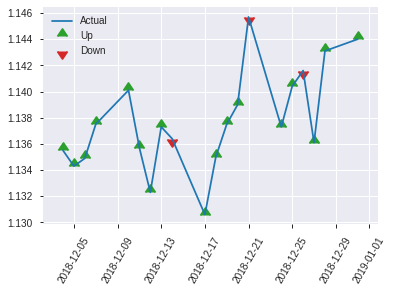


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.18224013192577998
RMSE: 0.42689592634010926
LogLoss: 0.5354899972294225
Mean Per-Class Error: 0.27252747252747256
AUC: 0.7985958485958486
pr_auc: 0.8169999582320855
Gini: 0.5971916971916973
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4374082392815384: 


,0,1,Error,Rate
0,74.0,52.0,0.4127,(52.0/126.0)
1,22.0,108.0,0.1692,(22.0/130.0)
Total,96.0,160.0,0.2891,(74.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4374082,0.7448276,159.0
max f2,0.2037894,0.86,228.0
max f0point5,0.5874760,0.7423208,113.0
max accuracy,0.5874760,0.7265625,113.0
max precision,0.9284000,1.0,0.0
max recall,0.1201994,1.0,242.0
max specificity,0.9284000,1.0,0.0
max absolute_mcc,0.7527857,0.4591291,48.0
max min_per_class_accuracy,0.5372015,0.7153846,127.0
max mean_per_class_accuracy,0.5874760,0.7274725,113.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.54 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9246911,1.9692308,1.9692308,1.0,0.9270104,1.0,0.9270104,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9123123,1.9692308,1.9692308,1.0,0.9180762,1.0,0.9225433,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9068432,1.9692308,1.9692308,1.0,0.9089394,1.0,0.9191423,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9027954,1.9692308,1.9692308,1.0,0.9051737,1.0,0.9153327,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8980096,1.9692308,1.9692308,1.0,0.9002059,1.0,0.9130055,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8663135,1.9692308,1.9692308,1.0,0.8849322,1.0,0.8989689,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8079192,1.9692308,1.9692308,1.0,0.8373355,1.0,0.8784244,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7425700,1.3633136,1.8177515,0.6923077,0.7672280,0.9230769,0.8506253,0.0692308,0.3692308,36.3313609,81.7751479
,9,0.3007812,0.6823859,1.024,1.5600400,0.52,0.7094901,0.7922078,0.8048022,0.1,0.4692308,2.4000000,56.0039960
,10,0.4023438,0.6192585,1.2875740,1.4912621,0.6538462,0.6559865,0.7572816,0.7672371,0.1307692,0.6,28.7573964,49.1262136


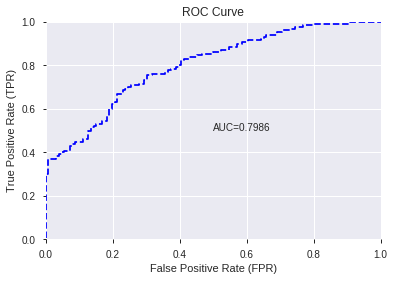

This function is available for GLM models only


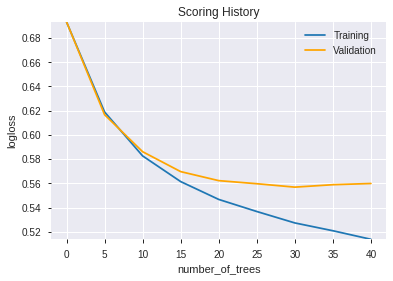

--2019-12-20 18:23:48--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.4.28
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.4.28|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1573.0
            depth:       1
            colId:       6
            colName:     STOCHF_fastk
            leftward:    true
            naVsRest:    false
            splitVal:    0.51171875
            isBitset:    false
            predValue:   0.058677305
            squaredErr:  387.57278
            leftChild:   Node 3
            rightC

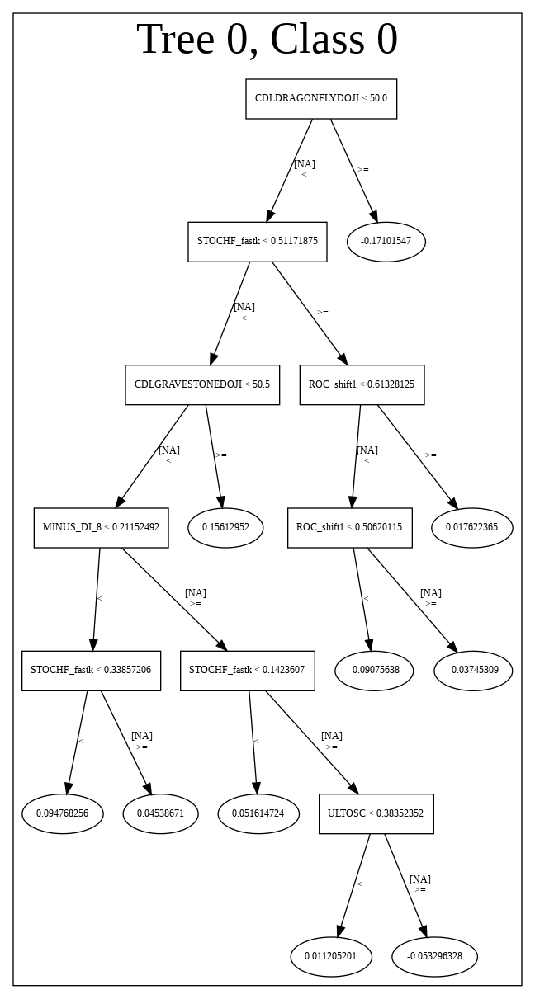

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191220_182336',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191220_182336',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_417_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_417_sid_be3a',
   'type': 'Ke

['CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'ULTOSC',
 'ROC_shift1',
 'WILLR_8',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'WILLR_12',
 'STOCHF_fastd',
 'STOCH_slowk',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER',
 'CDLSHOOTINGSTAR']

In [310]:
# GBM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GBM",features_list=features_list)

In [311]:
# StackedEnsemble with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_182355_model_1,0.799939,0.533102,0.307326,0.426617,0.182002
1,XGBoost_1_AutoML_20191220_182355,0.799389,0.537521,0.311538,0.427853,0.183058
2,GBM_5_AutoML_20191220_182355,0.798596,0.535490,0.290965,0.426896,0.182240
3,GBM_3_AutoML_20191220_182355,0.794994,0.538137,0.303602,0.430246,0.185112
4,GBM_2_AutoML_20191220_182355,0.793773,0.539536,0.299756,0.430302,0.185160
5,GBM_1_AutoML_20191220_182355,0.791758,0.542763,0.324298,0.431027,0.185784
6,XGBoost_3_AutoML_20191220_182355,0.791697,0.540329,0.335836,0.429711,0.184652
7,XGBoost_2_AutoML_20191220_182355,0.787668,0.547555,0.336325,0.433244,0.187700
8,GBM_4_AutoML_20191220_182355,0.781502,0.550826,0.335714,0.438368,0.192167
9,DRF_1_AutoML_20191220_182355,0.777076,0.556658,0.360134,0.441053,0.194528


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,0.643116,1.000000,0.156129
1,CDLDRAGONFLYDOJI,0.552720,0.859441,0.134184
2,STOCHF_fastk,0.463640,0.720927,0.112558
3,WILLR_12,0.395441,0.614883,0.096001
4,WILLR_8,0.392950,0.611008,0.095396
5,ROC_shift1,0.362194,0.563185,0.087930
6,PLUS_DI_8,0.275275,0.428032,0.066828
7,ULTOSC,0.248822,0.386901,0.060407
8,CDLTAKURI,0.155271,0.241435,0.037695
9,MINUS_DI_8,0.145310,0.225946,0.035277


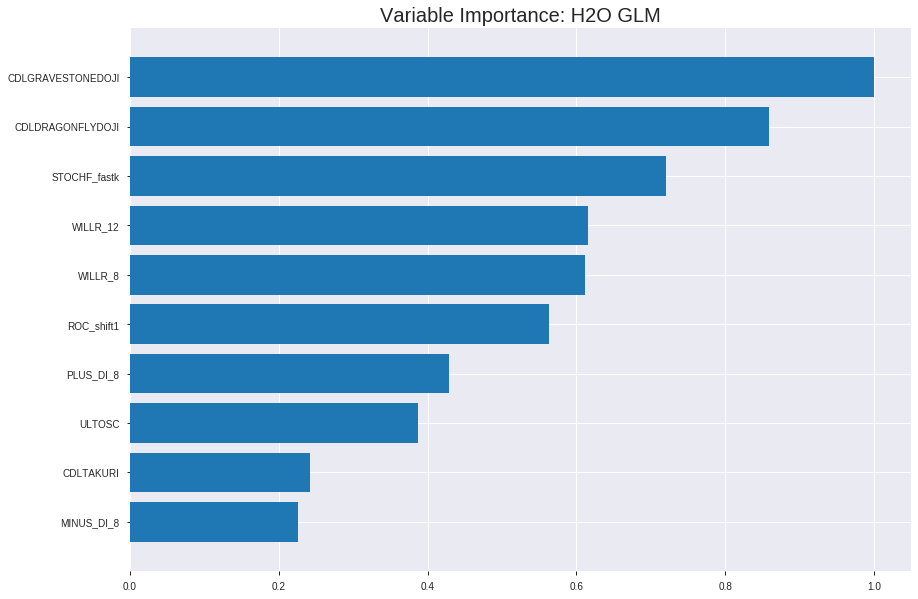

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_182355_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.19342957144120726
RMSE: 0.4398062885421345
LogLoss: 0.5654885999759797
Null degrees of freedom: 1786
Residual degrees of freedom: 1768
Null deviance: 2477.294033375748
Residual deviance: 2021.0562563141511
AIC: 2059.056256314151
AUC: 0.7682385612073113
pr_auc: 0.7584032485111318
Gini: 0.5364771224146225
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39047088347221165: 


,0,1,Error,Rate
0,380.0,511.0,0.5735,(511.0/891.0)
1,84.0,812.0,0.0938,(84.0/896.0)
Total,464.0,1323.0,0.333,(595.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3904709,0.7318612,264.0
max f2,0.2598014,0.8583691,320.0
max f0point5,0.5484345,0.6980352,172.0
max accuracy,0.5484345,0.6871852,172.0
max precision,0.9805044,1.0,0.0
max recall,0.0245150,1.0,391.0
max specificity,0.9805044,1.0,0.0
max absolute_mcc,0.4098899,0.3808074,252.0
max min_per_class_accuracy,0.5073564,0.6790123,195.0
max mean_per_class_accuracy,0.5484345,0.6874223,172.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9560621,1.6620164,1.6620164,0.8333333,0.9662983,0.8333333,0.9662983,0.0167411,0.0167411,66.2016369,66.2016369
,2,0.0201455,0.9424498,1.8836186,1.7728175,0.9444444,0.9494409,0.8888889,0.9578696,0.0189732,0.0357143,88.3618552,77.2817460
,3,0.0302182,0.9303685,1.7728175,1.7728175,0.8888889,0.9359154,0.8888889,0.9505515,0.0178571,0.0535714,77.2817460,77.2817460
,4,0.0402910,0.9200687,1.6620164,1.7451172,0.8333333,0.9253872,0.875,0.9442604,0.0167411,0.0703125,66.2016369,74.5117188
,5,0.0503637,0.9119526,1.9944196,1.7949777,1.0,0.9165978,0.9,0.9387279,0.0200893,0.0904018,99.4419643,79.4977679
,6,0.1001679,0.8469146,1.8823736,1.8384315,0.9438202,0.8843858,0.9217877,0.9117087,0.09375,0.1841518,88.2373596,83.8431514
,7,0.1499720,0.7314420,1.5014170,1.7265125,0.7528090,0.7797574,0.8656716,0.8678890,0.0747768,0.2589286,50.1417035,72.6512527
,8,0.2003358,0.6751298,1.4182540,1.6490174,0.7111111,0.7026011,0.8268156,0.8263362,0.0714286,0.3303571,41.8253968,64.9017358
,9,0.2999440,0.6044345,1.4005756,1.5665124,0.7022472,0.6384187,0.7854478,0.7639308,0.1395089,0.4698661,40.0575592,56.6512443
,10,0.4001119,0.5586940,1.1030589,1.4504870,0.5530726,0.5795007,0.7272727,0.7177588,0.1104911,0.5803571,10.3058909,45.0487013




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.18720581728911675
RMSE: 0.4326728756105665
LogLoss: 0.5462089919454387
Null degrees of freedom: 510
Residual degrees of freedom: 492
Null deviance: 708.506742749742
Residual deviance: 558.2255897682384
AIC: 596.2255897682384
AUC: 0.8018944623408498
pr_auc: 0.7988211223227346
Gini: 0.6037889246816996
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43216570520883785: 


,0,1,Error,Rate
0,116.0,149.0,0.5623,(149.0/265.0)
1,16.0,230.0,0.065,(16.0/246.0)
Total,132.0,379.0,0.3229,(165.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4321657,0.736,291.0
max f2,0.4078499,0.8459870,305.0
max f0point5,0.6364295,0.7212581,141.0
max accuracy,0.5522606,0.7240705,210.0
max precision,0.9769287,1.0,0.0
max recall,0.0371056,1.0,396.0
max specificity,0.9769287,1.0,0.0
max absolute_mcc,0.5522606,0.4505824,210.0
max min_per_class_accuracy,0.5636567,0.7154472,200.0
max mean_per_class_accuracy,0.5522606,0.7252186,210.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 54.35 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9561604,2.0772358,2.0772358,1.0,0.9643581,1.0,0.9643581,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9491126,2.0772358,2.0772358,1.0,0.9523673,1.0,0.9589078,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9434555,2.0772358,2.0772358,1.0,0.9453163,1.0,0.9546604,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9370974,2.0772358,2.0772358,1.0,0.9406559,1.0,0.9513260,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9287917,2.0772358,2.0772358,1.0,0.9324303,1.0,0.9476922,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.8997114,1.9973421,2.0372889,0.9615385,0.9134529,0.9807692,0.9305725,0.1016260,0.2073171,99.7342089,103.7288931
,7,0.1506849,0.8283074,1.6617886,1.9153732,0.8,0.8733038,0.9220779,0.9119788,0.0813008,0.2886179,66.1788618,91.5373245
,8,0.2015656,0.7368333,1.4380863,1.7948930,0.6923077,0.7719470,0.8640777,0.8766310,0.0731707,0.3617886,43.8086304,79.4893046
,9,0.3013699,0.6492914,1.3033636,1.6321138,0.6274510,0.6868162,0.7857143,0.8137702,0.1300813,0.4918699,30.3363622,63.2113821
,10,0.4011742,0.6072830,1.3033636,1.5503272,0.6274510,0.6269843,0.7463415,0.7673015,0.1300813,0.6219512,30.3363622,55.0327186



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:23:58,0.000 sec,2,.16E2,19,1.3699804,1.3681731
,2019-12-20 18:23:58,0.004 sec,4,.96E1,19,1.3610853,1.3581472
,2019-12-20 18:23:58,0.007 sec,6,.6E1,19,1.3481608,1.3435518
,2019-12-20 18:23:58,0.010 sec,8,.37E1,19,1.3303349,1.3233675
,2019-12-20 18:23:58,0.014 sec,10,.23E1,19,1.3073630,1.2972740
---,---,---,---,---,---,---,---
,2019-12-20 18:23:58,0.067 sec,40,.11E-2,19,1.1307154,1.0924336
,2019-12-20 18:23:58,0.069 sec,41,.7E-3,19,1.1305598,1.0925052
,2019-12-20 18:23:58,0.071 sec,42,.44E-3,19,1.1304721,1.0925894
,2019-12-20 18:23:58,0.073 sec,43,.27E-3,19,1.1304262,1.0926627



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7265625)

('F1', 0.7417218543046358)

('auc', 0.7999389499389499)

('logloss', 0.5331019516487296)

('mean_per_class_error', 0.27350427350427353)

('rmse', 0.42661693613342483)

('mse', 0.18200201019587067)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


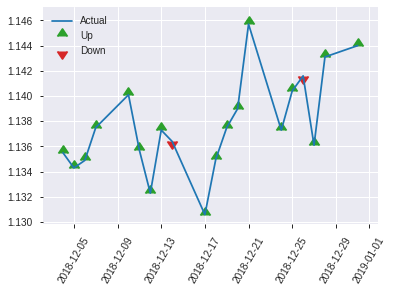


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.18200201019587067
RMSE: 0.42661693613342483
LogLoss: 0.5331019516487296
Null degrees of freedom: 255
Residual degrees of freedom: 237
Null deviance: 354.87097666550136
Residual deviance: 272.9481992441496
AIC: 310.9481992441496
AUC: 0.7999389499389499
pr_auc: 0.8165038985478235
Gini: 0.5998778998778997
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4293430537246623: 


,0,1,Error,Rate
0,66.0,60.0,0.4762,(60.0/126.0)
1,18.0,112.0,0.1385,(18.0/130.0)
Total,84.0,172.0,0.3047,(78.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4293431,0.7417219,171.0
max f2,0.2160930,0.8611482,228.0
max f0point5,0.5487853,0.7417582,103.0
max accuracy,0.5056435,0.7265625,129.0
max precision,0.9736622,1.0,0.0
max recall,0.0646862,1.0,244.0
max specificity,0.9736622,1.0,0.0
max absolute_mcc,0.5056435,0.4529915,129.0
max min_per_class_accuracy,0.5062900,0.7222222,128.0
max mean_per_class_accuracy,0.5056435,0.7264957,129.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 51.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9647987,1.9692308,1.9692308,1.0,0.9711661,1.0,0.9711661,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9563631,1.9692308,1.9692308,1.0,0.9594706,1.0,0.9653183,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9402610,1.9692308,1.9692308,1.0,0.9479899,1.0,0.9609862,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9348342,1.9692308,1.9692308,1.0,0.9378452,1.0,0.9546750,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9286543,1.9692308,1.9692308,1.0,0.9318377,1.0,0.9511616,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8478172,1.9692308,1.9692308,1.0,0.8918117,1.0,0.9214867,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7628570,1.8177515,1.9187377,0.9230769,0.8163157,0.9743590,0.8864297,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.6911938,1.3633136,1.7798817,0.6923077,0.7071932,0.9038462,0.8416205,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6174966,1.3390769,1.6367632,0.68,0.6463489,0.8311688,0.7782207,0.1307692,0.4923077,33.9076923,63.6763237
,10,0.4023438,0.5608665,1.2118343,1.5294996,0.6153846,0.5947545,0.7766990,0.7319088,0.1230769,0.6153846,21.1834320,52.9499627


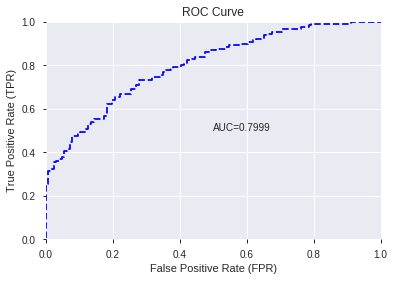

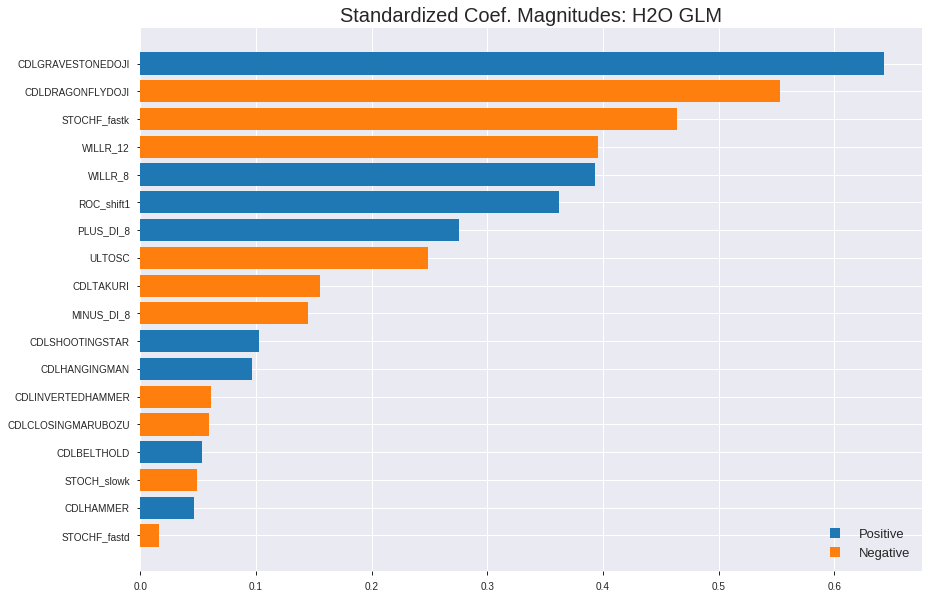

'log_likelihood'
--2019-12-20 18:24:09--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.82.120
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.82.120|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


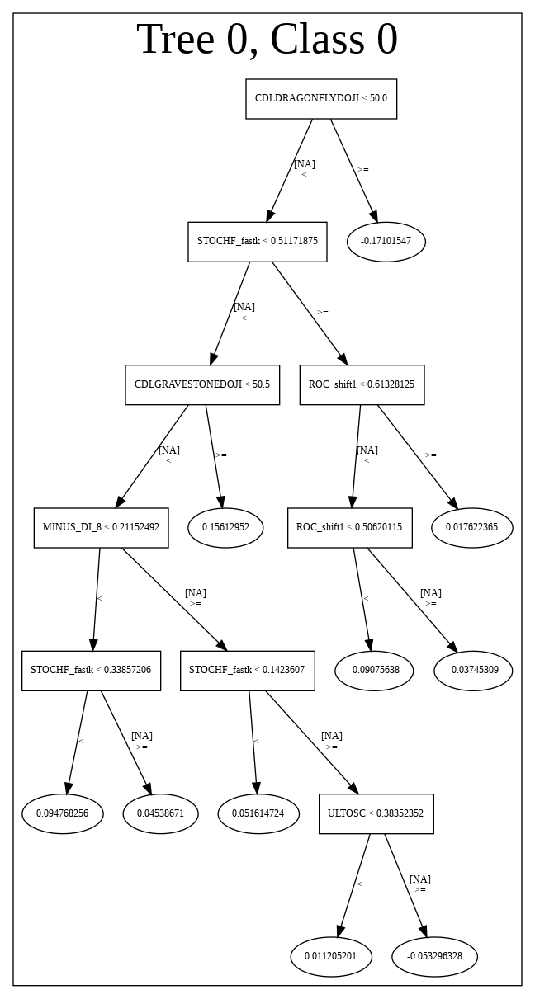

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_182355_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_182355_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_425_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_425

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'WILLR_12',
 'WILLR_8',
 'ROC_shift1',
 'PLUS_DI_8',
 'ULTOSC',
 'CDLTAKURI',
 'MINUS_DI_8',
 'CDLSHOOTINGSTAR',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER',
 'CDLCLOSINGMARUBOZU',
 'CDLBELTHOLD',
 'STOCH_slowk',
 'CDLHAMMER',
 'STOCHF_fastd']

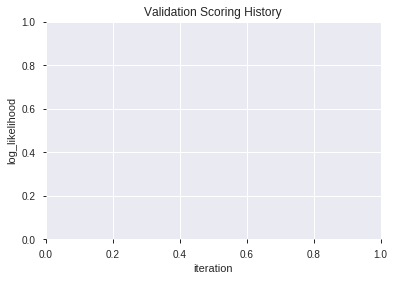

In [312]:
# All algos with Select Family-wise error features
model_train(feature_name='Fwe',model_algo=None,features_list=features_list)

In [313]:
# recursive feature elimination
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFE
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFE(ExtraTreeClassifier(random_state=1,criterion='entropy'), n_features_to_select=select_rfe, step=1).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFE, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

50

['BBANDS_upperband_14_2_5',
 'BBANDS_lowerband_14_5_5',
 'BBANDS_upperband_20_3_2',
 'BBANDS_upperband_20_6_5',
 'SAR_0.24',
 'BOP',
 'aroonup_8',
 'CCI_8',
 'CMO_8',
 'MACDFIX_8',
 'MINUS_DI_8',
 'ROCP_8',
 'WILLR_8',
 'CCI_12',
 'CMO_12',
 'MINUS_DI_12',
 'MINUS_DM_12',
 'MOM_12',
 'PLUS_DI_12',
 'PLUS_DM_12',
 'ROCR100_12',
 'RSI_12',
 'WILLR_12',
 'aroondown_14',
 'CMO_14',
 'PLUS_DI_14',
 'ROCR_14',
 'PLUS_DM_20',
 'ROCR_20',
 'CCI_24',
 'aroondown_30',
 'aroonup_30',
 'AROONOSC_30',
 'CMO_30',
 'PLUS_DM_30',
 'ROC_30',
 'WILLR_30',
 'ROC_shift1',
 'STOCH_slowk',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'ULTOSC',
 'TRANGE',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'CDLRICKSHAWMAN',
 'BETA_8',
 'LINEARREG_ANGLE_8',
 'LINEARREG_SLOPE_8',
 'LINEARREG_ANGLE_12']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_1_AutoML_20191220_182426,0.870635,0.439869,0.208730,0.384724,0.148012
1,DeepLearning_grid_1_AutoML_20191220_182426_model_9,0.868071,0.456947,0.207875,0.389193,0.151471
2,DeepLearning_grid_1_AutoML_20191220_182426_model_8,0.866972,0.464810,0.199695,0.392735,0.154241
3,DeepLearning_grid_1_AutoML_20191220_182426_model_3,0.861783,0.473723,0.219902,0.400217,0.160174
4,DeepLearning_grid_1_AutoML_20191220_182426_model_6,0.856654,0.485453,0.214713,0.403088,0.162480
5,DeepLearning_grid_1_AutoML_20191220_182426_model_5,0.842674,0.485566,0.239377,0.404107,0.163303
6,DeepLearning_grid_1_AutoML_20191220_182426_model_4,0.837241,0.516474,0.264164,0.420037,0.176431
7,DeepLearning_grid_1_AutoML_20191220_182426_model_2,0.836142,0.491701,0.259829,0.407050,0.165690
8,DeepLearning_grid_1_AutoML_20191220_182426_model_7,0.819231,0.525967,0.284493,0.425662,0.181188
9,DeepLearning_grid_1_AutoML_20191220_182426_model_1,0.819231,0.546201,0.320330,0.423489,0.179343


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,1.000000,1.000000,0.043391
1,ROC_30,0.668157,0.668157,0.028992
2,MOM_12,0.630888,0.630888,0.027375
3,CDLDRAGONFLYDOJI,0.606520,0.606520,0.026317
4,LINEARREG_SLOPE_8,0.596434,0.596434,0.025880
5,BBANDS_lowerband_14_5_5,0.556141,0.556141,0.024131
6,WILLR_8,0.552619,0.552619,0.023979
7,ULTOSC,0.538328,0.538328,0.023358
8,TRANGE,0.528256,0.528256,0.022921
9,PLUS_DM_30,0.523705,0.523705,0.022724


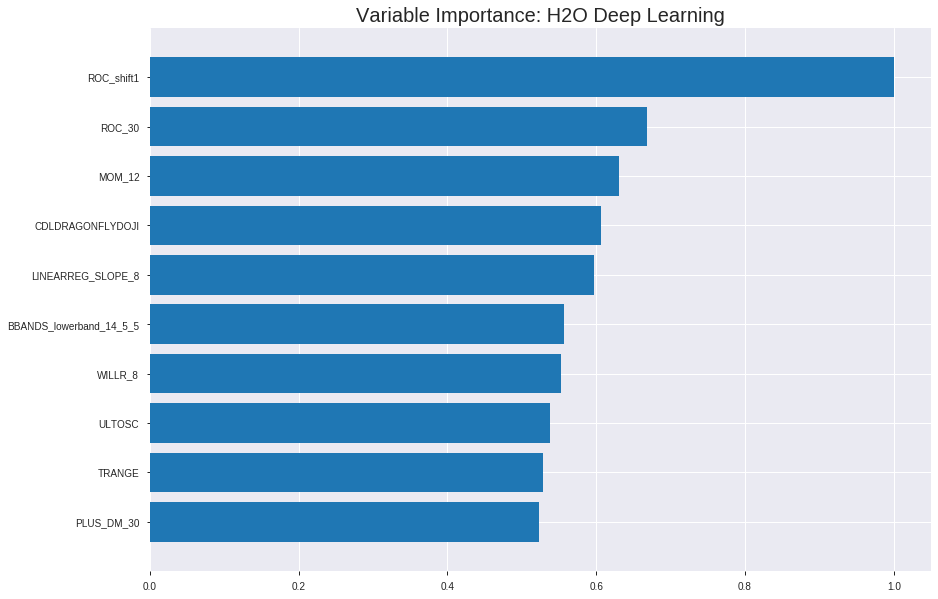

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_1_AutoML_20191220_182426


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1472652905508252
RMSE: 0.383751600062886
LogLoss: 0.4489225446316665
Mean Per-Class Error: 0.20142208293249964
AUC: 0.8704643157768158
pr_auc: 0.8651817053007922
Gini: 0.7409286315536316
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4412777049905934: 


,0,1,Error,Rate
0,650.0,241.0,0.2705,(241.0/891.0)
1,133.0,763.0,0.1484,(133.0/896.0)
Total,783.0,1004.0,0.2093,(374.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4412777,0.8031579,224.0
max f2,0.1546956,0.8773509,329.0
max f0point5,0.5394818,0.8025956,188.0
max accuracy,0.5394818,0.7985450,188.0
max precision,0.9994357,1.0,0.0
max recall,0.0122025,1.0,391.0
max specificity,0.9994357,1.0,0.0
max absolute_mcc,0.5394818,0.5972958,188.0
max min_per_class_accuracy,0.5285324,0.7923681,193.0
max mean_per_class_accuracy,0.5394818,0.7985779,188.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 51.53 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9946392,1.9944196,1.9944196,1.0,0.9963903,1.0,0.9963903,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9921528,1.9944196,1.9944196,1.0,0.9933708,1.0,0.9948805,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9887325,1.9944196,1.9944196,1.0,0.9905876,1.0,0.9934495,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9848363,1.9944196,1.9944196,1.0,0.9870856,1.0,0.9918586,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9825751,1.9944196,1.9944196,1.0,0.9837399,1.0,0.9902348,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9604096,1.8823736,1.9387096,0.9438202,0.9712505,0.9720670,0.9807957,0.09375,0.1941964,88.2373596,93.8709597
,7,0.1499720,0.9282316,1.8375552,1.9051173,0.9213483,0.9470950,0.9552239,0.9696040,0.0915179,0.2857143,83.7555177,90.5117271
,8,0.2003358,0.8876305,1.7728175,1.8718575,0.8888889,0.9091228,0.9385475,0.9543993,0.0892857,0.375,77.2817460,87.1857542
,9,0.2999440,0.7747717,1.5126216,1.7525591,0.7584270,0.8376398,0.8787313,0.9156247,0.1506696,0.5256696,51.2621639,75.2559052
,10,0.4001119,0.6497691,1.2813311,1.6345873,0.6424581,0.7178381,0.8195804,0.8661089,0.1283482,0.6540179,28.1331055,63.4587288




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1555411767573305
RMSE: 0.3943870899983042
LogLoss: 0.47238098805780226
Mean Per-Class Error: 0.21889860408038042
AUC: 0.8575855192514189
pr_auc: 0.8451138005585254
Gini: 0.7151710385028378
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3260224425177875: 


,0,1,Error,Rate
0,183.0,82.0,0.3094,(82.0/265.0)
1,33.0,213.0,0.1341,(33.0/246.0)
Total,216.0,295.0,0.225,(115.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3260224,0.7874307,233.0
max f2,0.1235260,0.8620690,325.0
max f0point5,0.5901351,0.7778865,146.0
max accuracy,0.4167488,0.7808219,199.0
max precision,0.9947976,1.0,0.0
max recall,0.0123474,1.0,389.0
max specificity,0.9947976,1.0,0.0
max absolute_mcc,0.3260224,0.5628013,233.0
max min_per_class_accuracy,0.4286848,0.7764228,195.0
max mean_per_class_accuracy,0.4167488,0.7811014,199.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 46.73 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9905606,2.0772358,2.0772358,1.0,0.9925906,1.0,0.9925906,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9842623,2.0772358,2.0772358,1.0,0.9871183,1.0,0.9901032,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9831198,2.0772358,2.0772358,1.0,0.9836213,1.0,0.9880776,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9792654,2.0772358,2.0772358,1.0,0.9815377,1.0,0.9865205,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9757782,2.0772358,2.0772358,1.0,0.9770904,1.0,0.9847070,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.9449831,1.9973421,2.0372889,0.9615385,0.9596971,0.9807692,0.9722020,0.1016260,0.2073171,99.7342089,103.7288931
,7,0.1506849,0.9193586,1.8279675,1.9693274,0.88,0.9315620,0.9480519,0.9590072,0.0894309,0.2967480,82.7967480,96.9327421
,8,0.2015656,0.8581473,1.9174484,1.9562317,0.9230769,0.8943580,0.9417476,0.9426880,0.0975610,0.3943089,91.7448405,95.6231747
,9,0.3013699,0.6865565,1.3848238,1.7669993,0.6666667,0.7817123,0.8506494,0.8893779,0.1382114,0.5325203,38.4823848,76.6999261
,10,0.4011742,0.5566547,1.3440937,1.6617886,0.6470588,0.6188021,0.8,0.8220639,0.1341463,0.6666667,34.4093735,66.1788618



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:24:26,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-20 18:24:26,0.063 sec,119133 obs/sec,1.0,1,1787.0,0.4539688,0.6101455,0.1756427,0.7557300,0.7481647,1.8836186,0.3301623,0.4508974,0.6080667,0.1856402,0.7626783,0.7445065,1.7310298,0.3287671
,2019-12-20 18:24:27,0.201 sec,130437 obs/sec,10.0,10,17870.0,0.3837516,0.4489225,0.4109342,0.8704643,0.8651817,1.9944196,0.2092893,0.3943871,0.4723810,0.3769740,0.8575855,0.8451138,2.0772358,0.2250489


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
ROC_shift1,1.0,1.0,0.0433907
ROC_30,0.6681573,0.6681573,0.0289918
MOM_12,0.6308884,0.6308884,0.0273747
CDLDRAGONFLYDOJI,0.6065201,0.6065201,0.0263173
LINEARREG_SLOPE_8,0.5964342,0.5964342,0.0258797
---,---,---,---
WILLR_30,0.3475121,0.3475121,0.0150788
CCI_12,0.3208300,0.3208300,0.0139210
CMO_8,0.3059246,0.3059246,0.0132743
PLUS_DI_14,0.3002163,0.3002163,0.0130266



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.79296875)

('F1', 0.8153310104529616)

('auc', 0.8706349206349207)

('logloss', 0.43986867269634056)

('mean_per_class_error', 0.20873015873015865)

('rmse', 0.3847235163836986)

('mse', 0.14801218405863803)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           0
2           0
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


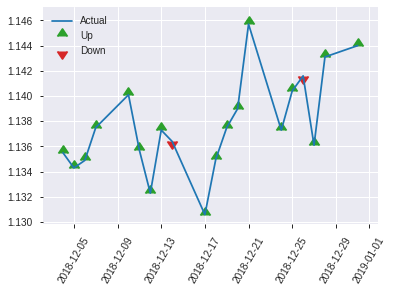


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.14801218405863803
RMSE: 0.3847235163836986
LogLoss: 0.43986867269634056
Mean Per-Class Error: 0.20873015873015865
AUC: 0.8706349206349207
pr_auc: 0.8691110419214702
Gini: 0.7412698412698413
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3602530293593466: 


,0,1,Error,Rate
0,86.0,40.0,0.3175,(40.0/126.0)
1,13.0,117.0,0.1,(13.0/130.0)
Total,99.0,157.0,0.207,(53.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3602530,0.8153310,156.0
max f2,0.2671334,0.8923513,185.0
max f0point5,0.4949701,0.7935154,113.0
max accuracy,0.3602530,0.7929688,156.0
max precision,0.9895927,1.0,0.0
max recall,0.1297318,1.0,211.0
max specificity,0.9895927,1.0,0.0
max absolute_mcc,0.3602530,0.5980191,156.0
max min_per_class_accuracy,0.4532275,0.7698413,129.0
max mean_per_class_accuracy,0.3602530,0.7912698,156.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 48.29 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9841043,1.9692308,1.9692308,1.0,0.9874330,1.0,0.9874330,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9819456,1.9692308,1.9692308,1.0,0.9830597,1.0,0.9852464,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9775442,1.9692308,1.9692308,1.0,0.9787428,1.0,0.9836205,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9724511,1.9692308,1.9692308,1.0,0.9745020,1.0,0.9811336,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9625420,1.9692308,1.9692308,1.0,0.9710414,1.0,0.9795810,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9320793,1.9692308,1.9692308,1.0,0.9426272,1.0,0.9611041,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8820840,1.8177515,1.9187377,0.9230769,0.9028523,0.9743590,0.9416868,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.8022265,1.9692308,1.9313609,1.0,0.8413264,0.9807692,0.9165967,0.1,0.3923077,96.9230769,93.1360947
,9,0.3007812,0.6856727,1.3390769,1.7390609,0.68,0.7400426,0.8831169,0.8592740,0.1307692,0.5230769,33.9076923,73.9060939
,10,0.4023438,0.5628488,1.2875740,1.6250934,0.6538462,0.6277890,0.8252427,0.8008409,0.1307692,0.6538462,28.7573964,62.5093353


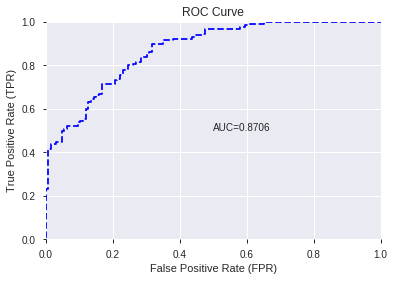

This function is available for GLM models only


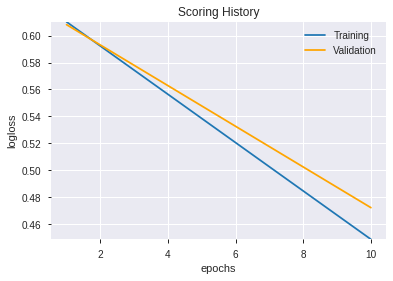

--2019-12-20 18:31:06--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.131.91
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.131.91|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


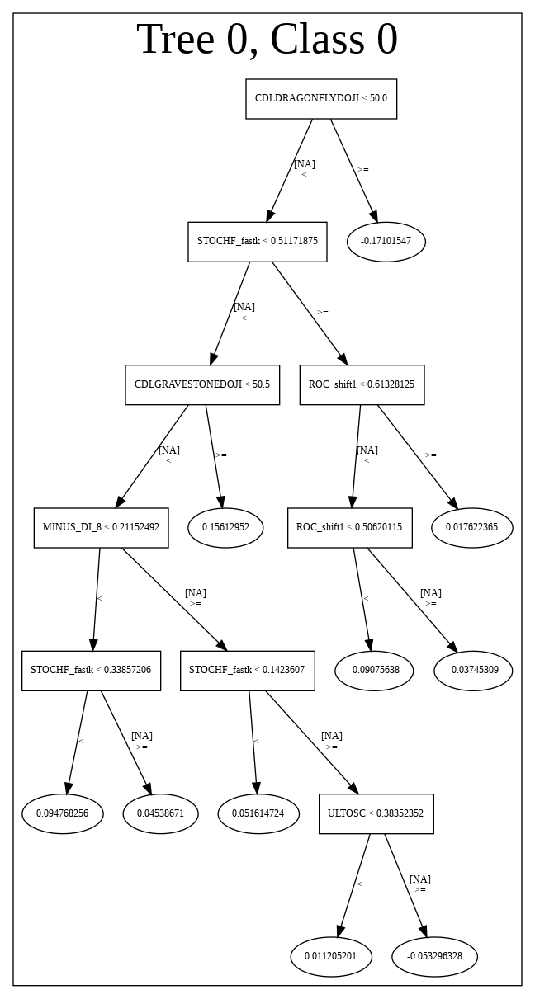

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_1_AutoML_20191220_182426',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_1_AutoML_20191220_182426',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_430_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_430_sid_be3

['ROC_shift1',
 'ROC_30',
 'MOM_12',
 'CDLDRAGONFLYDOJI',
 'LINEARREG_SLOPE_8',
 'BBANDS_lowerband_14_5_5',
 'WILLR_8',
 'ULTOSC',
 'TRANGE',
 'PLUS_DM_30',
 'WILLR_12',
 'LINEARREG_ANGLE_12',
 'CMO_14',
 'ROCR_20',
 'BBANDS_upperband_20_3_2',
 'aroonup_8',
 'BETA_8',
 'CDLRICKSHAWMAN',
 'aroondown_14',
 'STOCH_slowk',
 'BOP',
 'MACDFIX_8',
 'CCI_8',
 'LINEARREG_ANGLE_8',
 'BBANDS_upperband_14_2_5',
 'RSI_12',
 'SAR_0.24',
 'MINUS_DM_12',
 'PLUS_DM_20',
 'ROCR100_12',
 'CMO_12',
 'aroondown_30',
 'CDLGRAVESTONEDOJI',
 'AROONOSC_30',
 'PLUS_DI_12',
 'STOCHF_fastd',
 'BBANDS_upperband_20_6_5',
 'CCI_24',
 'ROCR_14',
 'MINUS_DI_12',
 'ROCP_8',
 'PLUS_DM_12',
 'MINUS_DI_8',
 'STOCHF_fastk',
 'CMO_30',
 'WILLR_30',
 'CCI_12',
 'CMO_8',
 'PLUS_DI_14',
 'aroonup_30']

In [314]:
# DeepLearning with recursive feature elimination
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_183202_model_1,0.912576,0.38655,0.189866,0.354266,0.125504


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,6.500823,1.000000,1.530766e-01
1,ROC_30,4.631282,0.712415,1.090540e-01
2,BBANDS_upperband_20_3_2,3.322636,0.511110,7.823897e-02
3,PLUS_DI_12,3.161238,0.486283,7.443849e-02
4,PLUS_DI_14,2.925146,0.449965,6.887918e-02
5,BBANDS_upperband_20_6_5,2.020413,0.310793,4.757519e-02
6,MACDFIX_8,1.422627,0.218838,3.349896e-02
7,MINUS_DI_8,1.403339,0.215871,3.304479e-02
8,MINUS_DI_12,1.270920,0.195501,2.992667e-02
9,MOM_12,1.222324,0.188026,2.878238e-02


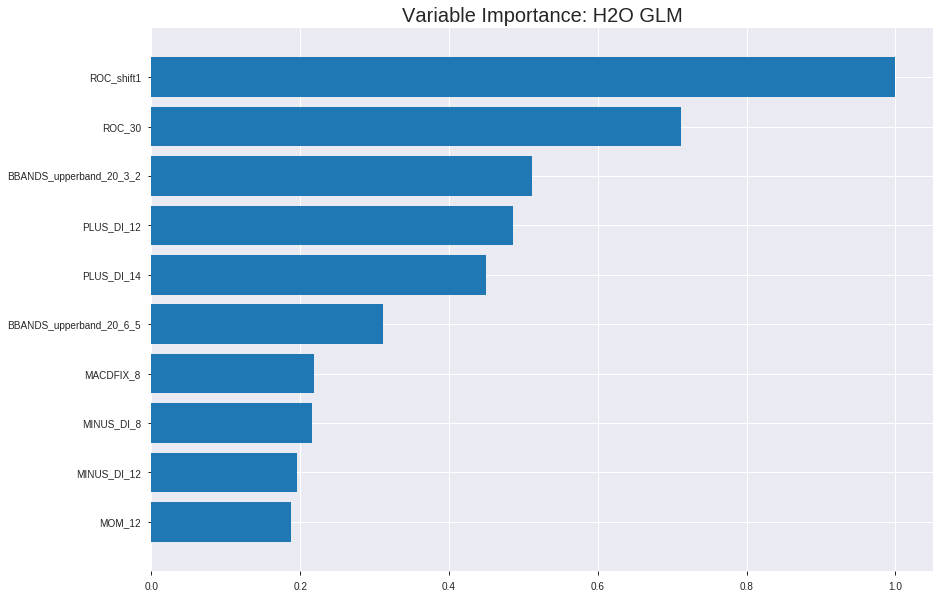

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_183202_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1328181311232574
RMSE: 0.36444221918331227
LogLoss: 0.4122405859200358
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375748
Residual deviance: 1473.347854078208
AIC: 1575.347854078208
AUC: 0.8922214456068623
pr_auc: 0.8731339159037511
Gini: 0.7844428912137247
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3681448045195741: 


,0,1,Error,Rate
0,629.0,262.0,0.2941,(262.0/891.0)
1,83.0,813.0,0.0926,(83.0/896.0)
Total,712.0,1075.0,0.1931,(345.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3681448,0.8249619,249.0
max f2,0.2208015,0.8879950,300.0
max f0point5,0.6219932,0.8247423,158.0
max accuracy,0.4239162,0.8114158,230.0
max precision,0.9993633,1.0,0.0
max recall,0.0208707,1.0,386.0
max specificity,0.9993633,1.0,0.0
max absolute_mcc,0.4239162,0.6279192,230.0
max min_per_class_accuracy,0.5114057,0.8080357,198.0
max mean_per_class_accuracy,0.4239162,0.8112342,230.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9983418,1.9944196,1.9944196,1.0,0.9991365,1.0,0.9991365,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9965068,1.9944196,1.9944196,1.0,0.9976422,1.0,0.9983893,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9940449,1.9944196,1.9944196,1.0,0.9948443,1.0,0.9972077,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9880190,1.9944196,1.9944196,1.0,0.9912961,1.0,0.9957298,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9838411,1.9944196,1.9944196,1.0,0.9855135,1.0,0.9936865,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9558027,1.8823736,1.9387096,0.9438202,0.9708252,0.9720670,0.9823197,0.09375,0.1941964,88.2373596,93.8709597
,7,0.1499720,0.9246539,1.7703275,1.8827917,0.8876404,0.9408352,0.9440299,0.9685431,0.0881696,0.2823661,77.0327548,88.2791678
,8,0.2003358,0.8767048,1.8171379,1.8662865,0.9111111,0.9002061,0.9357542,0.9513634,0.0915179,0.3738839,81.7137897,86.6286537
,9,0.2999440,0.7754420,1.6358723,1.7897684,0.8202247,0.8307461,0.8973881,0.9113077,0.1629464,0.5368304,63.5872291,78.9768374
,10,0.4001119,0.6408284,1.5153132,1.7210586,0.7597765,0.7103857,0.8629371,0.8610069,0.1517857,0.6886161,51.5313248,72.1058629




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.12414092155874937
RMSE: 0.3523363755826942
LogLoss: 0.39039263842323846
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.506742749742
Residual deviance: 398.98127646854977
AIC: 500.98127646854977
AUC: 0.9055990182543334
pr_auc: 0.9047025406078696
Gini: 0.8111980365086668
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4286391442386778: 


,0,1,Error,Rate
0,210.0,55.0,0.2075,(55.0/265.0)
1,32.0,214.0,0.1301,(32.0/246.0)
Total,242.0,269.0,0.1703,(87.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4286391,0.8310680,217.0
max f2,0.2484754,0.8763278,269.0
max f0point5,0.6360895,0.8431953,154.0
max accuracy,0.4751861,0.8317025,207.0
max precision,0.9998211,1.0,0.0
max recall,0.0109694,1.0,389.0
max specificity,0.9998211,1.0,0.0
max absolute_mcc,0.4737905,0.6642600,208.0
max min_per_class_accuracy,0.5009564,0.8252033,200.0
max mean_per_class_accuracy,0.4737905,0.8323439,208.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 47.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9958596,2.0772358,2.0772358,1.0,0.9978899,1.0,0.9978899,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9913887,2.0772358,2.0772358,1.0,0.9926870,1.0,0.9955250,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9869508,2.0772358,2.0772358,1.0,0.9890438,1.0,0.9934996,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9801628,2.0772358,2.0772358,1.0,0.9825100,1.0,0.9908830,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9755599,2.0772358,2.0772358,1.0,0.9785417,1.0,0.9885097,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.9459116,2.0772358,2.0772358,1.0,0.9584689,1.0,0.9734893,0.1056911,0.2113821,107.7235772,107.7235772
,7,0.1506849,0.9120681,2.0772358,2.0772358,1.0,0.9308858,1.0,0.9596570,0.1016260,0.3130081,107.7235772,107.7235772
,8,0.2015656,0.8468652,1.9174484,2.0369011,0.9230769,0.8772368,0.9805825,0.9388519,0.0975610,0.4105691,91.7448405,103.6901097
,9,0.3013699,0.7389688,1.6699346,1.9153732,0.8039216,0.7937130,0.9220779,0.8907864,0.1666667,0.5772358,66.9934641,91.5373245
,10,0.4011742,0.6121981,1.4255540,1.7935158,0.6862745,0.6722755,0.8634146,0.8364252,0.1422764,0.7195122,42.5553961,79.3515764



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:32:02,0.000 sec,2,.15E2,50,1.3744509,1.3733270
,2019-12-20 18:32:02,0.008 sec,4,.96E1,51,1.3677756,1.3658613
,2019-12-20 18:32:02,0.016 sec,6,.6E1,51,1.3577852,1.3546379
,2019-12-20 18:32:02,0.025 sec,8,.37E1,51,1.3433391,1.3382992
,2019-12-20 18:32:02,0.033 sec,10,.23E1,51,1.3234319,1.3155709
---,---,---,---,---,---,---,---
,2019-12-20 18:32:02,0.211 sec,52,.1E-3,51,0.8262532,0.7843090
,2019-12-20 18:32:02,0.220 sec,54,.65E-4,51,0.8254930,0.7827571
,2019-12-20 18:32:02,0.229 sec,56,.4E-4,51,0.8249859,0.7817721
,2019-12-20 18:32:02,0.239 sec,58,.25E-4,51,0.8246367,0.7811848



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.8125)

('F1', 0.8389261744966442)

('auc', 0.9125763125763126)

('logloss', 0.38655027040670287)

('mean_per_class_error', 0.18571428571428572)

('rmse', 0.35426595925210774)

('mse', 0.12550436988481606)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           0
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


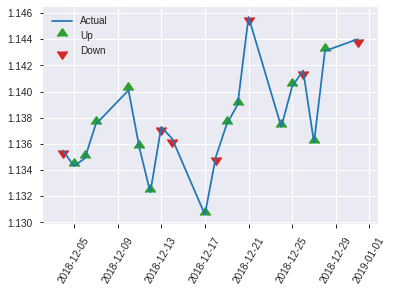


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.12550436988481606
RMSE: 0.35426595925210774
LogLoss: 0.38655027040670287
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.87097666550136
Residual deviance: 197.91373844823187
AIC: 299.91373844823187
AUC: 0.9125763125763126
pr_auc: 0.911361198234116
Gini: 0.8251526251526251
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.28139404303551774: 


,0,1,Error,Rate
0,83.0,43.0,0.3413,(43.0/126.0)
1,5.0,125.0,0.0385,(5.0/130.0)
Total,88.0,168.0,0.1875,(48.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2813940,0.8389262,167.0
max f2,0.2067921,0.9116809,181.0
max f0point5,0.6322752,0.8609959,87.0
max accuracy,0.5807476,0.8125,99.0
max precision,0.9960594,1.0,0.0
max recall,0.1337143,1.0,196.0
max specificity,0.9960594,1.0,0.0
max absolute_mcc,0.2813940,0.6528912,167.0
max min_per_class_accuracy,0.4719460,0.8,128.0
max mean_per_class_accuracy,0.5807476,0.8142857,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 46.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9944966,1.9692308,1.9692308,1.0,0.9955902,1.0,0.9955902,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9911377,1.9692308,1.9692308,1.0,0.9926166,1.0,0.9941034,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9792650,1.9692308,1.9692308,1.0,0.9846083,1.0,0.9917296,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9722765,1.9692308,1.9692308,1.0,0.9757168,1.0,0.9873625,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9499528,1.9692308,1.9692308,1.0,0.9577955,1.0,0.9828137,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9076183,1.9692308,1.9692308,1.0,0.9306848,1.0,0.9567493,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8542877,1.8177515,1.9187377,0.9230769,0.8828366,0.9743590,0.9321117,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.8050145,1.9692308,1.9313609,1.0,0.8235411,0.9807692,0.9049690,0.1,0.3923077,96.9230769,93.1360947
,9,0.3007812,0.6879088,1.8116923,1.8925075,0.92,0.7452036,0.9610390,0.8530971,0.1769231,0.5692308,81.1692308,89.2507493
,10,0.4023438,0.5703742,1.3633136,1.7589246,0.6923077,0.6217070,0.8932039,0.7946880,0.1384615,0.7076923,36.3313609,75.8924571


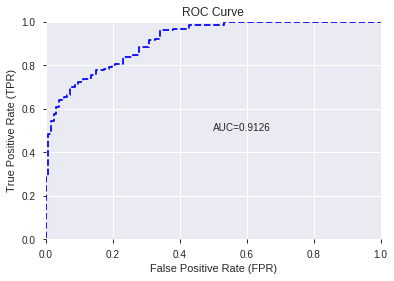

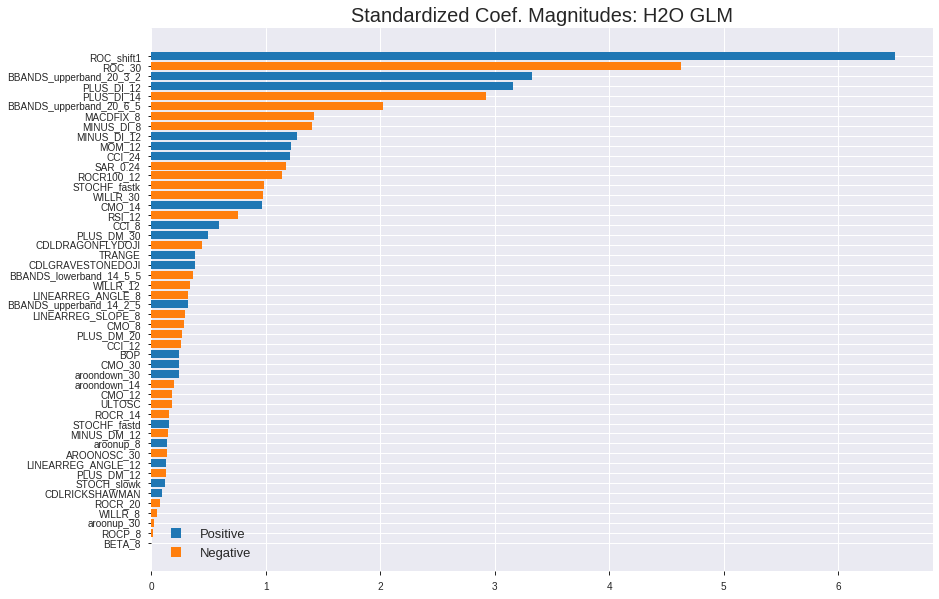

'log_likelihood'
--2019-12-20 18:32:12--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.86.139
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.86.139|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


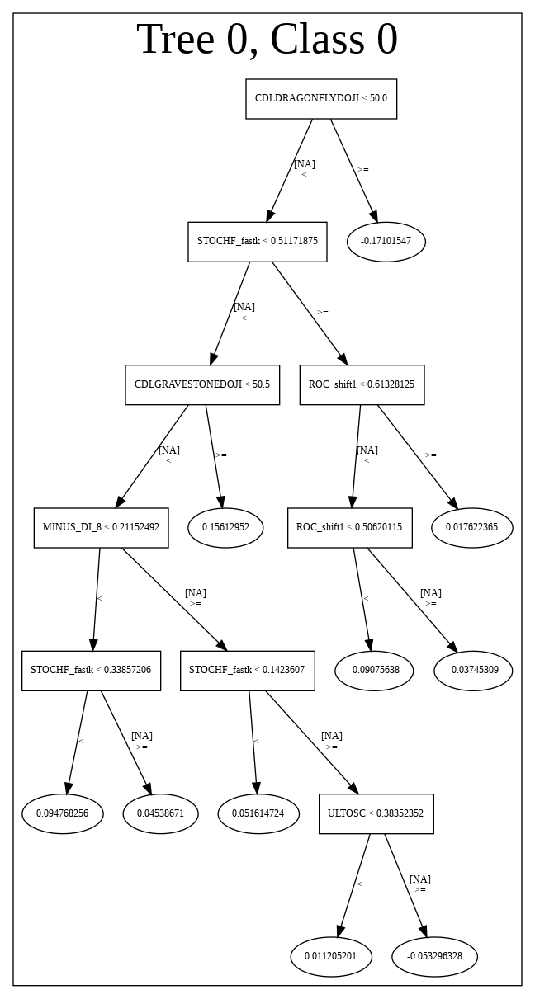

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_183202_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_183202_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_435_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_435

['ROC_shift1',
 'ROC_30',
 'BBANDS_upperband_20_3_2',
 'PLUS_DI_12',
 'PLUS_DI_14',
 'BBANDS_upperband_20_6_5',
 'MACDFIX_8',
 'MINUS_DI_8',
 'MINUS_DI_12',
 'MOM_12',
 'CCI_24',
 'SAR_0.24',
 'ROCR100_12',
 'STOCHF_fastk',
 'WILLR_30',
 'CMO_14',
 'RSI_12',
 'CCI_8',
 'PLUS_DM_30',
 'CDLDRAGONFLYDOJI',
 'TRANGE',
 'CDLGRAVESTONEDOJI',
 'BBANDS_lowerband_14_5_5',
 'WILLR_12',
 'LINEARREG_ANGLE_8',
 'BBANDS_upperband_14_2_5',
 'LINEARREG_SLOPE_8',
 'CMO_8',
 'PLUS_DM_20',
 'CCI_12',
 'BOP',
 'CMO_30',
 'aroondown_30',
 'aroondown_14',
 'CMO_12',
 'ULTOSC',
 'ROCR_14',
 'STOCHF_fastd',
 'MINUS_DM_12',
 'aroonup_8',
 'AROONOSC_30',
 'LINEARREG_ANGLE_12',
 'PLUS_DM_12',
 'STOCH_slowk',
 'CDLRICKSHAWMAN',
 'ROCR_20',
 'WILLR_8',
 'aroonup_30',
 'ROCP_8',
 'BETA_8']

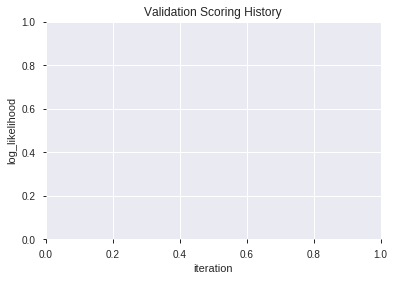

In [315]:
# GLM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191220_183308_model_3,0.882723,0.449739,0.228816,0.382077,0.145983
1,XGBoost_3_AutoML_20191220_183308,0.881929,0.438838,0.209096,0.377459,0.142475
2,XGBoost_2_AutoML_20191220_183308,0.881136,0.442433,0.245177,0.378839,0.143519
3,XGBoost_1_AutoML_20191220_183308,0.879365,0.441477,0.233150,0.379580,0.144081
4,XGBoost_grid_1_AutoML_20191220_183308_model_2,0.877595,0.450693,0.208852,0.382712,0.146468
5,XGBoost_grid_1_AutoML_20191220_183308_model_4,0.876374,0.455563,0.233028,0.384608,0.147923
6,XGBoost_grid_1_AutoML_20191220_183308_model_7,0.873138,0.448736,0.229304,0.384085,0.147522
7,XGBoost_grid_1_AutoML_20191220_183308_model_6,0.870330,0.453533,0.241209,0.385648,0.148725
8,XGBoost_grid_1_AutoML_20191220_183308_model_1,0.863797,0.469616,0.249389,0.392649,0.154173
9,XGBoost_grid_1_AutoML_20191220_183308_model_5,0.855556,0.471057,0.269231,0.395569,0.156475


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,1298.079224,1.000000,0.106205
1,CDLDRAGONFLYDOJI,1049.782715,0.808720,0.085890
2,ROC_30,964.703186,0.743177,0.078929
3,CDLGRAVESTONEDOJI,635.817627,0.489814,0.052020
4,STOCHF_fastk,623.848145,0.480593,0.051041
5,CCI_8,559.043030,0.430669,0.045739
6,WILLR_8,466.423096,0.359318,0.038161
7,ULTOSC,420.865326,0.324222,0.034434
8,WILLR_12,341.888153,0.263380,0.027972
9,MINUS_DI_8,282.651001,0.217746,0.023126


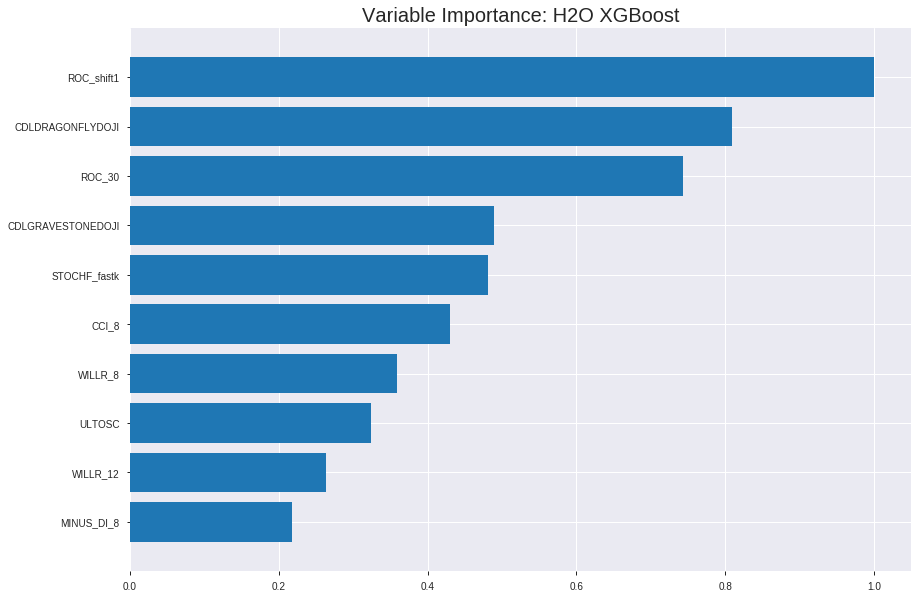

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191220_183308_model_3


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.08417093562487632
RMSE: 0.290122277022769
LogLoss: 0.30809137086211574
Mean Per-Class Error: 0.06047140552348884
AUC: 0.9812021504729838
pr_auc: 0.9800370491179734
Gini: 0.9624043009459675
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49333222210407257: 


,0,1,Error,Rate
0,822.0,69.0,0.0774,(69.0/891.0)
1,39.0,857.0,0.0435,(39.0/896.0)
Total,861.0,926.0,0.0604,(108.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4933322,0.9407245,203.0
max f2,0.4161902,0.9566826,228.0
max f0point5,0.5707147,0.9436852,179.0
max accuracy,0.5107022,0.9395635,199.0
max precision,0.9846157,1.0,0.0
max recall,0.1213632,1.0,348.0
max specificity,0.9846157,1.0,0.0
max absolute_mcc,0.4933322,0.8796108,203.0
max min_per_class_accuracy,0.5259892,0.9363839,194.0
max mean_per_class_accuracy,0.5107022,0.9395286,199.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.22 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9651035,1.9944196,1.9944196,1.0,0.9729576,1.0,0.9729576,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9568900,1.9944196,1.9944196,1.0,0.9616138,1.0,0.9672857,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9483945,1.9944196,1.9944196,1.0,0.9520650,1.0,0.9622121,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9380383,1.9944196,1.9944196,1.0,0.9434925,1.0,0.9575322,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9316378,1.9944196,1.9944196,1.0,0.9349364,1.0,0.9530131,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8889951,1.9944196,1.9944196,1.0,0.9099283,1.0,0.9315910,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8521471,1.9944196,1.9944196,1.0,0.8711553,1.0,0.9115210,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.8115255,1.9722594,1.9888486,0.9888889,0.8302770,0.9972067,0.8910965,0.0993304,0.3984375,97.2259425,98.8848638
,9,0.2999440,0.7335610,1.9383966,1.9720940,0.9719101,0.7739941,0.9888060,0.8522080,0.1930804,0.5915179,93.8396619,97.2094050
,10,0.4001119,0.6473540,1.8941416,1.9525787,0.9497207,0.6922797,0.9790210,0.8121700,0.1897321,0.78125,89.4141560,95.2578671




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.15101471979773615
RMSE: 0.38860612424116037
LogLoss: 0.46784364544700235
Mean Per-Class Error: 0.1933502070869766
AUC: 0.8653397760392698
pr_auc: 0.8480305581612448
Gini: 0.7306795520785396
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4953401982784271: 


,0,1,Error,Rate
0,211.0,54.0,0.2038,(54.0/265.0)
1,45.0,201.0,0.1829,(45.0/246.0)
Total,256.0,255.0,0.1937,(99.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4953402,0.8023952,201.0
max f2,0.2827268,0.8661710,281.0
max f0point5,0.5135671,0.7960199,190.0
max accuracy,0.4953402,0.8062622,201.0
max precision,0.9760568,1.0,0.0
max recall,0.0390928,1.0,390.0
max specificity,0.9760568,1.0,0.0
max absolute_mcc,0.4953402,0.6128767,201.0
max min_per_class_accuracy,0.5014125,0.8,198.0
max mean_per_class_accuracy,0.4953402,0.8066498,201.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 48.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9627120,2.0772358,2.0772358,1.0,0.9685568,1.0,0.9685568,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9473820,2.0772358,2.0772358,1.0,0.9541207,1.0,0.9619949,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9277703,2.0772358,2.0772358,1.0,0.9314866,1.0,0.9524611,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9260289,2.0772358,2.0772358,1.0,0.9268213,1.0,0.9463564,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9210643,1.6617886,1.9973421,0.8,0.9247156,0.9615385,0.9421947,0.0162602,0.1016260,66.1788618,99.7342089
,6,0.1017613,0.8798172,1.9174484,1.9573952,0.9230769,0.9009868,0.9423077,0.9215907,0.0975610,0.1991870,91.7448405,95.7395247
,7,0.1506849,0.8417182,1.9110569,1.9423503,0.92,0.8603706,0.9350649,0.9017141,0.0934959,0.2926829,91.1056911,94.2350333
,8,0.2015656,0.7913498,1.6777674,1.8755624,0.8076923,0.8136147,0.9029126,0.8794754,0.0853659,0.3780488,67.7767355,87.5562396
,9,0.3013699,0.6732050,1.6699346,1.8074649,0.8039216,0.7312898,0.8701299,0.8304010,0.1666667,0.5447154,66.9934641,80.7464893
,10,0.4011742,0.5790663,1.2219034,1.6617886,0.5882353,0.6249379,0.8,0.7792858,0.1219512,0.6666667,22.1903396,66.1788618



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:33:17,2.931 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-20 18:33:17,2.990 sec,5.0,0.4745298,0.6431617,0.8315083,0.8345341,1.9944196,0.2781198,0.4786785,0.6511707,0.8015723,0.7746248,1.7310298,0.2681018
,2019-12-20 18:33:17,3.036 sec,10.0,0.4548316,0.6051439,0.8584825,0.8601109,1.9944196,0.2423055,0.4625217,0.6196862,0.8155545,0.7819297,1.7310298,0.2739726
,2019-12-20 18:33:17,3.081 sec,15.0,0.4395803,0.5754245,0.8687464,0.8664084,1.9944196,0.2176833,0.4498005,0.5944749,0.8224881,0.7923760,1.7310298,0.2485323
,2019-12-20 18:33:17,3.133 sec,20.0,0.4278752,0.5519434,0.8769597,0.8732152,1.9944196,0.2126469,0.4408767,0.5759796,0.8254410,0.7955841,1.7310298,0.2407045
---,---,---,---,---,---,---,---,---,---,---,---,---,---,---,---
,2019-12-20 18:33:19,4.362 sec,110.0,0.3067486,0.3335520,0.9745784,0.9727195,1.9944196,0.0688304,0.3920162,0.4751132,0.8614742,0.8415280,2.0772358,0.1996086
,2019-12-20 18:33:19,4.481 sec,115.0,0.3030194,0.3277596,0.9764491,0.9756509,1.9944196,0.0677112,0.3917647,0.4741316,0.8617426,0.8438106,2.0772358,0.1956947
,2019-12-20 18:33:19,4.579 sec,120.0,0.2984699,0.3205629,0.9779980,0.9769468,1.9944196,0.0660325,0.3903742,0.4712923,0.8631922,0.8452529,2.0772358,0.2035225
,2019-12-20 18:33:19,4.682 sec,125.0,0.2941854,0.3143235,0.9800435,0.9789144,1.9944196,0.0621153,0.3891029,0.4687168,0.8652784,0.8474241,2.0772358,0.1976517



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
ROC_shift1,1298.0792236,1.0,0.1062045
CDLDRAGONFLYDOJI,1049.7827148,0.8087201,0.0858897
ROC_30,964.7031860,0.7431774,0.0789288
CDLGRAVESTONEDOJI,635.8176270,0.4898142,0.0520205
STOCHF_fastk,623.8481445,0.4805933,0.0510412
---,---,---,---
BBANDS_upperband_14_2_5,81.4568787,0.0627519,0.0066645
BBANDS_upperband_20_6_5,77.1649399,0.0594455,0.0063134
ROCR100_12,70.0747223,0.0539834,0.0057333
RSI_12,55.9698982,0.0431175,0.0045793



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.80078125)

('F1', 0.8040540540540541)

('auc', 0.8827228327228327)

('logloss', 0.4497390533963897)

('mean_per_class_error', 0.1966422466422466)

('rmse', 0.38207746783744667)

('mse', 0.1459831914290751)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        0
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


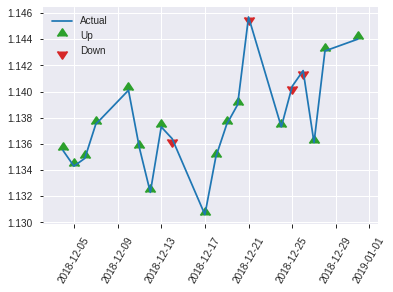


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.1459831914290751
RMSE: 0.38207746783744667
LogLoss: 0.4497390533963897
Mean Per-Class Error: 0.1966422466422466
AUC: 0.8827228327228327
pr_auc: 0.8961556456542394
Gini: 0.7654456654456654
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3785269856452942: 


,0,1,Error,Rate
0,79.0,47.0,0.373,(47.0/126.0)
1,11.0,119.0,0.0846,(11.0/130.0)
Total,90.0,166.0,0.2266,(58.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3785270,0.8040541,165.0
max f2,0.2348120,0.8753501,193.0
max f0point5,0.6275971,0.8682008,86.0
max accuracy,0.6275971,0.8007812,86.0
max precision,0.9798213,1.0,0.0
max recall,0.0979520,1.0,230.0
max specificity,0.9798213,1.0,0.0
max absolute_mcc,0.6275971,0.6403819,86.0
max min_per_class_accuracy,0.5191090,0.7777778,129.0
max mean_per_class_accuracy,0.6275971,0.8033578,86.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.32 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9600333,1.9692308,1.9692308,1.0,0.9686772,1.0,0.9686772,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9459137,1.9692308,1.9692308,1.0,0.9509376,1.0,0.9598074,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9364377,1.9692308,1.9692308,1.0,0.9398354,1.0,0.9548144,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9302194,1.9692308,1.9692308,1.0,0.9336379,1.0,0.9490390,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9162620,1.9692308,1.9692308,1.0,0.9196712,1.0,0.9445209,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8529152,1.9692308,1.9692308,1.0,0.8819759,1.0,0.9132484,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8224805,1.9692308,1.9692308,1.0,0.8380975,1.0,0.8881981,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7510747,1.8177515,1.9313609,0.9230769,0.7905712,0.9807692,0.8637914,0.0923077,0.3923077,81.7751479,93.1360947
,9,0.3007812,0.6608686,1.8116923,1.8925075,0.92,0.7011020,0.9610390,0.8109701,0.1769231,0.5692308,81.1692308,89.2507493
,10,0.4023438,0.5863624,1.2118343,1.7206871,0.6153846,0.6254134,0.8737864,0.7641306,0.1230769,0.6923077,21.1834320,72.0687080


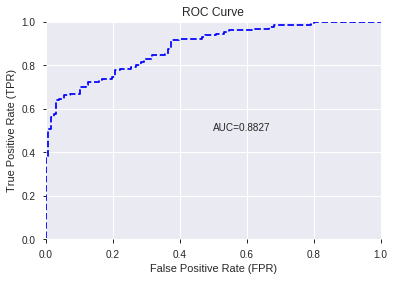

This function is available for GLM models only


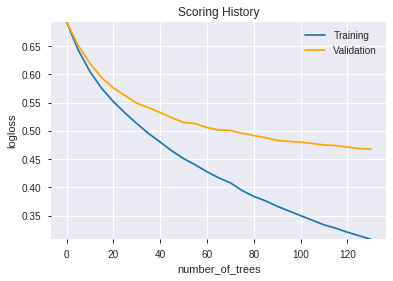

--2019-12-20 18:33:38--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.146.67
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.146.67|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

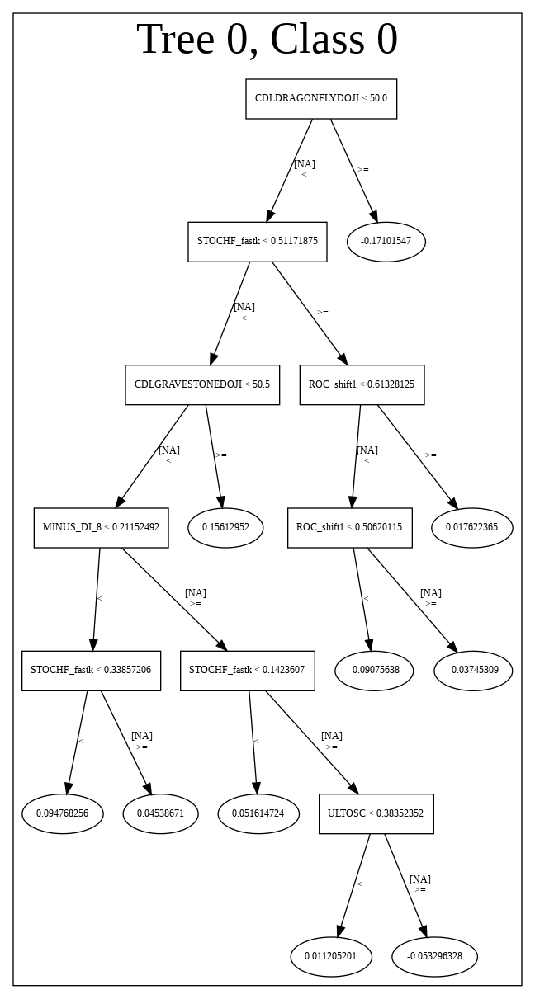

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191220_183308_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191220_183308_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_440_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['ROC_shift1',
 'CDLDRAGONFLYDOJI',
 'ROC_30',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'CCI_8',
 'WILLR_8',
 'ULTOSC',
 'WILLR_12',
 'MINUS_DI_8',
 'CCI_12',
 'TRANGE',
 'CCI_24',
 'BETA_8',
 'CMO_30',
 'LINEARREG_ANGLE_8',
 'BOP',
 'MACDFIX_8',
 'STOCH_slowk',
 'MINUS_DM_12',
 'aroonup_8',
 'aroonup_30',
 'PLUS_DI_14',
 'WILLR_30',
 'AROONOSC_30',
 'CMO_14',
 'ROCR_20',
 'PLUS_DI_12',
 'MOM_12',
 'BBANDS_lowerband_14_5_5',
 'aroondown_14',
 'ROCR_14',
 'BBANDS_upperband_20_3_2',
 'SAR_0.24',
 'MINUS_DI_12',
 'ROCP_8',
 'LINEARREG_ANGLE_12',
 'PLUS_DM_20',
 'LINEARREG_SLOPE_8',
 'PLUS_DM_30',
 'CMO_8',
 'aroondown_30',
 'PLUS_DM_12',
 'CMO_12',
 'STOCHF_fastd',
 'BBANDS_upperband_14_2_5',
 'BBANDS_upperband_20_6_5',
 'ROCR100_12',
 'RSI_12',
 'CDLRICKSHAWMAN']

In [316]:
# XGBoost with recursive feature elimination
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [317]:
# DRF with recursive feature elimination
model_train(feature_name='RFE',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191220_183542,0.877534,0.447745,0.249267,0.381563,0.145590
1,GBM_4_AutoML_20191220_183542,0.865324,0.453791,0.252381,0.387212,0.149933
2,GBM_1_AutoML_20191220_183542,0.862454,0.460001,0.253236,0.390673,0.152625
3,GBM_3_AutoML_20191220_183542,0.862454,0.459074,0.260806,0.390123,0.152196
4,GBM_2_AutoML_20191220_183542,0.861233,0.459669,0.244200,0.390558,0.152536
5,GBM_grid_1_AutoML_20191220_183542_model_5,0.838889,0.684358,0.218559,0.495587,0.245606
6,GBM_grid_1_AutoML_20191220_183542_model_4,0.838034,0.638380,0.283883,0.472054,0.222835
7,GBM_grid_1_AutoML_20191220_183542_model_1,0.838034,0.562735,0.288217,0.433788,0.188172
8,GBM_grid_1_AutoML_20191220_183542_model_2,0.818926,0.589324,0.296276,0.447333,0.200107
9,GBM_grid_1_AutoML_20191220_183542_model_3,0.812271,0.612946,0.230342,0.432139,0.186744


,variable,relative_importance,scaled_importance,percentage
0,CDLDRAGONFLYDOJI,203.398087,1.000000,0.163765
1,ROC_shift1,192.240768,0.945145,0.154782
2,ROC_30,112.264557,0.551945,0.090389
3,CDLGRAVESTONEDOJI,107.252151,0.527302,0.086354
4,STOCHF_fastk,78.948883,0.388150,0.063565
5,CCI_8,65.050743,0.319820,0.052375
6,WILLR_8,56.223286,0.276420,0.045268
7,ULTOSC,37.961971,0.186639,0.030565
8,CCI_24,28.192631,0.138608,0.022699
9,WILLR_12,27.289003,0.134165,0.021972


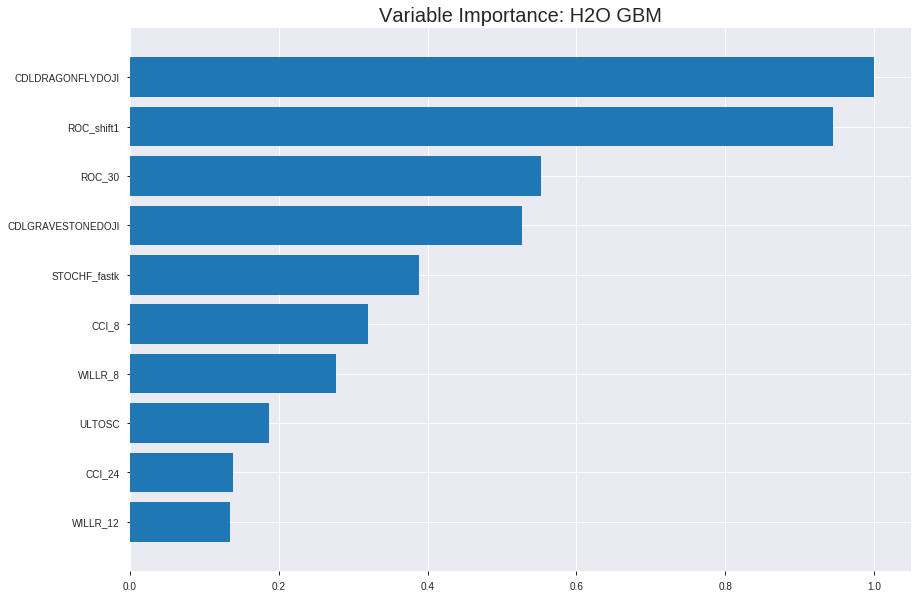

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191220_183542


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.1098213975457519
RMSE: 0.3313931163222192
LogLoss: 0.36675866530853457
Mean Per-Class Error: 0.11421506734006737
AUC: 0.9445859888568222
pr_auc: 0.9406642942134504
Gini: 0.8891719777136444
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49444908984973557: 


,0,1,Error,Rate
0,771.0,120.0,0.1347,(120.0/891.0)
1,84.0,812.0,0.0938,(84.0/896.0)
Total,855.0,932.0,0.1142,(204.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4944491,0.8884026,204.0
max f2,0.3562017,0.9176346,258.0
max f0point5,0.5780144,0.8916256,167.0
max accuracy,0.4944491,0.8858422,204.0
max precision,0.9741572,1.0,0.0
max recall,0.0686909,1.0,374.0
max specificity,0.9741572,1.0,0.0
max absolute_mcc,0.4944491,0.7722841,204.0
max min_per_class_accuracy,0.5148152,0.8783482,195.0
max mean_per_class_accuracy,0.4944491,0.8857849,204.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9603702,1.9944196,1.9944196,1.0,0.9660402,1.0,0.9660402,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9502923,1.9944196,1.9944196,1.0,0.9555564,1.0,0.9607983,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9397382,1.9944196,1.9944196,1.0,0.9449290,1.0,0.9555085,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9351888,1.9944196,1.9944196,1.0,0.9372359,1.0,0.9509404,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9307460,1.9944196,1.9944196,1.0,0.9329891,1.0,0.9473501,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8915463,1.9496012,1.9721356,0.9775281,0.9120737,0.9888268,0.9298105,0.0970982,0.1975446,94.9601224,97.2135625
,7,0.1499720,0.8437167,1.9496012,1.9646522,0.9775281,0.8684067,0.9850746,0.9094189,0.0970982,0.2946429,94.9601224,96.4652186
,8,0.2003358,0.7967693,1.9057788,1.9498516,0.9555556,0.8214653,0.9776536,0.8873077,0.0959821,0.390625,90.5778770,94.9851606
,9,0.2999440,0.7117766,1.8151460,1.9051173,0.9101124,0.7505679,0.9552239,0.8418978,0.1808036,0.5714286,81.5145967,90.5117271
,10,0.4001119,0.6252036,1.7047274,1.8549497,0.8547486,0.6679697,0.9300699,0.7983550,0.1707589,0.7421875,70.4727404,85.4949738




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.14404046729609352
RMSE: 0.3795266358190075
LogLoss: 0.4501600767486006
Mean Per-Class Error: 0.18682313238226722
AUC: 0.8756174259855806
pr_auc: 0.864841656886168
Gini: 0.7512348519711611
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45252125412125777: 


,0,1,Error,Rate
0,204.0,61.0,0.2302,(61.0/265.0)
1,39.0,207.0,0.1585,(39.0/246.0)
Total,243.0,268.0,0.1957,(100.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4525213,0.8054475,212.0
max f2,0.2315829,0.8618128,290.0
max f0point5,0.5563120,0.8155080,174.0
max accuracy,0.5355937,0.8140900,184.0
max precision,0.9785994,1.0,0.0
max recall,0.0458756,1.0,389.0
max specificity,0.9785994,1.0,0.0
max absolute_mcc,0.5355937,0.6277771,184.0
max min_per_class_accuracy,0.4981322,0.8048780,196.0
max mean_per_class_accuracy,0.5251231,0.8131769,187.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 48.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9529526,2.0772358,2.0772358,1.0,0.9658536,1.0,0.9658536,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9478390,2.0772358,2.0772358,1.0,0.9495895,1.0,0.9584608,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9408802,2.0772358,2.0772358,1.0,0.9443340,1.0,0.9540462,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9294536,2.0772358,2.0772358,1.0,0.9354017,1.0,0.9496071,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9211407,2.0772358,2.0772358,1.0,0.9246275,1.0,0.9448033,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.8825337,1.9174484,1.9973421,0.9230769,0.9036345,0.9615385,0.9242189,0.0975610,0.2032520,91.7448405,99.7342089
,7,0.1506849,0.8478968,1.9110569,1.9693274,0.92,0.8642370,0.9480519,0.9047443,0.0934959,0.2967480,91.1056911,96.9327421
,8,0.2015656,0.8118318,1.7576610,1.9158971,0.8461538,0.8280907,0.9223301,0.8853948,0.0894309,0.3861789,75.7661038,91.5897072
,9,0.3013699,0.7138503,1.7106648,1.8479305,0.8235294,0.7611670,0.8896104,0.8442544,0.1707317,0.5569106,71.0664754,84.7930525
,10,0.4011742,0.5751253,1.4662841,1.7529843,0.7058824,0.6372145,0.8439024,0.7927469,0.1463415,0.7032520,46.6284075,75.2984335



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-20 18:35:48,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-20 18:35:48,0.058 sec,5.0,0.4578226,0.6105855,0.8266701,0.6319053,1.7850056,0.2534975,0.4563535,0.6076386,0.8176484,0.5287677,1.9174484,0.2759295
,2019-12-20 18:35:48,0.113 sec,10.0,0.4352103,0.5659019,0.8451492,0.8317182,1.8282180,0.2417459,0.4379691,0.5702061,0.8191671,0.7810528,2.0772358,0.2818004
,2019-12-20 18:35:48,0.174 sec,15.0,0.4180146,0.5314975,0.8603364,0.8498684,1.9944196,0.2221600,0.4232845,0.5404372,0.8348290,0.8169857,2.0772358,0.2720157
,2019-12-20 18:35:48,0.227 sec,20.0,0.4059470,0.5069998,0.8715923,0.8585587,1.9944196,0.2193621,0.4149763,0.5222944,0.8395536,0.8261102,2.0772358,0.2270059
,2019-12-20 18:35:48,0.286 sec,25.0,0.3956705,0.4863678,0.8828106,0.8745356,1.9944196,0.2126469,0.4072529,0.5061037,0.8471008,0.8354524,2.0772358,0.2465753
,2019-12-20 18:35:48,0.344 sec,30.0,0.3859766,0.4675540,0.8942644,0.8873578,1.9944196,0.1857862,0.4023825,0.4959506,0.8517027,0.8413375,2.0772358,0.2446184
,2019-12-20 18:35:48,0.403 sec,35.0,0.3774554,0.4514950,0.9046924,0.8985060,1.9944196,0.1712367,0.3964324,0.4845226,0.8613591,0.8490239,2.0772358,0.2250489
,2019-12-20 18:35:48,0.463 sec,40.0,0.3694563,0.4365505,0.9132690,0.9047884,1.9944196,0.1639619,0.3926054,0.4768285,0.8643427,0.8550483,2.0772358,0.2113503
,2019-12-20 18:35:48,0.525 sec,45.0,0.3605375,0.4201635,0.9223485,0.9195084,1.9944196,0.1516508,0.3857252,0.4647269,0.8740834,0.8638368,2.0772358,0.1898239


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLDRAGONFLYDOJI,203.3980865,1.0,0.1637653
ROC_shift1,192.2407684,0.9451454,0.1547820
ROC_30,112.2645569,0.5519450,0.0903894
CDLGRAVESTONEDOJI,107.2521515,0.5273017,0.0863537
STOCHF_fastk,78.9488831,0.3881496,0.0635654
---,---,---,---
BBANDS_upperband_14_2_5,1.4997625,0.0073735,0.0012075
PLUS_DM_20,1.1840036,0.0058211,0.0009533
PLUS_DM_30,0.9080931,0.0044646,0.0007311
MINUS_DM_12,0.6982948,0.0034331,0.0005622



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.80078125)

('F1', 0.797427652733119)

('auc', 0.8775335775335775)

('logloss', 0.44774499637744597)

('mean_per_class_error', 0.1977411477411477)

('rmse', 0.3815626454852782)

('mse', 0.14559005242972406)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        0
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


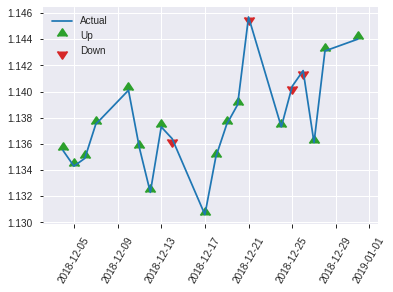


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.14559005242972406
RMSE: 0.3815626454852782
LogLoss: 0.44774499637744597
Mean Per-Class Error: 0.1977411477411477
AUC: 0.8775335775335775
pr_auc: 0.8867778069614382
Gini: 0.755067155067155
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26608336623137047: 


,0,1,Error,Rate
0,69.0,57.0,0.4524,(57.0/126.0)
1,6.0,124.0,0.0462,(6.0/130.0)
Total,75.0,181.0,0.2461,(63.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2660834,0.7974277,180.0
max f2,0.2660834,0.8844508,180.0
max f0point5,0.5985611,0.8363636,104.0
max accuracy,0.5985611,0.8007812,104.0
max precision,0.9704734,1.0,0.0
max recall,0.0801729,1.0,234.0
max specificity,0.9704734,1.0,0.0
max absolute_mcc,0.5985611,0.6144448,104.0
max min_per_class_accuracy,0.5088057,0.7698413,129.0
max mean_per_class_accuracy,0.5985611,0.8022589,104.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 48.86 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9625365,1.9692308,1.9692308,1.0,0.9672397,1.0,0.9672397,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9436882,1.9692308,1.9692308,1.0,0.9539467,1.0,0.9605932,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9271126,1.9692308,1.9692308,1.0,0.9372309,1.0,0.9547526,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9175325,1.9692308,1.9692308,1.0,0.9198380,1.0,0.9452304,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9091473,1.9692308,1.9692308,1.0,0.9134737,1.0,0.9403448,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8819866,1.9692308,1.9692308,1.0,0.8939605,1.0,0.9171526,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8338629,1.9692308,1.9692308,1.0,0.8577173,1.0,0.8973408,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7847947,1.8177515,1.9313609,0.9230769,0.8066495,0.9807692,0.8746680,0.0923077,0.3923077,81.7751479,93.1360947
,9,0.3007812,0.6808867,1.6541538,1.8413586,0.84,0.7256949,0.9350649,0.8263001,0.1615385,0.5538462,65.4153846,84.1358641
,10,0.4023438,0.6016601,1.3633136,1.7206871,0.6923077,0.6379742,0.8737864,0.7787615,0.1384615,0.6923077,36.3313609,72.0687080


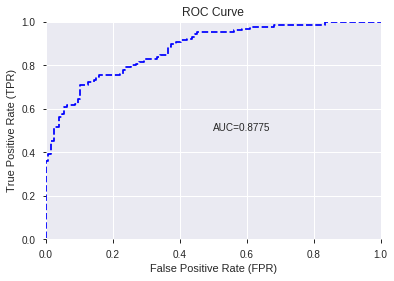

This function is available for GLM models only


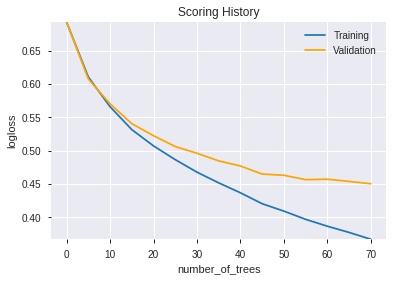

--2019-12-20 18:36:02--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.131.163
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.131.163|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1573.0
            depth:       1
            colId:       44
            colName:     CDLGRAVESTONEDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.058677305
            squaredErr:  387.57278
            leftChild:   Node 3
            

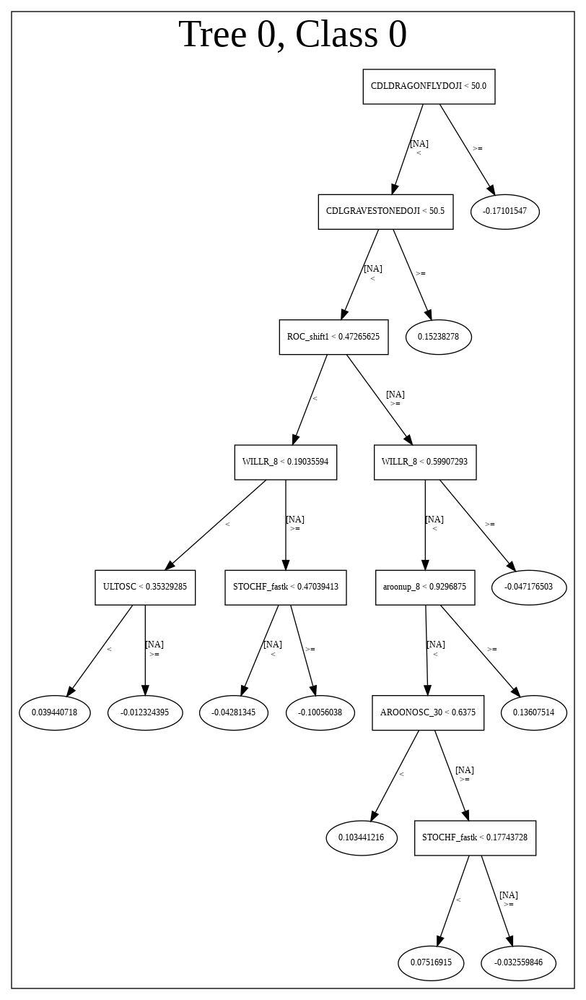

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191220_183542',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191220_183542',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_450_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_450_sid_be3a',
   'type': 'Ke

['CDLDRAGONFLYDOJI',
 'ROC_shift1',
 'ROC_30',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'CCI_8',
 'WILLR_8',
 'ULTOSC',
 'CCI_24',
 'WILLR_12',
 'AROONOSC_30',
 'MACDFIX_8',
 'aroonup_8',
 'aroondown_14',
 'MINUS_DI_8',
 'aroonup_30',
 'LINEARREG_SLOPE_8',
 'CCI_12',
 'WILLR_30',
 'CMO_30',
 'TRANGE',
 'STOCHF_fastd',
 'CMO_12',
 'aroondown_30',
 'ROCR_14',
 'LINEARREG_ANGLE_8',
 'ROCP_8',
 'BETA_8',
 'ROCR_20',
 'RSI_12',
 'CMO_8',
 'BBANDS_upperband_20_6_5',
 'CMO_14',
 'PLUS_DI_12',
 'PLUS_DI_14',
 'MINUS_DI_12',
 'LINEARREG_ANGLE_12',
 'PLUS_DM_12',
 'SAR_0.24',
 'BBANDS_lowerband_14_5_5',
 'BBANDS_upperband_20_3_2',
 'BOP',
 'STOCH_slowk',
 'ROCR100_12',
 'CDLRICKSHAWMAN',
 'BBANDS_upperband_14_2_5',
 'PLUS_DM_20',
 'PLUS_DM_30',
 'MINUS_DM_12',
 'MOM_12']

In [318]:
# GBM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GBM",features_list=features_list)

In [319]:
# StackedEnsemble with recursive feature elimination
model_train(feature_name='RFE',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_183659_model_1,0.912576,0.386550,0.189866,0.354266,0.125504
1,XGBoost_3_AutoML_20191220_183659,0.881929,0.438838,0.209096,0.377459,0.142475
2,XGBoost_2_AutoML_20191220_183659,0.881136,0.442433,0.245177,0.378839,0.143519
3,XGBoost_1_AutoML_20191220_183659,0.879365,0.441477,0.233150,0.379580,0.144081
4,GBM_5_AutoML_20191220_183659,0.877534,0.447745,0.249267,0.381563,0.145590
5,GBM_4_AutoML_20191220_183659,0.865324,0.453791,0.252381,0.387212,0.149933
6,GBM_3_AutoML_20191220_183659,0.862454,0.459074,0.260806,0.390123,0.152196
7,GBM_1_AutoML_20191220_183659,0.862454,0.460001,0.253236,0.390673,0.152625
8,GBM_2_AutoML_20191220_183659,0.861233,0.459669,0.244200,0.390558,0.152536
9,DRF_1_AutoML_20191220_183659,0.808333,0.520359,0.288706,0.419583,0.176050


,variable,relative_importance,scaled_importance,percentage
0,ROC_shift1,6.500823,1.000000,1.530766e-01
1,ROC_30,4.631282,0.712415,1.090540e-01
2,BBANDS_upperband_20_3_2,3.322636,0.511110,7.823897e-02
3,PLUS_DI_12,3.161238,0.486283,7.443849e-02
4,PLUS_DI_14,2.925146,0.449965,6.887918e-02
5,BBANDS_upperband_20_6_5,2.020413,0.310793,4.757519e-02
6,MACDFIX_8,1.422627,0.218838,3.349896e-02
7,MINUS_DI_8,1.403339,0.215871,3.304479e-02
8,MINUS_DI_12,1.270920,0.195501,2.992667e-02
9,MOM_12,1.222324,0.188026,2.878238e-02


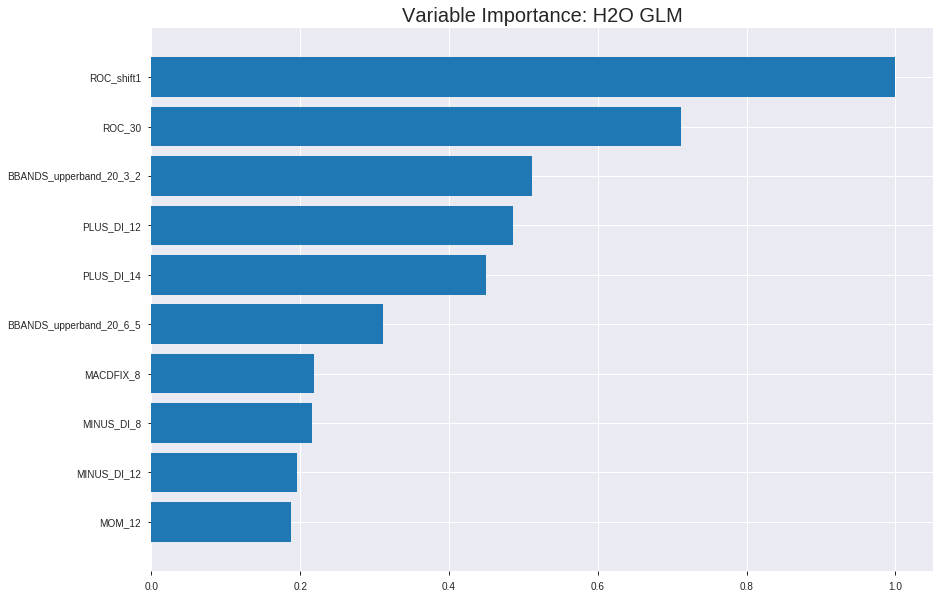

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_183659_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1328181311232574
RMSE: 0.36444221918331227
LogLoss: 0.4122405859200358
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375748
Residual deviance: 1473.347854078208
AIC: 1575.347854078208
AUC: 0.8922214456068623
pr_auc: 0.8731339159037511
Gini: 0.7844428912137247
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3681448045195741: 


,0,1,Error,Rate
0,629.0,262.0,0.2941,(262.0/891.0)
1,83.0,813.0,0.0926,(83.0/896.0)
Total,712.0,1075.0,0.1931,(345.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3681448,0.8249619,249.0
max f2,0.2208015,0.8879950,300.0
max f0point5,0.6219932,0.8247423,158.0
max accuracy,0.4239162,0.8114158,230.0
max precision,0.9993633,1.0,0.0
max recall,0.0208707,1.0,386.0
max specificity,0.9993633,1.0,0.0
max absolute_mcc,0.4239162,0.6279192,230.0
max min_per_class_accuracy,0.5114057,0.8080357,198.0
max mean_per_class_accuracy,0.4239162,0.8112342,230.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9983418,1.9944196,1.9944196,1.0,0.9991365,1.0,0.9991365,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9965068,1.9944196,1.9944196,1.0,0.9976422,1.0,0.9983893,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9940449,1.9944196,1.9944196,1.0,0.9948443,1.0,0.9972077,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9880190,1.9944196,1.9944196,1.0,0.9912961,1.0,0.9957298,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9838411,1.9944196,1.9944196,1.0,0.9855135,1.0,0.9936865,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9558027,1.8823736,1.9387096,0.9438202,0.9708252,0.9720670,0.9823197,0.09375,0.1941964,88.2373596,93.8709597
,7,0.1499720,0.9246539,1.7703275,1.8827917,0.8876404,0.9408352,0.9440299,0.9685431,0.0881696,0.2823661,77.0327548,88.2791678
,8,0.2003358,0.8767048,1.8171379,1.8662865,0.9111111,0.9002061,0.9357542,0.9513634,0.0915179,0.3738839,81.7137897,86.6286537
,9,0.2999440,0.7754420,1.6358723,1.7897684,0.8202247,0.8307461,0.8973881,0.9113077,0.1629464,0.5368304,63.5872291,78.9768374
,10,0.4001119,0.6408284,1.5153132,1.7210586,0.7597765,0.7103857,0.8629371,0.8610069,0.1517857,0.6886161,51.5313248,72.1058629




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.12414092155874937
RMSE: 0.3523363755826942
LogLoss: 0.39039263842323846
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.506742749742
Residual deviance: 398.98127646854977
AIC: 500.98127646854977
AUC: 0.9055990182543334
pr_auc: 0.9047025406078696
Gini: 0.8111980365086668
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4286391442386778: 


,0,1,Error,Rate
0,210.0,55.0,0.2075,(55.0/265.0)
1,32.0,214.0,0.1301,(32.0/246.0)
Total,242.0,269.0,0.1703,(87.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4286391,0.8310680,217.0
max f2,0.2484754,0.8763278,269.0
max f0point5,0.6360895,0.8431953,154.0
max accuracy,0.4751861,0.8317025,207.0
max precision,0.9998211,1.0,0.0
max recall,0.0109694,1.0,389.0
max specificity,0.9998211,1.0,0.0
max absolute_mcc,0.4737905,0.6642600,208.0
max min_per_class_accuracy,0.5009564,0.8252033,200.0
max mean_per_class_accuracy,0.4737905,0.8323439,208.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 47.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9958596,2.0772358,2.0772358,1.0,0.9978899,1.0,0.9978899,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9913887,2.0772358,2.0772358,1.0,0.9926870,1.0,0.9955250,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9869508,2.0772358,2.0772358,1.0,0.9890438,1.0,0.9934996,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9801628,2.0772358,2.0772358,1.0,0.9825100,1.0,0.9908830,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9755599,2.0772358,2.0772358,1.0,0.9785417,1.0,0.9885097,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.9459116,2.0772358,2.0772358,1.0,0.9584689,1.0,0.9734893,0.1056911,0.2113821,107.7235772,107.7235772
,7,0.1506849,0.9120681,2.0772358,2.0772358,1.0,0.9308858,1.0,0.9596570,0.1016260,0.3130081,107.7235772,107.7235772
,8,0.2015656,0.8468652,1.9174484,2.0369011,0.9230769,0.8772368,0.9805825,0.9388519,0.0975610,0.4105691,91.7448405,103.6901097
,9,0.3013699,0.7389688,1.6699346,1.9153732,0.8039216,0.7937130,0.9220779,0.8907864,0.1666667,0.5772358,66.9934641,91.5373245
,10,0.4011742,0.6121981,1.4255540,1.7935158,0.6862745,0.6722755,0.8634146,0.8364252,0.1422764,0.7195122,42.5553961,79.3515764



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:37:05,0.000 sec,2,.15E2,50,1.3744509,1.3733270
,2019-12-20 18:37:05,0.008 sec,4,.96E1,51,1.3677756,1.3658613
,2019-12-20 18:37:05,0.015 sec,6,.6E1,51,1.3577852,1.3546379
,2019-12-20 18:37:05,0.024 sec,8,.37E1,51,1.3433391,1.3382992
,2019-12-20 18:37:05,0.033 sec,10,.23E1,51,1.3234319,1.3155709
---,---,---,---,---,---,---,---
,2019-12-20 18:37:06,0.211 sec,52,.1E-3,51,0.8262532,0.7843090
,2019-12-20 18:37:06,0.220 sec,54,.65E-4,51,0.8254930,0.7827571
,2019-12-20 18:37:06,0.230 sec,56,.4E-4,51,0.8249859,0.7817721
,2019-12-20 18:37:06,0.238 sec,58,.25E-4,51,0.8246367,0.7811848



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.8125)

('F1', 0.8389261744966442)

('auc', 0.9125763125763126)

('logloss', 0.38655027040670287)

('mean_per_class_error', 0.18571428571428572)

('rmse', 0.35426595925210774)

('mse', 0.12550436988481606)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           0
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


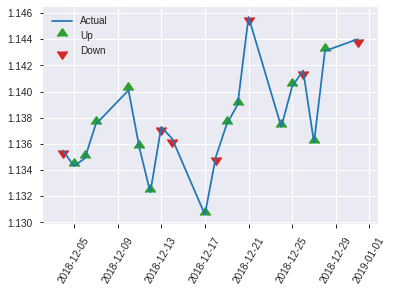


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.12550436988481606
RMSE: 0.35426595925210774
LogLoss: 0.38655027040670287
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.87097666550136
Residual deviance: 197.91373844823187
AIC: 299.91373844823187
AUC: 0.9125763125763126
pr_auc: 0.911361198234116
Gini: 0.8251526251526251
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.28139404303551774: 


,0,1,Error,Rate
0,83.0,43.0,0.3413,(43.0/126.0)
1,5.0,125.0,0.0385,(5.0/130.0)
Total,88.0,168.0,0.1875,(48.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2813940,0.8389262,167.0
max f2,0.2067921,0.9116809,181.0
max f0point5,0.6322752,0.8609959,87.0
max accuracy,0.5807476,0.8125,99.0
max precision,0.9960594,1.0,0.0
max recall,0.1337143,1.0,196.0
max specificity,0.9960594,1.0,0.0
max absolute_mcc,0.2813940,0.6528912,167.0
max min_per_class_accuracy,0.4719460,0.8,128.0
max mean_per_class_accuracy,0.5807476,0.8142857,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 46.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9944966,1.9692308,1.9692308,1.0,0.9955902,1.0,0.9955902,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9911377,1.9692308,1.9692308,1.0,0.9926166,1.0,0.9941034,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9792650,1.9692308,1.9692308,1.0,0.9846083,1.0,0.9917296,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9722765,1.9692308,1.9692308,1.0,0.9757168,1.0,0.9873625,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9499528,1.9692308,1.9692308,1.0,0.9577955,1.0,0.9828137,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9076183,1.9692308,1.9692308,1.0,0.9306848,1.0,0.9567493,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8542877,1.8177515,1.9187377,0.9230769,0.8828366,0.9743590,0.9321117,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.8050145,1.9692308,1.9313609,1.0,0.8235411,0.9807692,0.9049690,0.1,0.3923077,96.9230769,93.1360947
,9,0.3007812,0.6879088,1.8116923,1.8925075,0.92,0.7452036,0.9610390,0.8530971,0.1769231,0.5692308,81.1692308,89.2507493
,10,0.4023438,0.5703742,1.3633136,1.7589246,0.6923077,0.6217070,0.8932039,0.7946880,0.1384615,0.7076923,36.3313609,75.8924571


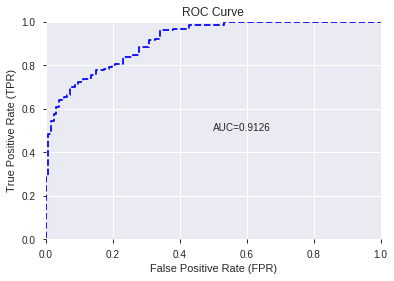

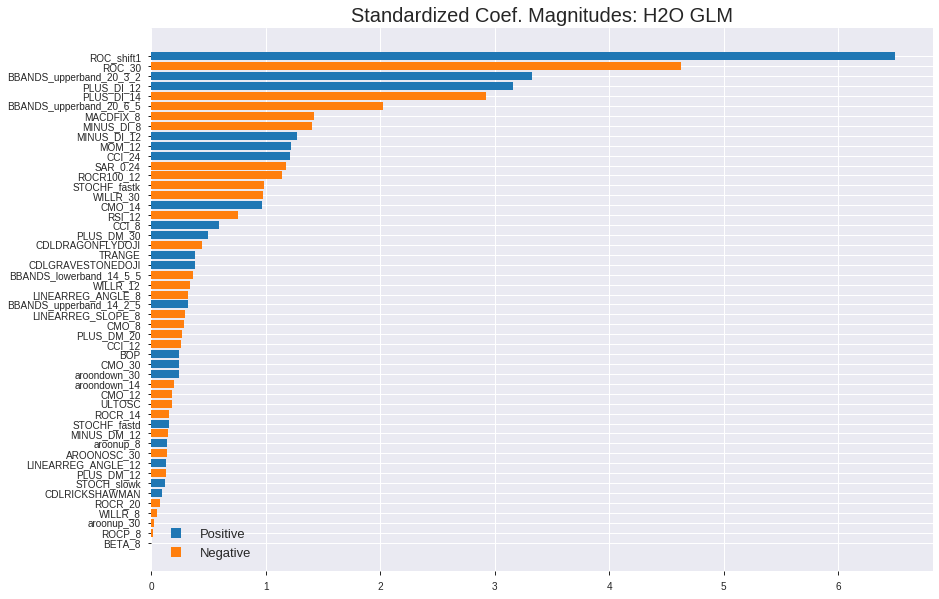

'log_likelihood'
--2019-12-20 18:37:21--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.170.75
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.170.75|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


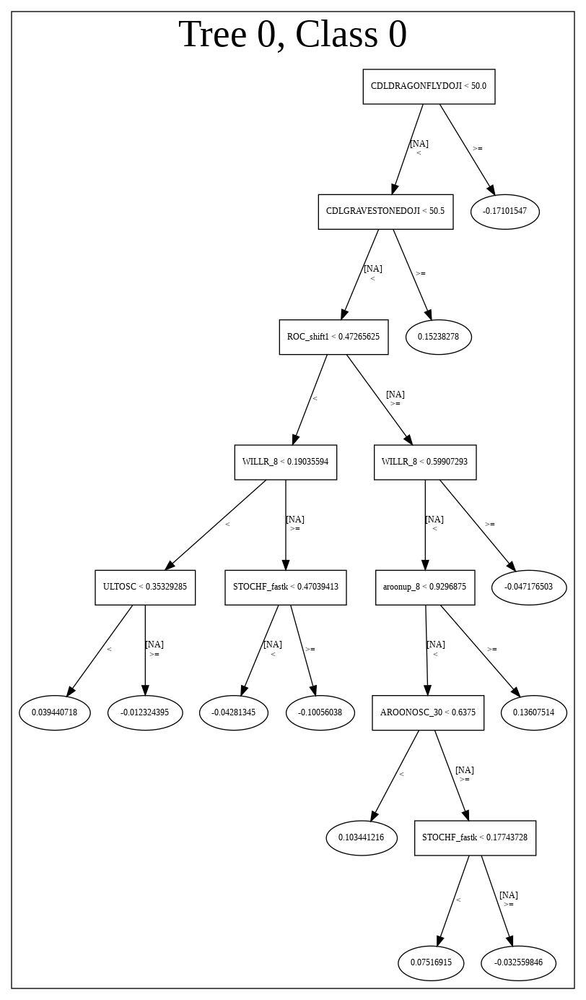

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_183659_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_183659_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_458_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_458

['ROC_shift1',
 'ROC_30',
 'BBANDS_upperband_20_3_2',
 'PLUS_DI_12',
 'PLUS_DI_14',
 'BBANDS_upperband_20_6_5',
 'MACDFIX_8',
 'MINUS_DI_8',
 'MINUS_DI_12',
 'MOM_12',
 'CCI_24',
 'SAR_0.24',
 'ROCR100_12',
 'STOCHF_fastk',
 'WILLR_30',
 'CMO_14',
 'RSI_12',
 'CCI_8',
 'PLUS_DM_30',
 'CDLDRAGONFLYDOJI',
 'TRANGE',
 'CDLGRAVESTONEDOJI',
 'BBANDS_lowerband_14_5_5',
 'WILLR_12',
 'LINEARREG_ANGLE_8',
 'BBANDS_upperband_14_2_5',
 'LINEARREG_SLOPE_8',
 'CMO_8',
 'PLUS_DM_20',
 'CCI_12',
 'BOP',
 'CMO_30',
 'aroondown_30',
 'aroondown_14',
 'CMO_12',
 'ULTOSC',
 'ROCR_14',
 'STOCHF_fastd',
 'MINUS_DM_12',
 'aroonup_8',
 'AROONOSC_30',
 'LINEARREG_ANGLE_12',
 'PLUS_DM_12',
 'STOCH_slowk',
 'CDLRICKSHAWMAN',
 'ROCR_20',
 'WILLR_8',
 'aroonup_30',
 'ROCP_8',
 'BETA_8']

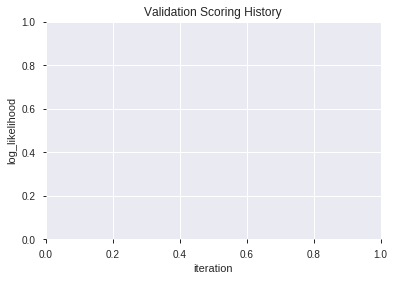

In [320]:
# All algos with recursive feature elimination
model_train(feature_name='RFE',model_algo=None,features_list=features_list)

In [0]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFECV' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=cv_rfe).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

In [322]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DeepLearning",features_list=features_list)

[]

In [323]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GLM",features_list=features_list)

[]

In [324]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="XGBoost",features_list=features_list)

[]

In [325]:
# DRF with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DRF",features_list=features_list)

[]

In [326]:
# GBM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GBM",features_list=features_list)

[]

In [327]:
# StackedEnsemble with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="StackedEnsemble",features_list=features_list)

[]

In [328]:
# All algos with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo=None,features_list=features_list)

[]

In [329]:
# Stacked ensemble

## filter models based on ensemble_model_threshold
models_arr = []
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_arr.append(best_models[model_name]['id'])

from h2o.estimators.stackedensemble import H2OStackedEnsembleEstimator

try:
  ensemble = H2OStackedEnsembleEstimator(seed=1,
                                        base_models=models_arr)

  ensemble.train(y=data_label_name, training_frame=train_hf[:index_splits[0],:], blending_frame =train_hf[index_splits[0]:index_splits[1],:])
except:
  pass

try:
  display(ensemble)
  model_performance = ensemble.model_performance(test_data=train_hf[index_splits[1]:,:])
  display(model_performance)
  for k in models_summary:
    result = getattr(model_performance, k)()
    result = result[0][1] if isinstance(result,list) else result
    models_summary[k] = models_summary[k].append(pd.DataFrame({'StackedEnsemble':[result]},index=['All']))
    display((k,result))
except Exception as e:
  print(e)

stackedensemble Model Build progress: | (failed)
No model trained yet


'NoneType' object is not subscriptable


Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191220_183819_model_1,0.906105,0.416359,0.217643,0.366808,0.134548
1,DeepLearning_grid_1_AutoML_20191220_183819_model_56,0.905189,1.036115,0.221612,0.429761,0.184695
2,DeepLearning_grid_1_AutoML_20191220_183819_model_42,0.897497,1.066286,0.217155,0.443344,0.196554
3,GBM_grid_1_AutoML_20191220_183819_model_25,0.891148,0.484703,0.212698,0.395404,0.156344
4,XGBoost_grid_1_AutoML_20191220_183819_model_12,0.890232,0.524932,0.216545,0.414345,0.171682
5,DeepLearning_grid_1_AutoML_20191220_183819_model_30,0.887851,1.196496,0.208364,0.446756,0.199591
6,DeepLearning_grid_1_AutoML_20191220_183819_model_40,0.885836,1.171632,0.208364,0.445867,0.198797
7,DeepLearning_grid_1_AutoML_20191220_183819_model_57,0.885043,1.092076,0.221245,0.451214,0.203594
8,DeepLearning_grid_1_AutoML_20191220_183819_model_8,0.883944,1.151198,0.212821,0.447125,0.199921
9,XGBoost_grid_1_AutoML_20191220_183819_model_28,0.883913,0.522093,0.229426,0.412691,0.170314


,variable,relative_importance,scaled_importance,percentage
0,XGBF_['XGBoost']predict,0.218204,1.000000,0.106181
1,XGBF_['XGBoost'],0.182347,0.835675,0.088733
2,RFE_['XGBoost']predict,0.177436,0.813166,0.086343
3,Super_learner_None,0.157356,0.721143,0.076572
4,Super_learner_Nonepredict,0.155239,0.711442,0.075542
5,RFE_['XGBoost'],0.149977,0.687324,0.072981
6,RFE_['GBM']predict,0.098349,0.450721,0.047858
7,RFE_['GBM'],0.096838,0.443795,0.047123
8,XGBF_['GBM'],0.093815,0.429941,0.045652
9,XGBF_['GBM']predict,0.090476,0.414642,0.044027


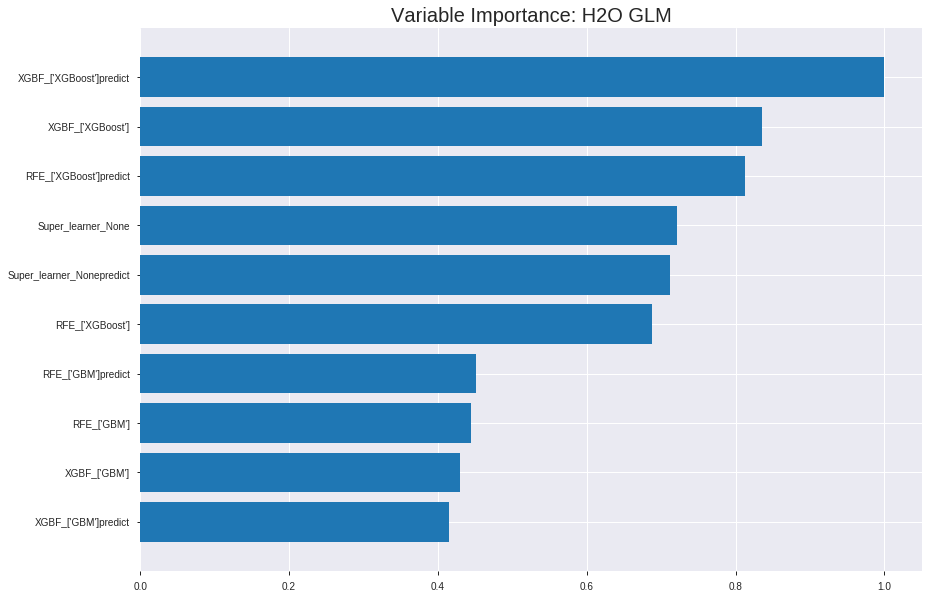

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191220_183819_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.06559759914871445
RMSE: 0.2561202825797177
LogLoss: 0.25470862474777406
Null degrees of freedom: 1786
Residual degrees of freedom: 1764
Null deviance: 2477.2940333757524
Residual deviance: 910.3286248485446
AIC: 956.3286248485446
AUC: 0.9742151174442841
pr_auc: 0.9655312816370287
Gini: 0.9484302348885683
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5184631956760644: 


,0,1,Error,Rate
0,826.0,65.0,0.073,(65.0/891.0)
1,57.0,839.0,0.0636,(57.0/896.0)
Total,883.0,904.0,0.0683,(122.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5184632,0.9322222,198.0
max f2,0.3596582,0.9492008,242.0
max f0point5,0.6973267,0.9396467,144.0
max accuracy,0.5184632,0.9317292,198.0
max precision,0.9255857,1.0,0.0
max recall,0.0923923,1.0,371.0
max specificity,0.9255857,1.0,0.0
max absolute_mcc,0.5184632,0.8634884,198.0
max min_per_class_accuracy,0.5198059,0.9304153,197.0
max mean_per_class_accuracy,0.5184632,0.9317161,198.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9233591,1.9944196,1.9944196,1.0,0.9247567,1.0,0.9247567,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9211025,1.9944196,1.9944196,1.0,0.9222841,1.0,0.9235204,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9197547,1.9944196,1.9944196,1.0,0.9203359,1.0,0.9224589,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9187047,1.9944196,1.9944196,1.0,0.9192315,1.0,0.9216521,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9173535,1.9944196,1.9944196,1.0,0.9181078,1.0,0.9209432,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9076618,1.9944196,1.9944196,1.0,0.9128518,1.0,0.9169201,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8961106,1.9944196,1.9944196,1.0,0.9018306,1.0,0.9119090,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.8825026,1.9500992,1.9832776,0.9777778,0.8887357,0.9944134,0.9060833,0.0982143,0.3973214,95.0099206,98.3277634
,9,0.2999440,0.8519575,1.9047828,1.9572103,0.9550562,0.8688544,0.9813433,0.8937200,0.1897321,0.5870536,90.4782805,95.7210321
,10,0.4001119,0.7676665,1.8829996,1.9386317,0.9441341,0.8187403,0.9720280,0.8749489,0.1886161,0.7756696,88.2999551,93.8631681




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.12654926873654818
RMSE: 0.35573764031452754
LogLoss: 0.4044335597479577
Null degrees of freedom: 510
Residual degrees of freedom: 488
Null deviance: 708.5067427497428
Residual deviance: 413.33109806241276
AIC: 459.33109806241276
AUC: 0.9027458199110293
pr_auc: 0.8976642511375368
Gini: 0.8054916398220586
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42762704902275184: 


,0,1,Error,Rate
0,210.0,55.0,0.2075,(55.0/265.0)
1,33.0,213.0,0.1341,(33.0/246.0)
Total,243.0,268.0,0.1722,(88.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4276270,0.8287938,208.0
max f2,0.1329623,0.8795270,300.0
max f0point5,0.8165584,0.8536585,114.0
max accuracy,0.6856934,0.8336595,173.0
max precision,0.9260878,1.0,0.0
max recall,0.0723330,1.0,389.0
max specificity,0.9260878,1.0,0.0
max absolute_mcc,0.6856934,0.6675218,173.0
max min_per_class_accuracy,0.5806254,0.8226415,192.0
max mean_per_class_accuracy,0.6856934,0.8321905,173.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.86 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9236384,2.0772358,2.0772358,1.0,0.9247370,1.0,0.9247370,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9208571,2.0772358,2.0772358,1.0,0.9216914,1.0,0.9233527,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9186835,2.0772358,2.0772358,1.0,0.9196397,1.0,0.9221923,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9174423,2.0772358,2.0772358,1.0,0.9180270,1.0,0.9212006,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9155250,2.0772358,2.0772358,1.0,0.9166547,1.0,0.9203264,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.9084698,1.9973421,2.0372889,0.9615385,0.9119303,0.9807692,0.9161283,0.1016260,0.2073171,99.7342089,103.7288931
,7,0.1506849,0.8983422,1.8279675,1.9693274,0.88,0.9023965,0.9480519,0.9116699,0.0894309,0.2967480,82.7967480,96.9327421
,8,0.2015656,0.8848819,2.0772358,1.9965664,1.0,0.8920910,0.9611650,0.9067277,0.1056911,0.4024390,107.7235772,99.6566422
,9,0.3013699,0.8397842,1.8735852,1.9558389,0.9019608,0.8623479,0.9415584,0.8920305,0.1869919,0.5894309,87.3585206,95.5838877
,10,0.4011742,0.7385413,1.3848238,1.8137815,0.6666667,0.7903675,0.8731707,0.8667387,0.1382114,0.7276423,38.4823848,81.3781479



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-20 18:38:22,0.000 sec,2,.46E2,23,1.2722165,1.2894468
,2019-12-20 18:38:22,0.008 sec,4,.29E2,23,1.2158058,1.2422029
,2019-12-20 18:38:22,0.015 sec,6,.18E2,23,1.1404729,1.1801075
,2019-12-20 18:38:22,0.021 sec,8,.11E2,23,1.0474682,1.1053979
,2019-12-20 18:38:22,0.026 sec,10,.69E1,23,0.9434125,1.0253583
,2019-12-20 18:38:22,0.031 sec,12,.43E1,23,0.8373517,0.9495000
,2019-12-20 18:38:22,0.038 sec,14,.26E1,23,0.7378763,0.8866811
,2019-12-20 18:38:22,0.043 sec,16,.16E1,23,0.6498321,0.8420116
,2019-12-20 18:38:22,0.050 sec,18,.1E1,23,0.5740862,0.8165884
,2019-12-20 18:38:22,0.056 sec,20,.63E0,23,0.5094172,0.8088671


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.82421875)

('F1', 0.819672131147541)

('auc', 0.9061050061050061)

('logloss', 0.4163589008089921)

('mean_per_class_error', 0.17356532356532361)

('rmse', 0.36680817254433634)

('mse', 0.1345482354453156)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


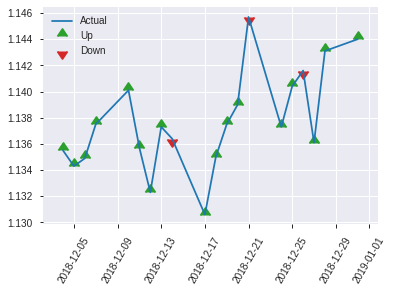


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1345482354453156
RMSE: 0.36680817254433634
LogLoss: 0.4163589008089921
Null degrees of freedom: 255
Residual degrees of freedom: 233
Null deviance: 354.8709766655029
Residual deviance: 213.175757214204
AIC: 259.175757214204
AUC: 0.9061050061050061
pr_auc: 0.9133935350004247
Gini: 0.8122100122100122
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.16254399901584168: 


,0,1,Error,Rate
0,76.0,50.0,0.3968,(50.0/126.0)
1,5.0,125.0,0.0385,(5.0/130.0)
Total,81.0,175.0,0.2148,(55.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1625440,0.8196721,174.0
max f2,0.1625440,0.8992806,174.0
max f0point5,0.7495606,0.8864542,92.0
max accuracy,0.7495606,0.8242188,92.0
max precision,0.9243487,1.0,0.0
max recall,0.0875753,1.0,229.0
max specificity,0.9243487,1.0,0.0
max absolute_mcc,0.7495606,0.6786533,92.0
max min_per_class_accuracy,0.5235364,0.7923077,128.0
max mean_per_class_accuracy,0.7495606,0.8264347,92.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.48 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9224959,1.9692308,1.9692308,1.0,0.9236630,1.0,0.9236630,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9207387,1.9692308,1.9692308,1.0,0.9213731,1.0,0.9225181,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9176352,1.9692308,1.9692308,1.0,0.9202553,1.0,0.9219524,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9153378,1.9692308,1.9692308,1.0,0.9158542,1.0,0.9202892,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9110642,1.9692308,1.9692308,1.0,0.9141134,1.0,0.9193391,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8985278,1.9692308,1.9692308,1.0,0.9049768,1.0,0.9121580,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8853170,1.9692308,1.9692308,1.0,0.8929554,1.0,0.9057571,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.8639579,1.9692308,1.9692308,1.0,0.8751243,1.0,0.8980989,0.1,0.4,96.9230769,96.9230769
,9,0.3007812,0.8040837,1.8116923,1.9180819,0.92,0.8367892,0.9740260,0.8781932,0.1769231,0.5769231,81.1692308,91.8081918
,10,0.4023438,0.7046706,1.3633136,1.7780433,0.6923077,0.7515732,0.9029126,0.8462308,0.1384615,0.7153846,36.3313609,77.8043316


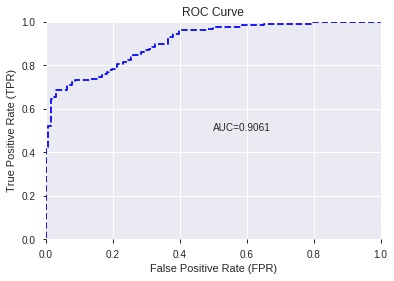

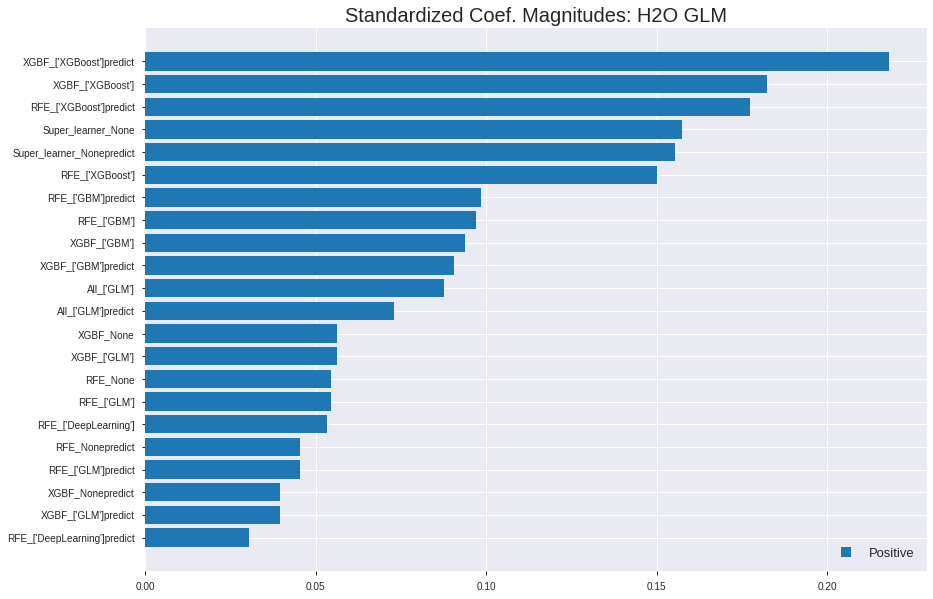

'log_likelihood'
--2019-12-20 19:18:46--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.131.51
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.131.51|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


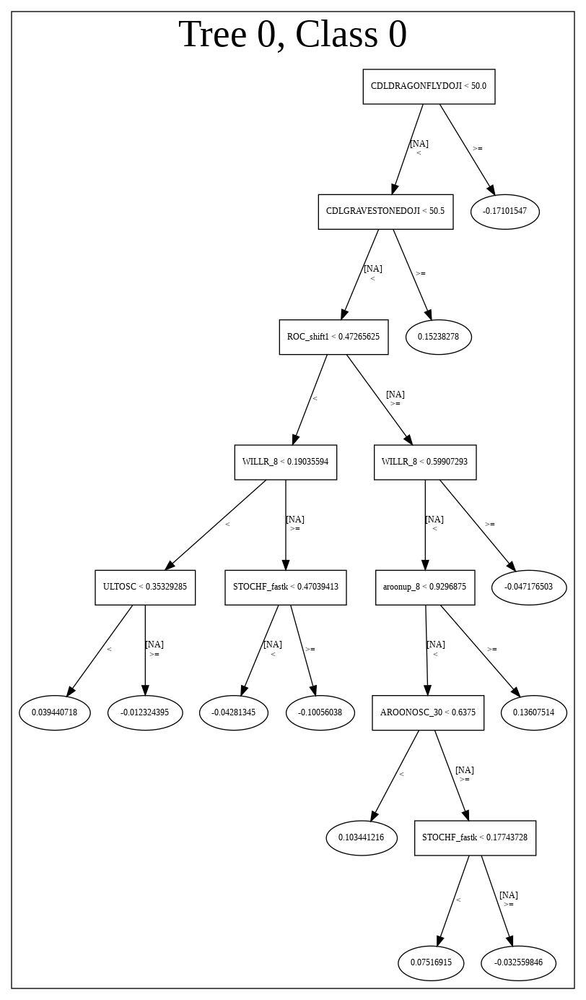

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191220_183819_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191220_183819_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_466_sid_be3a',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_466

["XGBF_['XGBoost']predict",
 "XGBF_['XGBoost']",
 "RFE_['XGBoost']predict",
 'Super_learner_None',
 'Super_learner_Nonepredict',
 "RFE_['XGBoost']",
 "RFE_['GBM']predict",
 "RFE_['GBM']",
 "XGBF_['GBM']",
 "XGBF_['GBM']predict",
 "All_['GLM']",
 "All_['GLM']predict",
 'XGBF_None',
 "XGBF_['GLM']",
 'RFE_None',
 "RFE_['GLM']",
 "RFE_['DeepLearning']",
 'RFE_Nonepredict',
 "RFE_['GLM']predict",
 'XGBF_Nonepredict',
 "XGBF_['GLM']predict",
 "RFE_['DeepLearning']predict"]

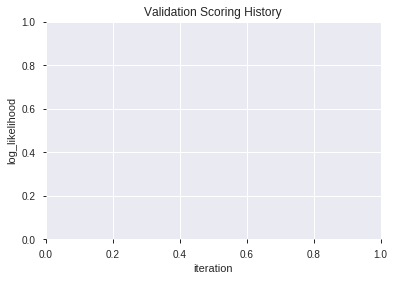

In [330]:
# Super learner
models_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_df[model_name] = pd.read_csv(model_name+".csv")['p1']
    models_df[model_name+'predict'] = pd.read_csv(model_name+".csv")['predict']

models_df[data_label_name] = pd.read_pickle('scaled_df')[[data_label_name]].values[-len(models_df):]

training_frame = h2o.H2OFrame(models_df)
training_frame[data_label_name] = training_frame[data_label_name].ascharacter().asfactor()

model_train(feature_name='Super_learner',model_algo=None,training_frame= training_frame,max_models=500)

In [331]:
# Majority Voting
models1_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models1_df[model_name] = pd.read_csv(model_name+".csv")['predict']

model_accuracy = accuracy_score(models1_df.mode(1)[0].values[index_splits[1]:],pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'MajorityVoting':[model_accuracy]},index=['All']))
display('MajorityVoting', model_accuracy)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


'MajorityVoting'

0.80078125

In [332]:
# LogReg SuperLearner
from sklearn.linear_model import LogisticRegression
models2_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models2_df[model_name] = pd.read_csv(model_name+".csv")['predict']
    models2_df[model_name+'p1'] = pd.read_csv(model_name+".csv")['p1']

clf = LogisticRegression(random_state=0, solver='lbfgs',
                         multi_class='multinomial').fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'LogReg':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.80859375

In [333]:
# DTree SuperLearner
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=0).fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'DTree':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.77734375

In [334]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


All                0.828
DRF                0.770
DTree              0.777
DeepLearning       0.801
GBM                0.805
GLM                0.840
LogReg             0.809
MajorityVoting     0.809
StackedEnsemble    0.828
XGBoost            0.801
dtype: float64

,All,DRF,DTree,DeepLearning,GBM,GLM,LogReg,MajorityVoting,StackedEnsemble,XGBoost
All,NaN,NaN,0.777,0.785,NaN,0.840,0.809,0.809,0.828,0.797
DLF,0.769,0.770,NaN,0.757,0.785,0.789,NaN,NaN,NaN,0.762
Fwe,0.761,0.754,NaN,0.773,0.761,0.793,NaN,NaN,NaN,0.762
RFE,0.828,0.757,NaN,0.801,0.801,0.828,NaN,NaN,NaN,0.801
Super_learner,0.824,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.816,0.757,NaN,0.785,0.805,0.816,NaN,NaN,NaN,0.789






F1


All                0.839
DRF                0.792
DeepLearning       0.815
GBM                0.806
GLM                0.845
StackedEnsemble    0.830
XGBoost            0.815
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.784,NaN,0.845,0.83,0.807
DLF,0.786,0.792,0.779,0.799,0.810,NaN,0.786
Fwe,0.794,0.762,0.781,0.794,0.791,NaN,0.778
RFE,0.839,0.770,0.815,0.801,0.839,NaN,0.807
Super_learner,0.820,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.835,0.775,0.810,0.806,0.835,NaN,0.815






auc


All                0.913
DRF                0.838
DeepLearning       0.871
GBM                0.878
GLM                0.917
StackedEnsemble    0.906
XGBoost            0.883
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.846,NaN,0.917,0.906,0.883
DLF,0.852,0.838,0.841,0.855,0.850,NaN,0.852
Fwe,0.841,0.828,0.835,0.841,0.829,NaN,0.838
RFE,0.913,0.811,0.871,0.878,0.913,NaN,0.883
Super_learner,0.906,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.910,0.837,0.863,0.875,0.910,NaN,0.878






logloss


All                0.533
DRF                0.630
DeepLearning       0.612
GBM                0.683
GLM                1.426
StackedEnsemble    0.474
XGBoost            0.538
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.550,NaN,0.491,0.474,0.487
DLF,0.489,0.519,0.501,0.548,0.577,NaN,0.501
Fwe,0.533,0.630,0.612,0.535,1.426,NaN,0.538
RFE,0.496,0.531,0.515,0.581,0.506,NaN,0.496
Super_learner,0.491,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.478,0.621,0.483,0.683,0.987,NaN,0.481






mean_per_class_error


All                0.274
DRF                0.291
DeepLearning       0.283
GBM                0.273
GLM                0.274
StackedEnsemble    0.207
XGBoost            0.285
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.255,NaN,0.231,0.207,0.224
DLF,0.244,0.249,0.273,0.233,0.244,NaN,0.241
Fwe,0.274,0.291,0.283,0.273,0.274,NaN,0.285
RFE,0.231,0.284,0.239,0.236,0.211,NaN,0.231
Super_learner,0.227,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.210,0.251,0.233,0.217,0.203,NaN,0.223






rmse


All                0.427
DRF                0.441
DeepLearning       0.443
GBM                0.495
GLM                0.428
StackedEnsemble    0.397
XGBoost            0.428
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.431,NaN,0.404,0.397,0.402
DLF,0.405,0.416,0.414,0.426,0.405,NaN,0.409
Fwe,0.427,0.441,0.443,0.427,0.428,NaN,0.428
RFE,0.405,0.422,0.417,0.442,0.411,NaN,0.405
Super_learner,0.403,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.396,0.425,0.402,0.495,0.396,NaN,0.398






mse


All                0.182
DRF                0.195
DeepLearning       0.196
GBM                0.245
GLM                0.183
StackedEnsemble    0.157
XGBoost            0.183
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.186,NaN,0.163,0.157,0.162
DLF,0.164,0.173,0.171,0.181,0.164,NaN,0.167
Fwe,0.182,0.195,0.196,0.182,0.183,NaN,0.183
RFE,0.164,0.178,0.174,0.196,0.169,NaN,0.164
Super_learner,0.162,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.157,0.180,0.161,0.245,0.157,NaN,0.159


{'F1':                  All    DRF  DeepLearning    GBM    GLM  StackedEnsemble  XGBoost
 All              NaN    NaN         0.775    NaN    NaN              NaN      NaN
 DLF              NaN    NaN         0.772    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN    NaN  0.773              NaN      NaN
 DLF              NaN    NaN           NaN    NaN    NaN              NaN    0.773
 DLF              NaN  0.764           NaN    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN  0.774    NaN              NaN      NaN
 DLF            0.773    NaN           NaN    NaN    NaN              NaN      NaN
 All              NaN    NaN           NaN    NaN  0.790              NaN      NaN
 All              NaN    NaN           NaN    NaN    NaN              NaN    0.766
 XGBF             NaN    NaN         0.799    NaN    NaN              NaN      NaN
 XGBF             NaN    NaN           NaN    NaN  0.795              NaN      Na